## COMP5625M Assessment 2 - Image Caption Generation [100 marks]

<div class="logos"><img src="./Comp5625M_logo.jpg" width="220px" align="right"></div>

The maximum marks for each part are shown in the section headers. The overall assessment carries a total of 100 marks.

This assessment is weighted 25% of the final grade for the module.

### Motivation 

Through this assessment, you will:

> 1. Understand the principles of text pre-processing and vocabulary building.
> 2. Gain experience working with an image-to-text model.
> 3. Use and compare two text similarity metrics for evaluating an image-to-text model, and understand evaluation challenges.


### Setup and resources 

Having a GPU will speed up the image feature extraction process. If you want to use a GPU, please refer to the module website for recommended working environments with GPUs.

Please implement the coursework using PyTorch and Python-based libraries, and refer to the notebooks and exercises provided.

This assessment will use a subset of the [COCO "Common Objects in Context" dataset](https://cocodataset.org/) for image caption generation. COCO contains 330K images of 80 object categories, and at least five textual reference captions per image. Our subset consists of nearly 5070 of these images, each with five or more different descriptions of the salient entities and activities, and we will refer to it as COCO_5070.

To download the data:

> 1. **Images and annotations**: download the zipped file provided in the link here as [``COMP5625M_data_assessment_2.zip``](https://leeds365-my.sharepoint.com/:u:/g/personal/scssali_leeds_ac_uk/EWWzE-_AIrlOkvOKxH4rjIgBF_eUx8KDJMPKM2eHwCE0dg?e=DdX62H). 

``Info only:`` To understand more about the COCO dataset, you can look at the [download page](https://cocodataset.org/#download). We have already provided you with the "2017 Train/Val annotations (241MB)", but our image subset consists of fewer images than the original COCO dataset. **So, no need to download anything from here!** 

> 2. **Image metadata**: as our set is a subset of the full COCO dataset, we have created a CSV file containing relevant metadata for our particular subset of images. You can also download it from Drive, "coco_subset_meta.csv", at the same link as 1.


### Submission

Please submit the following:

> 1. Your completed Jupyter notebook file, in .ipynb format. **Do not change the file name.**
> 2. The .html version of your notebook; File > Download as > HTML (.html). Check that all cells have been run and all outputs (including all graphs you would like to be marked) are displayed in the .html for marking.

**Final note:**

> **Please include everything you would like to be marked in this notebook, including figures. Under each section, put the relevant code containing your solution. You may re-use functions you defined previously, but any new code must be in the appropriate section.** Feel free to add as many code cells as you need under each section.

Your student username (for example, ```sc15jb```): sc22angs

Your full name: Anantha Narayanan Govindarajan Sivakami

### Imports

Feel free to add to this section as needed.

In [63]:
import torch
import torch.nn as nn
from torchvision import transforms
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
import os
import numpy as np
from torchvision.models import ResNet50_Weights

Detect which device (CPU/GPU) to use.

In [64]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


The basic principle of our image-to-text model is as pictured in the diagram below, where an Encoder network encodes the input image as a feature vector by providing the outputs of the last convolutional layer of a pre-trained CNN (we use [ResNet50](https://arxiv.org/abs/1512.03385)). This pretrained network has been trained on the complete ImageNet dataset and is thus able to recognise common objects. 

**(Hint)** You can alternatively use the COCO trained pretrained weights from [PyTorch](https://pytorch.org/vision/stable/models.html). One way to do this is use the "FasterRCNN_ResNet50_FPN_V2_Weights.COCO_V1" but use e.g., "resnet_model = model.backbone.body". Alternatively, you can use the checkpoint from your previous coursework where you finetuned to COCO dataset. 

These features are then fed into a Decoder network along with the reference captions. As the image feature dimensions are large and sparse, the Decoder network includes a linear layer which downsizes them, followed by *a batch normalisation layer* to speed up training. Those resulting features, as well as the reference text captions, are then passed into a recurrent network (we will use **RNN** in this assessment). 

The reference captions used to compute loss are represented as numerical vectors via an **embedding layer** whose weights are learned during training.

<!-- ![Encoder Decoder](comp5625M_figure.jpg) --> 


<div>
<center><img src="comp5625M_figure_imageCaption.jpg" width="1000"/></center>
</div>


The Encoder-Decoder network could be coupled and trained end-to-end, without saving features to disk; however, this requires iterating through the entire image training set during training. We can make the **training more efficient by decoupling the networks**. Thus, we will:

> First extract the feature representations of the images from the Encoder

> Save these features (Part 1) such that during the training of the Decoder (Part 3), we only need to iterate over the image feature data and the reference captions.

**Hint**
Try commenting out the feature extraction part once you have saved the embeddings. This way if you have to re-run the entire codes for some reason then you can only load these features. 


### Overview

> 1. Extracting image features 
> 2. Text preparation of training and validation data 
> 3. Training the decoder
> 4. Generating predictions on test data
> 5. Caption evaluation via BLEU score
> 6. Caption evaluation via Cosine similarity
> 7. Comparing BLEU and Cosine similarity


## 1 Extracting image features [11 marks]

> 1.1 Design a encoder layer with pretrained ResNet50 (4 marks)

> 1.2 Image feature extraction step (7 marks)

#### 1.1 Design a encoder layer with pretrained ResNet50 (4 marks)

> Read through the template EncoderCNN class below and complete the class.

> You are expected to use ResNet50 pretrained on imageNet provided in the Pytorch library (torchvision.models)


In [65]:
class EncoderCNN(torch.nn.Module):
    def __init__(self):
        super(EncoderCNN, self).__init__()
        # Load ResNet50 architecture with pre-trained weights
        self.resnet = torch.hub.load('pytorch/vision:v0.9.0', 'resnet50', weights=ResNet50_Weights.DEFAULT)
        # Remove the last fully connected layer from ResNet50
        self.resnet = torch.nn.Sequential(*list(self.resnet.children())[:-1])

    def forward(self, x):
        # Turn off gradient computation for ResNet50 layers
        with torch.no_grad():
            x = self.resnet(x)
        # Reshape output tensor to have a batch size of x.size(0) and a feature dimension of -1
        return x.view(x.size(0), -1)

In [66]:
# Instantiate the encoder
encoder = EncoderCNN()

# Put the encoder in evaluation mode
encoder.eval()
encoder.to(device)

Using cache found in C:\Users\shahn/.cache\torch\hub\pytorch_vision_v0.9.0


EncoderCNN(
  (resnet): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(64

#### 1.2 Image feature extraction step (7 marks)

Pass the images through the ```Encoder``` model, saving the resulting features for each image. You may like to use a ```Dataset``` and ```DataLoader``` to load the data in batches for faster processing, or you may choose to simply read in one image at a time from disk without any loaders.

Note that as this is a forward pass only, no gradients are needed. You will need to be able to match each image ID (the image name without file extension) with its features later, so we suggest either saving a dictionary of image ID: image features, or keeping a separate ordered list of image IDs.

Use this ImageNet transform provided.

In [67]:
data_transform = transforms.Compose([ 
    transforms.ToTensor(),
    transforms.Resize(224), 
    transforms.CenterCrop(224), 
    transforms.Normalize((0.485, 0.456, 0.406),   # using ImageNet norms
                         (0.229, 0.224, 0.225))])

In [68]:
# Get unique images from the csv for extracting features - helper code
imageList = pd.read_csv("coco_subset_meta.csv")
imageList['file_name']
len(imageList.id.unique())
print(len(imageList.id.unique()))
imagesUnique = sorted(imageList['file_name'].unique())
print(len(imagesUnique))

df_unique_files =  pd.DataFrame.from_dict(imagesUnique)

df_unique_files.columns = ['file_name']
df_unique_files

5068
5068


,file_name
0,000000000009.jpg
1,000000000025.jpg
2,000000000030.jpg
3,000000000034.jpg
4,000000000036.jpg
...,...
5063,000000581906.jpg
5064,000000581909.jpg
5065,000000581913.jpg
5066,000000581921.jpg


In [69]:

IMAGE_DIR = "coco/images/"

# Define the COCOImagesDataset class
class COCOImagesDataSet(Dataset):
    def __init__(self, df, transform=None):
        super(COCOImagesDataSet, self).__init__()
        self.df = df
        self.transform = transform
    def __getitem__(self, index):
        filename = self.df.iloc[index]['file_name']
        image = Image.open(os.path.join(IMAGE_DIR + filename)).convert('RGB')
        if self.transform is not None:
            image = self.transform(image)
            print(image)
        return image, filename

    def __len__(self):
        return len(self.df)

In [70]:
dataset = COCOImagesDataSet(df_unique_files, transform=data_transform)
dataloader = DataLoader(dataset, batch_size=64, shuffle=False, num_workers=0)

In [71]:
features_map = dict()
from PIL import Image
with torch.no_grad():  
# Extract features from each image and save them in a dictionary
    for images, filenames in dataloader:
        images = images.to(device)
        print(filenames)
        features = encoder(images)
        for i in range(len(filenames)):
            features_map[filenames[i]] = features[i].cpu().numpy()
    

# Save the features dictionary to disk
torch.save(features_map, 'features_map.pt')

tensor([[[-2.1164, -2.0788, -2.1032,  ..., -1.8732, -1.8948, -2.0087],
         [-2.0931, -2.1068, -2.0902,  ..., -1.9687, -1.9859, -1.9470],
         [-2.1149, -2.1032, -2.1057,  ..., -1.9988, -1.9379, -1.9237],
         ...,
         [ 0.9618,  1.0719,  1.0087,  ..., -1.2688, -1.2401, -1.4436],
         [ 1.0654,  0.8448,  0.8831,  ..., -1.3669, -1.3322, -1.2074],
         [ 0.7924,  0.7999,  0.7932,  ..., -1.2273, -1.1955, -1.1247]],

        [[-1.3894, -1.3655, -1.4113,  ..., -2.0307, -2.0102, -2.0068],
         [-1.3753, -1.4121, -1.4280,  ..., -1.9990, -2.0243, -2.0309],
         [-1.4175, -1.4287, -1.4355,  ..., -2.0357, -2.0112, -2.0177],
         ...,
         [-0.1320,  0.0683,  0.0102,  ..., -0.7884, -0.7946, -0.8041],
         [-0.0041, -0.1910, -0.1474,  ..., -0.8486, -0.6963, -0.5330],
         [-0.2259, -0.2446, -0.2743,  ..., -0.6367, -0.6225, -0.7495]],

        [[ 0.5440,  0.5392,  0.5651,  ..., -1.1687, -1.1666, -1.2050],
         [ 0.5219,  0.5540,  0.6075,  ..., -1

tensor([[[-0.3074, -0.2845, -0.1027,  ...,  1.1629,  1.3585,  1.5307],
         [-0.3034, -0.3091, -0.2996,  ...,  1.0318,  1.4345,  1.5566],
         [-0.2940, -0.3068, -0.3151,  ...,  1.0699,  1.4025,  1.4826],
         ...,
         [ 0.9750,  0.9930,  0.7139,  ...,  1.3880,  1.0864,  1.0553],
         [ 0.3291,  0.3049,  0.3473,  ...,  0.9364,  1.2716,  1.3223],
         [ 0.6134,  0.7205,  0.6180,  ...,  1.3837,  1.3902,  1.1934]],

        [[-0.5350, -0.5123, -0.3932,  ...,  0.7901,  0.9579,  1.0837],
         [-0.5308, -0.5717, -0.5620,  ...,  0.6496,  1.0183,  1.1255],
         [-0.5332, -0.5694, -0.5779,  ...,  0.6455,  0.9812,  1.0460],
         ...,
         [ 0.8286,  0.8390,  0.5961,  ...,  1.3724,  1.0219,  0.9459],
         [ 0.1715,  0.1321,  0.1552,  ...,  0.7744,  1.1558,  1.2537],
         [ 0.4652,  0.6304,  0.4942,  ...,  1.3165,  1.3231,  1.1219]],

        [[-0.7377, -0.7232, -0.5875,  ...,  0.3805,  0.5141,  0.6388],
         [-0.7420, -0.7653, -0.7556,  ...,  0

tensor([[[ 0.6113,  0.6199,  0.6143,  ...,  0.9988,  0.9988,  0.9895],
         [ 0.6221,  0.6221,  0.6112,  ...,  0.9968,  0.9900,  0.9935],
         [ 0.6268,  0.6268,  0.6188,  ...,  0.9730,  0.9646,  0.9672],
         ...,
         [-1.1944, -1.1999, -1.3921,  ..., -1.1354, -1.0542, -1.2700],
         [-1.3934, -1.3789, -1.3925,  ..., -1.3223, -1.3274, -1.2815],
         [-1.4040, -1.4122, -1.5201,  ..., -1.2974, -1.1223, -1.2648]],

        [[ 1.0345,  1.0433,  1.0375,  ...,  1.3256,  1.3256,  1.3161],
         [ 1.0455,  1.0455,  1.0344,  ...,  1.3236,  1.3166,  1.3202],
         [ 1.0504,  1.0504,  1.0422,  ...,  1.2992,  1.2906,  1.2933],
         ...,
         [-0.4855, -0.5030, -0.7438,  ..., -0.5698, -0.5590, -0.7259],
         [-0.7319, -0.7471, -0.7009,  ..., -0.6453, -0.7189, -0.7386],
         [-0.7874, -0.8374, -0.9305,  ..., -0.6103, -0.4918, -0.7205]],

        [[ 1.5310,  1.5397,  1.5340,  ...,  1.7511,  1.7511,  1.7416],
         [ 1.5420,  1.5420,  1.5309,  ...,  1

tensor([[[ 2.2276,  2.2145,  2.2484,  ...,  1.8311,  1.7568,  2.2193],
         [ 2.2373,  2.2400,  2.2423,  ...,  0.8678,  1.2299,  2.2360],
         [ 2.2235,  2.2400,  2.1996,  ..., -0.5991,  0.9294,  2.2132],
         ...,
         [ 2.2489,  2.2489,  2.2489,  ...,  0.5618,  0.2342,  1.7033],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.1725,  2.1844,  2.1112],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2137,  2.2462,  2.2119]],

        [[ 2.4286,  2.4286,  2.4286,  ...,  1.4937,  1.6402,  2.4039],
         [ 2.4196,  2.4108,  2.4218,  ...,  0.5180,  1.1217,  2.4006],
         [ 2.4139,  2.4077,  2.4286,  ..., -0.9591,  0.8254,  2.3768],
         ...,
         [ 2.4286,  2.4286,  2.4286,  ...,  0.3220,  0.0493,  1.7112],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4213,  2.4145,  2.3747],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.3836,  2.4201,  2.3955]],

        [[ 2.6311,  2.6219,  2.5697,  ...,  1.5699,  1.7667,  2.5778],
         [ 2.6296,  2.6266,  2.6197,  ...,  0

tensor([[[ 0.3689,  0.0498, -0.3714,  ...,  1.5273,  1.6896,  1.6273],
         [ 0.0100,  0.2309, -0.1772,  ...,  1.5770,  1.6142,  1.5336],
         [-0.0139, -0.0814, -0.0424,  ...,  1.6340,  1.5345,  1.5340],
         ...,
         [-1.0530, -1.1668, -1.1362,  ..., -0.2578, -0.1437, -0.1992],
         [-1.0527, -1.1479, -1.1216,  ..., -0.5148, -0.3602, -0.4791],
         [-1.2182, -1.2537, -1.2822,  ..., -0.4076, -0.7135, -1.0654]],

        [[ 0.3513,  0.3145,  0.1382,  ...,  2.1426,  2.0898,  2.1744],
         [ 0.1993,  0.5194,  0.2250,  ...,  2.1368,  2.0982,  2.0931],
         [ 0.4173,  0.2689,  0.2912,  ...,  2.0976,  2.1302,  2.1020],
         ...,
         [-0.8050, -0.8357, -0.7595,  ...,  0.4578,  0.4885,  0.5734],
         [-0.7442, -0.8019, -0.7479,  ...,  0.0058,  0.0433,  0.0813],
         [-0.8208, -0.8395, -0.8787,  ...,  0.0921, -0.2819, -0.4747]],

        [[ 0.7157,  0.7670,  0.7806,  ...,  2.5802,  2.5897,  2.6248],
         [ 0.4990,  1.0825,  0.8994,  ...,  2

tensor([[[-0.9552, -0.9008, -0.9011,  ...,  0.2285,  0.1903,  0.2109],
         [-0.8975, -0.8573, -0.9238,  ...,  0.1141,  0.1795,  0.1644],
         [-0.9502, -0.8457, -0.8996,  ...,  0.1883,  0.2380,  0.2184],
         ...,
         [-0.1020, -0.1584, -0.1315,  ...,  1.2883,  0.9490,  1.2826],
         [-0.1574, -0.1442, -0.1952,  ...,  1.2353,  0.8845,  1.3314],
         [-0.1791, -0.1728, -0.2092,  ...,  1.1683,  0.8330,  1.2786]],

        [[-0.8388, -0.8264, -0.8443,  ...,  0.3117,  0.2317,  0.2479],
         [-0.8268, -0.8088, -0.8679,  ...,  0.2281,  0.2551,  0.2283],
         [-0.8903, -0.7994, -0.8152,  ...,  0.2844,  0.2660,  0.2427],
         ...,
         [-0.5101, -0.4935, -0.3901,  ...,  1.6691,  1.3498,  1.7091],
         [-0.5474, -0.4513, -0.4430,  ...,  1.6617,  1.2963,  1.7532],
         [-0.5413, -0.4299, -0.4345,  ...,  1.6190,  1.2662,  1.7117]],

        [[-0.8418, -0.8147, -0.7752,  ...,  0.6538,  0.5466,  0.5387],
         [-0.8284, -0.7788, -0.7996,  ...,  0

tensor([[[ 1.1443,  1.4973,  1.6593,  ..., -0.3454, -0.4252, -0.6951],
         [ 1.6481,  1.6749,  1.6308,  ...,  0.1112,  0.0247, -0.2173],
         [ 1.5391,  1.6666,  1.6594,  ...,  0.3184,  0.2695,  0.1627],
         ...,
         [ 1.3046,  1.3325,  1.2940,  ...,  1.4499,  1.2440,  1.2581],
         [ 1.3135,  1.3342,  1.3339,  ...,  1.3604,  1.3758,  1.2955],
         [ 1.3228,  1.3179,  1.3048,  ...,  1.2971,  1.2551,  1.4394]],

        [[ 1.3316,  1.6420,  1.7091,  ..., -0.9236, -1.0450, -1.1703],
         [ 1.8572,  1.6054,  1.7488,  ..., -0.6457, -0.6682, -0.9046],
         [ 1.6272,  1.7265,  1.7292,  ..., -0.6284, -0.6327, -0.6816],
         ...,
         [ 1.1843,  1.2343,  1.2040,  ...,  1.4905,  1.3138,  1.3376],
         [ 1.1707,  1.2133,  1.2015,  ...,  1.4508,  1.4666,  1.3936],
         [ 1.2206,  1.2156,  1.2183,  ...,  1.4382,  1.3516,  1.5443]],

        [[ 1.4002,  1.7594,  1.8457,  ..., -0.9388, -1.0033, -0.9580],
         [ 1.9189,  1.7631,  1.8234,  ..., -0

tensor([[[ 1.9131,  1.8850,  1.6301,  ..., -0.3924, -0.4162, -0.4207],
         [ 1.9229,  2.0359,  1.7028,  ..., -0.3989, -0.4122, -0.4129],
         [ 1.5888,  1.6075,  1.6570,  ..., -0.3932, -0.3876, -0.3766],
         ...,
         [-0.4568, -0.4235, -0.3997,  ..., -0.6933, -0.7835, -0.7596],
         [-0.4484, -0.4264, -0.3744,  ..., -0.6379, -0.6317, -0.7334],
         [-0.5498, -0.4688, -0.4209,  ..., -0.7064, -0.6706, -0.6220]],

        [[ 1.3203,  1.1190,  0.7747,  ...,  0.0260,  0.0476,  0.0645],
         [ 1.2974,  1.2733,  0.8124,  ...,  0.0368,  0.0231,  0.0224],
         [ 0.8147,  0.7725,  0.7722,  ...,  0.0426,  0.0483,  0.0596],
         ...,
         [-0.8978, -0.8337, -0.8194,  ..., -1.1587, -1.2142, -1.2163],
         [-0.8541, -0.8828, -0.8519,  ..., -1.1087, -1.0590, -1.1606],
         [-0.9409, -0.9335, -0.9311,  ..., -1.1471, -1.1430, -1.1191]],

        [[ 0.6663,  0.3854,  0.0232,  ...,  0.2887,  0.2903,  0.2615],
         [ 0.6598,  0.5390,  0.0358,  ...,  0

tensor([[[ 2.2318,  2.2318,  2.2318,  ...,  2.1783,  2.1746,  2.2098],
         [ 2.2318,  2.2318,  2.2147,  ...,  2.1493,  2.1742,  2.2189],
         [ 2.2318,  2.2318,  2.2318,  ...,  2.1606,  2.1359,  2.2338],
         ...,
         [ 1.2730,  1.2356,  1.2702,  ...,  0.2373,  0.2090, -0.1645],
         [ 1.2488,  1.2859,  1.2410,  ...,  0.2685,  0.1353, -0.2568],
         [ 1.3299,  1.3244,  1.3861,  ...,  0.3743,  0.1157, -0.2605]],

        [[ 2.4111,  2.4111,  2.4111,  ...,  1.4935,  1.6421,  1.7317],
         [ 2.4111,  2.4111,  2.3936,  ...,  1.4912,  1.6450,  1.7284],
         [ 2.4111,  2.4111,  2.4111,  ...,  1.5834,  1.6860,  1.7753],
         ...,
         [ 1.8723,  1.8858,  1.8946,  ...,  0.3763,  0.3659,  0.0912],
         [ 1.8747,  1.8939,  1.9127,  ...,  0.4494,  0.3836,  0.0323],
         [ 1.8987,  1.9278,  1.9281,  ...,  0.5471,  0.3293,  0.0652]],

        [[ 2.6226,  2.6226,  2.6226,  ...,  1.1619,  1.2931,  1.4036],
         [ 2.6226,  2.6226,  2.6051,  ...,  1

tensor([[[-1.9094, -1.8591, -2.0241,  ..., -1.1413, -1.0729, -0.6440],
         [-1.9533, -1.9894, -2.0797,  ..., -0.9547, -1.4430, -0.1688],
         [-2.0876, -2.0592, -2.0453,  ...,  0.7748,  0.3476,  0.6778],
         ...,
         [ 0.6228, -0.0417, -0.3344,  ...,  0.0234,  0.1751,  0.0059],
         [-0.9675, -0.4869, -0.3226,  ...,  0.3237,  0.2912, -0.0499],
         [-0.5522, -0.8903, -0.5744,  ...,  0.2737,  0.3049,  0.1298]],

        [[-1.7634, -1.7261, -1.8750,  ..., -0.8908, -0.8709, -0.3284],
         [-1.7252, -1.6945, -1.9225,  ..., -1.0318, -0.9996, -0.2452],
         [-1.8599, -1.9542, -1.9147,  ...,  0.7822,  0.3402,  0.5679],
         ...,
         [ 0.6650,  0.2988, -0.3048,  ..., -0.1217, -0.1485, -0.1351],
         [-0.7457, -0.4676, -0.1277,  ...,  0.0610,  0.0312, -0.2528],
         [-0.6138, -0.7191, -0.5636,  ..., -0.1742, -0.2133, -0.0071]],

        [[-1.6412, -1.6061, -1.7240,  ..., -1.2408, -1.3812, -1.3102],
         [-1.6429, -1.6130, -1.7672,  ..., -1

tensor([[[ 1.0668e+00,  4.5307e-02,  1.2761e+00,  ..., -7.8533e-02,
           2.1782e-01,  2.5315e-01],
         [ 1.4512e+00,  1.1172e+00,  1.5624e+00,  ...,  3.2908e-02,
           8.0189e-01, -4.1331e-01],
         [ 4.2426e-01,  9.8170e-01,  1.3738e+00,  ...,  8.2474e-01,
           1.8114e-01, -2.5422e-01],
         ...,
         [ 1.3626e+00,  1.1933e+00,  8.9596e-01,  ...,  4.6941e-01,
           6.1856e-01, -1.4985e-01],
         [ 1.6065e+00,  1.4232e+00,  1.0381e+00,  ..., -1.4301e+00,
          -1.1630e+00, -9.7549e-01],
         [ 3.3835e-01,  1.3377e-01,  9.3146e-01,  ...,  7.9343e-01,
           2.4152e-03,  1.8285e-01]],

        [[ 1.1734e+00,  1.1402e-01,  1.4481e+00,  ..., -1.4024e-01,
           1.9856e-01,  2.6953e-01],
         [ 1.7733e+00,  1.4199e+00,  1.7723e+00,  ..., -8.8898e-02,
           7.0507e-01, -4.8142e-01],
         [ 8.0210e-01,  1.3544e+00,  1.5189e+00,  ...,  7.0376e-01,
           4.7328e-02, -3.3769e-01],
         ...,
         [ 1.2621e+00,  1

tensor([[[ 0.6225,  0.4961,  0.6250,  ...,  0.2267,  0.2566,  0.2915],
         [ 0.8160,  0.6166,  0.6144,  ...,  0.3345,  0.2080,  0.2906],
         [ 0.9523,  0.7271,  1.1049,  ...,  0.1074,  0.1603,  0.0455],
         ...,
         [ 1.3645,  1.4213,  1.4453,  ...,  0.9402,  1.1877,  1.0841],
         [ 1.2863,  1.3161,  1.4426,  ...,  1.0345,  1.0570,  1.0702],
         [ 0.7567,  1.5449,  1.1077,  ...,  1.1572,  1.2017,  1.1737]],

        [[ 0.8391,  0.7601,  0.8693,  ...,  0.5924,  0.5997,  0.6302],
         [ 0.9791,  0.7765,  0.7919,  ...,  0.7872,  0.7336,  0.7603],
         [ 1.1448,  0.9554,  1.3065,  ...,  0.6019,  0.6121,  0.5588],
         ...,
         [ 1.4292,  1.4999,  1.5013,  ...,  1.0174,  1.2736,  1.1737],
         [ 1.3657,  1.3629,  1.4954,  ...,  1.0482,  1.0287,  1.0646],
         [ 0.7177,  1.6694,  1.1119,  ...,  1.2318,  1.1913,  1.1800]],

        [[ 0.7688,  0.6325,  0.8293,  ...,  0.0461,  0.0282,  0.0742],
         [ 1.0324,  0.8241,  0.8566,  ...,  0

tensor([[[1.6115, 1.6929, 1.6796,  ..., 1.7533, 1.7711, 1.7517],
         [1.7415, 1.7024, 1.6954,  ..., 1.9506, 1.9630, 1.9773],
         [1.8170, 1.7903, 1.7246,  ..., 1.8511, 1.9857, 1.9716],
         ...,
         [1.9259, 1.8822, 1.8050,  ..., 1.6600, 1.6688, 1.6341],
         [1.8802, 1.8776, 1.8604,  ..., 1.6168, 1.6162, 1.6135],
         [1.9189, 1.8880, 1.8550,  ..., 1.6289, 1.5984, 1.6007]],

        [[1.7769, 1.8602, 1.8466,  ..., 1.9394, 1.9576, 1.9377],
         [1.9098, 1.8699, 1.8627,  ..., 2.1411, 2.1538, 2.1684],
         [1.9870, 1.9597, 1.8925,  ..., 2.0393, 2.1770, 2.1626],
         ...,
         [2.1508, 2.1062, 2.0272,  ..., 1.8615, 1.8881, 1.8526],
         [2.1041, 2.1014, 2.0839,  ..., 1.8174, 1.8343, 1.8315],
         [2.1438, 2.1121, 2.0784,  ..., 1.8297, 1.8161, 1.8184]],

        [[1.8169, 1.8999, 1.8863,  ..., 2.0136, 2.0666, 2.0468],
         [1.9493, 1.9095, 1.9023,  ..., 2.2144, 2.2619, 2.2764],
         [2.0261, 1.9989, 1.9320,  ..., 2.1131, 2.2850, 2.

tensor([[[-0.3959, -0.7999, -0.3263,  ...,  1.8329,  1.8029,  1.7871],
         [-0.5530, -0.5822, -1.1191,  ...,  1.6889,  1.6913,  1.6145],
         [-1.0660, -1.1083, -1.6343,  ...,  1.3491,  1.5298,  1.4738],
         ...,
         [-1.3932, -1.3052, -1.2260,  ..., -0.7048, -0.6686, -0.6087],
         [-1.2566, -1.2955, -1.2559,  ..., -0.8745, -0.6809, -0.9689],
         [-1.1146, -1.1523, -1.2112,  ..., -0.7397, -0.8737, -0.8876]],

        [[ 0.0855, -0.4229,  0.2818,  ...,  2.0032,  1.9726,  1.9564],
         [-0.0158,  0.0770, -0.5919,  ...,  1.8579,  1.8629,  1.7800],
         [-0.3474, -0.5887, -1.2432,  ...,  1.5155,  1.7047,  1.6329],
         ...,
         [-1.2743, -1.1873, -1.1064,  ..., -0.6831, -0.6843, -0.6248],
         [-1.1862, -1.1781, -1.1551,  ..., -0.8392, -0.7081, -0.8996],
         [-1.0565, -1.0461, -1.1313,  ..., -0.7151, -0.7870, -0.8601]],

        [[-0.2695, -1.0509, -0.7433,  ...,  2.1970,  2.1817,  2.1643],
         [-0.9128, -0.8523, -1.2870,  ...,  2

tensor([[[-1.8157, -1.4190, -1.2614,  ..., -1.1725, -1.5071, -1.0735],
         [-1.4749, -1.6855, -1.5818,  ..., -0.8916, -1.5483, -1.1247],
         [-1.5586, -1.1057, -1.0824,  ..., -1.5525, -1.0881, -0.9149],
         ...,
         [ 1.4579,  1.5241,  1.4644,  ...,  1.1178,  1.1422,  1.1080],
         [ 1.4596,  1.5276,  1.6080,  ...,  1.1146,  1.1407,  1.0972],
         [ 1.5006,  1.6042,  1.6846,  ...,  0.9108,  1.0300,  1.1249]],

        [[-1.6642, -1.2794, -1.1326,  ..., -1.1367, -1.3641, -1.0770],
         [-1.3439, -1.6021, -1.5185,  ..., -0.8262, -1.4702, -1.0812],
         [-1.3915, -0.9751, -0.9921,  ..., -1.4427, -1.0777, -0.8547],
         ...,
         [ 1.6899,  1.7585,  1.7316,  ...,  1.2897,  1.3146,  1.2797],
         [ 1.6817,  1.7530,  1.8683,  ...,  1.2865,  1.3131,  1.2687],
         [ 1.6635,  1.7877,  1.8691,  ...,  1.0781,  1.2000,  1.2970]],

        [[-1.6272, -1.3536, -1.2556,  ..., -1.1941, -1.3684, -1.2801],
         [-1.1692, -1.4668, -1.3825,  ..., -0

tensor([[[-0.2321, -0.2280, -0.1781,  ..., -1.6307, -1.6162, -1.5642],
         [-0.2334, -0.2771, -0.2234,  ..., -1.5620, -1.5751, -1.5567],
         [-0.2479, -0.2196, -0.2240,  ..., -1.5306, -1.6332, -1.6348],
         ...,
         [ 1.3455,  1.6421,  1.6040,  ...,  0.5099,  0.4658,  0.3781],
         [ 1.4619,  1.6869,  1.6581,  ...,  0.4725,  0.4545,  0.4070],
         [ 1.4667,  1.5125,  1.7287,  ...,  0.3489,  0.3218,  0.3855]],

        [[-0.7519, -0.7040, -0.7131,  ..., -1.5993, -1.6283, -1.5462],
         [-0.7394, -0.7443, -0.7291,  ..., -1.6424, -1.6057, -1.5573],
         [-0.7141, -0.6727, -0.6990,  ..., -1.6360, -1.6320, -1.5768],
         ...,
         [-0.4273, -0.0229,  0.2221,  ...,  0.2520,  0.2180,  0.2168],
         [-0.3511, -0.0047,  0.0021,  ...,  0.2133,  0.1497,  0.1567],
         [-0.4169, -0.2501, -0.0223,  ...,  0.0578,  0.0608,  0.1717]],

        [[-0.7635, -0.7326, -0.7208,  ..., -1.4307, -1.3936, -1.1842],
         [-0.7579, -0.7760, -0.7313,  ..., -1

tensor([[[ 1.6041,  1.7117,  1.5884,  ...,  1.5238, -0.0182, -0.2917],
         [ 1.5688,  1.7055,  1.6586,  ...,  1.4986, -0.0681, -0.2851],
         [ 1.5980,  1.6655,  1.6251,  ...,  1.4741, -0.1115, -0.2213],
         ...,
         [ 0.0065, -0.1123, -0.0320,  ..., -1.1359, -1.4903, -1.2388],
         [-0.0784, -0.0194, -0.0320,  ..., -1.3743, -1.7134, -1.2357],
         [-0.0778,  0.0072, -0.1013,  ..., -1.3244, -1.5874, -1.2054]],

        [[ 1.7668,  1.7458,  1.7299,  ...,  0.7053, -0.8746, -1.1318],
         [ 1.6957,  1.7024,  1.7700,  ...,  0.7286, -0.8963, -1.1231],
         [ 1.7555,  1.6976,  1.7641,  ...,  0.6894, -0.9787, -1.0947],
         ...,
         [-0.3150, -0.2203, -0.2325,  ..., -1.8473, -1.8546, -1.4520],
         [-0.3018, -0.2907, -0.3142,  ..., -1.7656, -1.7154, -1.4022],
         [-0.3212, -0.3819, -0.3009,  ..., -1.8082, -1.7615, -1.3630]],

        [[ 2.1916,  2.2185,  2.1652,  ...,  0.1717, -1.0690, -1.1627],
         [ 2.1376,  2.1886,  2.2209,  ...,  0

tensor([[[ 6.3651e-01, -3.3317e-01, -2.5225e-01,  ..., -1.4308e+00,
          -1.4428e+00, -1.4630e+00],
         [-1.1605e-01, -2.7224e-01, -2.4728e-01,  ..., -1.4158e+00,
          -1.4372e+00, -1.4619e+00],
         [-1.4166e-03,  1.1425e-01,  2.9053e-01,  ..., -1.4158e+00,
          -1.4234e+00, -1.4364e+00],
         ...,
         [-1.1175e+00, -1.1247e+00, -1.1206e+00,  ..., -1.7429e+00,
          -1.7570e+00, -1.7837e+00],
         [-1.1489e+00, -1.1247e+00, -1.1732e+00,  ..., -1.7313e+00,
          -1.7847e+00, -1.8322e+00],
         [-1.1800e+00, -1.1596e+00, -1.1725e+00,  ..., -1.8460e+00,
          -1.8808e+00, -1.8828e+00]],

        [[ 9.5572e-01,  1.7803e-01,  7.9370e-03,  ..., -7.9053e-01,
          -8.0285e-01, -8.1582e-01],
         [ 2.3574e-01,  7.8641e-02, -5.4807e-02,  ..., -7.7521e-01,
          -7.9714e-01, -8.2233e-01],
         [ 2.8984e-01,  2.6729e-01,  4.5877e-01,  ..., -7.7521e-01,
          -7.8303e-01, -7.9627e-01],
         ...,
         [-9.6779e-01, -9

tensor([[[1.0326, 1.0458, 1.0379,  ..., 0.8745, 0.8618, 0.8756],
         [1.0063, 0.9989, 1.0062,  ..., 0.8530, 0.8645, 0.8169],
         [0.9968, 1.0099, 1.0000,  ..., 0.8887, 0.8648, 0.8514],
         ...,
         [2.2222, 2.2460, 2.2444,  ..., 2.2228, 2.2147, 2.2227],
         [2.2283, 2.2379, 2.2444,  ..., 2.2187, 2.2174, 2.2256],
         [2.2318, 2.2318, 2.2444,  ..., 2.2207, 2.2147, 2.2362]],

        [[1.2990, 1.3036, 1.3048,  ..., 1.1443, 1.1314, 1.1280],
         [1.2983, 1.2908, 1.2982,  ..., 1.1722, 1.1883, 1.1744],
         [1.2885, 1.3020, 1.2918,  ..., 1.1589, 1.1490, 1.1656],
         ...,
         [2.4013, 2.4256, 2.4240,  ..., 2.3844, 2.3915, 2.4018],
         [2.4075, 2.4151, 2.4147,  ..., 2.3937, 2.3963, 2.4048],
         [2.4111, 2.4111, 2.4240,  ..., 2.3936, 2.3936, 2.4161]],

        [[1.7360, 1.7292, 1.7258,  ..., 1.6167, 1.6038, 1.6527],
         [1.7414, 1.7260, 1.7156,  ..., 1.6005, 1.5949, 1.5541],
         [1.7316, 1.7450, 1.7349,  ..., 1.6548, 1.6066, 1.

tensor([[[-0.8371, -0.8618, -0.6099,  ..., -1.4142, -1.2809, -1.0161],
         [-0.7322, -0.7315, -0.6255,  ..., -1.4263, -1.4194, -0.9894],
         [-0.6964, -0.7864, -0.6884,  ..., -1.2730, -1.3083, -1.2583],
         ...,
         [ 0.2415, -0.6395,  0.1137,  ..., -0.5096, -0.1388, -0.0877],
         [-0.3313, -0.7301, -0.9511,  ..., -0.0516,  0.0468,  0.1324],
         [-0.6644, -0.6408, -0.3764,  ...,  0.0610,  0.1678, -0.0069]],

        [[-0.7591, -0.8489, -0.6217,  ..., -1.1154, -0.9997, -0.7730],
         [-0.6432, -0.5629, -0.4692,  ..., -1.1460, -1.1133, -0.5772],
         [-0.5515, -0.5984, -0.5234,  ..., -1.0069, -0.9254, -0.6825],
         ...,
         [ 0.4309, -0.4879,  0.2266,  ..., -0.2764,  0.1535,  0.2175],
         [-0.0804, -0.6784, -0.8688,  ...,  0.1908,  0.2520,  0.3108],
         [-0.5562, -0.4634, -0.1862,  ...,  0.2685,  0.3710,  0.2557]],

        [[-0.9128, -1.0097, -0.7463,  ..., -1.2168, -1.2026, -0.8131],
         [-0.7351, -0.7378, -0.6650,  ..., -1

tensor([[[ 2.2423,  2.2472,  2.2230,  ...,  2.2204,  2.2204,  2.2204],
         [ 2.2249,  2.2334,  2.2489,  ...,  2.2148,  2.2147,  2.2245],
         [ 2.2421,  2.2440,  2.2398,  ...,  2.2200,  2.2152,  2.2147],
         ...,
         [-0.7342,  0.2657,  0.3389,  ...,  0.3912,  0.3650,  0.2650],
         [-0.9858, -0.5208,  0.3956,  ...,  0.4163,  0.4167,  0.3692],
         [-1.1526, -0.8624,  0.3123,  ...,  0.4481,  0.3482,  0.3943]],

        [[ 1.8677,  1.8541,  1.8188,  ...,  2.4111,  2.4111,  2.4076],
         [ 1.9500,  1.9411,  1.9569,  ...,  2.4111,  2.3953,  2.4037],
         [ 2.0974,  2.0853,  2.0701,  ...,  2.3991,  2.3941,  2.3968],
         ...,
         [-1.2114, -0.1907, -0.0936,  ...,  0.0108,  0.0069, -0.0719],
         [-1.4123, -0.9445, -0.0052,  ...,  0.0260, -0.0181, -0.0521],
         [-1.4414, -1.2524, -0.0402,  ...,  0.0300, -0.0632, -0.0194]],

        [[ 0.8731,  0.8712,  0.8360,  ...,  2.3698,  2.3896,  2.3975],
         [ 1.0998,  0.9886,  1.0040,  ...,  2

tensor([[[0.9124, 0.8978, 0.9245,  ..., 0.7886, 0.7925, 0.8038],
         [0.9115, 0.8992, 0.9149,  ..., 0.8230, 0.8300, 0.7998],
         [0.9252, 0.9252, 0.9192,  ..., 0.8447, 0.8567, 0.8462],
         ...,
         [0.4337, 0.4397, 0.3799,  ..., 0.3121, 0.1713, 0.2810],
         [0.4434, 0.3495, 0.4475,  ..., 0.3039, 0.3315, 0.3721],
         [0.5088, 0.5310, 0.5484,  ..., 0.3373, 0.3253, 0.4021]],

        [[1.6907, 1.6600, 1.6874,  ..., 1.5309, 1.5515, 1.5628],
         [1.6740, 1.6615, 1.6776,  ..., 1.5335, 1.5406, 1.5424],
         [1.7003, 1.6880, 1.6772,  ..., 1.5357, 1.5480, 1.5530],
         ...,
         [0.5553, 0.5615, 0.5003,  ..., 0.3960, 0.2358, 0.3292],
         [0.5646, 0.4518, 0.5548,  ..., 0.3721, 0.3857, 0.4224],
         [0.5796, 0.5737, 0.6773,  ..., 0.4043, 0.4078, 0.4881]],

        [[2.3621, 2.3629, 2.3901,  ..., 2.2343, 2.2548, 2.2405],
         [2.3768, 2.3643, 2.3803,  ..., 2.2477, 2.2548, 2.2456],
         [2.3786, 2.3908, 2.3800,  ..., 2.2391, 2.2513, 2.

tensor([[[ 1.8011,  1.8110,  1.8121,  ..., -1.3404, -1.2866, -1.3744],
         [ 1.8072,  1.8775,  1.9126,  ..., -1.2588, -1.2882, -1.3150],
         [ 1.7918,  1.8160,  1.8274,  ..., -1.2990, -1.2676, -1.2819],
         ...,
         [-1.0756, -0.9066, -1.1341,  ...,  1.0984,  1.1318,  1.1591],
         [-1.1137, -1.0878, -1.0467,  ...,  1.3396,  1.3315,  1.3948],
         [-1.1112, -1.1499, -1.0778,  ...,  1.3364,  1.3451,  1.4109]],

        [[ 1.9129,  1.9247,  1.9163,  ..., -1.2052, -1.1669, -1.0995],
         [ 1.8929,  1.9124,  1.8993,  ..., -1.1708, -1.1493, -1.1961],
         [ 1.8737,  1.8739,  1.8929,  ..., -1.1523, -1.2207, -1.1174],
         ...,
         [-1.2957, -1.0850, -1.3052,  ...,  1.1081,  1.1457,  1.2094],
         [-1.3087, -1.1917, -1.2970,  ...,  1.3335,  1.3681,  1.3959],
         [-1.2879, -1.2718, -1.2747,  ...,  1.4148,  1.3897,  1.4115]],

        [[ 2.0368,  2.0655,  2.0562,  ..., -0.9734, -1.0574, -0.9848],
         [ 2.0300,  2.0388,  2.0270,  ..., -1

tensor([[[ 2.2417,  2.2417,  2.2417,  ..., -0.1129,  0.3851,  0.6984],
         [ 2.2374,  2.2320,  2.2355,  ...,  1.1750,  0.0711,  0.4697],
         [ 2.2286,  2.2187,  2.2200,  ..., -0.7052, -0.6664, -0.5567],
         ...,
         [-0.5643, -1.0250, -0.2517,  ..., -0.6167, -0.1648, -0.5115],
         [-0.3544, -0.8380, -0.5315,  ..., -0.4671, -1.1017, -0.0133],
         [-0.7073, -0.1100, -0.5550,  ..., -0.9460, -0.7946, -0.5085]],

        [[ 2.4212,  2.4212,  2.4212,  ...,  0.6317,  0.8474,  1.1832],
         [ 2.4181,  2.4286,  2.3937,  ...,  1.4508,  0.4795,  0.9729],
         [ 2.4104,  2.4286,  2.4232,  ...,  0.1714,  0.1711,  0.1220],
         ...,
         [ 0.0167, -0.4289,  0.4735,  ...,  0.2620,  0.8964,  0.3915],
         [ 0.5251, -0.1661,  0.0096,  ...,  0.4210, -0.1811,  0.8165],
         [ 0.0463,  0.6563, -0.0344,  ..., -0.1204,  0.0426,  0.4857]],

        [[ 2.6327,  2.6327,  2.6327,  ...,  0.7472,  0.8630,  1.2337],
         [ 2.5900,  2.6400,  2.6161,  ...,  1

tensor([[[1.3413, 1.3413, 1.3413,  ..., 1.3413, 1.3413, 1.3413],
         [1.3413, 1.3413, 1.3413,  ..., 1.3413, 1.3413, 1.3413],
         [1.3413, 1.3413, 1.3413,  ..., 1.3413, 1.3413, 1.3413],
         ...,
         [1.3413, 1.3413, 1.3413,  ..., 1.3394, 1.3413, 1.3413],
         [1.3413, 1.3413, 1.3413,  ..., 1.3413, 1.3413, 1.3413],
         [1.3413, 1.3413, 1.3413,  ..., 1.3413, 1.3413, 1.3413]],

        [[1.3957, 1.3957, 1.3957,  ..., 1.4132, 1.4061, 1.3957],
         [1.3957, 1.3957, 1.3957,  ..., 1.4132, 1.4061, 1.3957],
         [1.3957, 1.3957, 1.3957,  ..., 1.4132, 1.4061, 1.3957],
         ...,
         [1.3957, 1.4132, 1.4132,  ..., 1.4113, 1.4061, 1.3957],
         [1.3957, 1.4061, 1.4061,  ..., 1.4061, 1.4019, 1.3957],
         [1.3957, 1.3957, 1.3957,  ..., 1.3957, 1.3957, 1.3957]],

        [[1.6117, 1.6117, 1.6117,  ..., 1.5768, 1.5908, 1.6117],
         [1.6117, 1.6117, 1.6117,  ..., 1.5768, 1.5908, 1.6117],
         [1.6117, 1.6117, 1.6117,  ..., 1.5768, 1.5908, 1.

tensor([[[ 1.8983,  1.8868,  1.8957,  ...,  0.6537,  0.6138,  0.5940],
         [ 1.9209,  1.8897,  1.9162,  ...,  0.6485,  0.5759,  0.5636],
         [ 1.9258,  1.8995,  1.9436,  ...,  0.6353,  0.5911,  0.5521],
         ...,
         [ 0.5628,  0.5604,  0.5894,  ...,  1.1812,  1.3119,  1.2523],
         [ 0.5888,  0.6050,  0.5658,  ...,  1.3026,  1.3667,  1.3513],
         [ 0.6112,  0.6927,  0.6504,  ...,  1.1755,  1.0441,  1.2344]],

        [[ 1.4049,  1.3932,  1.4022,  ...,  0.2375,  0.1968,  0.1590],
         [ 1.4280,  1.3960,  1.4234,  ...,  0.2322,  0.1579,  0.1352],
         [ 1.4570,  1.4301,  1.4837,  ...,  0.2188,  0.1736,  0.1305],
         ...,
         [-0.2406, -0.2400, -0.2432,  ...,  0.4227,  0.4953,  0.3938],
         [-0.1967, -0.1795, -0.2473,  ...,  0.4497,  0.5442,  0.4953],
         [-0.1834, -0.1426, -0.1859,  ...,  0.3230,  0.1828,  0.3644]],

        [[ 0.3485,  0.3020,  0.3110,  ..., -0.2559, -0.2965, -0.3543],
         [ 0.3715,  0.3052,  0.3324,  ..., -0

tensor([[[ 0.9616,  0.9293,  1.0024,  ..., -1.2473, -1.5804, -0.9088],
         [ 1.1994,  1.1861,  1.0858,  ..., -1.7459, -1.5851, -0.8671],
         [ 1.3796,  1.3306,  1.2111,  ..., -1.4394, -1.3697, -0.8010],
         ...,
         [ 1.1217,  0.8248,  0.7999,  ...,  0.2017,  0.2308,  0.2882],
         [ 1.0035,  0.5946,  0.7892,  ...,  0.0060,  0.1370,  0.1923],
         [ 0.8487,  0.6310,  0.8011,  ...,  0.0629,  0.2028,  0.2711]],

        [[ 1.4914,  1.4517,  1.4411,  ..., -1.1900, -1.4578, -0.8641],
         [ 1.5994,  1.5970,  1.4981,  ..., -1.6189, -1.4813, -0.9004],
         [ 1.7016,  1.6602,  1.5517,  ..., -1.2963, -1.2533, -0.7316],
         ...,
         [ 1.6310,  1.2774,  1.2703,  ...,  0.4743,  0.5101,  0.5062],
         [ 1.4287,  1.2446,  1.2609,  ...,  0.3266,  0.4453,  0.4381],
         [ 1.3245,  1.2701,  1.3564,  ...,  0.2951,  0.4164,  0.4482]],

        [[ 2.2443,  2.1638,  2.0880,  ..., -1.0350, -1.2097, -0.6093],
         [ 2.1144,  2.0741,  1.9745,  ..., -1

tensor([[[-0.3535, -0.3632, -0.4026,  ..., -0.3893, -0.3591, -0.3958],
         [-0.2886, -0.3387, -0.2962,  ..., -0.3935, -0.2950, -0.4008],
         [-0.2215, -0.2821, -0.2252,  ..., -0.2055, -0.2589, -0.3055],
         ...,
         [ 0.5918,  0.5238,  0.5240,  ..., -1.9838, -1.8768, -1.8573],
         [ 0.5530,  0.6090,  0.4921,  ..., -1.9127, -2.0156, -1.9509],
         [ 0.5342,  0.5004,  0.4696,  ..., -1.9092, -2.0149, -1.9147]],

        [[-1.0644, -1.1119, -1.0427,  ..., -0.9534, -0.9767, -0.9814],
         [-1.0510, -1.0083, -1.1080,  ..., -0.9040, -0.9292, -0.9693],
         [-1.0667, -1.0251, -1.0534,  ..., -0.9876, -1.0233, -0.9998],
         ...,
         [-0.0414, -0.0113, -0.1630,  ..., -1.9208, -1.8462, -1.8278],
         [-0.0675, -0.0799, -0.1642,  ..., -1.9039, -1.9076, -1.9102],
         [-0.1071, -0.1921, -0.2021,  ..., -1.9431, -1.8933, -1.9084]],

        [[-1.4164, -1.4055, -1.4417,  ..., -1.2055, -1.1580, -1.2209],
         [-1.3392, -1.3395, -1.3459,  ..., -1

tensor([[[-0.0696, -0.0705, -0.0711,  ..., -0.2596, -0.2939, -0.3748],
         [-0.0348, -0.0519, -0.0214,  ..., -0.1846, -0.3694, -0.3550],
         [-0.0235, -0.0421,  0.0194,  ..., -0.1249, -0.4080, -0.3436],
         ...,
         [ 2.1085,  2.0138,  1.8509,  ...,  1.7221,  1.4874,  1.2143],
         [ 1.9633,  1.9556,  1.8714,  ...,  1.6325,  1.5464,  1.5596],
         [ 2.0173,  1.8613,  1.7923,  ...,  2.0394,  2.0553,  2.0746]],

        [[ 0.1284,  0.1275,  0.1268,  ..., -0.3810, -0.4161, -0.4643],
         [ 0.1815,  0.1510,  0.2059,  ..., -0.3043, -0.4726, -0.4610],
         [ 0.2055,  0.1764,  0.2385,  ..., -0.2333, -0.5153, -0.4494],
         ...,
         [ 2.3495,  2.2435,  2.0966,  ...,  1.8950,  1.6816,  1.4137],
         [ 2.1646,  2.2028,  2.1419,  ...,  1.8293,  1.7556,  1.7954],
         [ 2.2716,  2.0874,  2.0209,  ...,  2.2219,  2.2232,  2.2428]],

        [[ 0.3326,  0.3317,  0.3311,  ..., -0.3837, -0.3902, -0.4489],
         [ 0.3332,  0.3528,  0.4239,  ..., -0

tensor([[[-0.9118, -0.8517, -0.8395,  ..., -1.4662, -1.5862, -1.1871],
         [-0.9592, -0.9843, -1.0334,  ..., -0.8950, -0.8208, -0.8368],
         [-0.8285, -0.8299, -0.9858,  ..., -1.5625, -1.5529, -1.5617],
         ...,
         [-1.2651, -1.1554, -1.0275,  ..., -1.4004, -1.4158, -1.4684],
         [-1.1953, -1.0910, -1.0480,  ..., -1.4581, -1.4883, -1.4514],
         [-1.1771, -0.9267, -1.0571,  ..., -1.4291, -1.4974, -1.4866]],

        [[-1.4155, -1.3540, -1.3415,  ..., -1.6496, -1.8004, -1.4342],
         [-1.5199, -1.5518, -1.6062,  ..., -1.0446, -1.0109, -1.0586],
         [-1.4353, -1.4367, -1.5961,  ..., -1.8297, -1.8255, -1.8346],
         ...,
         [-1.7115, -1.6679, -1.6213,  ..., -1.6971, -1.7206, -1.7744],
         [-1.6576, -1.6541, -1.6517,  ..., -1.7638, -1.7807, -1.7220],
         [-1.6995, -1.6107, -1.6749,  ..., -1.7342, -1.7900, -1.7579]],

        [[-1.0824, -1.0212, -1.0088,  ..., -0.9494, -1.0996, -0.7351],
         [-1.1898, -1.2028, -1.2444,  ..., -0

tensor([[[ 0.0739,  0.0532,  0.0531,  ...,  0.2872, -0.6668, -0.5427],
         [ 0.0629,  0.0800,  0.0593,  ...,  1.3456,  1.3440,  1.1044],
         [ 0.0707,  0.0728,  0.0782,  ..., -0.6507, -0.1334, -0.1146],
         ...,
         [-0.1593, -0.2001, -0.1839,  ..., -0.9836, -0.9722, -0.9315],
         [-0.2409, -0.2582, -0.2139,  ..., -0.9282, -0.9216, -0.9323],
         [-0.2023, -0.1989, -0.2277,  ..., -0.9067, -0.9174, -0.9199]],

        [[ 0.9053,  0.8964,  0.9016,  ...,  0.3689, -0.5838, -0.4788],
         [ 0.9001,  0.9256,  0.9079,  ...,  1.4197,  1.5415,  1.3827],
         [ 0.9196,  0.9217,  0.9272,  ..., -0.5099,  0.3480,  0.4386],
         ...,
         [-0.3135, -0.3903, -0.3658,  ..., -0.8761, -0.8820, -0.8404],
         [-0.3969, -0.4146, -0.3754,  ..., -0.8309, -0.8302, -0.8411],
         [-0.3590, -0.3540, -0.3834,  ..., -0.8150, -0.8259, -0.8284]],

        [[ 2.1711,  2.1064,  2.0843,  ...,  0.3334, -0.4587, -0.4637],
         [ 2.1285,  2.1300,  2.1021,  ...,  1

tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1

tensor([[[-0.2656, -0.2698, -0.3082,  ...,  0.4520,  0.4006,  0.1762],
         [-0.2829, -0.2692, -0.2945,  ...,  0.4391,  0.3964,  0.1679],
         [-0.2810, -0.2706, -0.3046,  ...,  0.4681,  0.4068,  0.0858],
         ...,
         [-1.2547, -1.2513, -1.3390,  ..., -0.3637, -0.3148, -0.4670],
         [-1.2538, -1.2513, -1.3307,  ..., -0.3496, -0.3704, -0.4218],
         [-1.2877, -1.2635, -1.3202,  ..., -0.3428, -0.4380, -0.3476]],

        [[-0.4397, -0.4393, -0.4307,  ...,  0.4112,  0.3293,  0.0831],
         [-0.4574, -0.4433, -0.4420,  ...,  0.3955,  0.3055,  0.0437],
         [-0.4554, -0.4448, -0.4557,  ...,  0.3980,  0.2967, -0.0454],
         ...,
         [-1.4749, -1.4795, -1.5699,  ..., -0.9457, -0.9036, -1.0607],
         [-1.4674, -1.4809, -1.5636,  ..., -0.9457, -0.9755, -1.0281],
         [-1.5021, -1.4933, -1.5529,  ..., -0.9563, -1.0536, -0.9612]],

        [[-0.9824, -1.0122, -1.0258,  ..., -0.1103, -0.1899, -0.4625],
         [-1.0000, -1.0178, -1.0286,  ..., -0

tensor([[[-0.2377, -0.2970, -0.4519,  ..., -0.7546, -0.3152,  0.0186],
         [-0.4974, -0.6180, -0.7262,  ...,  0.1546,  0.0918,  0.0167],
         [-0.5666, -0.5747, -0.7216,  ..., -0.1864, -0.1238,  0.0501],
         ...,
         [-0.0819, -0.3918, -0.1687,  ..., -0.1153, -0.1140, -0.0120],
         [-0.0563,  0.1583,  0.2137,  ..., -0.1193, -0.1283,  0.1029],
         [ 0.1945,  0.2728,  0.2273,  ...,  0.0042, -0.0827, -0.1337]],

        [[ 0.0085,  0.0168, -0.0273,  ..., -0.9724, -0.6209, -0.3574],
         [-0.1504, -0.2434, -0.3160,  ..., -0.1668, -0.3331, -0.4654],
         [-0.2100, -0.2265, -0.4723,  ..., -0.4938, -0.5173, -0.3825],
         ...,
         [-1.0905, -1.4308, -1.2503,  ..., -1.0623, -1.0406, -0.9531],
         [-1.0259, -1.0079, -0.9769,  ..., -1.0334, -0.9900, -0.7348],
         [-1.0032, -1.0152, -1.0326,  ..., -1.0580, -1.0531, -0.9843]],

        [[-1.7250, -1.7093, -1.5975,  ..., -1.4729, -1.3885, -1.3759],
         [-1.4988, -1.7060, -1.7863,  ..., -1

tensor([[[ 0.8292,  0.0439, -0.3007,  ..., -0.7830, -0.9497, -1.1155],
         [ 0.8799, -0.1398, -0.3057,  ..., -0.9958, -1.0858, -1.1830],
         [ 1.0311, -0.0896, -0.3490,  ..., -1.0510, -1.1787, -1.2126],
         ...,
         [-0.3035, -0.9529, -0.6184,  ..., -1.8653, -1.3668, -1.1161],
         [-0.2567, -0.8035,  0.7222,  ..., -1.7486, -1.2939, -1.2662],
         [-0.2978, -0.8138,  0.7538,  ..., -1.5564, -1.2304, -1.3255]],

        [[ 0.1698, -0.5386, -0.5933,  ..., -1.1595, -1.2315, -1.3576],
         [ 0.0825, -0.4348, -0.6794,  ..., -1.2720, -1.3507, -1.3945],
         [-0.1215, -0.6075, -0.6467,  ..., -1.3127, -1.3909, -1.4078],
         ...,
         [-0.0873, -0.7260, -0.1735,  ..., -1.5849, -1.1872, -0.9415],
         [-0.0761, -0.7577,  0.4784,  ..., -1.5324, -1.1812, -1.1474],
         [-0.1465, -0.7084,  0.3553,  ..., -1.3626, -1.1455, -1.2161]],

        [[ 0.1040, -0.8469, -1.0073,  ..., -1.3373, -1.3980, -1.5067],
         [-0.0869, -0.7754, -0.9399,  ..., -1

tensor([[[-1.9488, -1.9852, -1.9471,  ..., -1.8224, -1.8415, -1.8401],
         [-1.9865, -1.9525, -2.0096,  ..., -1.8100, -1.8469, -1.8426],
         [-1.9982, -1.9192, -2.0318,  ..., -1.8226, -1.8656, -1.8507],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1090, -2.1153]],

        [[-1.8903, -1.8855, -1.8741,  ..., -1.7963, -1.7881, -1.7867],
         [-1.9189, -1.9118, -1.9400,  ..., -1.7836, -1.7937, -1.7893],
         [-1.9309, -1.8778, -1.9594,  ..., -1.7688, -1.8196, -1.8043],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0266, -2.0330]],

        [[-1.7858, -1.7944, -1.7564,  ..., -1.7753, -1.7739, -1.7782],
         [-1.7728, -1.7662, -1.7801,  ..., -1

tensor([[[ 9.3547e-01,  1.0127e+00,  1.0247e+00,  ..., -5.3887e-01,
          -3.5722e-01, -8.9114e-01],
         [ 8.3007e-01,  8.3555e-01,  8.1228e-01,  ..., -9.8704e-01,
          -6.6623e-01, -4.4528e-01],
         [ 6.5779e-01,  6.3256e-01,  6.3166e-01,  ..., -1.9725e-01,
          -2.1056e-01,  4.0636e-01],
         ...,
         [-1.8689e-01, -1.2694e-01, -1.4302e-01,  ..., -1.3563e-01,
          -1.1503e-01, -1.1059e-01],
         [-2.1830e-01, -1.2544e-01, -1.1410e-01,  ..., -5.2403e-02,
          -1.3162e-01, -5.7360e-02],
         [-1.6441e-01, -2.2915e-01, -1.0289e-01,  ..., -4.8068e-02,
          -3.3692e-02, -3.5708e-02]],

        [[ 1.4299e+00,  1.5060e+00,  1.5100e+00,  ..., -2.6641e-01,
          -2.6401e-02, -6.4685e-01],
         [ 1.4103e+00,  1.4159e+00,  1.3793e+00,  ..., -8.0538e-01,
          -4.9351e-01, -1.6076e-01],
         [ 1.2900e+00,  1.2599e+00,  1.2278e+00,  ..., -6.0322e-02,
          -5.3919e-02,  5.0406e-01],
         ...,
         [-6.1594e-02, -3

tensor([[[-0.3741, -0.3787, -0.4886,  ..., -0.7282, -0.6936, -0.6460],
         [-0.3193, -0.3831, -0.4147,  ..., -0.6948, -0.6934, -0.6745],
         [-0.2523, -0.2662, -0.3559,  ..., -0.7507, -0.6525, -0.6748],
         ...,
         [ 0.9179,  1.2774,  1.1991,  ...,  2.2166,  2.2147,  2.2147],
         [ 0.7781,  1.2147,  1.1290,  ...,  2.2147,  2.2024,  2.2024],
         [ 0.7174,  0.8674,  1.0250,  ...,  2.2109,  2.1983,  2.2234]],

        [[-0.2704, -0.2752, -0.3876,  ..., -0.5955, -0.5947, -0.5736],
         [-0.2263, -0.2797, -0.3120,  ..., -0.5586, -0.6195, -0.6237],
         [-0.1285, -0.1427, -0.2344,  ..., -0.6866, -0.5899, -0.5892],
         ...,
         [ 0.0886,  0.8133,  0.3465,  ...,  2.0629,  2.0609,  2.0609],
         [ 0.2516,  0.7616,  0.5749,  ...,  2.0609,  2.0484,  2.0484],
         [ 0.4139,  0.4449,  0.6884,  ...,  2.0571,  2.0442,  2.0699]],

        [[-0.5658, -0.5846, -0.6848,  ..., -0.9641, -1.0534, -1.1549],
         [-0.4662, -0.5820, -0.5875,  ..., -0

tensor([[[1.5298, 1.5599, 1.5713,  ..., 1.0502, 1.0743, 1.0638],
         [1.5084, 1.5146, 1.5623,  ..., 1.0445, 1.0423, 0.9773],
         [1.5389, 1.5274, 1.5264,  ..., 1.0143, 0.9952, 1.0243],
         ...,
         [0.7926, 0.7793, 0.7827,  ..., 1.2214, 1.2239, 1.2239],
         [0.7873, 0.7614, 0.7876,  ..., 1.2247, 1.2385, 1.2385],
         [0.7826, 0.7654, 0.8047,  ..., 1.2353, 1.2326, 1.2214]],

        [[1.3808, 1.4128, 1.4640,  ..., 1.4932, 1.5178, 1.5071],
         [1.4455, 1.4228, 1.4773,  ..., 1.4949, 1.4927, 1.4262],
         [1.4926, 1.4309, 1.4298,  ..., 1.4465, 1.4270, 1.4567],
         ...,
         [1.5525, 1.5389, 1.5524,  ..., 1.8333, 1.8379, 1.8528],
         [1.5571, 1.5287, 1.5474,  ..., 1.8400, 1.8683, 1.8683],
         [1.5773, 1.5532, 1.5824,  ..., 1.8617, 1.8622, 1.8508]],

        [[1.2851, 1.2556, 1.2614,  ..., 1.8855, 1.9101, 1.8994],
         [1.2231, 1.1905, 1.3103,  ..., 1.8449, 1.8427, 1.7766],
         [1.3148, 1.2384, 1.2456,  ..., 1.9188, 1.8993, 1.

tensor([[[ 2.0709e+00,  2.0610e+00,  2.0605e+00,  ...,  2.0803e+00,
           2.0948e+00,  2.0806e+00],
         [ 2.0434e+00,  2.0434e+00,  2.0598e+00,  ...,  2.0843e+00,
           2.0948e+00,  2.0922e+00],
         [ 2.0571e+00,  2.0434e+00,  2.0439e+00,  ...,  2.0783e+00,
           2.0783e+00,  2.0778e+00],
         ...,
         [-5.9624e-01,  1.2666e-01, -3.4541e-01,  ...,  2.4622e-01,
          -5.1873e-01,  5.8344e-02],
         [ 3.7394e-02,  3.3596e-02, -6.7064e-01,  ...,  5.4020e-01,
           8.9485e-01,  7.5872e-01],
         [-2.8618e-02,  3.2957e-02,  2.3771e-01,  ...,  1.2229e-01,
           3.1660e-01,  5.8306e-01]],

        [[ 2.2466e+00,  2.2364e+00,  2.2360e+00,  ...,  2.2562e+00,
           2.2710e+00,  2.2565e+00],
         [ 2.2185e+00,  2.2185e+00,  2.2352e+00,  ...,  2.2603e+00,
           2.2710e+00,  2.2684e+00],
         [ 2.2325e+00,  2.2185e+00,  2.2190e+00,  ...,  2.2541e+00,
           2.2541e+00,  2.2536e+00],
         ...,
         [-4.8009e-01,  2

tensor([[[ 9.2448e-01,  1.0066e+00,  1.0797e+00,  ...,  1.3089e+00,
           1.2499e+00,  1.2554e+00],
         [ 1.0563e+00,  1.1156e+00,  1.1443e+00,  ...,  1.2054e+00,
           1.2038e+00,  1.1528e+00],
         [ 1.1072e+00,  1.1719e+00,  1.2295e+00,  ...,  1.0979e+00,
           1.0344e+00,  1.0821e+00],
         ...,
         [-2.0794e+00, -2.0909e+00, -2.0784e+00,  ...,  3.4752e-01,
           3.5784e-01,  2.6793e-01],
         [-2.0798e+00, -2.0624e+00, -2.0855e+00,  ...,  3.1850e-01,
           2.5828e-01,  1.4323e-01],
         [-2.0943e+00, -2.0909e+00, -2.0673e+00,  ...,  1.8304e-01,
           1.1970e-01, -3.6737e-02]],

        [[ 8.5071e-01,  9.3462e-01,  9.9292e-01,  ...,  1.0784e+00,
           1.0667e+00,  1.0965e+00],
         [ 9.1207e-01,  1.0100e+00,  1.0949e+00,  ...,  1.0073e+00,
           1.0284e+00,  9.9282e-01],
         [ 9.6669e-01,  1.0825e+00,  1.1424e+00,  ...,  8.9944e-01,
           8.6505e-01,  8.8591e-01],
         ...,
         [-1.6462e+00, -1

tensor([[[ 0.5745,  0.5685,  0.5256,  ...,  0.3234,  0.3367,  0.3401],
         [ 0.5656,  0.5305,  0.4450,  ...,  0.3693,  0.4141,  0.4515],
         [ 0.4851,  0.4273,  0.4190,  ...,  0.3768,  0.4391,  0.4344],
         ...,
         [ 0.0543,  0.0135, -0.0999,  ...,  0.8910,  0.9422,  1.0309],
         [-0.0384, -0.3107, -0.0964,  ...,  0.8740,  1.1299,  1.1318],
         [ 0.0329,  0.0840,  0.2025,  ...,  1.0873,  0.8818,  1.0174]],

        [[ 1.0816,  1.1062,  1.0519,  ...,  0.7591,  0.7877,  0.7922],
         [ 1.0727,  1.0570,  0.9696,  ...,  0.8221,  0.8682,  0.9339],
         [ 0.9948,  0.9515,  0.9430,  ...,  0.8299,  0.8985,  0.9094],
         ...,
         [ 0.2499,  0.2150,  0.1428,  ...,  0.8921,  0.9084,  0.9817],
         [ 0.1384, -0.1651,  0.1146,  ...,  0.8693,  1.0655,  1.0518],
         [ 0.1898,  0.2515,  0.4013,  ...,  1.1106,  0.8141,  0.9347]],

        [[ 1.9236,  1.9383,  1.9440,  ...,  1.7324,  1.6963,  1.6964],
         [ 1.9150,  1.9543,  1.8942,  ...,  1

tensor([[[-1.3047, -1.6806, -1.5103,  ...,  2.2489,  2.2489,  2.2489],
         [-0.9344, -1.5715, -0.2808,  ...,  2.2489,  2.2489,  2.2489],
         [-1.2237, -1.3447,  1.7551,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [-1.1058, -1.2426, -1.0871,  ..., -1.4649, -1.3703, -1.2698],
         [-1.1451, -0.9508, -0.9984,  ..., -1.3152, -1.2017, -1.1670],
         [-0.9811, -0.8132, -1.1366,  ..., -1.6278, -1.3901, -1.4121]],

        [[-1.2099, -1.5991, -1.5205,  ...,  2.4286,  2.4286,  2.4286],
         [-0.8378, -1.4825, -0.2640,  ...,  2.4286,  2.4286,  2.4286],
         [-1.0907, -1.3102,  1.9045,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [-0.9660, -1.1016, -0.9411,  ..., -1.5754, -1.7029, -1.8564],
         [-1.0198, -0.7769, -0.8501,  ..., -1.5399, -1.7059, -1.6859],
         [-0.8363, -0.6143, -0.9624,  ..., -1.6305, -1.4283, -1.7597]],

        [[-1.0699, -1.2607, -1.3458,  ...,  2.6400,  2.6400,  2.6400],
         [-0.6920, -1.2194, -0.3117,  ...,  2

tensor([[[-1.6705e+00, -1.6329e+00, -1.6439e+00,  ..., -2.4174e-01,
          -2.3435e-01, -1.6253e-01],
         [-1.6162e+00, -1.6040e+00, -1.6697e+00,  ..., -1.2471e-01,
          -1.9293e-01, -1.7072e-01],
         [-1.6633e+00, -1.6700e+00, -1.7285e+00,  ..., -1.4147e-01,
          -1.2212e-01, -1.4780e-01],
         ...,
         [-2.1179e+00, -2.1179e+00, -2.1179e+00,  ...,  1.0719e+00,
           1.0965e+00,  1.1314e+00],
         [-2.1179e+00, -2.1179e+00, -2.1173e+00,  ...,  5.4972e-01,
           8.4792e-01,  1.0709e+00],
         [-2.1179e+00, -2.1179e+00, -2.1107e+00,  ...,  8.9907e-01,
           7.2504e-01,  7.5341e-01]],

        [[-1.5783e+00, -1.5399e+00, -1.5511e+00,  ..., -1.1768e-01,
          -1.1011e-01, -3.6695e-02],
         [-1.5228e+00, -1.5103e+00, -1.5775e+00,  ...,  1.9729e-03,
          -6.7776e-02, -4.5069e-02],
         [-1.5710e+00, -1.5778e+00, -1.6376e+00,  ..., -1.5164e-02,
           4.6222e-03, -2.1636e-02],
         ...,
         [-2.0357e+00, -2

tensor([[[-0.1832, -0.1649, -0.1707,  ..., -1.1144, -1.1191, -1.1494],
         [-0.3688, -0.3551, -0.3598,  ..., -1.1592, -1.1432, -1.1172],
         [-0.3296, -0.3245, -0.3145,  ..., -1.1303, -1.1208, -1.1265],
         ...,
         [-0.8010, -0.8912, -0.8804,  ...,  0.0809,  0.0907,  0.0840],
         [-0.7685, -0.9071, -0.9006,  ...,  0.0950,  0.0775,  0.0840],
         [-0.8323, -0.9394, -0.8621,  ...,  0.0785,  0.0741,  0.0840]],

        [[-0.0053,  0.0193, -0.0182,  ..., -0.8199, -0.8547, -0.8998],
         [-0.1772, -0.1112, -0.1156,  ..., -0.9064, -0.9172, -0.9431],
         [-0.0665, -0.0818, -0.0400,  ..., -0.9210, -0.9429, -0.9872],
         ...,
         [-1.2082, -1.2719, -1.2608,  ...,  0.1643,  0.1871,  0.1978],
         [-1.1610, -1.2881, -1.2814,  ...,  0.1391,  0.1687,  0.1978],
         [-1.2398, -1.3443, -1.2924,  ...,  0.1340,  0.1806,  0.1978]],

        [[ 0.3507,  0.3752,  0.3468,  ..., -0.5112, -0.5310, -0.5688],
         [ 0.2378,  0.2862,  0.2816,  ..., -0

tensor([[[-1.8531, -1.8550, -1.8749,  ..., -1.5798, -1.5798, -1.6327],
         [-1.8780, -1.8528, -1.8407,  ..., -1.5560, -1.5400, -1.5407],
         [-1.8439, -1.8385, -1.8097,  ..., -1.4940, -1.5431, -1.5066],
         ...,
         [-1.8670, -1.9004, -1.9287,  ..., -1.6025, -1.5890, -1.5730],
         [-1.9057, -1.9318, -1.9377,  ..., -1.6042, -1.5919, -1.6091],
         [-1.9299, -1.9369, -1.9450,  ..., -1.6213, -1.6055, -1.6042]],

        [[-2.0354, -2.0121, -2.0357,  ..., -1.8608, -1.8680, -1.9549],
         [-2.0357, -2.0348, -2.0357,  ..., -1.9064, -1.8901, -1.8908],
         [-2.0357, -2.0357, -2.0357,  ..., -1.9031, -1.9558, -1.9184],
         ...,
         [-2.0182, -2.0235, -2.0207,  ..., -2.0024, -2.0202, -2.0038],
         [-2.0237, -2.0205, -2.0307,  ..., -2.0007, -2.0132, -2.0307],
         [-2.0282, -2.0257, -2.0240,  ..., -2.0182, -2.0021, -2.0007]],

        [[-1.8042, -1.7984, -1.8044,  ..., -1.6004, -1.6040, -1.6791],
         [-1.8044, -1.8044, -1.8044,  ..., -1

tensor([[[-2.3291e-01, -7.3493e-01, -8.8866e-01,  ..., -9.7869e-01,
          -1.4708e+00, -1.4895e+00],
         [-1.3750e+00,  8.4019e-02, -7.3696e-01,  ..., -1.2225e+00,
          -1.4381e+00, -1.4815e+00],
         [ 5.9265e-01, -4.6385e-01,  1.2101e+00,  ..., -1.4804e+00,
          -1.5355e+00, -1.4102e+00],
         ...,
         [-1.5293e+00, -1.7206e+00, -1.7254e+00,  ...,  1.4485e+00,
           2.0946e+00,  1.4985e+00],
         [-1.5791e+00, -1.7012e+00, -1.7254e+00,  ...,  1.0733e+00,
           4.1713e-01,  1.7951e+00],
         [-1.6532e+00, -1.6485e+00, -1.7837e+00,  ...,  9.3076e-01,
          -3.2926e-04,  3.7554e-01]],

        [[-7.4567e-02, -5.3480e-01, -7.3990e-01,  ..., -8.0105e-01,
          -1.3009e+00, -1.3017e+00],
         [-1.3215e+00,  2.0560e-01, -5.3887e-01,  ..., -1.0509e+00,
          -1.2675e+00, -1.2943e+00],
         [ 7.6515e-01, -2.8841e-01,  1.5873e+00,  ..., -1.3314e+00,
          -1.3804e+00, -1.2001e+00],
         ...,
         [-1.8198e+00, -1

tensor([[[-0.6715, -0.6497, -0.5733,  ..., -1.3606, -1.6895, -1.9601],
         [-0.6168, -0.6490, -0.5878,  ..., -1.4399, -1.8053, -1.9626],
         [-0.5673, -0.6346, -0.6543,  ..., -0.9302, -1.1416, -1.6313],
         ...,
         [ 0.8471,  1.0024,  0.9513,  ...,  0.0834,  0.1111,  0.1173],
         [ 0.6605,  0.8871,  0.8677,  ...,  0.4337,  0.4793,  0.4557],
         [ 1.0107,  0.9369,  0.9793,  ...,  0.5247,  0.5567,  0.4428]],

        [[-0.0061,  0.0760,  0.2377,  ..., -0.9210, -1.3835, -1.6855],
         [ 0.1137,  0.0444,  0.0283,  ..., -1.1171, -1.4922, -1.6782],
         [ 0.1179,  0.0696, -0.0162,  ..., -0.3894, -0.6743, -1.3225],
         ...,
         [ 0.5159,  0.7314,  0.7041,  ..., -0.2903, -0.2892, -0.2546],
         [ 0.3018,  0.5105,  0.5626,  ...,  0.0272,  0.0666,  0.0975],
         [ 0.6973,  0.5347,  0.6305,  ...,  0.0934,  0.1677,  0.1005]],

        [[-0.4484, -0.4266, -0.2934,  ..., -1.0406, -1.3182, -1.5984],
         [-0.2765, -0.3660, -0.3739,  ..., -1

tensor([[[ 0.8576,  1.1748,  1.2450,  ...,  0.4667, -0.3298,  0.6165],
         [ 0.7886,  1.2159,  1.2638,  ...,  0.5106,  0.5168,  0.3045],
         [ 0.7628,  1.2120,  1.2170,  ...,  0.9019,  0.2383,  0.3666],
         ...,
         [ 0.4846,  0.3645,  0.2516,  ...,  0.6110,  0.5350,  0.5280],
         [ 0.0949,  0.0499, -0.2259,  ...,  0.6774,  0.4876,  0.5575],
         [-0.2143,  0.1471,  0.1944,  ...,  0.4284,  0.5459,  0.4557]],

        [[ 0.9010,  1.3518,  1.4665,  ...,  0.3351, -0.5118,  0.6263],
         [ 0.8916,  1.3778,  1.4105,  ...,  0.5239,  0.5793,  0.2713],
         [ 0.8077,  1.3596,  1.4328,  ...,  1.0417,  0.2623,  0.3266],
         ...,
         [ 0.7206,  0.6107,  0.5035,  ...,  0.7321,  0.6589,  0.6518],
         [ 0.3533,  0.3570,  0.1342,  ...,  0.8022,  0.6104,  0.6819],
         [ 0.0590,  0.4454,  0.5266,  ...,  0.5314,  0.6700,  0.5733]],

        [[ 1.1455,  1.6051,  1.7456,  ...,  0.2257, -0.5730,  0.6358],
         [ 1.1175,  1.6471,  1.7212,  ...,  0

tensor([[[-1.0125, -1.0878, -1.1009,  ..., -0.9703, -1.0673, -1.0369],
         [-1.0622, -1.0871, -1.1736,  ..., -0.9600, -1.0032, -1.0177],
         [-1.1092, -1.1684, -1.1297,  ..., -1.0786, -1.0521, -1.0610],
         ...,
         [-1.3072, -0.9737, -1.1904,  ..., -0.6650, -0.7479, -0.9156],
         [-1.4023, -1.2467, -1.4090,  ..., -0.7863, -0.6957, -1.3011],
         [-1.2952, -1.1040, -1.3638,  ..., -0.9646, -1.0134, -1.2994]],

        [[-0.7971, -0.8413, -0.8842,  ..., -0.7503, -0.7436, -0.7332],
         [-0.8515, -0.8728, -0.9478,  ..., -0.6882, -0.7324, -0.7750],
         [-0.8914, -0.8973, -0.9029,  ..., -0.7782, -0.7251, -0.7500],
         ...,
         [-1.3095, -1.0111, -1.0659,  ..., -0.5342, -0.6629, -1.0042],
         [-1.2252, -1.2177, -1.3773,  ..., -0.6729, -0.6845, -1.2325],
         [-1.2602, -0.9331, -1.2631,  ..., -0.9239, -0.9639, -1.2266]],

        [[-0.3059, -0.3621, -0.2950,  ..., -0.2457, -0.2392, -0.2189],
         [-0.4122, -0.4047, -0.4085,  ..., -0

tensor([[[ 0.5314,  0.4284, -0.2209,  ..., -1.2009, -1.2423, -1.2431],
         [ 0.7134,  0.5095,  0.2897,  ..., -1.2115, -1.2201, -1.2331],
         [ 0.8057,  0.6752,  0.5343,  ..., -1.1819, -1.1637, -1.2105],
         ...,
         [ 1.0637,  1.0849,  1.0900,  ...,  0.2450,  0.1909,  0.1758],
         [ 1.0717,  1.0493,  1.0458,  ...,  0.1319,  0.0320,  0.0178],
         [ 1.0197,  1.0569,  1.0556,  ..., -0.6540, -0.8413, -0.7840]],

        [[-0.0648, -0.0462, -0.4402,  ..., -1.8247, -1.8145, -1.8066],
         [-0.1069, -0.2948, -0.6673,  ..., -1.8712, -1.8564, -1.8283],
         [-0.1400, -0.3298, -0.5381,  ..., -1.7815, -1.7545, -1.7885],
         ...,
         [ 0.6217,  0.6434,  0.6485,  ..., -0.2981, -0.3583, -0.3447],
         [ 0.6282,  0.5925,  0.5859,  ..., -0.4135, -0.5084, -0.5072],
         [ 0.5883,  0.5972,  0.5959,  ..., -1.2096, -1.3533, -1.2666]],

        [[-0.1596, -0.1691, -0.6476,  ..., -1.7736, -1.7696, -1.7575],
         [-0.1824, -0.4106, -0.7469,  ..., -1

tensor([[[ 5.6388e-01,  5.7840e-01,  5.7840e-01,  ...,  1.7004e+00,
           1.6840e+00,  1.6838e+00],
         [ 5.6092e-01,  5.8191e-01,  6.0371e-01,  ...,  1.6838e+00,
           1.6838e+00,  1.6785e+00],
         [ 5.9268e-01,  6.1395e-01,  6.3046e-01,  ...,  1.6794e+00,
           1.6794e+00,  1.6667e+00],
         ...,
         [-1.4497e-01, -4.3794e-02, -7.2190e-02,  ...,  2.9823e-01,
           2.8879e-01,  2.1460e-01],
         [-7.8854e-02, -6.8698e-02, -2.2658e-01,  ...,  1.4231e-01,
           2.0634e-01,  1.9625e-01],
         [ 1.5322e-01,  1.5889e-01,  1.3689e-01,  ...,  1.3824e-01,
           2.1965e-01,  2.7553e-01]],

        [[ 4.6083e-01,  4.7568e-01,  4.7568e-01,  ...,  1.9028e+00,
           1.8861e+00,  1.8859e+00],
         [ 4.5780e-01,  4.7927e-01,  5.0155e-01,  ...,  1.8859e+00,
           1.8859e+00,  1.8804e+00],
         [ 4.9028e-01,  5.1202e-01,  5.2890e-01,  ...,  1.8814e+00,
           1.8814e+00,  1.8683e+00],
         ...,
         [-2.6384e-01, -1

tensor([[[ 0.2739,  0.4387,  0.4172,  ..., -0.7636, -0.5794, -0.2255],
         [-0.1966,  0.1951,  0.3564,  ..., -0.9236, -0.8035, -0.4574],
         [-0.9821, -0.7746, -0.6427,  ..., -0.9280, -1.2368, -0.6371],
         ...,
         [ 1.2044,  1.3166,  0.8370,  ...,  1.0407,  1.5422,  1.8157],
         [ 1.3164,  1.0894,  0.9744,  ...,  0.8031,  1.5818,  1.5705],
         [ 1.2400,  1.2480,  1.1681,  ...,  1.0010,  1.4133,  1.2144]],

        [[ 1.0899,  1.5635,  1.5413,  ..., -0.1051,  0.1065,  0.3801],
         [ 0.4770,  1.0850,  1.4641,  ..., -0.2898, -0.1281,  0.2590],
         [-0.5566, -0.1590, -0.1215,  ..., -0.4415, -0.7346, -0.0840],
         ...,
         [ 1.2245,  1.3527,  0.7524,  ...,  0.9978,  1.6216,  2.0121],
         [ 1.3340,  1.1479,  0.9496,  ...,  0.7964,  1.6484,  1.7317],
         [ 1.2862,  1.3285,  1.2200,  ...,  1.0906,  1.4914,  1.3626]],

        [[-0.0097,  0.6689,  0.7367,  ..., -1.0556, -0.9441, -0.5157],
         [-0.6721,  0.1451,  0.5945,  ..., -1

tensor([[[0.6038, 0.5967, 0.7118,  ..., 1.0877, 1.1661, 1.2382],
         [0.7378, 0.8212, 0.7640,  ..., 1.1765, 1.1487, 1.2226],
         [0.8071, 0.7667, 0.7127,  ..., 1.2190, 1.2674, 1.2608],
         ...,
         [0.0956, 0.1859, 0.1564,  ..., 2.1707, 2.1098, 2.2104],
         [0.2077, 0.1563, 0.1450,  ..., 2.1731, 2.1426, 2.1216],
         [0.2039, 0.2085, 0.1931,  ..., 2.1275, 2.1951, 2.1449]],

        [[0.9784, 0.8938, 0.9522,  ..., 1.4590, 1.4728, 1.3702],
         [0.9760, 1.0162, 0.9439,  ..., 1.4190, 1.4304, 1.4406],
         [1.0444, 0.9927, 0.9572,  ..., 1.4382, 1.4375, 1.4283],
         ...,
         [0.3581, 0.3965, 0.3302,  ..., 2.3711, 2.2937, 2.4173],
         [0.4024, 0.3634, 0.3477,  ..., 2.3777, 2.3674, 2.3980],
         [0.3554, 0.3780, 0.3886,  ..., 2.3594, 2.3863, 2.3497]],

        [[1.1998, 1.1650, 1.2374,  ..., 1.7760, 1.7913, 1.8081],
         [1.1242, 1.1840, 1.1826,  ..., 1.8109, 1.8045, 1.8669],
         [1.3218, 1.2820, 1.2863,  ..., 1.8964, 1.9175, 1.

tensor([[[ 0.0741,  0.0671,  0.0767,  ...,  0.6366,  0.6243,  0.6351],
         [ 0.0700,  0.0648,  0.0741,  ...,  0.5969,  0.5888,  0.5887],
         [ 0.0761,  0.0853,  0.0843,  ...,  0.5826,  0.5638,  0.5686],
         ...,
         [-1.7694, -1.8128, -1.7730,  ..., -1.4721,  0.3012,  0.2284],
         [-1.8923, -1.7922, -1.7878,  ..., -1.2811, -0.9671, -1.2366],
         [-1.7739, -1.7914, -1.8271,  ...,  0.0562, -0.8780, -0.7705]],

        [[ 0.1947,  0.1851,  0.1903,  ...,  0.7277,  0.7502,  0.7612],
         [ 0.1835,  0.1782,  0.1877,  ...,  0.6871,  0.7139,  0.6945],
         [ 0.1898,  0.1991,  0.1981,  ...,  0.6725,  0.6883,  0.6933],
         ...,
         [-1.7319, -1.7996, -1.7400,  ..., -1.4232,  0.1648,  0.0576],
         [-1.8797, -1.7347, -1.7751,  ..., -1.2022, -1.1163, -1.2547],
         [-1.8433, -1.7665, -1.7897,  ..., -0.0073, -0.8916, -1.0435]],

        [[ 0.5171,  0.5088,  0.5163,  ...,  1.0687,  1.0737,  1.0846],
         [ 0.5095,  0.5042,  0.5136,  ...,  1

tensor([[[ 0.5262, -0.2776,  0.2789,  ...,  0.1923,  0.6676,  0.6128],
         [ 0.6524, -0.4859, -0.1534,  ...,  0.0544,  0.5908,  0.4883],
         [ 0.5192, -0.1779, -0.2270,  ..., -0.1431,  0.5128,  0.3862],
         ...,
         [ 0.1503,  0.2578,  0.2763,  ...,  0.1679,  0.2455,  0.1611],
         [-0.0051,  0.1232,  0.2722,  ...,  0.1540,  0.1993,  0.2759],
         [ 0.2536,  0.3411,  0.3058,  ...,  0.2706,  0.3274,  0.2151]],

        [[ 0.6081, -1.0132,  0.0311,  ...,  0.1709,  0.3974,  0.4175],
         [ 0.9171, -0.7192, -0.1850,  ...,  0.0491,  0.4325,  0.4543],
         [ 0.5875, -0.5294, -0.6996,  ..., -0.1036,  0.4835,  0.5211],
         ...,
         [ 0.1307,  0.1517,  0.1168,  ...,  0.0935,  0.0597,  0.0572],
         [ 0.1220,  0.0832,  0.0459,  ...,  0.1352,  0.0362,  0.0933],
         [-0.0445,  0.0221,  0.0868,  ...,  0.0918,  0.0801,  0.1415]],

        [[ 0.2232, -0.7583, -0.9578,  ..., -0.1606,  0.2306,  0.2733],
         [ 0.4836, -0.9699, -0.8519,  ..., -0

tensor([[[ 1.4012,  1.4053,  1.3167,  ...,  1.9064,  1.9064,  1.9064],
         [ 1.0511,  1.0853,  1.1566,  ...,  1.9064,  1.9064,  1.9064],
         [ 0.6068,  0.7149,  0.7887,  ...,  1.9064,  1.9064,  1.9064],
         ...,
         [ 1.9462,  1.9620,  1.9055,  ..., -0.9404, -0.9220, -0.7950],
         [ 1.9390,  1.9399,  1.9061,  ..., -0.9487, -0.9833, -0.9927],
         [ 1.9578,  1.9517,  1.9391,  ..., -0.9081, -1.0794, -0.9216]],

        [[-0.2466, -0.2467, -0.3477,  ...,  2.4286,  2.4286,  2.4286],
         [-0.5954, -0.5441, -0.4841,  ...,  2.4286,  2.4286,  2.4286],
         [-0.7821, -0.6842, -0.6467,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [ 1.9265,  1.9927,  1.9374,  ..., -1.3163, -1.3028, -1.2835],
         [ 1.9191,  1.9386,  1.9381,  ..., -1.3484, -1.4000, -1.2889],
         [ 1.9214,  1.9322,  1.9373,  ..., -1.3066, -1.4289, -1.3245]],

        [[-1.7594, -1.7522, -1.7878,  ...,  2.6226,  2.6226,  2.6226],
         [-1.7262, -1.7587, -1.7088,  ...,  2

tensor([[[ 1.7349,  1.3272,  0.8880,  ..., -1.1394, -1.3991, -1.3452],
         [ 1.7888,  1.4707,  0.8994,  ..., -1.0627, -1.5195, -1.1628],
         [ 1.7493,  1.5050,  0.8815,  ..., -1.1474, -1.5922, -0.8887],
         ...,
         [-0.9598, -0.9846, -0.8785,  ..., -1.2216, -1.0657, -1.0974],
         [-0.8961, -0.7779, -0.8172,  ..., -1.1149, -1.1434, -1.1134],
         [-0.8634, -0.8066, -0.9013,  ..., -1.1213, -1.0938, -1.0511]],

        [[ 1.9341,  1.5846,  0.9990,  ..., -1.2679, -1.4031, -1.3013],
         [ 1.9540,  1.6841,  1.0073,  ..., -1.2388, -1.5392, -1.0352],
         [ 2.0137,  1.7175,  1.0640,  ..., -1.1678, -1.4896, -0.9160],
         ...,
         [-0.8538, -0.9585, -0.9753,  ..., -1.4014, -1.4952, -1.5341],
         [-0.9483, -0.9587, -1.0428,  ..., -1.4129, -1.4499, -1.3586],
         [-0.9544, -0.9706, -0.9720,  ..., -1.3812, -1.4665, -1.4570]],

        [[ 2.2516,  1.8566,  1.1412,  ..., -1.2243, -1.3751, -1.2886],
         [ 2.1756,  1.9758,  1.2060,  ..., -1

tensor([[[-0.6461, -0.1135, -0.5441,  ..., -0.0095, -0.6932, -1.1985],
         [-0.7635, -0.8211, -0.5178,  ...,  0.2185, -0.0525, -0.4138],
         [-0.8249, -0.4913, -0.3473,  ..., -0.9329, -0.7830, -0.8352],
         ...,
         [ 1.6238,  1.6716,  1.6476,  ..., -0.8293, -1.1203, -1.1767],
         [ 1.6600,  1.6386,  1.6669,  ..., -0.6428, -0.9250, -1.1623],
         [ 1.6724,  1.6851,  1.7029,  ..., -0.7632, -1.0241, -1.1951]],

        [[-0.6186, -0.0905, -0.6131,  ...,  0.1054, -0.4558, -1.0121],
         [-0.7370, -0.7905, -0.4516,  ...,  0.5039,  0.4119, -0.1145],
         [-0.7135, -0.3924, -0.2310,  ..., -0.9130, -0.8964, -0.8127],
         ...,
         [-0.4014, -0.3640, -0.4203,  ..., -0.8409, -1.0395, -1.0560],
         [-0.4311, -0.4529, -0.4249,  ..., -0.6502, -0.8399, -1.0413],
         [-0.4717, -0.4587, -0.4405,  ..., -0.7733, -0.9411, -1.0748]],

        [[-0.4459,  0.0791, -0.4558,  ...,  0.2631, -0.2404, -0.5135],
         [-0.4409, -0.5244, -0.3135,  ...,  1

('000000106624.jpg', '000000106635.jpg', '000000106636.jpg', '000000106637.jpg', '000000106638.jpg', '000000106639.jpg', '000000106641.jpg', '000000106644.jpg', '000000106646.jpg', '000000106652.jpg', '000000106657.jpg', '000000106660.jpg', '000000106661.jpg', '000000106664.jpg', '000000106666.jpg', '000000106671.jpg', '000000106677.jpg', '000000106714.jpg', '000000106722.jpg', '000000106736.jpg', '000000106739.jpg', '000000106748.jpg', '000000106754.jpg', '000000106755.jpg', '000000106769.jpg', '000000106772.jpg', '000000106794.jpg', '000000106804.jpg', '000000106805.jpg', '000000106813.jpg', '000000106834.jpg', '000000106902.jpg', '000000106915.jpg', '000000107009.jpg', '000000108548.jpg', '000000108695.jpg', '000000108739.jpg', '000000110606.jpg', '000000110765.jpg', '000000111737.jpg', '000000112865.jpg', '000000114692.jpg', '000000114694.jpg', '000000114697.jpg', '000000114698.jpg', '000000114701.jpg', '000000114703.jpg', '000000114705.jpg', '000000114710.jpg', '000000114717.jpg',

tensor([[[ 2.1045,  2.1287,  2.1230,  ...,  1.8146,  1.7888,  1.7975],
         [ 2.1124,  2.1170,  2.1148,  ...,  1.8423,  1.8343,  1.7777],
         [ 2.1132,  2.1119,  2.1114,  ...,  1.8062,  1.8050,  1.7877],
         ...,
         [-0.4526, -0.6164, -0.4056,  ..., -0.4075, -0.3344, -0.3555],
         [-0.3543, -0.5610, -0.5060,  ..., -0.3749, -0.0462, -0.3517],
         [-0.5013, -0.4895, -0.5915,  ..., -0.6227, -0.6023, -0.4215]],

        [[ 2.3159,  2.3582,  2.3524,  ...,  2.0020,  1.9778,  2.0020],
         [ 2.3240,  2.3288,  2.3264,  ...,  1.9959,  1.9977,  1.9455],
         [ 2.3103,  2.3235,  2.3230,  ...,  1.9584,  1.9572,  1.9477],
         ...,
         [-0.7473, -0.8479, -0.7153,  ..., -0.6898, -0.6183, -0.6635],
         [-0.6331, -0.7867, -0.7700,  ..., -0.6110, -0.3114, -0.6368],
         [-0.7857, -0.7377, -0.8239,  ..., -0.8824, -0.8615, -0.7076]],

        [[ 2.4407,  2.4479,  2.4422,  ...,  2.2502,  2.2254,  2.2490],
         [ 2.4488,  2.4535,  2.4512,  ...,  2

tensor([[[ 0.7213,  0.7771,  0.7869,  ..., -0.0453,  0.0024, -0.0211],
         [ 0.7898,  0.7456,  0.7747,  ..., -0.0175, -0.0233, -0.0051],
         [ 0.6976,  0.8026,  0.6851,  ..., -0.0055,  0.0406,  0.0219],
         ...,
         [-1.7562, -1.8366, -1.8744,  ..., -1.4477, -1.3214, -1.3004],
         [-1.8004, -2.0025, -1.9181,  ..., -1.3299, -1.2900, -1.5391],
         [-1.7879, -1.6719, -1.8594,  ..., -1.3564, -1.3327, -1.3308]],

        [[ 0.9369,  0.9939,  0.9838,  ...,  0.4684,  0.4931,  0.4931],
         [ 1.0069,  0.9617,  0.9979,  ...,  0.4893,  0.4238,  0.4744],
         [ 0.9127,  1.0551,  0.9147,  ...,  0.5434,  0.4861,  0.5019],
         ...,
         [-1.3285, -1.4107, -1.4063,  ..., -1.2468, -1.1307, -1.1276],
         [-1.3532, -1.6524, -1.5450,  ..., -1.1574, -1.1261, -1.3812],
         [-1.2309, -1.1144, -1.5031,  ..., -1.1893, -1.2155, -1.2517]],

        [[ 1.3642,  1.4209,  1.4208,  ...,  1.0894,  1.1259,  1.1140],
         [ 1.4338,  1.3888,  1.4248,  ...,  1

tensor([[[ 0.9717,  1.0126,  1.0316,  ...,  0.4750,  0.4591,  0.4419],
         [ 0.9163,  0.9127,  0.8943,  ...,  0.4263,  0.4320,  0.4781],
         [ 1.0468,  1.0117,  1.0141,  ...,  0.4598,  0.4435,  0.4573],
         ...,
         [ 0.2772,  0.2469,  0.3508,  ..., -0.7325, -0.7135, -0.7105],
         [ 0.1587,  0.2751,  0.4638,  ..., -0.9452, -0.7606, -0.7170],
         [ 0.3368,  0.3193,  0.3569,  ..., -0.5154, -0.8460, -0.8835]],

        [[ 0.9966,  1.0235,  1.0596,  ...,  0.2305,  0.2138,  0.2136],
         [ 0.8387,  0.8516,  0.8970,  ...,  0.1976,  0.2035,  0.2567],
         [ 1.0595,  0.9786,  0.9578,  ...,  0.2319,  0.2152,  0.2293],
         ...,
         [ 0.3954,  0.3643,  0.4923,  ..., -1.0570, -1.0401, -1.0746],
         [ 0.2742,  0.3932,  0.5739,  ..., -1.1860, -1.0398, -1.0340],
         [ 0.4491,  0.4383,  0.4595,  ..., -0.6662, -1.0668, -1.1492]],

        [[ 0.9794,  1.0482,  1.0990,  ..., -0.2592, -0.2799, -0.3651],
         [ 0.7751,  0.8114,  0.8786,  ..., -0

tensor([[[-0.0386, -0.0348,  0.0057,  ...,  0.0194, -0.0105, -0.0077],
         [ 0.0078,  0.0388, -0.0253,  ...,  0.0085, -0.0069, -0.0489],
         [ 0.0250, -0.0090,  0.0162,  ...,  0.0486, -0.0122, -0.0508],
         ...,
         [ 1.0494,  1.2468,  1.3294,  ...,  0.8064,  0.8215,  0.8083],
         [ 1.4923,  1.5564,  1.1211,  ...,  0.5271,  0.6299,  0.6857],
         [ 1.5603,  1.8698,  1.0359,  ...,  0.5414,  0.6284,  0.5997]],

        [[ 0.6449,  0.6541,  0.6687,  ...,  0.7159,  0.6440,  0.6657],
         [ 0.6943,  0.7293,  0.6639,  ...,  0.6984,  0.6827,  0.6479],
         [ 0.7145,  0.6951,  0.6988,  ...,  0.7394,  0.6796,  0.6709],
         ...,
         [ 0.9406,  1.1136,  1.2904,  ...,  0.6687,  0.6841,  0.6757],
         [ 1.4543,  1.4415,  1.1131,  ...,  0.3883,  0.5043,  0.5624],
         [ 1.5116,  1.7286,  0.9433,  ...,  0.4142,  0.4742,  0.4450]],

        [[ 1.7127,  1.7381,  1.8106,  ...,  1.8178,  1.7348,  1.7495],
         [ 1.7506,  1.8071,  1.7720,  ...,  1

tensor([[[ 1.6146,  1.7420,  1.6790,  ...,  1.6003,  1.4884,  1.3064],
         [ 1.5197,  1.7149,  1.4357,  ...,  1.6055,  1.4688,  1.3459],
         [ 1.5696,  1.5042,  1.5783,  ...,  1.6124,  1.5099,  1.3003],
         ...,
         [ 1.4575,  1.4692,  1.4657,  ..., -1.2219, -1.1762, -1.1306],
         [ 1.4638,  1.4953,  1.4458,  ..., -1.0461, -0.9629, -0.9923],
         [ 1.5144,  1.4645,  1.4689,  ..., -0.9748, -1.0032, -0.9767]],

        [[ 0.8875,  0.8641,  0.8466,  ...,  1.7479,  1.6202,  1.3959],
         [ 0.8474,  0.9556,  0.8027,  ...,  1.7533,  1.5876,  1.4014],
         [ 0.9168,  0.8857,  0.9332,  ...,  1.7604,  1.6319,  1.3455],
         ...,
         [ 1.6658,  1.7015,  1.7082,  ..., -1.1145, -1.0653, -1.0264],
         [ 1.6932,  1.6998,  1.6682,  ..., -0.9712, -0.8720, -0.8626],
         [ 1.7057,  1.6530,  1.6821,  ..., -0.9002, -0.9039, -0.8532]],

        [[ 0.7183,  0.5631,  0.6364,  ...,  1.8927,  1.7699,  1.4962],
         [ 0.6634,  0.6964,  0.6570,  ...,  1

tensor([[[1.0511, 1.0382, 1.0224,  ..., 1.1512, 1.1589, 1.1673],
         [1.0221, 1.0199, 1.0293,  ..., 1.0994, 1.1015, 1.1067],
         [1.0285, 1.0285, 1.0191,  ..., 1.0955, 1.1015, 1.1015],
         ...,
         [0.9817, 0.9928, 0.9861,  ..., 0.8524, 0.8437, 0.8667],
         [0.9817, 0.9817, 0.9926,  ..., 0.8828, 0.8789, 0.8844],
         [0.9511, 0.9304, 0.9189,  ..., 0.8961, 0.8926, 0.8961]],

        [[1.1473, 1.1392, 1.1481,  ..., 1.1551, 1.1725, 1.1901],
         [1.1569, 1.1546, 1.1506,  ..., 1.1771, 1.1793, 1.1846],
         [1.1727, 1.1681, 1.1472,  ..., 1.1619, 1.1681, 1.1681],
         ...,
         [1.2906, 1.3020, 1.2952,  ..., 1.2159, 1.2103, 1.2124],
         [1.3130, 1.3018, 1.3101,  ..., 1.2223, 1.2206, 1.2202],
         [1.2943, 1.2558, 1.2394,  ..., 1.2381, 1.2346, 1.2381]],

        [[1.3077, 1.2918, 1.2780,  ..., 1.2075, 1.2248, 1.2378],
         [1.3042, 1.2981, 1.2943,  ..., 1.2560, 1.2582, 1.2634],
         [1.3154, 1.3246, 1.3139,  ..., 1.2837, 1.2898, 1.

tensor([[[ 0.4851,  0.4818,  0.4667,  ..., -0.5022, -0.5518, -0.5726],
         [ 0.4995,  0.5065,  0.5100,  ..., -0.4912, -0.5424, -0.5596],
         [ 0.5138,  0.5364,  0.5296,  ..., -0.5022, -0.5540, -0.5700],
         ...,
         [-0.2137, -0.2310, -0.2269,  ...,  1.0070,  0.9867,  0.9372],
         [-0.0326,  0.0785, -0.0023,  ...,  1.0045,  0.9660,  0.9519],
         [ 0.1204, -0.0771, -0.1936,  ...,  1.0314,  0.9847,  0.9859]],

        [[ 1.2206,  1.2206,  1.2135,  ...,  0.1990,  0.2131,  0.1919],
         [ 1.2129,  1.2009,  1.1922,  ...,  0.2103,  0.2227,  0.2052],
         [ 1.2149,  1.1856,  1.1822,  ...,  0.2007,  0.2108,  0.1945],
         ...,
         [-0.2292, -0.2085, -0.3185,  ...,  1.4573,  1.4235,  1.4192],
         [-0.1064,  0.2005, -0.1392,  ...,  1.4409,  1.4446,  1.4475],
         [-0.0998, -0.1656, -0.1091,  ...,  1.4221,  1.4363,  1.4354]],

        [[ 2.0997,  2.0997,  2.0927,  ...,  1.2405,  1.2187,  1.1801],
         [ 2.1032,  2.0997,  2.0951,  ...,  1

('000000122947.jpg', '000000122948.jpg', '000000122950.jpg', '000000122953.jpg', '000000122954.jpg', '000000122955.jpg', '000000122959.jpg', '000000122964.jpg', '000000122973.jpg', '000000122981.jpg', '000000122982.jpg', '000000122983.jpg', '000000122987.jpg', '000000122994.jpg', '000000122996.jpg', '000000122997.jpg', '000000122998.jpg', '000000123008.jpg', '000000123013.jpg', '000000123017.jpg', '000000123023.jpg', '000000123028.jpg', '000000123035.jpg', '000000123036.jpg', '000000123038.jpg', '000000123041.jpg', '000000123053.jpg', '000000123055.jpg', '000000123066.jpg', '000000123067.jpg', '000000123069.jpg', '000000123070.jpg', '000000123071.jpg', '000000123074.jpg', '000000123083.jpg', '000000123099.jpg', '000000123117.jpg', '000000123119.jpg', '000000123125.jpg', '000000123136.jpg', '000000123147.jpg', '000000123166.jpg', '000000123177.jpg', '000000123180.jpg', '000000123190.jpg', '000000123214.jpg', '000000123229.jpg', '000000123310.jpg', '000000123336.jpg', '000000124994.jpg',

tensor([[[ 1.3911,  1.3809,  1.4060,  ...,  0.1788,  0.2061,  0.1352],
         [ 1.3721,  1.4046,  1.4027,  ...,  0.3784,  0.2709,  0.0627],
         [ 1.3764,  1.3898,  1.3705,  ...,  0.5148,  0.4483, -0.1494],
         ...,
         [ 0.8102,  0.7684, -0.0741,  ...,  0.5080,  0.4113,  0.4688],
         [ 0.9987,  1.0177,  0.4367,  ...,  0.6258,  0.4667,  0.1900],
         [ 0.8307,  0.9840,  0.6570,  ...,  0.7068,  0.3671,  0.0770]],

        [[ 1.6742,  1.6638,  1.6894,  ...,  0.3648,  0.4005,  0.3280],
         [ 1.6548,  1.6880,  1.6860,  ...,  0.5688,  0.4765,  0.2863],
         [ 1.6557,  1.6553,  1.6356,  ...,  0.7040,  0.6473,  0.0870],
         ...,
         [ 0.8903,  0.8826,  0.0721,  ...,  0.7276,  0.6426,  0.6890],
         [ 1.0827,  1.1365,  0.5874,  ...,  0.7988,  0.6941,  0.4341],
         [ 0.9566,  1.1233,  0.7757,  ...,  0.8617,  0.6084,  0.3307]],

        [[ 2.0633,  2.0227,  2.0435,  ...,  0.7249,  0.7663,  0.7103],
         [ 2.0439,  2.0770,  2.0523,  ...,  0

tensor([[[ 0.6897,  0.6392,  0.6734,  ...,  0.6865,  0.6906,  0.6667],
         [ 0.7240,  0.6514,  0.6661,  ...,  0.7142,  0.7108,  0.6741],
         [ 0.6636,  0.6531,  0.6392,  ...,  0.7109,  0.7106,  0.6770],
         ...,
         [ 1.4556,  1.2268,  1.3984,  ...,  0.3213,  0.2053,  0.3306],
         [ 1.2954,  1.4764,  1.4466,  ..., -0.2721,  0.0108,  0.2673],
         [ 1.3095,  1.3210,  1.3266,  ...,  0.0486,  0.0064,  0.0945]],

        [[ 1.3588,  1.3904,  1.3606,  ...,  1.4265,  1.4620,  1.4413],
         [ 1.3688,  1.3907,  1.3907,  ...,  1.4198,  1.4417,  1.4488],
         [ 1.3957,  1.3989,  1.4073,  ...,  1.4465,  1.4498,  1.4507],
         ...,
         [ 1.3199,  1.0770,  1.2790,  ...,  0.4749,  0.2804,  0.1420],
         [ 1.1689,  1.3587,  1.3283,  ..., -0.1985,  0.0717,  0.1251],
         [ 1.2056,  1.2120,  1.2056,  ...,  0.1606,  0.1378,  0.1804]],

        [[ 2.0891,  2.0709,  2.0823,  ...,  2.1130,  2.1327,  2.1103],
         [ 2.1065,  2.0773,  2.0914,  ...,  2

tensor([[[-2.1006, -2.1085, -2.1177,  ..., -2.0278, -2.0244, -2.0216],
         [-1.9898, -1.9187, -1.7735,  ..., -2.1054, -2.1052, -2.0929],
         [-2.1039, -2.1115, -2.1179,  ..., -2.1103, -2.1177, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-1.8705, -1.9714, -1.9773,  ..., -2.0048, -1.9629, -1.9522],
         [-2.1041, -2.1061, -2.1179,  ..., -2.1097, -2.1179, -2.1179]],

        [[-2.0180, -2.0261, -2.0355,  ..., -1.9436, -1.9401, -1.9373],
         [-1.9048, -1.8321, -1.6836,  ..., -2.0229, -2.0227, -2.0101],
         [-2.0214, -2.0292, -2.0357,  ..., -2.0280, -2.0355, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-1.7828, -1.8859, -1.8920,  ..., -1.9201, -1.8772, -1.8663],
         [-2.0217, -2.0237, -2.0357,  ..., -2.0273, -2.0357, -2.0357]],

        [[-1.7868, -1.7948, -1.8042,  ..., -1.7128, -1.7092, -1.7065],
         [-1.6741, -1.6017, -1.4539,  ..., -1

('000000131093.jpg', '000000131099.jpg', '000000131101.jpg', '000000131107.jpg', '000000131108.jpg', '000000131113.jpg', '000000131115.jpg', '000000131118.jpg', '000000131126.jpg', '000000131127.jpg', '000000131128.jpg', '000000131133.jpg', '000000131152.jpg', '000000131159.jpg', '000000131160.jpg', '000000131162.jpg', '000000131170.jpg', '000000131171.jpg', '000000131172.jpg', '000000131174.jpg', '000000131190.jpg', '000000131197.jpg', '000000131203.jpg', '000000131207.jpg', '000000131208.jpg', '000000131211.jpg', '000000131215.jpg', '000000131225.jpg', '000000131245.jpg', '000000131276.jpg', '000000131277.jpg', '000000131279.jpg', '000000131280.jpg', '000000131282.jpg', '000000131295.jpg', '000000131299.jpg', '000000131300.jpg', '000000131312.jpg', '000000131315.jpg', '000000131323.jpg', '000000131335.jpg', '000000131342.jpg', '000000131343.jpg', '000000131352.jpg', '000000131361.jpg', '000000131364.jpg', '000000131366.jpg', '000000131374.jpg', '000000131388.jpg', '000000131390.jpg',

tensor([[[ 1.7548,  1.8036,  1.7915,  ...,  0.7628,  0.3199, -0.0576],
         [ 1.7257,  1.7674,  1.7887,  ...,  1.1907,  0.6482, -0.3205],
         [ 1.7641,  1.7120,  1.7341,  ...,  1.3155,  0.3411, -0.6407],
         ...,
         [ 0.1652,  0.3555,  0.4701,  ...,  1.8193,  2.0936,  2.1711],
         [ 0.2669,  0.2809,  0.2906,  ...,  1.7940,  2.1451,  2.1995],
         [ 0.6007,  0.5348,  0.4356,  ...,  1.7420,  2.0264,  2.1516]],

        [[ 1.6274,  1.6582,  1.6541,  ..., -0.2276, -0.6254, -0.8465],
         [ 1.5977,  1.6212,  1.6512,  ...,  0.1270, -0.3155, -1.0984],
         [ 1.6182,  1.5599,  1.5887,  ...,  0.2619, -0.5476, -1.2894],
         ...,
         [-0.5420, -0.3897, -0.3003,  ...,  1.3347,  1.8231,  1.9529],
         [-0.4646, -0.4783, -0.4725,  ...,  1.3017,  1.8363,  1.9525],
         [-0.1833, -0.2540, -0.3696,  ...,  1.2072,  1.7791,  2.0060]],

        [[ 1.5889,  1.6290,  1.5947,  ..., -0.8144, -1.2357, -1.3890],
         [ 1.5593,  1.5922,  1.5918,  ..., -0

tensor([[[-1.1992, -1.3213, -1.3698,  ..., -1.0082, -1.2367, -0.5356],
         [-1.3695, -1.4352, -1.5424,  ..., -0.9678, -0.6121, -0.3201],
         [-1.4244, -1.3835, -0.6574,  ..., -1.0977, -0.5181, -0.8561],
         ...,
         [-0.5010, -0.0206, -0.1047,  ..., -0.1811, -0.1475, -0.1845],
         [-0.4408, -0.5888, -0.8161,  ...,  0.3859,  0.3498,  0.3339],
         [-0.1804, -0.3827, -0.2858,  ...,  0.9471,  0.8762,  0.9540]],

        [[-1.0483, -1.1981, -1.2784,  ..., -0.8692, -1.0541, -0.2719],
         [-1.2502, -1.2943, -1.3993,  ..., -0.7703, -0.3905, -0.0301],
         [-1.3142, -1.2545, -0.4764,  ..., -0.9022, -0.2816, -0.6352],
         ...,
         [-0.5940, -0.1006, -0.1732,  ..., -0.0394,  0.0120,  0.0054],
         [-0.5072, -0.6036, -0.8302,  ...,  0.3636,  0.3682,  0.3728],
         [-0.4022, -0.5029, -0.3590,  ...,  1.0829,  1.0234,  1.1029]],

        [[-1.1111, -1.1681, -1.1195,  ..., -0.8100, -1.0712, -0.4974],
         [-1.1489, -1.2991, -1.3626,  ..., -0

tensor([[[-0.1392,  0.3534,  0.6110,  ..., -0.0041, -0.0366, -0.1401],
         [-0.0018,  0.4325,  0.4886,  ..., -0.2073, -0.0034,  0.0496],
         [ 0.6889,  0.7284,  0.8623,  ...,  0.0171, -0.0138, -0.1112],
         ...,
         [ 0.1068,  0.1068,  0.0016,  ..., -0.0868,  0.0446,  0.2203],
         [-0.1691,  0.3997,  0.0759,  ..., -0.3589, -0.1960, -0.0147],
         [-0.6818, -0.3999, -0.2234,  ..., -0.4461, -0.4426, -0.5195]],

        [[ 0.2895,  0.8435,  1.0710,  ...,  0.4228,  0.3991,  0.2850],
         [ 0.4603,  0.9150,  0.9005,  ...,  0.2151,  0.4236,  0.4832],
         [ 1.1716,  1.2193,  1.2981,  ...,  0.4446,  0.4385,  0.3474],
         ...,
         [ 0.3607,  0.3309,  0.2441,  ...,  0.2460,  0.3639,  0.5625],
         [ 0.0564,  0.6428,  0.3008,  ..., -0.0058,  0.0784,  0.2551],
         [-0.3417, -0.1041,  0.0856,  ..., -0.0640, -0.0604, -0.1390]],

        [[ 0.6657,  1.1373,  1.3319,  ...,  0.7819,  0.7137,  0.6315],
         [ 0.7885,  1.1648,  1.1406,  ...,  0

('000000134738.jpg', '000000135167.jpg', '000000135193.jpg', '000000135266.jpg', '000000135348.jpg', '000000137227.jpg', '000000137402.jpg', '000000139270.jpg', '000000139272.jpg', '000000139275.jpg', '000000139276.jpg', '000000139277.jpg', '000000139281.jpg', '000000139282.jpg', '000000139285.jpg', '000000139291.jpg', '000000139294.jpg', '000000139296.jpg', '000000139304.jpg', '000000139306.jpg', '000000139309.jpg', '000000139324.jpg', '000000139327.jpg', '000000139333.jpg', '000000139334.jpg', '000000139336.jpg', '000000139339.jpg', '000000139344.jpg', '000000139345.jpg', '000000139353.jpg', '000000139355.jpg', '000000139359.jpg', '000000139372.jpg', '000000139380.jpg', '000000139386.jpg', '000000139389.jpg', '000000139390.jpg', '000000139394.jpg', '000000139400.jpg', '000000139403.jpg', '000000139409.jpg', '000000139416.jpg', '000000139426.jpg', '000000139428.jpg', '000000139429.jpg', '000000139436.jpg', '000000139440.jpg', '000000139455.jpg', '000000139456.jpg', '000000139457.jpg',

tensor([[[-2.0725, -2.0725, -2.0725,  ...,  0.3396,  0.2598,  0.2434],
         [-2.1010, -2.1163, -2.1008,  ...,  0.4575,  0.2614,  0.3753],
         [-2.1179, -2.1179, -2.1137,  ...,  0.3342,  0.2997,  0.3550],
         ...,
         [-1.9661, -1.9264, -2.0518,  ..., -0.6333, -0.6712, -0.9213],
         [-2.0477, -1.8568, -1.9169,  ..., -0.8832, -1.0063, -1.1116],
         [-1.6139, -1.4150, -1.5777,  ..., -0.8055, -1.0508, -1.0448]],

        [[-1.9893, -1.9893, -1.9893,  ...,  0.2884,  0.1669,  0.2195],
         [-2.0184, -2.0340, -2.0183,  ...,  0.3793,  0.1516,  0.3032],
         [-2.0357, -2.0357, -2.0314,  ...,  0.2505,  0.2045,  0.2893],
         ...,
         [-1.1766, -1.2246, -1.1678,  ..., -0.7936, -0.8264, -1.1067],
         [-1.3198, -1.2622, -1.1138,  ..., -0.9335, -1.0215, -1.2077],
         [-0.9082, -0.9024, -0.9353,  ..., -0.7750, -0.9099, -1.0133]],

        [[-1.7582, -1.7582, -1.7582,  ...,  0.2950,  0.0788,  0.1385],
         [-1.7872, -1.8028, -1.7871,  ...,  0

tensor([[[-1.0689, -1.1064, -1.2146,  ..., -1.8570, -1.8417, -1.8885],
         [-1.0684, -1.0785, -1.2071,  ..., -1.8412, -1.8590, -1.8711],
         [-1.0445, -1.0890, -1.1983,  ..., -1.8675, -1.8633, -1.8684],
         ...,
         [-2.0739, -1.3999, -0.4855,  ..., -2.0475, -2.0119, -2.0321],
         [-2.0731, -1.4657, -0.4397,  ..., -2.0164, -2.0478, -2.0485],
         [-2.0779, -1.4622, -0.3730,  ..., -2.0625, -2.0415, -2.0551]],

        [[-1.0333, -1.0717, -1.1823,  ..., -1.9265, -1.9004, -1.9238],
         [-1.0328, -1.0431, -1.1746,  ..., -1.9104, -1.9181, -1.9060],
         [-1.0259, -1.0549, -1.1656,  ..., -1.9373, -1.9225, -1.9032],
         ...,
         [-1.9908, -1.3935, -0.5975,  ..., -1.9463, -1.9099, -1.9305],
         [-1.9747, -1.4567, -0.5507,  ..., -1.9144, -1.9466, -1.9473],
         [-1.9680, -1.4197, -0.4914,  ..., -1.9616, -1.9401, -1.9540]],

        [[-0.9989, -1.0364, -1.1116,  ..., -1.8013, -1.7922, -1.7976],
         [-0.9629, -0.9731, -1.1040,  ..., -1

tensor([[[ 1.6080,  1.5324, -0.6371,  ..., -1.1088, -1.4652, -1.6027],
         [ 1.5668,  1.7639, -1.2491,  ..., -0.2627, -0.6319, -1.2226],
         [ 1.7250,  1.5467, -1.5352,  ..., -0.7422, -0.1656, -0.2923],
         ...,
         [ 0.4155,  1.0385,  0.8635,  ...,  1.5233,  1.4333,  0.2296],
         [ 0.9309,  0.5849,  0.4441,  ...,  1.9591,  1.6480,  0.4388],
         [ 0.7634,  0.2727,  0.3676,  ...,  1.9518,  1.7001,  1.0980]],

        [[ 1.4808,  1.3520, -0.6065,  ..., -0.9711, -1.3550, -1.4776],
         [ 1.5101,  1.6525, -1.3209,  ..., -0.0740, -0.4407, -1.0890],
         [ 1.5205,  1.4701, -1.4228,  ..., -0.5882,  0.0412, -0.0989],
         ...,
         [ 0.5494,  1.1786,  1.0298,  ...,  1.6693,  1.5422,  0.2544],
         [ 1.0899,  0.7005,  0.6507,  ...,  2.0952,  1.7521,  0.4818],
         [ 0.9099,  0.3926,  0.5049,  ...,  2.0846,  1.8244,  1.1491]],

        [[ 1.0485,  1.0136, -0.5047,  ..., -0.6662, -1.1476, -1.3205],
         [ 1.0757,  1.3489, -1.3702,  ...,  0

('000000139555.jpg', '000000139564.jpg', '000000139568.jpg', '000000139572.jpg', '000000139614.jpg', '000000139617.jpg', '000000139618.jpg', '000000139712.jpg', '000000139721.jpg', '000000139728.jpg', '000000141400.jpg', '000000141468.jpg', '000000141496.jpg', '000000143370.jpg', '000000143449.jpg', '000000143479.jpg', '000000145439.jpg', '000000145480.jpg', '000000145520.jpg', '000000145587.jpg', '000000147042.jpg', '000000147073.jpg', '000000147122.jpg', '000000147459.jpg', '000000147471.jpg', '000000147482.jpg', '000000147488.jpg', '000000147492.jpg', '000000147494.jpg', '000000147501.jpg', '000000147505.jpg', '000000147506.jpg', '000000147520.jpg', '000000147526.jpg', '000000147537.jpg', '000000147538.jpg', '000000147539.jpg', '000000147543.jpg', '000000147545.jpg', '000000147546.jpg', '000000147547.jpg', '000000147553.jpg', '000000147556.jpg', '000000147568.jpg', '000000147569.jpg', '000000147574.jpg', '000000147576.jpg', '000000147577.jpg', '000000147585.jpg', '000000147586.jpg',

tensor([[[-1.5096, -1.4828, -0.9469,  ..., -1.1838, -1.1289, -1.0142],
         [-1.5278, -1.5313, -1.0554,  ..., -1.2171, -1.1101, -1.0069],
         [-1.4144, -1.3317, -1.1107,  ..., -1.1414, -1.1653, -1.0519],
         ...,
         [ 0.7987,  0.8593,  0.7745,  ...,  0.5627,  0.5381,  0.4945],
         [ 0.8372,  0.7528,  0.8308,  ...,  0.5066,  0.5348,  0.4994],
         [ 0.8063,  0.8048,  0.8578,  ...,  0.5356,  0.5033,  0.4809]],

        [[-1.5613, -1.6349, -1.1865,  ..., -1.4252, -1.4256, -1.3337],
         [-1.6075, -1.6846, -1.2974,  ..., -1.4593, -1.4062, -1.3331],
         [-1.5206, -1.4805, -1.3540,  ..., -1.3644, -1.4435, -1.3791],
         ...,
         [ 0.9110,  1.0080,  0.9255,  ...,  0.4071,  0.3820,  0.3374],
         [ 0.9202,  0.8990,  0.9923,  ...,  0.3497,  0.3786,  0.3424],
         [ 0.9187,  0.9523,  1.0200,  ...,  0.3794,  0.3464,  0.3235]],

        [[-1.5294, -1.5691, -1.2575,  ..., -1.4497, -1.4725, -1.4293],
         [-1.5653, -1.6185, -1.3501,  ..., -1

tensor([[[ 4.5353e-01,  4.2454e-01,  4.7850e-01,  ...,  1.5804e-01,
           1.2514e-01,  1.4220e-01],
         [ 3.9699e-01,  3.7181e-01,  4.2549e-01,  ...,  1.6621e-01,
           1.4663e-01,  1.6195e-01],
         [ 3.8339e-01,  3.8939e-01,  4.1980e-01,  ...,  1.6543e-01,
           1.8852e-01,  2.3145e-01],
         ...,
         [-5.5275e-01, -5.7521e-01, -6.0689e-01,  ..., -5.6850e-01,
          -5.6000e-01, -5.7840e-01],
         [-6.3339e-01, -6.3520e-01, -6.5172e-01,  ..., -6.3861e-01,
          -5.9941e-01, -6.0785e-01],
         [-6.7970e-01, -6.7280e-01, -6.7539e-01,  ..., -6.6389e-01,
          -6.6584e-01, -6.7662e-01]],

        [[ 1.7832e-01,  1.7332e-01,  2.2849e-01,  ...,  1.0918e-02,
          -2.2719e-02, -5.2714e-03],
         [ 2.6271e-01,  2.3697e-01,  2.6853e-01,  ...,  1.9269e-02,
          -7.4732e-04,  1.4921e-02],
         [ 2.4214e-01,  2.0491e-01,  2.3101e-01,  ...,  1.8479e-02,
           4.2080e-02,  8.5973e-02],
         ...,
         [-7.8077e-01, -8

tensor([[[-1.8776, -1.8450, -1.8438,  ..., -1.3435, -1.1829, -1.3821],
         [-1.6456, -1.7023, -1.8126,  ..., -1.3876, -1.3654, -1.5189],
         [-1.6271, -1.7174, -1.7541,  ..., -1.3961, -1.4134, -1.6443],
         ...,
         [-0.4997, -0.3894, -0.4231,  ..., -0.8871, -0.9177, -0.9879],
         [-0.5379, -0.4247, -0.5703,  ..., -0.8930, -0.8297, -0.7984],
         [-0.4420, -0.5465, -0.4680,  ..., -0.8757, -0.9620, -0.9283]],

        [[-1.7376, -1.6961, -1.7017,  ..., -1.1476, -0.9647, -1.1519],
         [-1.4970, -1.5231, -1.6414,  ..., -1.1963, -1.1727, -1.3053],
         [-1.4148, -1.5391, -1.6062,  ..., -1.1921, -1.2145, -1.4680],
         ...,
         [-0.2359, -0.0941, -0.1296,  ..., -0.5495, -0.5981, -0.7020],
         [-0.2268, -0.1081, -0.2658,  ..., -0.5845, -0.5538, -0.5024],
         [-0.1460, -0.2015, -0.1371,  ..., -0.6193, -0.6247, -0.7088]],

        [[-1.8016, -1.6835, -1.6711,  ..., -1.5383, -1.4445, -1.5290],
         [-1.5413, -1.6439, -1.7355,  ..., -1

tensor([[[ 1.6697,  1.7299,  1.8469,  ..., -0.5996, -0.5578, -0.6295],
         [ 1.6208,  1.7675,  1.7526,  ..., -0.5680, -0.5462, -0.5349],
         [ 1.7636,  1.7806,  1.7675,  ..., -0.5480, -0.4992, -0.5593],
         ...,
         [-0.5057, -0.5813, -0.4835,  ...,  0.0997,  0.2674,  0.4097],
         [-0.6250, -0.6217, -0.4295,  ...,  0.0195,  0.1068, -0.1431],
         [-0.7281, -0.7538, -0.7057,  ..., -0.0365,  0.1239, -0.1796]],

        [[ 2.0417,  2.0555,  2.1601,  ..., -0.8360, -0.8536, -0.8847],
         [ 1.9965,  2.1086,  2.0666,  ..., -0.8863, -0.9472, -0.9022],
         [ 2.0900,  2.1050,  2.0764,  ..., -0.8600, -0.8989, -0.8893],
         ...,
         [-0.4941, -0.4948, -0.3668,  ..., -0.3501, -0.2927, -0.0291],
         [-0.5413, -0.5030, -0.2730,  ..., -0.3692, -0.3706, -0.5172],
         [-0.5537, -0.5951, -0.5448,  ..., -0.4447, -0.3637, -0.6565]],

        [[ 1.9078,  1.9151,  2.0067,  ..., -1.6931, -1.6206, -1.5296],
         [ 1.8264,  1.9506,  1.8761,  ..., -1

tensor([[[-1.7580, -1.7443, -1.7288,  ...,  2.2489,  2.2489,  2.2489],
         [-1.6956, -1.6684, -1.7208,  ...,  2.2489,  2.2489,  2.2489],
         [-1.5935, -1.6071, -1.7527,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [-1.1899, -1.3749, -1.4468,  ..., -0.9364, -1.2760, -0.8645],
         [-1.3891, -1.2183, -1.2681,  ..., -1.0231, -1.1348, -1.2967],
         [-1.1090, -1.1275, -1.1779,  ..., -1.2204, -1.2081, -1.3965]],

        [[-1.7053, -1.6549, -1.5846,  ...,  2.4286,  2.4286,  2.4286],
         [-1.6410, -1.6152, -1.6706,  ...,  2.4286,  2.4286,  2.4286],
         [-1.4670, -1.4753, -1.6257,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [-1.1252, -1.4829, -1.4973,  ..., -0.9245, -1.1431, -0.8692],
         [-1.4126, -1.3293, -1.3162,  ..., -1.0014, -0.9700, -1.2629],
         [-1.2141, -1.1757, -1.0647,  ..., -1.2257, -1.0482, -1.3386]],

        [[-1.5626, -1.5097, -1.4235,  ...,  2.6400,  2.6400,  2.6400],
         [-1.4783, -1.5897, -1.6245,  ...,  2

tensor([[[-1.0515, -0.9326, -1.7311,  ..., -1.6610, -0.8437,  0.0375],
         [-1.7934, -1.7552, -1.9385,  ..., -1.6549, -1.6162,  0.7737],
         [-1.7436, -1.9057, -1.9303,  ..., -1.5747, -0.8590,  0.8320],
         ...,
         [ 0.8457,  0.9207,  1.0026,  ...,  1.3406,  1.2902,  1.3689],
         [ 1.3218,  1.1566,  0.8429,  ...,  1.3853,  1.2972,  1.4074],
         [ 0.7089,  0.7591,  0.8260,  ...,  1.1528,  1.1880,  1.1780]],

        [[-0.7841, -1.1314, -1.7530,  ..., -1.6615, -1.1512, -0.2127],
         [-1.5166, -1.6608, -1.8073,  ..., -1.7255, -1.5134,  0.0350],
         [-1.8457, -1.9071, -1.8590,  ..., -1.4840, -1.3945,  0.1509],
         ...,
         [-0.0541,  0.0880,  0.3207,  ...,  0.6247,  0.5702,  0.6510],
         [ 1.3603,  1.0068,  0.4127,  ...,  0.6637,  0.5310,  0.6404],
         [-0.1207, -0.0676,  0.0034,  ...,  0.3976,  0.4336,  0.4134]],

        [[ 0.8119, -0.4118, -1.1895,  ..., -1.0879, -0.6900, -0.3529],
         [-0.0574, -0.9599, -1.3214,  ..., -1

tensor([[[ 2.2838e-01, -2.1034e-01, -1.9039e-01,  ..., -1.7875e-01,
          -2.0293e-01, -2.3870e-01],
         [-6.4427e-02, -2.8464e-01,  3.6934e-02,  ..., -6.5600e-02,
          -1.7607e-01, -2.7919e-01],
         [-3.3139e-01,  1.9840e-01, -3.9071e-01,  ..., -1.2983e-01,
          -2.0972e-01, -5.4868e-01],
         ...,
         [ 1.3932e-01,  1.7845e-01,  1.7189e-01,  ..., -1.8871e+00,
          -1.8668e+00, -1.8341e+00],
         [ 1.3639e-01,  1.7199e-01,  1.5943e-01,  ..., -1.8666e+00,
          -1.8904e+00, -1.8597e+00],
         [ 1.4719e-01,  1.3794e-01,  1.6512e-01,  ..., -1.8323e+00,
          -1.8953e+00, -1.9020e+00]],

        [[ 3.4635e-01, -8.4649e-02, -1.2521e-03,  ..., -5.5681e-02,
          -9.0500e-02, -8.9557e-02],
         [ 9.8613e-02, -1.2651e-01,  2.0224e-01,  ...,  6.8401e-02,
          -5.0531e-02, -1.5596e-01],
         [-1.7431e-01,  3.6730e-01, -2.3495e-01,  ...,  3.1750e-02,
          -6.8282e-02, -4.4647e-01],
         ...,
         [-1.2326e-01, -6

tensor([[[-1.8717e+00, -1.1247e+00, -1.1588e+00,  ..., -1.5187e-01,
           9.6688e-02,  2.5698e-03],
         [-1.8669e+00, -1.1479e+00, -1.1450e+00,  ..., -8.3108e-04,
           1.9070e-01, -2.8970e-02],
         [-1.8874e+00, -1.1790e+00, -1.1515e+00,  ...,  2.8048e-01,
           1.9668e-01, -2.5974e-02],
         ...,
         [ 1.0080e+00,  9.8356e-01,  1.0868e+00,  ...,  1.8730e+00,
           1.8619e+00,  1.9536e+00],
         [ 9.7759e-01,  1.0231e+00,  1.0428e+00,  ...,  1.8412e+00,
           1.9366e+00,  1.8858e+00],
         [ 1.1439e+00,  1.1812e+00,  1.2026e+00,  ...,  1.7906e+00,
           1.8749e+00,  1.9209e+00]],

        [[-1.8754e+00, -1.3147e+00, -1.2537e+00,  ..., -7.7526e-01,
          -3.8847e-01, -4.5814e-01],
         [-1.8696e+00, -1.3180e+00, -1.2562e+00,  ..., -4.8740e-01,
          -2.1637e-01, -6.9243e-01],
         [-1.8739e+00, -1.3449e+00, -1.2796e+00,  ..., -1.4978e-01,
          -2.0480e-01, -6.7038e-01],
         ...,
         [ 1.1774e+00,  1

tensor([[[ 0.5542,  0.5778,  0.5910,  ...,  1.4221,  1.4198,  1.3821],
         [ 0.6187,  0.6041,  0.6351,  ...,  1.4025,  1.3798,  1.3635],
         [ 0.6514,  0.6902,  0.7069,  ...,  1.3599,  1.1270,  0.9140],
         ...,
         [-1.1478, -1.1188, -0.9145,  ...,  0.1557,  0.1225,  0.1331],
         [-1.1589, -1.0751, -0.9177,  ...,  0.1018,  0.1534,  0.1625],
         [-1.1675, -1.0859, -0.9128,  ...,  0.1041,  0.1097,  0.1119]],

        [[ 0.2233,  0.2539,  0.2610,  ...,  1.2832,  1.3172,  1.2550],
         [ 0.2893,  0.2744,  0.3060,  ...,  1.2490,  1.2806,  1.2392],
         [ 0.3227,  0.3624,  0.3794,  ...,  1.1329,  0.7640,  0.3167],
         ...,
         [-1.6392, -1.6511, -1.5115,  ...,  0.1661,  0.1322,  0.1430],
         [-1.6168, -1.6063, -1.5131,  ...,  0.1093,  0.1637,  0.1730],
         [-1.6256, -1.6174, -1.5040,  ...,  0.0809,  0.0863,  0.1038]],

        [[-0.0708, -0.0436, -0.0333,  ...,  1.0498,  1.0823,  1.0484],
         [-0.0126, -0.0275,  0.0040,  ...,  1

tensor([[[ 2.2318,  2.2489,  2.2489,  ...,  1.8307,  1.7107,  1.4394],
         [ 2.2318,  2.2327,  2.2407,  ...,  1.4136,  1.4621, -0.0463],
         [ 2.2147,  2.2147,  2.2318,  ...,  1.8551,  1.8345,  1.9513],
         ...,
         [-0.3525, -0.4949, -0.3068,  ..., -0.4559, -0.7080, -0.6584],
         [-0.5434, -0.3245, -0.4574,  ..., -0.7724, -0.7373, -0.7703],
         [-0.4683, -0.6061, -0.4820,  ..., -0.7062, -1.0845, -0.8670]],

        [[ 2.4111,  2.4286,  2.4286,  ...,  2.0720,  1.9984,  1.6101],
         [ 2.4111,  2.4120,  2.4202,  ...,  1.6179,  1.6840,  0.0823],
         [ 2.3936,  2.3936,  2.4111,  ...,  2.0434,  2.0973,  2.2218],
         ...,
         [-0.3033, -0.4857, -0.3801,  ..., -0.4558, -0.7822, -0.7345],
         [-0.5682, -0.3345, -0.5507,  ..., -0.8336, -0.7180, -0.7155],
         [-0.6050, -0.6488, -0.4992,  ..., -0.7869, -1.1592, -0.9668]],

        [[ 2.6226,  2.6400,  2.6400,  ...,  2.3414,  2.2267,  1.8544],
         [ 2.6226,  2.6235,  2.6317,  ...,  1

tensor([[[ 0.6392,  0.6392,  0.6392,  ...,  0.6392,  0.6392,  0.6392],
         [ 0.6392,  0.6392,  0.6392,  ...,  0.6392,  0.6392,  0.6392],
         [ 0.6392,  0.6392,  0.6392,  ...,  0.6392,  0.6392,  0.6392],
         ...,
         [ 0.6392,  0.6392,  0.6392,  ...,  0.6392,  0.6392,  0.6392],
         [ 0.6392,  0.6392,  0.6392,  ...,  0.6392,  0.6392,  0.6392],
         [ 0.6392,  0.6392,  0.6392,  ...,  0.6392,  0.6392,  0.6392]],

        [[ 0.1352,  0.1352,  0.1352,  ...,  0.1352,  0.1352,  0.1352],
         [ 0.1352,  0.1352,  0.1352,  ...,  0.1352,  0.1352,  0.1352],
         [ 0.1352,  0.1352,  0.1352,  ...,  0.1352,  0.1352,  0.1352],
         ...,
         [ 0.1352,  0.1352,  0.1352,  ...,  0.1352,  0.1352,  0.1352],
         [ 0.1352,  0.1352,  0.1352,  ...,  0.1352,  0.1352,  0.1352],
         [ 0.1352,  0.1352,  0.1352,  ...,  0.1352,  0.1352,  0.1352]],

        [[-0.4275, -0.4275, -0.4275,  ..., -0.4275, -0.4275, -0.4275],
         [-0.4275, -0.4275, -0.4275,  ..., -0

tensor([[[ 1.2187,  1.1532,  1.2253,  ..., -1.4536, -1.7023, -1.6875],
         [ 1.1723,  1.2118,  1.2750,  ..., -1.4904, -1.5498, -1.2443],
         [ 1.2111,  1.2454,  1.2805,  ..., -1.4276, -1.4858, -1.0920],
         ...,
         [ 1.5181,  1.6975,  1.6964,  ...,  1.7862,  1.7501,  1.4973],
         [ 1.7977,  1.7720,  1.7667,  ...,  1.8580,  1.7990,  1.7290],
         [ 1.5270,  1.4799,  1.5877,  ...,  1.7656,  1.7948,  1.7949]],

        [[ 1.4629,  1.3960,  1.4697,  ..., -1.4876, -1.6280, -1.6029],
         [ 1.4155,  1.4558,  1.5204,  ..., -1.5165, -1.5664, -1.2917],
         [ 1.4551,  1.4902,  1.5261,  ..., -1.4675, -1.4895, -1.1397],
         ...,
         [ 1.7094,  1.8824,  1.8813,  ...,  1.9730,  1.9361,  1.6777],
         [ 1.9884,  1.9436,  1.9531,  ...,  2.0465,  1.9862,  1.9145],
         [ 1.7080,  1.6645,  1.8048,  ...,  1.9520,  1.9897,  1.9820]],

        [[ 1.7483,  1.6817,  1.7551,  ..., -1.3449, -1.4292, -1.5608],
         [ 1.7011,  1.7413,  1.8056,  ..., -1

tensor([[[-2.0644, -2.0665, -2.0437,  ..., -2.0103, -2.0029, -1.9956],
         [-2.0496, -2.0421, -2.0404,  ..., -1.9108, -1.9459, -1.9656],
         [-2.0610, -2.0242, -2.0160,  ..., -1.9776, -1.9469, -1.9272],
         ...,
         [-1.2946, -1.3519, -1.3081,  ..., -0.9274, -1.0379, -0.9232],
         [-1.3118, -1.2608, -1.3065,  ..., -1.7729, -1.9003, -1.8441],
         [-1.2717, -1.2893, -1.3106,  ..., -1.9011, -1.8345, -1.8896]],

        [[-1.9811, -1.9832, -1.9599,  ..., -1.9257, -1.9182, -1.9107],
         [-1.9659, -1.9582, -1.9565,  ..., -1.8240, -1.8599, -1.8800],
         [-1.9775, -1.9399, -1.9315,  ..., -1.8623, -1.8309, -1.8107],
         ...,
         [-0.9040, -0.9593, -0.9061,  ..., -0.6336, -0.7466, -0.6293],
         [-0.9665, -0.9112, -0.9494,  ..., -1.6104, -1.7408, -1.6833],
         [-0.9080, -0.9260, -0.9478,  ..., -1.8066, -1.7385, -1.7948]],

        [[-1.7500, -1.7522, -1.7289,  ..., -1.6949, -1.6874, -1.6800],
         [-1.7349, -1.7273, -1.7256,  ..., -1

tensor([[[-1.8977, -1.9072, -1.8894,  ...,  0.9529,  0.9323,  0.9184],
         [-1.8797, -1.8797, -1.8769,  ...,  0.9964,  0.9598,  0.9459],
         [-1.8782, -1.8782, -1.8771,  ...,  1.0196,  0.9784,  0.9716],
         ...,
         [-2.0494, -2.0494, -2.0577,  ...,  1.2009,  1.1856,  1.1239],
         [-2.0650, -2.0650, -2.0731,  ...,  1.2101,  1.1789,  1.1362],
         [-2.0494, -2.0494, -2.0546,  ...,  1.1717,  1.1484,  1.0836]],

        [[-1.8928, -1.9025, -1.8793,  ...,  1.3837,  1.3604,  1.3181],
         [-1.8622, -1.8622, -1.8594,  ...,  1.4282,  1.3908,  1.3487],
         [-1.8606, -1.8606, -1.8595,  ...,  1.4520,  1.4082,  1.3731],
         ...,
         [-1.9307, -1.9307, -1.9391,  ...,  0.5620,  0.5362,  0.4592],
         [-1.9324, -1.9463, -1.9549,  ...,  0.5606,  0.5294,  0.4743],
         [-1.9132, -1.9274, -1.9360,  ...,  0.5146,  0.4959,  0.4337]],

        [[-1.6083, -1.6180, -1.6101,  ...,  0.5091,  0.5028,  0.4751],
         [-1.6143, -1.6143, -1.6115,  ...,  0

tensor([[[ 2.1201e+00,  2.0732e+00,  2.1473e+00,  ...,  1.7300e-02,
           5.5655e-03,  3.9223e-02],
         [ 2.1598e+00,  2.0926e+00,  2.1456e+00,  ..., -2.6627e-02,
           2.0415e-03,  1.3585e-02],
         [ 2.0842e+00,  2.0215e+00,  2.0643e+00,  ..., -9.3189e-02,
          -6.8551e-02, -5.2829e-02],
         ...,
         [-1.4078e+00, -1.6026e+00, -1.6235e+00,  ..., -1.3251e+00,
          -1.3826e+00, -1.3158e+00],
         [-1.4039e+00, -1.5209e+00, -1.5753e+00,  ..., -1.3646e+00,
          -1.3456e+00, -1.3862e+00],
         [-1.3501e+00, -1.5714e+00, -1.6509e+00,  ..., -1.4393e+00,
          -1.3721e+00, -1.4015e+00]],

        [[ 2.3095e+00,  2.2314e+00,  2.2948e+00,  ..., -1.2194e-01,
          -1.0994e-01, -7.5012e-02],
         [ 2.3200e+00,  2.2512e+00,  2.2838e+00,  ..., -1.6036e-01,
          -1.3105e-01, -8.4433e-02],
         [ 2.2698e+00,  2.2057e+00,  2.2402e+00,  ..., -2.2841e-01,
          -2.0322e-01, -1.3861e-01],
         ...,
         [-1.1347e+00, -1

tensor([[[ 1.7685,  1.7625,  1.7959,  ...,  2.1196,  2.1196,  2.1196],
         [ 1.7483,  1.7634,  1.7690,  ...,  2.1462,  2.1462,  2.1462],
         [ 1.7137,  1.7181,  1.7221,  ...,  2.1462,  2.1462,  2.1349],
         ...,
         [ 0.4676,  0.6161,  0.2516,  ..., -1.0263, -0.5678, -1.2535],
         [ 0.7237,  0.3727,  0.8099,  ..., -0.2318, -0.4693, -0.6835],
         [-1.3252, -0.1448, -0.2698,  ..., -0.7261, -0.0739, -0.2032]],

        [[ 2.2317,  2.2452,  2.2281,  ...,  2.3839,  2.3839,  2.3909],
         [ 2.1794,  2.1948,  2.2005,  ...,  2.4172,  2.4172,  2.4286],
         [ 2.1440,  2.1489,  2.1660,  ...,  2.4286,  2.4286,  2.4171],
         ...,
         [ 0.0908,  0.1217, -0.3616,  ..., -1.0718, -0.2546, -1.1185],
         [ 0.4031, -0.0740,  0.3011,  ..., -0.4148, -0.7361, -0.6455],
         [-1.3705, -0.6079, -0.6851,  ..., -1.0098, -0.2445, -0.4100]],

        [[ 2.5206,  2.5276,  2.5276,  ...,  2.6400,  2.6400,  2.6331],
         [ 2.4791,  2.4944,  2.5001,  ...,  2

tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.0220, -1.9311, -1.8078,  ..., -2.0693, -2.0970, -1.9672],
         [-2.1020, -2.0386, -2.0289,  ..., -2.1175, -2.1017, -2.1172],
         [-2.1035, -2.0830, -2.0448,  ..., -2.1008, -2.1172, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-1.9376, -1.8447, -1.7187,  ..., -1.9860, -2.0144, -1.8817],
         [-2.0194, -1.9547, -1.9447,  ..., -2.0353, -2.0191, -2.0350],
         [-2.0210, -2.0000, -1.9610,  ..., -2.0182, -2.0350, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1

tensor([[[ 0.5005,  0.4808,  0.3498,  ..., -1.3031, -1.3497, -1.4654],
         [ 0.4458,  0.4850,  0.4289,  ..., -1.3341, -1.3560, -1.3921],
         [ 0.4339,  0.4361,  0.4313,  ..., -1.3514, -1.4212, -1.3016],
         ...,
         [-1.8075, -1.7998, -1.7777,  ..., -1.6278, -1.6058, -1.6251],
         [-1.6453, -1.8384, -1.7966,  ..., -1.6595, -1.6518, -1.6047],
         [-1.8210, -1.8113, -1.8570,  ..., -1.5862, -1.6187, -1.6208]],

        [[ 0.6411,  0.6210,  0.4870,  ..., -1.2027, -1.2504, -1.3686],
         [ 0.5852,  0.6253,  0.5679,  ..., -1.2344, -1.2568, -1.2938],
         [ 0.5730,  0.5753,  0.5704,  ..., -1.2521, -1.3235, -1.2012],
         ...,
         [-1.7184, -1.7105, -1.6879,  ..., -1.5347, -1.5122, -1.5319],
         [-1.5525, -1.7499, -1.7072,  ..., -1.5671, -1.5592, -1.5111],
         [-1.7322, -1.7222, -1.7690,  ..., -1.4921, -1.5253, -1.5275]],

        [[ 0.8605,  0.8405,  0.7071,  ..., -0.9751, -1.0226, -1.1403],
         [ 0.8049,  0.8447,  0.7876,  ..., -1

tensor([[[-0.8237, -0.4887, -0.0572,  ...,  1.5138,  1.4412,  1.4700],
         [-0.7227, -0.9695, -0.9130,  ...,  1.2992,  1.4758,  1.5498],
         [-1.0504, -1.0600, -0.9722,  ...,  1.3452,  1.1456,  1.3617],
         ...,
         [ 1.2564,  1.3345,  1.2847,  ...,  1.4947,  1.3461,  1.4955],
         [ 1.3647,  1.3767,  1.3752,  ...,  1.2919,  1.3318,  1.4548],
         [ 1.2779,  1.2916,  1.3662,  ...,  1.3307,  1.3615,  1.3269]],

        [[-0.5069, -0.1970,  0.1791,  ...,  1.5773,  1.5836,  1.6371],
         [-0.9725, -0.9985, -0.9482,  ...,  1.5464,  1.4997,  1.5816],
         [-0.9185, -0.9103, -0.8455,  ...,  1.3039,  1.4404,  1.5958],
         ...,
         [ 1.3692,  1.3237,  1.3021,  ...,  1.7192,  1.6885,  1.7261],
         [ 1.3671,  1.3572,  1.3923,  ...,  1.6253,  1.6554,  1.6468],
         [ 1.2675,  1.3464,  1.4120,  ...,  1.6726,  1.6789,  1.6674]],

        [[ 0.4401,  0.3654,  0.5491,  ...,  1.5602,  1.4756,  1.3588],
         [-0.1811, -0.1290, -0.1954,  ...,  1

tensor([[[ 4.8592e-01,  4.3398e-01,  2.8212e-01,  ...,  7.1045e-02,
           9.2313e-03, -8.7028e-03],
         [ 2.9435e-01,  2.8496e-01,  2.5735e-01,  ...,  1.2751e-02,
          -5.8131e-03,  1.3539e-02],
         [ 2.2984e-01,  2.7849e-01,  1.9334e-01,  ..., -2.1246e-02,
          -2.5705e-02, -1.5426e-03],
         ...,
         [ 2.0403e-01,  3.5203e-01, -1.8046e-01,  ..., -4.6546e-02,
           8.7239e-03,  4.6012e-01],
         [-7.8835e-02, -7.7292e-02, -1.9600e-01,  ...,  5.3165e-02,
          -1.4402e-01,  4.5852e-01],
         [-1.1308e-01,  9.1575e-02, -7.0664e-02,  ..., -2.0912e-01,
           3.5452e-01,  3.6877e-01]],

        [[ 1.5714e+00,  1.5271e+00,  1.4797e+00,  ...,  1.3817e+00,
           1.3706e+00,  1.3658e+00],
         [ 1.4788e+00,  1.4357e+00,  1.4234e+00,  ...,  1.3742e+00,
           1.4073e+00,  1.4078e+00],
         [ 1.3825e+00,  1.4458e+00,  1.4144e+00,  ...,  1.3455e+00,
           1.3128e+00,  1.3201e+00],
         ...,
         [ 6.6874e-01,  7

tensor([[[-1.0968, -1.1946, -1.2347,  ...,  2.2318,  2.2318,  2.2318],
         [-1.0948, -1.1487, -1.1662,  ...,  2.2318,  2.2318,  2.2318],
         [-1.0501, -1.1025, -1.1613,  ...,  2.2318,  2.2318,  2.2318],
         ...,
         [-1.9467, -1.9467, -1.9467,  ..., -1.8471, -1.9024, -1.8708],
         [-1.9515, -1.9515, -1.9515,  ..., -1.8872, -1.8473, -1.5718],
         [-1.9638, -1.9638, -1.9638,  ..., -1.8340, -1.8464, -1.9842]],

        [[-1.3873, -1.4673, -1.4696,  ...,  2.4111,  2.4111,  2.4111],
         [-1.3917, -1.4272, -1.3954,  ...,  2.4111,  2.4111,  2.4111],
         [-1.3287, -1.3673, -1.4237,  ...,  2.4111,  2.4111,  2.4111],
         ...,
         [-1.8606, -1.8606, -1.8606,  ..., -1.7589, -1.8154, -1.7831],
         [-1.8656, -1.8656, -1.8656,  ..., -1.7999, -1.7591, -1.4774],
         [-1.8782, -1.8782, -1.8782,  ..., -1.7455, -1.7581, -1.8990]],

        [[-1.4935, -1.4825, -1.4475,  ...,  2.6226,  2.6226,  2.6226],
         [-1.4169, -1.4427, -1.4235,  ...,  2

tensor([[[-0.4733, -0.3889, -0.3685,  ..., -1.9803, -2.0535, -2.0570],
         [-0.4571, -0.3559, -0.3720,  ..., -2.0528, -2.0517, -2.0494],
         [-0.4697, -0.3941, -0.4366,  ..., -2.0804, -2.0522, -2.0494],
         ...,
         [-1.5303, -1.5118, -1.5504,  ..., -1.6496, -1.7446, -1.7532],
         [-1.5264, -1.4991, -1.4980,  ..., -1.6625, -1.7368, -1.7604],
         [-1.5089, -1.5602, -1.5050,  ..., -1.6505, -1.6744, -1.6943]],

        [[-0.3686, -0.3052, -0.2605,  ..., -1.9563, -2.0016, -1.9990],
         [-0.3442, -0.2780, -0.2637,  ..., -2.0041, -2.0030, -2.0007],
         [-0.3837, -0.3206, -0.3333,  ..., -1.9974, -2.0004, -2.0007],
         ...,
         [-1.5751, -1.5561, -1.5956,  ..., -1.6620, -1.6955, -1.6979],
         [-1.5569, -1.5431, -1.5420,  ..., -1.6610, -1.7250, -1.7053],
         [-1.5531, -1.6074, -1.5526,  ..., -1.5929, -1.6650, -1.6962]],

        [[ 0.0537,  0.0449,  0.2906,  ..., -1.7118, -1.7660, -1.7646],
         [ 0.0513,  0.0728,  0.2690,  ..., -1

tensor([[[-1.1699, -1.1807, -1.2021,  ..., -1.5014, -1.4907, -1.5256],
         [-1.0757, -1.1547, -1.1581,  ..., -1.4720, -1.4376, -1.5222],
         [-1.0518, -1.0972, -1.1426,  ..., -1.4818, -1.4965, -1.4824],
         ...,
         [-2.0030, -2.0286, -1.4067,  ..., -1.9148, -1.8801, -1.8770],
         [-2.0473, -2.0103, -1.4861,  ..., -1.8309, -1.8926, -1.9222],
         [-2.1148, -2.0836, -1.5756,  ..., -1.8496, -1.8892, -1.8250]],

        [[-1.1741, -1.1751, -1.1970,  ..., -1.5097, -1.4523, -1.4652],
         [-1.1754, -1.2161, -1.2145,  ..., -1.5205, -1.4506, -1.4967],
         [-1.1548, -1.1686, -1.1995,  ..., -1.5255, -1.5089, -1.4936],
         ...,
         [-2.0280, -1.8679, -0.7322,  ..., -1.6089, -1.6175, -1.6927],
         [-1.9554, -1.8398, -0.4590,  ..., -1.6072, -1.6322, -1.6606],
         [-1.8703, -1.9129, -0.1252,  ..., -1.6214, -1.6768, -1.6256]],

        [[-1.2781, -1.3189, -1.3728,  ..., -1.4666, -1.4215, -1.4627],
         [-1.3223, -1.4143, -1.4525,  ..., -1

tensor([[[-0.2043, -1.2490, -2.0431,  ...,  1.7558,  1.7144,  0.6217],
         [-0.2644, -1.3957, -1.9931,  ...,  1.7706,  1.7160,  0.6272],
         [-0.4518, -1.6005, -1.9282,  ...,  1.7860,  1.7437,  0.6376],
         ...,
         [-1.3613, -0.7522,  0.5196,  ..., -0.9045, -0.9291, -1.2950],
         [-1.3616, -1.1176, -0.1557,  ..., -1.0034, -0.9897, -1.2948],
         [-1.4990, -1.3232, -1.0302,  ..., -0.9668, -0.9849, -1.3175]],

        [[-0.7769, -1.4898, -1.9829,  ...,  1.6647,  1.6841,  0.6425],
         [-0.8744, -1.6732, -2.0182,  ...,  1.6798,  1.6857,  0.6482],
         [-1.0585, -1.8826, -2.0299,  ...,  1.6955,  1.7140,  0.6587],
         ...,
         [-1.5215, -1.1743, -0.1184,  ..., -0.8951, -0.9047, -1.2255],
         [-1.4206, -1.4717, -0.7326,  ..., -0.9660, -0.9227, -1.1812],
         [-1.4573, -1.5071, -1.4812,  ..., -0.9633, -0.9715, -1.2862]],

        [[-1.2786, -1.5954, -1.7604,  ...,  1.2108,  1.3356,  0.3894],
         [-1.2737, -1.7313, -1.7604,  ...,  1

tensor([[[-0.5876, -0.5124, -0.5921,  ..., -0.5530, -0.6082, -0.5614],
         [-0.5837, -0.5558, -0.5693,  ..., -0.5775, -0.5978, -0.5962],
         [-0.5968, -0.5928, -0.5588,  ..., -0.6207, -0.5897, -0.6133],
         ...,
         [-0.8281, -0.8051, -0.7650,  ...,  0.4728,  0.3538,  0.2145],
         [-0.7258, -0.7386, -0.7422,  ..., -0.3273, -0.5034, -0.4477],
         [-0.7440, -0.7073, -0.7381,  ..., -0.7488, -0.8179, -0.8077]],

        [[ 0.0176,  0.0138,  0.0576,  ...,  0.0543,  0.0854,  0.0404],
         [ 0.0749,  0.0433,  0.0918,  ...,  0.0585,  0.0692,  0.0483],
         [ 0.0632,  0.0906,  0.0860,  ...,  0.0376,  0.0326,  0.0452],
         ...,
         [-0.9250, -0.9267, -0.9403,  ...,  0.8704,  0.7574,  0.7175],
         [-0.7318, -0.8178, -0.8586,  ..., -0.2284, -0.3262, -0.2221],
         [-0.9313, -0.8521, -0.8561,  ..., -0.8603, -0.7937, -0.7513]],

        [[ 1.0775,  1.1205,  1.1037,  ...,  1.0955,  1.0916,  1.0810],
         [ 1.1037,  1.1060,  1.1328,  ...,  1

tensor([[[ 0.6147,  0.5951,  0.6006,  ...,  1.8550,  1.8479,  1.8416],
         [ 0.5792,  0.5768,  0.5890,  ...,  1.8440,  1.8401,  1.8440],
         [ 0.5741,  0.5756,  0.5854,  ...,  1.7718,  1.7719,  1.7728],
         ...,
         [-0.3171, -0.2917, -0.2697,  ..., -0.6966, -0.7141, -0.6630],
         [-0.3943, -0.3516, -0.3357,  ..., -0.6395, -0.6501, -0.6280],
         [-0.3259, -0.2832, -0.2831,  ..., -0.6043, -0.5925, -0.5983]],

        [[-0.4151, -0.4127, -0.3913,  ...,  1.5182,  1.5082,  1.4969],
         [-0.4514, -0.4313, -0.4059,  ...,  1.4844,  1.4760,  1.4719],
         [-0.4566, -0.4326, -0.4101,  ...,  1.3981,  1.3982,  1.3991],
         ...,
         [-1.2942, -1.3467, -1.3342,  ..., -1.5456, -1.5635, -1.5368],
         [-1.3741, -1.4080, -1.4017,  ..., -1.5222, -1.5330, -1.5153],
         [-1.3042, -1.3380, -1.3882,  ..., -1.4862, -1.4791, -1.4967]],

        [[ 1.2033,  1.2057,  1.2235,  ...,  2.2740,  2.2654,  2.2566],
         [ 1.1671,  1.1872,  1.2116,  ...,  2

tensor([[[-1.2906, -1.2048, -1.1964,  ..., -0.7225, -0.6773, -0.5148],
         [-1.3226, -1.2532, -1.2258,  ..., -1.0047, -0.7992, -0.6064],
         [-1.2669, -1.2646, -1.2788,  ..., -1.0798, -1.0397, -0.9820],
         ...,
         [-0.4168, -0.2830, -0.1095,  ..., -2.0266, -2.0354, -2.0157],
         [-0.6746, -0.4249, -0.1690,  ..., -2.0323, -2.0291, -2.0370],
         [-0.5167, -0.3280, -0.2945,  ..., -2.0494, -2.0263, -2.0417]],

        [[-1.8040, -1.8039, -1.7823,  ..., -1.1794, -1.0918, -0.9049],
         [-1.8113, -1.7863, -1.7464,  ..., -1.5104, -1.2853, -1.0707],
         [-1.7435, -1.7461, -1.7590,  ..., -1.6030, -1.5762, -1.5172],
         ...,
         [-0.5774, -0.4607, -0.2976,  ..., -1.9249, -1.9482, -1.9312],
         [-0.8458, -0.6200, -0.3584,  ..., -1.9307, -1.9449, -1.9530],
         [-0.7314, -0.5421, -0.4817,  ..., -1.9482, -1.9421, -1.9578]],

        [[-1.6783, -1.6085, -1.5928,  ..., -1.3379, -1.3445, -1.2008],
         [-1.6976, -1.6186, -1.5828,  ..., -1

tensor([[[-0.8443, -0.7152, -0.2935,  ...,  1.3446,  1.2495,  1.2797],
         [ 0.8152,  0.7014,  0.8806,  ...,  1.1426,  1.1738,  1.2340],
         [ 0.8781,  0.8689,  0.8730,  ...,  1.2060,  1.2117,  1.2307],
         ...,
         [ 0.5549,  0.4936,  0.5420,  ...,  0.4655,  0.4652,  0.4639],
         [-0.6709, -0.9125, -0.6812,  ..., -0.6543, -0.6383, -0.7380],
         [-2.0447, -2.0482, -2.0805,  ..., -2.1106, -2.0922, -2.1179]],

        [[-0.7337, -0.6017, -0.1706,  ...,  1.5040,  1.4068,  1.4378],
         [ 0.9628,  0.8465,  1.0297,  ...,  1.2976,  1.3295,  1.3910],
         [ 1.0271,  1.0177,  1.0219,  ...,  1.3624,  1.3682,  1.3876],
         ...,
         [ 0.6967,  0.6341,  0.6835,  ...,  0.6054,  0.6051,  0.6038],
         [-0.5564, -0.8034, -0.5670,  ..., -0.5394, -0.5230, -0.6250],
         [-1.9609, -1.9644, -1.9975,  ..., -2.0282, -2.0094, -2.0357]],

        [[-0.5082, -0.3768,  0.0524,  ...,  1.7196,  1.6228,  1.6536],
         [ 1.1808,  1.0650,  1.2473,  ...,  1

tensor([[[ 1.2198,  1.2347,  1.2553,  ...,  1.8404,  1.8859,  1.8709],
         [ 1.2191,  1.2558,  1.2215,  ...,  1.8586,  1.7467,  1.8819],
         [ 1.3571,  1.2237,  1.2164,  ...,  1.8340,  1.7294,  1.8095],
         ...,
         [-0.4472, -0.4858, -0.9094,  ..., -1.4835, -1.4464, -1.5369],
         [-0.3946, -0.3350, -0.4632,  ..., -1.5522, -1.5721, -1.5979],
         [-0.3834, -0.5025, -0.4220,  ..., -1.6725, -1.6961, -1.6046]],

        [[ 1.3764,  1.3917,  1.4128,  ...,  2.0109,  2.0575,  2.0421],
         [ 1.3758,  1.4133,  1.3782,  ...,  2.0295,  1.9152,  2.0534],
         [ 1.5169,  1.3805,  1.3730,  ...,  2.0045,  1.8974,  1.9793],
         ...,
         [-0.3277, -0.3672, -0.8002,  ..., -1.3871, -1.3492, -1.4417],
         [-0.2739, -0.2130, -0.3441,  ..., -1.4574, -1.4778, -1.5041],
         [-0.2625, -0.3843, -0.3019,  ..., -1.5804, -1.6045, -1.5109]],

        [[ 1.5925,  1.6077,  1.6288,  ...,  2.2242,  2.2705,  2.2552],
         [ 1.5919,  1.6292,  1.5943,  ...,  2

tensor([[[ 0.7918,  0.8391,  0.7974,  ...,  0.1597, -0.0415, -0.1143],
         [ 0.8054,  0.7990,  0.8283,  ...,  0.1932, -0.0529, -0.1279],
         [ 0.8133,  0.8090,  0.8419,  ...,  0.2253,  0.0113, -0.1000],
         ...,
         [-1.2454, -1.2902, -1.3344,  ...,  1.0935,  0.5634, -0.0022],
         [-1.2459, -1.3059, -1.3544,  ...,  0.7495,  0.2856, -0.0315],
         [-1.2731, -1.2859, -1.3501,  ...,  0.4815,  0.0926, -0.0487]],

        [[-0.0021,  0.0594,  0.0168,  ..., -0.3142, -0.5884, -0.6760],
         [ 0.0119,  0.0184,  0.0483,  ..., -0.2989, -0.6235, -0.7132],
         [ 0.0331,  0.0286,  0.0623,  ..., -0.2996, -0.6161, -0.7037],
         ...,
         [-1.5165, -1.5098, -1.5499,  ...,  0.5107, -0.0714, -0.6605],
         [-1.5032, -1.5294, -1.5819,  ...,  0.1239, -0.3883, -0.6950],
         [-1.5287, -1.5441, -1.5769,  ..., -0.1333, -0.5133, -0.6206]],

        [[-1.5315, -1.5225, -1.5679,  ..., -1.4979, -1.5807, -1.6069],
         [-1.5176, -1.5633, -1.5423,  ..., -1

tensor([[[ 1.5196,  1.4986,  1.4635,  ...,  1.2218,  0.1434,  1.2588],
         [ 1.5223,  1.5374,  1.4646,  ..., -0.4465,  1.1824,  0.4335],
         [ 1.4848,  1.4644,  1.5191,  ...,  0.6544,  0.0814, -0.2025],
         ...,
         [ 1.4554,  1.5239,  1.5117,  ...,  1.5020,  1.5101,  1.5313],
         [ 1.5345,  1.5067,  1.5157,  ...,  1.4396,  1.4535,  1.4798],
         [ 1.5221,  1.5366,  1.5333,  ...,  1.4411,  1.4227,  1.4184]],

        [[ 1.7355,  1.7140,  1.6782,  ...,  1.3633,  0.6695,  1.3911],
         [ 1.7397,  1.7537,  1.6793,  ..., -0.0580,  1.3334,  0.6922],
         [ 1.7000,  1.6791,  1.7350,  ...,  0.8016,  0.4804, -0.0498],
         ...,
         [ 1.6699,  1.7399,  1.7275,  ...,  1.7525,  1.7508,  1.7550],
         [ 1.7507,  1.7224,  1.7315,  ...,  1.6587,  1.7030,  1.7111],
         [ 1.7380,  1.7528,  1.7495,  ...,  1.6602,  1.6714,  1.6671]],

        [[ 2.0372,  2.0158,  1.9801,  ...,  1.6280,  1.0358,  1.6548],
         [ 2.0386,  2.0553,  1.9812,  ...,  0

tensor([[[ 1.7914,  1.8037,  1.8050,  ...,  1.2728,  1.2899,  1.2728],
         [ 1.7896,  1.8037,  1.8045,  ...,  1.2899,  1.2899,  1.2683],
         [ 1.7803,  1.7865,  1.7894,  ...,  1.2899,  1.2899,  1.2727],
         ...,
         [-0.7995, -0.7545, -0.6665,  ..., -0.3482, -0.6706, -0.6533],
         [-0.7721, -0.7636, -0.8481,  ..., -0.4863, -0.5405, -0.6136],
         [-0.8147, -0.8674, -0.8246,  ..., -0.7225, -0.6472, -0.5709]],

        [[ 1.9784,  1.9909,  1.9952,  ...,  1.5007,  1.5182,  1.5007],
         [ 1.9765,  1.9909,  1.9947,  ...,  1.5182,  1.5182,  1.4961],
         [ 1.9670,  1.9734,  1.9793,  ...,  1.5182,  1.5182,  1.5006],
         ...,
         [-0.8804, -0.8029, -0.7035,  ..., -0.3491, -0.6787, -0.6610],
         [-0.8174, -0.8087, -0.8892,  ..., -0.4804, -0.5358, -0.6106],
         [-0.8356, -0.8895, -0.8517,  ..., -0.6967, -0.6197, -0.5417]],

        [[ 2.2267,  2.2706,  2.2345,  ...,  1.8731,  1.8905,  1.8731],
         [ 2.2248,  2.2706,  2.2340,  ...,  1

tensor([[[ 1.3467,  1.3599,  1.3420,  ...,  1.5144,  1.5800,  1.6133],
         [ 1.2590,  1.3012,  1.3173,  ...,  1.5378,  1.6033,  1.6364],
         [ 1.3357,  1.3413,  1.3404,  ...,  1.5710,  1.6236,  1.6480],
         ...,
         [-0.8645, -0.8230, -0.6207,  ..., -0.3912,  0.0982, -1.6140],
         [-0.8687, -0.7757, -0.6523,  ..., -0.4068,  0.1690, -1.6838],
         [-0.9118, -0.8494, -0.7270,  ..., -0.3551,  0.0481, -0.7368]],

        [[ 1.4170,  1.4304,  1.4121,  ...,  1.7917,  1.7985,  1.8312],
         [ 1.3665,  1.3902,  1.4403,  ...,  1.8053,  1.8219,  1.8549],
         [ 1.4129,  1.4220,  1.4297,  ...,  1.8369,  1.8375,  1.8668],
         ...,
         [-1.2487, -1.2514, -1.0870,  ..., -0.9732, -0.3855, -1.6763],
         [-1.2488, -1.1892, -1.1127,  ..., -0.9892, -0.3979, -1.6756],
         [-1.3083, -1.2300, -1.1389,  ..., -0.9885, -0.4823, -0.6256]],

        [[ 1.8769,  1.8903,  1.8721,  ...,  2.2848,  2.3087,  2.3109],
         [ 1.8342,  1.8560,  1.8832,  ...,  2

tensor([[[ 1.0923,  1.1483,  1.2481,  ...,  1.0142,  0.9813,  0.9952],
         [ 1.1405,  1.1096,  1.0666,  ...,  0.9984,  1.0012,  1.0124],
         [ 1.2382,  1.2810,  1.3518,  ...,  1.0350,  1.0210,  0.9936],
         ...,
         [ 0.0150,  0.0889,  0.1989,  ...,  0.4958,  0.4861,  0.3013],
         [ 0.0247,  0.0511,  0.1394,  ...,  0.4687,  0.3731,  0.2578],
         [-0.0150,  0.0488,  0.0764,  ...,  0.2928,  0.2775,  0.2288]],

        [[ 0.8584,  0.9661,  1.0915,  ...,  0.5536,  0.5296,  0.5438],
         [ 0.9519,  0.8826,  0.8071,  ...,  0.5374,  0.5403,  0.5517],
         [ 1.1066,  1.1362,  1.2006,  ...,  0.5574,  0.5537,  0.5501],
         ...,
         [-0.4855, -0.4099, -0.3500,  ..., -0.1165, -0.1263, -0.3299],
         [-0.4720, -0.4486, -0.3691,  ..., -0.1442, -0.2419, -0.3651],
         [-0.5126, -0.4509, -0.4226,  ..., -0.3386, -0.3454, -0.3895]],

        [[ 0.7754,  0.9140,  1.0443,  ...,  0.2156,  0.1629,  0.1770],
         [ 0.8886,  0.7709,  0.6791,  ...,  0

tensor([[[ 0.2074, -0.0804, -0.9500,  ..., -1.4284, -1.4315, -1.4712],
         [ 0.4639,  0.1399, -0.8682,  ..., -1.4179, -1.4151, -1.4471],
         [ 0.4630,  0.1610, -0.8364,  ..., -1.4074, -1.4239, -1.4388],
         ...,
         [-0.2501, -0.5730, -0.4187,  ..., -1.1780, -1.2987, -1.2991],
         [-0.1330, -0.0432, -0.0402,  ..., -1.4100, -1.0269, -1.0855],
         [-0.1175,  0.2838,  0.3825,  ..., -1.4305, -1.1769, -1.0153]],

        [[ 0.5192,  0.3000, -0.5522,  ..., -1.2073, -1.1989, -1.2510],
         [ 0.7899,  0.6691, -0.4515,  ..., -1.1625, -1.1463, -1.1772],
         [ 0.9122,  0.4074, -0.4063,  ..., -1.1395, -1.1490, -1.1314],
         ...,
         [-0.3461, -0.6365, -0.5795,  ..., -1.2544, -1.3482, -1.3378],
         [-0.3852, -0.2680, -0.2562,  ..., -1.5309, -1.2079, -1.2586],
         [-0.3443,  0.0176,  0.0849,  ..., -1.5522, -1.3279, -1.1806]],

        [[ 0.9241,  0.5865, -0.4575,  ..., -1.0016, -0.9553, -1.0047],
         [ 1.2840,  0.9586, -0.3078,  ..., -0

tensor([[[-0.9379, -1.9083, -1.3876,  ..., -1.0560, -0.2420, -1.1074],
         [-0.4053, -1.7987, -0.3354,  ..., -1.1028,  0.2011, -1.3656],
         [-0.3182, -1.7314, -0.4307,  ..., -0.2396,  0.1083, -0.7953],
         ...,
         [-0.0373, -0.0864, -0.0616,  ..., -1.7600, -1.2939, -0.3143],
         [-0.0139,  0.0357,  0.0048,  ..., -1.4753, -1.3353, -0.6608],
         [ 0.0229, -0.0659, -0.0704,  ..., -0.5485, -0.9844, -0.6376]],

        [[-0.8228, -1.7910, -1.3813,  ..., -1.5411, -0.3931, -1.2557],
         [-0.3061, -1.6907, -0.3180,  ..., -1.4530,  0.2166, -1.2778],
         [-0.2613, -1.6242, -0.4036,  ..., -0.2683,  0.2209, -0.7709],
         ...,
         [ 0.1789,  0.1287,  0.1194,  ..., -1.6664, -1.1912, -0.1474],
         [ 0.1964,  0.2535,  0.2219,  ..., -1.4489, -1.2613, -0.4982],
         [ 0.2368,  0.1497,  0.1976,  ..., -0.6817, -0.9212, -0.4662]],

        [[-0.7451, -1.6092, -1.2087,  ..., -1.6085, -0.7119, -1.6388],
         [-0.2253, -1.4926, -0.4367,  ..., -1

tensor([[[ 1.3157e+00,  1.2713e+00,  1.2883e+00,  ...,  1.7789e-02,
           1.3996e-02, -1.1413e-03],
         [ 1.3673e+00,  1.4124e+00,  1.3633e+00,  ...,  2.8380e-02,
           2.2690e-02,  8.5334e-04],
         [ 1.4076e+00,  1.2637e+00,  1.1057e+00,  ...,  3.7369e-02,
           2.2690e-02,  5.6307e-02],
         ...,
         [-1.0215e+00, -9.8007e-01, -9.5421e-01,  ..., -1.0342e+00,
          -9.9237e-01, -1.0043e+00],
         [-9.7390e-01, -1.0438e+00, -1.0546e+00,  ..., -9.7951e-01,
          -9.9810e-01, -9.6629e-01],
         [-8.7994e-01, -8.9234e-01, -9.9742e-01,  ..., -9.3383e-01,
          -9.3630e-01, -9.2750e-01]],

        [[ 1.2294e+00,  1.1840e+00,  1.2014e+00,  ..., -1.0827e-01,
          -1.1699e-01, -1.3431e-01],
         [ 1.2472e+00,  1.3033e+00,  1.2781e+00,  ..., -8.8282e-02,
          -9.6516e-02, -1.3227e-01],
         [ 1.2884e+00,  1.1413e+00,  9.8476e-01,  ..., -7.7431e-02,
          -9.2437e-02, -6.0478e-02],
         ...,
         [-1.4925e+00, -1

tensor([[[ 1.6992e-01,  1.0639e-01,  2.5477e-01,  ...,  2.5480e-01,
           5.4273e-01,  2.8738e-01],
         [ 5.0520e-01,  2.4351e-01,  2.2857e-01,  ...,  2.0098e-01,
           2.8182e-01,  4.9745e-01],
         [ 3.1313e-01,  3.2768e-01,  3.7979e-01,  ...,  7.9980e-01,
           3.9561e-01,  1.5541e-01],
         ...,
         [-9.7370e-01, -9.8346e-01, -2.0968e+00,  ...,  1.3008e-01,
           6.2013e-02, -3.7309e-02],
         [-6.7058e-01, -1.3266e+00, -2.1179e+00,  ...,  5.5619e-02,
           8.1112e-02,  1.5846e-01],
         [-3.8253e-01, -1.9955e+00, -2.0762e+00,  ..., -1.5622e-03,
          -2.4476e-01, -2.9064e-02]],

        [[ 5.0738e-02, -5.9388e-02,  9.2305e-02,  ..., -3.0025e-02,
           2.6434e-01,  3.8101e-02],
         [ 3.9350e-01,  1.1581e-01,  1.0053e-01,  ..., -3.2565e-02,
           3.4125e-02,  2.5286e-01],
         [ 1.9714e-01,  2.0186e-01,  2.5512e-01,  ...,  5.7175e-01,
           1.1680e-01, -1.3280e-01],
         ...,
         [ 7.6465e-01,  7

tensor([[[ 0.6638,  0.7131,  0.6499,  ..., -1.3158, -1.3784, -1.3839],
         [ 0.7268,  0.7244,  0.6974,  ..., -1.3858, -1.4554, -1.3887],
         [ 0.7527,  0.7074,  0.7068,  ..., -1.3696, -1.5165, -1.4692],
         ...,
         [-0.2439, -0.4079, -0.5752,  ..., -0.2944, -0.2345, -0.2638],
         [-0.1655, -0.3292, -0.5143,  ..., -0.3923, -0.3425, -0.3346],
         [-0.0855, -0.2772, -0.4135,  ..., -0.4372, -0.4146, -0.4091]],

        [[ 0.6094,  0.6598,  0.6171,  ..., -1.4458, -1.5423, -1.5152],
         [ 0.6610,  0.6477,  0.6262,  ..., -1.4977, -1.5860, -1.5178],
         [ 0.6713,  0.6250,  0.6244,  ..., -1.4495, -1.6485, -1.5985],
         ...,
         [-0.5400, -0.7293, -0.9046,  ..., -1.2219, -1.1607, -1.2037],
         [-0.5124, -0.6799, -0.8532,  ..., -1.2870, -1.2361, -1.2280],
         [-0.4510, -0.6103, -0.7522,  ..., -1.3317, -1.2923, -1.3176]],

        [[ 0.6636,  0.7222,  0.6724,  ..., -1.3230, -1.4352, -1.4245],
         [ 0.6288,  0.6514,  0.6119,  ..., -1

tensor([[[-0.7269, -0.5194, -0.5737,  ..., -2.1118, -2.1138, -2.1099],
         [-0.6930, -0.4677, -0.5966,  ..., -2.1179, -2.1179, -2.1150],
         [-0.6402, -0.4776, -0.6445,  ..., -2.1068, -2.1104, -2.1099],
         ...,
         [-0.8790, -0.8981, -0.7915,  ..., -0.4891, -0.5953, -0.6374],
         [-0.9483, -0.9164, -0.9278,  ..., -0.5458, -0.2756, -0.3013],
         [-0.9420, -0.9142, -0.8725,  ..., -0.2294, -0.2209, -0.2394]],

        [[-0.9576, -0.8692, -0.8468,  ..., -2.0295, -2.0315, -2.0275],
         [-0.9272, -0.7732, -0.8702,  ..., -2.0357, -2.0357, -2.0328],
         [-0.8885, -0.7615, -0.9226,  ..., -2.0243, -2.0280, -2.0275],
         ...,
         [-0.9618, -1.0338, -0.9248,  ..., -0.5976, -0.6898, -0.7104],
         [-1.0725, -1.0403, -1.0641,  ..., -0.6242, -0.3812, -0.4176],
         [-1.0787, -1.0503, -1.0076,  ..., -0.3418, -0.3695, -0.3954]],

        [[-0.9946, -0.8635, -0.8648,  ..., -1.7983, -1.8002, -1.7963],
         [-0.9609, -0.7843, -0.8881,  ..., -1

tensor([[[ 1.8306,  1.8472,  1.8428,  ...,  2.2489,  2.2489,  2.2489],
         [ 1.8379,  1.8257,  1.8371,  ...,  2.2489,  2.2489,  2.2489],
         [ 1.8403,  1.8379,  1.8624,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [-0.9369, -0.0366, -0.4275,  ..., -1.5669, -1.4283, -1.1549],
         [-1.0064, -1.5254, -0.9068,  ..., -0.8230, -1.2044, -1.3000],
         [-1.0709, -1.1316, -1.1792,  ..., -1.2953, -1.3292, -1.1878]],

        [[ 2.1234,  2.1405,  2.1360,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.1310,  2.1184,  2.1301,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.1334,  2.1310,  2.1559,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [-0.5390,  0.0034, -0.2028,  ..., -1.4282, -1.1225, -0.9455],
         [-0.7331, -1.2615, -0.8325,  ..., -0.6686, -1.0340, -0.9973],
         [-0.5667, -0.7094, -0.8334,  ..., -1.2165, -1.2925, -1.0056]],

        [[ 2.4408,  2.4578,  2.4533,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.4483,  2.4358,  2.4474,  ...,  2

tensor([[[-1.7194, -1.6545, -1.6645,  ..., -1.4873, -1.3373, -1.4756],
         [-1.6307, -1.6400, -1.6367,  ..., -1.4055, -1.4139, -1.4333],
         [-1.5954, -1.6753, -1.7241,  ..., -1.3286, -1.3293, -1.4235],
         ...,
         [-1.7655, -0.9043, -0.6144,  ..., -1.7211, -1.6497, -1.5767],
         [-1.3080, -1.0951, -1.3067,  ..., -1.8699, -1.9818, -1.4757],
         [-1.3030, -1.3198, -1.1727,  ..., -1.8081, -1.6034, -1.6400]],

        [[-1.8216, -1.7683, -1.7298,  ..., -1.3512, -1.2630, -1.4779],
         [-1.7308, -1.7222, -1.7014,  ..., -1.3776, -1.3557, -1.3631],
         [-1.6783, -1.7086, -1.7506,  ..., -1.2999, -1.2995, -1.3439],
         ...,
         [-1.5641, -0.7564, -0.5373,  ..., -1.5063, -1.4515, -1.4793],
         [-1.0030, -0.7976, -1.0391,  ..., -1.6604, -1.8120, -1.2696],
         [-1.0448, -1.0753, -0.9358,  ..., -1.7633, -1.5118, -1.4891]],

        [[-1.4648, -1.3373, -1.4243,  ..., -1.0755, -0.8641, -0.9106],
         [-1.3844, -1.3071, -1.3960,  ..., -0

tensor([[[ 0.6507, -2.0222, -2.1025,  ...,  1.4815,  1.5687,  1.7211],
         [ 0.6688, -2.0721, -2.0891,  ...,  1.3147,  0.7888,  1.5335],
         [ 0.7167, -2.0741, -2.0997,  ...,  0.5953,  0.6931,  1.1308],
         ...,
         [ 2.2434,  2.2219,  2.2325,  ...,  2.2474,  2.2323,  2.1838],
         [ 2.2195,  2.2152,  2.1969,  ...,  2.2156,  2.2106,  2.1982],
         [ 2.2482,  2.2242,  2.2367,  ...,  2.1894,  2.1963,  2.1882]],

        [[ 1.2037, -0.9746, -0.9317,  ...,  1.5113,  1.5810,  1.6969],
         [ 1.1723, -1.1003, -1.0043,  ...,  1.5546,  0.8431,  1.4651],
         [ 1.5641, -1.0924, -0.9326,  ...,  0.8216,  0.8826,  1.3658],
         ...,
         [ 2.2211,  2.1992,  2.2100,  ...,  2.1294,  2.1139,  2.0644],
         [ 2.1009,  2.0965,  2.0777,  ...,  2.0969,  2.0918,  2.0791],
         [ 2.1959,  2.1645,  2.1385,  ...,  2.0701,  2.0772,  2.0689]],

        [[ 1.3148, -0.1199, -0.0723,  ...,  1.5633,  1.6631,  1.6917],
         [ 1.3022, -0.2244, -0.1335,  ...,  1

tensor([[[ 2.0896,  2.0886,  2.0759,  ...,  1.5294,  1.5919,  1.5890],
         [ 2.0622,  2.0630,  2.0668,  ...,  1.7156,  1.7514,  1.7492],
         [ 2.0731,  2.0787,  2.0834,  ...,  1.6133,  1.6232,  1.5862],
         ...,
         [-1.0143, -1.2492, -1.1479,  ..., -1.2377, -1.1129, -0.9771],
         [-1.2426, -1.0579, -0.8720,  ..., -0.9093, -0.9866, -1.1651],
         [-0.8380, -0.8530, -0.8558,  ..., -0.4351, -0.8355, -0.8117]],

        [[ 2.2132,  2.2122,  2.1992,  ...,  1.6061,  1.6693,  1.6664],
         [ 2.1852,  2.1860,  2.1899,  ...,  1.7958,  1.8325,  1.8302],
         [ 2.1963,  2.2020,  2.2069,  ...,  1.6912,  1.7013,  1.6636],
         ...,
         [-0.6234, -0.8482, -0.7112,  ..., -0.8864, -0.7774, -0.6520],
         [-0.8460, -0.6607, -0.5722,  ..., -0.5729, -0.6712, -0.8397],
         [-0.4749, -0.4968, -0.5494,  ..., -0.1329, -0.5292, -0.5078]],

        [[ 2.3385,  2.3374,  2.3245,  ...,  1.7145,  1.7796,  1.7766],
         [ 2.3105,  2.3113,  2.3153,  ...,  1

tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-1.8492, -1.8116, -1.7557,  ..., -1.5624, -1.6992, -1.6503],
         [-1.6742, -1.7763, -1.1789,  ..., -1.6276, -1.7544, -1.8277],
         [-1.3429, -1.2364, -0.9611,  ..., -1.7990, -1.8809, -1.8501]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-1.8325, -1.7962, -1.8006,  ..., -1.4678, -1.6101, -1.5927],
         [-1.6696, -1.7740, -1.2110,  ..., -1.5345, -1.6942, -1.7740],
         [-1.3419, -1.2295, -0.9931,  ..., -1.7096, -1.8235, -1.7969]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1

tensor([[[-1.9892, -1.9878, -1.9543,  ..., -1.6496, -1.5907, -1.3462],
         [-1.9581, -1.9908, -1.9303,  ..., -1.6529, -1.5048, -1.3315],
         [-1.8074, -1.8941, -1.9377,  ..., -1.7296, -1.4525, -1.3302],
         ...,
         [-0.5195, -0.8859, -0.7032,  ..., -2.0416, -2.0326, -2.0957],
         [-0.7610, -1.1831, -0.8861,  ..., -2.0309, -2.0764, -1.9686],
         [-0.4913, -0.5250, -1.1671,  ..., -2.0362, -2.0676, -2.0240]],

        [[-1.8420, -1.8158, -1.8317,  ..., -1.7308, -1.6201, -1.4017],
         [-1.8682, -1.8716, -1.8545,  ..., -1.7161, -1.5320, -1.3697],
         [-1.7338, -1.7556, -1.8299,  ..., -1.6792, -1.4339, -1.3673],
         ...,
         [ 0.0276, -0.5852, -0.0652,  ..., -1.2198, -1.2946, -1.3696],
         [-0.5632, -0.6319, -0.6228,  ..., -1.2723, -1.2652, -1.3855],
         [-0.3260, -0.3200, -0.6355,  ..., -1.4737, -1.2263, -1.3102]],

        [[-1.6717, -1.6707, -1.6699,  ..., -1.6739, -1.5306, -1.3545],
         [-1.6623, -1.6809, -1.6798,  ..., -1

tensor([[[ 0.1786,  0.0543, -0.0136,  ...,  0.2755,  0.2670,  0.2593],
         [ 0.2311,  0.2732,  0.1683,  ...,  0.3289,  0.3136,  0.2984],
         [ 0.2397,  0.3005,  0.3781,  ...,  0.3445,  0.3126,  0.3215],
         ...,
         [ 2.2225,  2.2429,  2.2258,  ..., -1.5470, -1.6940, -1.8636],
         [ 2.2350,  2.2332,  2.2489,  ..., -1.8128, -1.7701, -1.8490],
         [ 2.2398,  2.2398,  2.2296,  ..., -1.6577, -1.4927, -1.9650]],

        [[ 0.1720,  0.0701,  0.0106,  ...,  0.2711,  0.2623,  0.2544],
         [ 0.2256,  0.2687,  0.1842,  ...,  0.3431,  0.3203,  0.3006],
         [ 0.2344,  0.3013,  0.3866,  ...,  0.3591,  0.3265,  0.3356],
         ...,
         [ 2.4016,  2.4224,  2.4049,  ..., -1.4521, -1.6023, -1.7757],
         [ 2.4143,  2.4125,  2.4286,  ..., -1.7238, -1.6802, -1.7608],
         [ 2.4193,  2.4193,  2.4089,  ..., -1.5652, -1.3965, -1.8794]],

        [[ 0.1864,  0.0724,  0.0236,  ...,  0.2655,  0.2568,  0.2490],
         [ 0.2203,  0.2632,  0.1677,  ...,  0

tensor([[[-0.7067, -0.7564, -0.7312,  ...,  0.2373,  0.2531,  0.2556],
         [-0.7131, -0.7428, -0.7346,  ...,  0.1900,  0.2013,  0.2151],
         [-0.7884, -0.7963, -0.7654,  ...,  0.1397,  0.1535,  0.1672],
         ...,
         [-0.7480, -0.7338, -0.7479,  ...,  0.1425,  0.1362,  0.1396],
         [-0.7650, -0.7645, -0.7616,  ...,  0.1271,  0.1267,  0.1293],
         [-0.7650, -0.7650, -0.7650,  ...,  0.1254,  0.1254,  0.1329]],

        [[-0.9431, -0.9850, -0.9157,  ..., -0.2232, -0.2071, -0.2045],
         [-0.9427, -0.9630, -0.9193,  ..., -0.2716, -0.2599, -0.2459],
         [-0.9917, -0.9997, -0.9682,  ..., -0.3055, -0.2914, -0.2774],
         ...,
         [-1.0554, -1.0409, -1.0553,  ..., -0.3200, -0.3265, -0.3231],
         [-1.0728, -1.0722, -1.0694,  ..., -0.3310, -0.3363, -0.3335],
         [-1.0728, -1.0728, -1.0728,  ..., -0.3315, -0.3375, -0.3299]],

        [[-1.1414, -1.2031, -1.1774,  ..., -0.7843, -0.7682, -0.7657],
         [-1.1397, -1.1769, -1.1460,  ..., -0

tensor([[[ 0.8265,  0.8346,  0.8501,  ...,  1.4133,  1.3627,  1.3618],
         [ 1.1464,  1.1498,  1.1675,  ...,  1.4588,  1.4738,  1.5188],
         [ 1.3639,  1.3505,  1.3628,  ...,  1.5153,  1.5470,  1.5810],
         ...,
         [ 0.0512,  0.0301,  0.0593,  ..., -0.5043, -0.4921, -0.4821],
         [ 0.0232,  0.0503,  0.0255,  ..., -0.4931, -0.5294, -0.4572],
         [ 0.0427,  0.0456,  0.0351,  ..., -0.7379, -0.5821, -0.5536]],

        [[ 1.0884,  1.0967,  1.1071,  ...,  1.6321,  1.5751,  1.5827],
         [ 1.3971,  1.3818,  1.3918,  ...,  1.6794,  1.7061,  1.7171],
         [ 1.5812,  1.5525,  1.5673,  ...,  1.7136,  1.7460,  1.7808],
         ...,
         [ 0.2999,  0.2653,  0.2952,  ..., -0.2484, -0.2161, -0.2299],
         [ 0.2547,  0.2860,  0.2606,  ..., -0.1809, -0.2131, -0.1177],
         [ 0.2607,  0.2811,  0.2703,  ..., -0.4849, -0.3250, -0.3046]],

        [[ 1.7767,  1.7679,  1.7500,  ...,  2.0928,  2.0518,  2.0337],
         [ 1.9686,  1.9534,  1.9471,  ...,  2

tensor([[[ 2.1062,  0.3807,  2.1754,  ..., -1.1137, -2.0859, -1.3884],
         [ 2.1088,  0.5919,  2.1546,  ..., -1.1539, -2.0509, -1.1458],
         [ 2.1028,  0.7048,  2.1447,  ..., -1.3884, -2.0552, -1.1413],
         ...,
         [ 2.0331,  2.0255,  2.0057,  ..., -1.6695, -1.9996, -2.0084],
         [ 2.0078,  1.9926,  2.0091,  ..., -1.8268, -1.9986, -1.9743],
         [ 1.9986,  2.0006,  1.9590,  ..., -1.9166, -1.9975, -2.0146]],

        [[ 2.2732,  0.6936,  2.3535,  ..., -1.2150, -2.0095, -1.3265],
         [ 2.2758,  0.9095,  2.3322,  ..., -1.3298, -1.9710, -1.0796],
         [ 2.2696,  1.0250,  2.3159,  ..., -1.5031, -1.9685, -1.0755],
         ...,
         [ 2.2064,  2.2041,  2.1870,  ..., -1.5594, -1.9148, -1.9238],
         [ 2.1821,  2.1665,  2.1834,  ..., -1.7112, -1.8787, -1.8662],
         [ 2.1727,  2.1747,  2.1322,  ..., -1.8049, -1.8886, -1.9148]],

        [[ 2.5122,  0.9729,  2.5430,  ..., -1.0671, -1.7281, -1.1729],
         [ 2.5148,  1.1879,  2.5218,  ..., -1

tensor([[[-0.2110, -0.2183, -0.1865,  ..., -0.3369, -0.3211, -0.3033],
         [-0.2513, -0.2490, -0.2342,  ..., -0.3347, -0.3559, -0.3775],
         [-0.2367, -0.2171, -0.2171,  ..., -0.3214, -0.3565, -0.3941],
         ...,
         [-1.2073, -0.8143, -1.0627,  ...,  2.0631,  2.0295,  1.9658],
         [-1.2119,  0.2052, -0.1643,  ...,  2.0544,  1.9744,  2.1525],
         [-0.2267, -0.8601, -0.8543,  ...,  1.8957,  2.0261,  1.9936]],

        [[ 0.9661,  0.9586,  0.9911,  ...,  0.8704,  0.8529,  0.8361],
         [ 0.9755,  0.9778,  0.9930,  ...,  0.8737,  0.8889,  0.8737],
         [ 0.9730,  0.9930,  0.9930,  ...,  0.8896,  0.8954,  0.8821],
         ...,
         [-1.0833, -0.7436, -1.0640,  ...,  2.1336,  2.0892,  1.9707],
         [-1.0842,  0.2104, -0.0470,  ...,  2.0906,  1.9979,  2.1033],
         [-0.1268, -0.7504, -0.7500,  ...,  1.9274,  2.0363,  1.9228]],

        [[ 2.4035,  2.4308,  2.4776,  ...,  2.3611,  2.3437,  2.3437],
         [ 2.3960,  2.4186,  2.4483,  ...,  2

tensor([[[-0.5001, -0.5302, -0.5339,  ...,  1.0850,  1.1421,  1.1087],
         [-0.6964, -0.6367, -0.6091,  ...,  1.1635,  1.1655,  1.1349],
         [-0.6199, -0.5571, -0.6117,  ...,  1.1073,  1.0853,  1.0739],
         ...,
         [ 1.5168,  1.5713,  1.5850,  ...,  1.3490,  1.5517,  1.4454],
         [ 1.6157,  1.5656,  1.3566,  ...,  1.6613,  1.5721,  1.5202],
         [ 1.1959,  1.3895,  1.4304,  ...,  1.5080,  1.5158,  1.5719]],

        [[ 0.1705,  0.1477,  0.1275,  ...,  1.2386,  1.2970,  1.2629],
         [-0.0495,  0.0148,  0.0403,  ...,  1.3189,  1.3209,  1.2897],
         [-0.0574,  0.0210, -0.0349,  ...,  1.2965,  1.2473,  1.2273],
         ...,
         [ 1.6976,  1.7467,  1.7848,  ...,  1.5336,  1.7158,  1.5996],
         [ 1.7855,  1.7456,  1.6005,  ...,  1.8629,  1.7617,  1.6761],
         [ 1.3184,  1.5881,  1.7701,  ...,  1.6911,  1.7141,  1.7364]],

        [[ 0.6775,  0.6211,  0.6922,  ...,  1.4205,  1.4786,  1.4447],
         [ 0.5368,  0.5507,  0.6087,  ...,  1

tensor([[[-1.2604, -1.2367, -1.1294,  ..., -1.4993, -1.6334, -1.5274],
         [-1.2783, -1.2345, -1.3871,  ..., -1.4327, -1.5445, -1.5242],
         [-1.3929, -1.1978, -1.1262,  ..., -1.4868, -1.5826, -1.5768],
         ...,
         [-1.4689, -1.5385, -1.7741,  ...,  0.7116,  0.7212,  0.6906],
         [-1.6362, -1.7247, -1.7160,  ...,  0.6391,  0.5845,  0.6167],
         [-1.6579, -1.5678, -1.3543,  ...,  0.6277,  0.5939,  0.5516]],

        [[-1.0978, -1.0439, -0.8676,  ..., -1.3332, -1.4704, -1.3620],
         [-1.1074, -1.0416, -1.1765,  ..., -1.2757, -1.3857, -1.3587],
         [-1.2245, -0.9900, -0.9169,  ..., -1.3380, -1.4148, -1.3775],
         ...,
         [-1.4072, -1.4784, -1.7368,  ..., -2.0007, -1.9867, -1.9657],
         [-1.5151, -1.6134, -1.6457,  ..., -1.9960, -1.9691, -1.9657],
         [-1.4954, -1.4383, -1.2376,  ..., -1.9657, -1.9576, -1.9677]],

        [[-0.2041, -0.2034, -0.1012,  ..., -0.9134, -1.0429, -0.9246],
         [-0.2353, -0.2011, -0.3588,  ..., -0

tensor([[[ 2.1676,  2.1571,  2.1507,  ...,  2.1537,  2.1523,  2.1599],
         [ 2.1633,  2.1522,  2.1633,  ...,  2.1662,  2.1562,  2.1582],
         [ 2.1657,  2.1759,  2.1587,  ...,  2.1608,  2.1552,  2.1608],
         ...,
         [-0.2769, -0.2409, -0.1705,  ...,  0.1154, -0.4019, -0.1291],
         [-0.3828, -0.0963,  0.1255,  ..., -0.6434, -0.5795, -0.1544],
         [-0.0915,  0.1605,  0.3995,  ..., -0.3050, -0.1030, -0.2060]],

        [[ 2.3455,  2.3347,  2.3282,  ...,  2.3312,  2.3298,  2.3375],
         [ 2.3410,  2.3297,  2.3410,  ...,  2.3441,  2.3338,  2.3359],
         [ 2.3435,  2.3540,  2.3364,  ...,  2.3385,  2.3328,  2.3385],
         ...,
         [-0.6788, -0.9170, -0.6632,  ..., -0.3944, -0.6297, -0.2781],
         [-0.7907, -0.4477, -0.4618,  ..., -0.9282, -0.8239, -0.3414],
         [-0.6534, -0.4850, -0.1244,  ..., -0.5267, -0.4022, -0.4681]],

        [[ 2.5573,  2.5466,  2.5401,  ...,  2.5431,  2.5417,  2.5494],
         [ 2.5529,  2.5415,  2.5529,  ...,  2

tensor([[[-2.1008, -2.1008, -2.0849,  ..., -2.0837, -2.0837, -2.0837],
         [-2.1008, -2.1008, -2.0849,  ..., -2.0837, -2.0837, -2.0837],
         [-2.1008, -2.1008, -2.0849,  ..., -2.0796, -2.0837, -2.0837],
         ...,
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1167, -2.1008, -2.1008]],

        [[-2.0182, -2.0182, -2.0020,  ..., -2.0007, -2.0007, -2.0007],
         [-2.0182, -2.0182, -2.0020,  ..., -2.0007, -2.0007, -2.0007],
         [-2.0182, -2.0182, -2.0020,  ..., -1.9966, -2.0007, -2.0007],
         ...,
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0345, -2.0182, -2.0182]],

        [[-1.7870, -1.7870, -1.7708,  ..., -1.7696, -1.7696, -1.7696],
         [-1.7870, -1.7870, -1.7708,  ..., -1

tensor([[[-0.7011, -0.6544, -0.6897,  ..., -1.0150, -1.0520, -0.9991],
         [-0.1813, -0.7083, -0.3774,  ..., -0.9806, -1.0162, -1.0456],
         [-0.6514, -0.5068, -0.6401,  ..., -1.1351, -1.1125, -1.1278],
         ...,
         [-1.4256, -1.3872, -1.3519,  ..., -0.4982, -0.4263, -0.4153],
         [-1.5409, -1.5118, -1.4529,  ..., -0.4322, -0.4111, -0.4718],
         [-1.6017, -1.6094, -1.5406,  ..., -0.4247, -0.4556, -0.4237]],

        [[-0.4900, -0.4172, -0.4181,  ..., -0.2460, -0.2437, -0.2403],
         [ 0.0324, -0.4896, -0.1549,  ..., -0.2210, -0.2605, -0.2341],
         [-0.4580, -0.3001, -0.4417,  ..., -0.2939, -0.3050, -0.2893],
         ...,
         [-1.2351, -1.2011, -1.1362,  ..., -0.2748, -0.2256, -0.1941],
         [-1.3093, -1.2761, -1.2158,  ..., -0.2248, -0.1827, -0.2573],
         [-1.3888, -1.3325, -1.3211,  ..., -0.2124, -0.2136, -0.1624]],

        [[-0.2425, -0.1911, -0.2400,  ...,  0.8923,  0.8498,  0.8770],
         [ 0.2532, -0.2689,  0.0788,  ...,  0

tensor([[[-1.0027, -0.9351, -0.8787,  ..., -1.5769, -1.5468, -1.5729],
         [-0.9399, -0.9196, -1.0233,  ..., -1.5318, -1.4574, -1.4980],
         [-1.0581, -1.0638, -0.8111,  ..., -1.7162, -1.5597, -1.6468],
         ...,
         [ 0.9215,  0.2472,  0.4296,  ...,  1.0696,  0.9878,  1.0563],
         [ 0.4519,  0.5885,  0.4632,  ...,  0.8621,  0.8413,  0.9861],
         [ 0.8125,  0.7332,  0.6391,  ...,  1.1057,  0.6374,  0.8426]],

        [[-0.6300, -0.6809, -0.5073,  ..., -1.3939, -1.3468, -1.3635],
         [-0.6476, -0.5467, -0.5811,  ..., -1.3860, -1.2444, -1.2449],
         [-0.7753, -0.6884, -0.5801,  ..., -1.5325, -1.3215, -1.3602],
         ...,
         [ 1.3525,  0.6111,  0.8564,  ...,  1.2871,  1.2399,  1.2819],
         [ 0.8321,  0.9081,  0.9006,  ...,  1.1014,  1.1790,  1.2917],
         [ 1.1702,  1.0891,  0.9279,  ...,  1.2627,  1.0774,  1.0672]],

        [[-0.5881, -0.7241, -0.5724,  ..., -1.2834, -1.3240, -1.2456],
         [-0.5540, -0.6531, -0.5994,  ..., -1

tensor([[[ 1.3726,  0.8733,  1.2666,  ..., -2.0784, -2.0988, -2.0822],
         [ 1.9431,  1.1586,  1.9622,  ..., -2.1179, -2.0796, -2.1139],
         [ 2.0742,  1.7902,  2.1079,  ..., -2.0418, -2.1073, -2.0799],
         ...,
         [-1.5727, -1.5892, -1.1635,  ..., -2.1100, -2.0959, -1.9679],
         [-1.7734, -2.0569, -1.9397,  ..., -2.1153, -2.0805, -2.0448],
         [-1.2673, -1.7169, -2.0363,  ..., -1.9205, -1.3621, -2.0357]],

        [[ 0.4030, -0.0504,  0.2484,  ..., -1.9078, -1.9649, -1.9550],
         [ 0.8590,  0.3401,  0.7931,  ..., -1.9841, -1.9455, -1.9648],
         [ 1.0224,  0.8504,  0.9837,  ..., -1.9052, -1.9650, -1.9094],
         ...,
         [-1.5365, -1.6151, -1.2826,  ..., -1.7825, -1.7735, -1.7100],
         [-1.6830, -1.8368, -1.6255,  ..., -1.8397, -1.7750, -1.8300],
         [-1.4368, -1.5784, -1.7828,  ..., -1.7315, -1.3240, -1.8130]],

        [[-0.4187, -0.5424, -0.2921,  ..., -1.5725, -1.6455, -1.6369],
         [-0.0674, -0.2252,  0.2468,  ..., -1

tensor([[[-0.2435, -0.2435, -0.2391,  ..., -0.2394, -0.1865, -0.1545],
         [-0.2280, -0.2280, -0.2146,  ...,  0.0478, -0.0934, -0.0570],
         [-0.2171, -0.2171, -0.2081,  ...,  0.4908,  0.5363,  0.5332],
         ...,
         [-0.9150, -0.9757, -0.9983,  ...,  1.0077,  1.0290,  1.0344],
         [-0.9356, -0.9326, -0.9391,  ...,  1.1030,  0.9674,  1.0189],
         [-1.0126, -0.9510, -0.9750,  ...,  0.2778,  0.6812,  0.9642]],

        [[-0.3996, -0.3996, -0.4088,  ..., -1.1973, -1.1897, -1.1822],
         [-0.3838, -0.3838, -0.3883,  ..., -0.9105, -1.0911, -1.0706],
         [-0.3725, -0.3725, -0.3725,  ...,  0.9288,  0.9532,  0.9325],
         ...,
         [-1.1707, -1.1954, -1.1992,  ...,  0.8233,  0.8602,  0.8751],
         [-1.1177, -1.1399, -1.1212,  ...,  0.9003,  0.7747,  0.8080],
         [-1.2005, -1.1588, -1.1461,  ..., -0.0354,  0.4082,  0.7422]],

        [[-0.4371, -0.4371, -0.4416,  ..., -1.1254, -1.0980, -1.1242],
         [-0.4213, -0.4213, -0.4076,  ..., -0

tensor([[[ 2.3220e-01,  4.1852e-01,  5.2254e-01,  ...,  1.8663e+00,
           1.7781e+00,  1.7171e+00],
         [ 1.4814e-01, -1.5820e-01,  7.0343e-02,  ...,  1.6686e+00,
           1.8748e+00,  1.7672e+00],
         [ 4.9308e-01,  3.8168e-01,  1.6702e-01,  ...,  1.6993e+00,
           1.7030e+00,  1.7357e+00],
         ...,
         [ 1.8028e+00,  1.7300e+00,  1.6697e+00,  ...,  2.1013e-01,
          -4.8252e-01, -1.9217e+00],
         [ 2.0407e+00,  2.0649e+00,  1.9903e+00,  ...,  9.7700e-02,
          -1.8702e-01, -1.9250e+00],
         [-6.8425e-01, -1.0407e+00, -1.2135e+00,  ..., -4.0016e-01,
          -2.7415e-01, -1.9129e+00]],

        [[ 1.2637e-01,  3.2786e-01,  4.4858e-01,  ...,  2.3674e+00,
           2.2332e+00,  2.0122e+00],
         [ 1.2956e-02, -1.4993e-01,  5.8846e-02,  ...,  2.1124e+00,
           2.3569e+00,  2.2883e+00],
         [ 3.9154e-01,  2.7027e-01,  8.8835e-02,  ...,  1.9465e+00,
           2.0701e+00,  2.2900e+00],
         ...,
         [ 2.2289e+00,  2

tensor([[[ 1.8453e+00,  1.9945e+00,  2.0278e+00,  ...,  2.0263e+00,
           2.0263e+00,  2.0240e+00],
         [ 2.0125e+00,  1.9715e+00,  1.9225e+00,  ...,  2.0514e+00,
           2.0235e+00,  2.0101e+00],
         [ 2.0358e+00,  1.9795e+00,  1.9405e+00,  ...,  2.0225e+00,
           2.0241e+00,  2.0127e+00],
         ...,
         [-5.3092e-01, -3.8798e-01, -5.6810e-01,  ..., -1.6844e+00,
          -1.7389e+00, -1.8066e+00],
         [-4.6481e-01, -3.1437e-01, -3.6789e-01,  ..., -1.7023e+00,
          -1.7043e+00, -1.7907e+00],
         [-2.3114e-01, -3.3691e-01, -4.6721e-01,  ..., -1.7790e+00,
          -1.4654e+00, -1.8100e+00]],

        [[ 2.4286e+00,  2.4111e+00,  2.3753e+00,  ...,  2.4111e+00,
           2.4111e+00,  2.4087e+00],
         [ 2.3831e+00,  2.3936e+00,  2.4215e+00,  ...,  2.4053e+00,
           2.4082e+00,  2.3945e+00],
         [ 2.3811e+00,  2.3831e+00,  2.4091e+00,  ...,  2.3547e+00,
           2.3493e+00,  2.3271e+00],
         ...,
         [-2.2073e-01, -6

tensor([[[-0.7744, -0.8053, -0.8045,  ..., -1.2116, -0.9346, -0.3894],
         [-0.7479, -0.7839, -0.7678,  ..., -1.3053, -1.0076, -0.6519],
         [-0.7409, -0.7018, -0.6839,  ..., -1.4320, -1.2879, -0.8906],
         ...,
         [-1.4561, -1.3953, -1.3726,  ..., -1.9006, -1.7925, -1.4604],
         [-1.3282, -1.2495, -1.1977,  ..., -1.8659, -1.7261, -1.4046],
         [-1.1828, -1.1218, -1.1222,  ..., -1.8619, -1.7291, -1.4336]],

        [[-1.0570, -1.0965, -1.0865,  ..., -1.3601, -1.4694, -1.3536],
         [-1.0077, -1.0550, -1.0507,  ..., -1.3872, -1.4635, -1.4901],
         [-0.9781, -1.0080, -1.0294,  ..., -1.5267, -1.5238, -1.5774],
         ...,
         [-1.8397, -1.7029, -1.5614,  ..., -1.8181, -1.7108, -1.4418],
         [-1.5000, -1.4362, -1.3855,  ..., -1.7764, -1.6800, -1.4196],
         [-1.2801, -1.2687, -1.2963,  ..., -1.7740, -1.6760, -1.4334]],

        [[-0.5749, -0.5783, -0.5271,  ..., -0.8437, -0.6737, -0.1195],
         [-0.5607, -0.5873, -0.5022,  ..., -1

('000000254376.jpg', '000000254397.jpg', '000000254411.jpg', '000000254420.jpg', '000000254520.jpg', '000000256608.jpg', '000000258071.jpg', '000000258078.jpg', '000000258135.jpg', '000000259192.jpg', '000000260109.jpg', '000000260118.jpg', '000000260167.jpg', '000000260230.jpg', '000000262145.jpg', '000000262146.jpg', '000000262148.jpg', '000000262159.jpg', '000000262161.jpg', '000000262162.jpg', '000000262171.jpg', '000000262172.jpg', '000000262175.jpg', '000000262180.jpg', '000000262187.jpg', '000000262191.jpg', '000000262197.jpg', '000000262200.jpg', '000000262201.jpg', '000000262204.jpg', '000000262207.jpg', '000000262213.jpg', '000000262221.jpg', '000000262228.jpg', '000000262229.jpg', '000000262235.jpg', '000000262238.jpg', '000000262239.jpg', '000000262242.jpg', '000000262260.jpg', '000000262261.jpg', '000000262262.jpg', '000000262273.jpg', '000000262274.jpg', '000000262275.jpg', '000000262283.jpg', '000000262285.jpg', '000000262286.jpg', '000000262299.jpg', '000000262307.jpg',

tensor([[[ 0.5710,  0.5892,  0.5780,  ...,  0.7444,  0.7419,  0.6986],
         [ 0.5368,  0.5716,  0.6000,  ...,  0.7688,  0.7442,  0.7419],
         [ 0.5949,  0.6025,  0.6041,  ...,  0.7509,  0.7444,  0.7684],
         ...,
         [ 1.3013,  1.8579,  0.5098,  ..., -1.4770, -1.5680, -1.5375],
         [ 1.5067,  1.3759,  0.9179,  ..., -1.3894, -1.6622, -1.4405],
         [ 1.3899,  1.0780,  1.8445,  ..., -1.4329, -1.4564, -1.1682]],

        [[ 1.8784,  1.8670,  1.8608,  ...,  2.0359,  2.0434,  2.0334],
         [ 1.8859,  1.8849,  1.8809,  ...,  2.0067,  2.0425,  2.0434],
         [ 1.8865,  1.9184,  1.9184,  ...,  2.0526,  2.0491,  2.0096],
         ...,
         [ 1.2530,  1.7525,  0.1764,  ..., -1.2171, -1.2538, -1.1612],
         [ 1.4984,  1.4300,  0.7260,  ..., -1.0525, -1.3509, -1.1857],
         [ 1.0321,  0.5974,  1.6248,  ..., -1.1996, -1.2607, -0.8762]],

        [[ 2.6201,  2.6201,  2.6126,  ...,  2.6325,  2.6400,  2.6130],
         [ 2.6051,  2.6051,  2.6176,  ...,  2

tensor([[[-1.6821, -1.7244, -1.7483,  ..., -1.0437, -1.1070, -1.1283],
         [-1.6902, -1.7073, -1.7558,  ..., -1.0360, -1.0839, -1.1085],
         [-1.6079, -1.6904, -1.7440,  ..., -1.0206, -1.0941, -1.1089],
         ...,
         [ 0.0114,  0.0143,  0.0024,  ..., -0.5225, -0.5549, -0.5381],
         [-0.0082,  0.0162, -0.0164,  ..., -0.4995, -0.5589, -0.5424],
         [ 0.0186, -0.0283, -0.0664,  ..., -0.5192, -0.5233, -0.5102]],

        [[-1.8782, -1.8961, -1.9205,  ..., -1.2502, -1.2823, -1.3126],
         [-1.8774, -1.8790, -1.9132,  ..., -1.2448, -1.2716, -1.2854],
         [-1.8494, -1.8746, -1.9294,  ..., -1.2374, -1.3041, -1.2963],
         ...,
         [-0.3315, -0.3286, -0.3407,  ..., -0.8424, -0.8755, -0.8583],
         [-0.3516, -0.3266, -0.3600,  ..., -0.8189, -0.8796, -0.8627],
         [-0.3242, -0.3371, -0.3436,  ..., -0.8390, -0.8432, -0.8298]],

        [[-1.6914, -1.7177, -1.7420,  ..., -1.4071, -1.4553, -1.4601],
         [-1.7046, -1.6995, -1.6986,  ..., -1

tensor([[[-1.6113, -1.6763, -1.6312,  ..., -1.7806, -1.8303, -1.6910],
         [-1.5883, -1.5997, -1.4141,  ..., -1.6993, -1.7075, -1.7873],
         [-1.5340, -1.5136, -1.5127,  ..., -1.7036, -1.7966, -1.8650],
         ...,
         [-1.8381, -1.4851, -1.3760,  ..., -1.9670, -1.9834, -1.9222],
         [-1.9537, -1.7460, -1.5632,  ..., -1.9949, -2.0143, -1.9320],
         [-1.9709, -1.9265, -1.8041,  ..., -2.0023, -2.0296, -1.9125]],

        [[-1.3428, -1.4092, -1.3981,  ..., -1.5158, -1.5498, -1.4242],
         [-1.3192, -1.3309, -1.1752,  ..., -1.4336, -1.4557, -1.5618],
         [-1.2637, -1.2429, -1.2419,  ..., -1.4421, -1.5672, -1.6722],
         ...,
         [-1.6522, -1.2838, -1.1722,  ..., -1.7939, -1.8106, -1.7481],
         [-1.7803, -1.5505, -1.3636,  ..., -1.8224, -1.8422, -1.7581],
         [-1.7979, -1.7349, -1.6248,  ..., -1.8300, -1.8408, -1.7207]],

        [[-1.0971, -1.1633, -1.1180,  ..., -1.2670, -1.2863, -1.1608],
         [-1.0737, -1.0853, -0.9134,  ..., -1

('000000262391.jpg', '000000262393.jpg', '000000262394.jpg', '000000262399.jpg', '000000262404.jpg', '000000262407.jpg', '000000262418.jpg', '000000262446.jpg', '000000262454.jpg', '000000262471.jpg', '000000262476.jpg', '000000262495.jpg', '000000262505.jpg', '000000262514.jpg', '000000262519.jpg', '000000262529.jpg', '000000262538.jpg', '000000262552.jpg', '000000262588.jpg', '000000262608.jpg', '000000262619.jpg', '000000262691.jpg', '000000262704.jpg', '000000262786.jpg', '000000264324.jpg', '000000264365.jpg', '000000264371.jpg', '000000264805.jpg', '000000266379.jpg', '000000267988.jpg', '000000268454.jpg', '000000270338.jpg', '000000270351.jpg', '000000270362.jpg', '000000270369.jpg', '000000270373.jpg', '000000270376.jpg', '000000270379.jpg', '000000270384.jpg', '000000270388.jpg', '000000270391.jpg', '000000270406.jpg', '000000270407.jpg', '000000270420.jpg', '000000270431.jpg', '000000270440.jpg', '000000270443.jpg', '000000270460.jpg', '000000270472.jpg', '000000270475.jpg',

tensor([[[-2.1127, -2.1091, -2.1079,  ..., -2.1054, -2.1040, -2.1139],
         [-2.0969, -2.1042, -2.1090,  ..., -2.1047, -2.1074, -2.0809],
         [-0.6850, -0.6583, -0.6400,  ..., -0.6694, -0.6627, -0.6827],
         ...,
         [-0.6989, -0.7179, -0.6764,  ..., -0.6922, -0.6796, -0.6746],
         [-2.0737, -2.0664, -2.0937,  ..., -2.1024, -2.1125, -2.1074],
         [-2.1087, -2.0995, -2.1049,  ..., -2.0967, -2.1087, -2.1052]],

        [[-2.0263, -2.0309, -2.0106,  ..., -2.0284, -2.0316, -2.0235],
         [-2.0142, -2.0182, -2.0177,  ..., -2.0215, -2.0250, -2.0087],
         [-0.5638, -0.5469, -0.5974,  ..., -0.5555, -0.5614, -0.5878],
         ...,
         [-0.5500, -0.5695, -0.5480,  ..., -0.5727, -0.5491, -0.5494],
         [-2.0108, -2.0134, -2.0223,  ..., -2.0120, -2.0235, -2.0250],
         [-2.0357, -2.0263, -2.0318,  ..., -2.0175, -2.0237, -2.0322]],

        [[-1.7992, -1.7996, -1.7888,  ..., -1.7972, -1.7996, -1.7921],
         [-1.7771, -1.7990, -1.8000,  ..., -1

tensor([[[ 2.2489,  2.2489,  2.2489,  ..., -1.0888, -1.0955, -1.1065],
         [ 2.2489,  2.2489,  2.2489,  ..., -1.0789, -1.1901, -1.1900],
         [ 2.2489,  2.2489,  2.2489,  ..., -1.0536, -1.0083, -1.1472],
         ...,
         [-1.3616, -1.4658, -1.5292,  ..., -1.7918, -1.7128, -1.4786],
         [-1.2443, -1.5617, -1.6238,  ..., -1.8211, -1.5856, -1.2929],
         [-1.8539, -1.6115, -1.6555,  ..., -1.7949, -1.6288, -1.3676]],

        [[ 2.4286,  2.4286,  2.4286,  ..., -1.0712, -1.0780, -1.0892],
         [ 2.4286,  2.4286,  2.4286,  ..., -1.0610, -1.1747, -1.1505],
         [ 2.4286,  2.4286,  2.4286,  ..., -1.0352, -0.9888, -1.1261],
         ...,
         [-1.0281, -1.2022, -1.2288,  ..., -1.7199, -1.6916, -1.3659],
         [-0.8949, -1.3209, -1.3813,  ..., -1.7598, -1.5616, -1.1580],
         [-1.7271, -1.4363, -1.3463,  ..., -1.7581, -1.5874, -1.1837]],

        [[ 2.6400,  2.6400,  2.6400,  ..., -0.7222, -0.7290, -0.7576],
         [ 2.6400,  2.6400,  2.6400,  ..., -0

tensor([[[-1.5594, -1.5552, -1.5845,  ..., -0.0151, -0.2510, -0.5685],
         [-1.5600, -1.5865, -1.5870,  ..., -0.9992, -0.3630, -0.6262],
         [-1.5433, -1.5390, -1.5832,  ..., -1.2681, -1.2752, -0.6027],
         ...,
         [ 0.0335,  0.1554,  0.2332,  ..., -1.6567, -1.6715, -1.6749],
         [ 0.0100,  0.0962,  0.1824,  ..., -1.6725, -1.6727, -1.6727],
         [ 0.0133,  0.0735,  0.1906,  ..., -1.6442, -1.6442, -1.6384]],

        [[-1.4472, -1.4429, -1.4729,  ...,  0.3819,  0.2086, -0.6005],
         [-1.4478, -1.4749, -1.4754,  ..., -0.9465, -0.1385, -0.4057],
         [-1.4308, -1.4264, -1.4716,  ..., -1.0378, -0.8103, -0.1567],
         ...,
         [-0.4491, -0.3134, -0.2246,  ..., -1.5578, -1.5729, -1.5653],
         [-0.4731, -0.3499, -0.2618,  ..., -1.5979, -1.5980, -1.5776],
         [-0.4696, -0.3731, -0.2535,  ..., -1.5689, -1.5689, -1.5630]],

        [[-1.1488, -1.1794, -1.2093,  ...,  0.0197,  0.0791, -0.3539],
         [-1.1494, -1.2113, -1.2118,  ..., -0

('000000270570.jpg', '000000270571.jpg', '000000270579.jpg', '000000270581.jpg', '000000270593.jpg', '000000270605.jpg', '000000270609.jpg', '000000270612.jpg', '000000270636.jpg', '000000270639.jpg', '000000270651.jpg', '000000270661.jpg', '000000270672.jpg', '000000270683.jpg', '000000270703.jpg', '000000271924.jpg', '000000271930.jpg', '000000272405.jpg', '000000272430.jpg', '000000272480.jpg', '000000274463.jpg', '000000274591.jpg', '000000275695.jpg', '000000276590.jpg', '000000278528.jpg', '000000278535.jpg', '000000278541.jpg', '000000278548.jpg', '000000278549.jpg', '000000278550.jpg', '000000278555.jpg', '000000278565.jpg', '000000278569.jpg', '000000278570.jpg', '000000278573.jpg', '000000278579.jpg', '000000278582.jpg', '000000278612.jpg', '000000278627.jpg', '000000278628.jpg', '000000278636.jpg', '000000278638.jpg', '000000278639.jpg', '000000278646.jpg', '000000278653.jpg', '000000278656.jpg', '000000278660.jpg', '000000278661.jpg', '000000278662.jpg', '000000278665.jpg',

tensor([[[ 0.8270,  0.8315,  0.8162,  ..., -0.0515, -0.0537, -0.0150],
         [ 0.1458,  0.6076,  0.9034,  ...,  0.0724,  0.0672,  0.0518],
         [ 0.1694,  1.1949,  0.9913,  ...,  0.0756,  0.3003,  0.0258],
         ...,
         [-2.0812, -2.0697, -2.0959,  ..., -1.8774, -1.7214, -1.8349],
         [-2.0499, -2.0625, -2.0902,  ..., -1.7449, -1.8127, -1.9077],
         [-2.0571, -2.0494, -2.0731,  ..., -1.4981, -1.9010, -1.9393]],

        [[ 0.8993,  0.9494,  0.7913,  ..., -0.2183, -0.2637, -0.2825],
         [ 0.1503,  0.5568,  0.8146,  ..., -0.0858, -0.1598, -0.2297],
         [ 0.0421,  1.0523,  0.8744,  ..., -0.0725,  0.0856, -0.2467],
         ...,
         [-1.9682, -1.9864, -2.0132,  ..., -1.7723, -1.6251, -1.7464],
         [-1.9661, -1.9791, -2.0074,  ..., -1.6369, -1.7062, -1.8208],
         [-1.9736, -1.9657, -1.9899,  ..., -1.3845, -1.8107, -1.8531]],

        [[ 0.9591,  0.9256,  0.7679,  ..., -0.2873, -0.4064, -0.4988],
         [ 0.1845,  0.5142,  0.5809,  ..., -0

tensor([[[ 0.1540,  0.1276,  0.3203,  ...,  1.8404,  1.8110,  1.7285],
         [ 0.5787,  0.2617,  0.0609,  ...,  1.8406,  1.8119,  1.7586],
         [-0.5887, -0.5358, -0.4956,  ...,  1.8534,  1.8159,  1.7955],
         ...,
         [ 0.8784, -1.0823, -0.7946,  ...,  0.8325,  0.7705,  0.7485],
         [ 0.3975, -0.8259, -0.9944,  ...,  0.8067,  0.7162,  0.7031],
         [ 0.1659,  0.9041, -0.7878,  ...,  0.7706,  0.6751,  0.6577]],

        [[-0.2337, -0.2033,  0.2454,  ...,  1.8658,  1.8158,  1.8234],
         [ 0.7048,  0.4130,  0.2017,  ...,  1.8711,  1.8418,  1.8301],
         [-0.4992, -0.4791, -0.5632,  ...,  1.8900,  1.8500,  1.8133],
         ...,
         [ 0.9019, -1.0035, -0.9961,  ...,  0.5928,  0.6329,  0.5545],
         [ 0.3477, -0.0728, -0.8336,  ...,  0.5871,  0.5944,  0.5314],
         [ 0.4097,  1.1158, -1.0875,  ...,  0.5878,  0.6008,  0.5362]],

        [[-0.0064,  0.0121,  0.3217,  ...,  2.0325,  2.0076,  1.9606],
         [ 0.8110,  0.5002,  0.2027,  ...,  2

tensor([[[ 1.6643,  1.6780,  1.6735,  ...,  1.4464,  1.4154,  1.3668],
         [ 1.6737,  1.6652,  1.6365,  ...,  1.4058,  1.4080,  1.4338],
         [ 1.6595,  1.6715,  1.6625,  ...,  1.4018,  1.4178,  1.4352],
         ...,
         [ 0.3827,  0.4248,  0.4466,  ..., -0.3488, -0.0065, -0.0330],
         [ 0.4064,  0.4354,  0.4638,  ...,  0.1355, -0.3036, -0.5913],
         [ 0.4032,  0.4359,  0.4566,  ..., -0.4763, -0.0039,  0.0461]],

        [[ 1.6068,  1.6173,  1.6128,  ...,  1.2670,  1.2263,  1.1766],
         [ 1.6302,  1.6042,  1.5749,  ...,  1.2165,  1.2187,  1.2452],
         [ 1.5984,  1.6107,  1.6015,  ...,  1.2124,  1.2288,  1.2465],
         ...,
         [ 0.2581,  0.2561,  0.2884,  ..., -0.7655, -0.4249, -0.4451],
         [ 0.2678,  0.2453,  0.3060,  ..., -0.2611, -0.7238, -1.0178],
         [ 0.2644,  0.2775,  0.2986,  ..., -0.9002, -0.4015, -0.3472]],

        [[ 1.0322,  1.0481,  1.0435,  ...,  0.5330,  0.5193,  0.4950],
         [ 1.0092,  1.0350,  1.0058,  ...,  0

tensor([[[-0.9993, -1.0373, -1.0629,  ...,  0.2669,  0.3195,  0.2399],
         [-0.9001, -0.8532, -0.8299,  ...,  0.2775,  0.1936,  0.1685],
         [-0.6430, -0.7163, -0.6368,  ...,  0.2652,  0.1629,  0.1153],
         ...,
         [ 0.7139,  0.8659,  1.0289,  ..., -1.9726, -1.9503, -1.9025],
         [ 0.7267,  0.7911,  0.9452,  ..., -2.0393, -1.9989, -1.9500],
         [ 0.7958,  0.7951,  0.8645,  ..., -1.9344, -1.8583, -1.9972]],

        [[-0.7251, -0.7348, -0.6773,  ...,  0.4861,  0.4484,  0.4520],
         [-0.6261, -0.5758, -0.5523,  ...,  0.4657,  0.4518,  0.4340],
         [-0.3776, -0.4643, -0.4826,  ...,  0.4531,  0.4280,  0.4372],
         ...,
         [ 0.5441,  0.6785,  0.8270,  ..., -1.7755, -1.8264, -1.8490],
         [ 0.6667,  0.7130,  0.8640,  ..., -1.8559, -1.8889, -1.8864],
         [ 0.6964,  0.7132,  0.7978,  ..., -1.8375, -1.7704, -1.8878]],

        [[-0.8801, -0.8638, -0.8340,  ..., -0.0908, -0.1074, -0.1203],
         [-0.7616, -0.7897, -0.7417,  ..., -0

tensor([[[-8.0044e-01, -7.4651e-01, -7.3665e-01,  ..., -6.7797e-01,
          -3.9548e-01, -1.5154e+00],
         [-9.2781e-01, -8.5006e-01, -7.5588e-01,  ..., -6.2372e-01,
          -3.4331e-01, -1.5832e+00],
         [-8.5489e-01, -7.3128e-01, -7.8926e-01,  ..., -6.5328e-01,
          -5.5952e-01, -1.6902e+00],
         ...,
         [ 6.3075e-01,  6.5150e-01,  6.2364e-01,  ...,  3.5497e-01,
           6.0361e-01, -1.3397e+00],
         [ 6.4096e-01,  4.7226e-01,  4.6687e-01,  ..., -2.4945e-01,
          -3.8581e-01, -1.5543e+00],
         [ 7.7407e-01,  8.0850e-01,  8.0283e-01,  ...,  4.0637e-01,
           3.3628e-01, -1.4155e+00]],

        [[-2.8618e-01, -2.5138e-01, -2.5136e-01,  ...,  9.9399e-04,
           3.7328e-01, -1.3708e+00],
         [-3.6726e-01, -2.6882e-01, -2.4970e-01,  ..., -5.0324e-01,
           1.1950e-01, -1.3993e+00],
         [-3.5586e-01, -2.0411e-01, -3.2589e-01,  ..., -8.5019e-01,
          -6.8746e-01, -1.5853e+00],
         ...,
         [ 1.0627e+00,  1

tensor([[[-1.2105, -1.1765, -1.1783,  ..., -1.5040, -1.4779, -1.4912],
         [-1.0727, -1.1565, -1.0732,  ..., -1.4900, -1.5776, -1.6655],
         [-1.0003, -1.2342, -1.3380,  ..., -1.5365, -1.4307, -1.5049],
         ...,
         [-0.1257, -0.2792, -0.2595,  ..., -1.3360, -1.3318, -1.3030],
         [-0.0436, -0.1595, -0.1903,  ..., -1.3644, -1.4851, -1.2773],
         [-0.4414, -0.6792, -0.7154,  ..., -1.3252, -1.3566, -1.3120]],

        [[-1.2768, -1.1013, -1.1921,  ..., -1.3581, -1.2989, -1.2878],
         [-1.0311, -1.0230, -1.0796,  ..., -1.3187, -1.3623, -1.4096],
         [-1.2505, -1.2576, -1.3537,  ..., -1.4013, -1.2906, -1.4081],
         ...,
         [ 0.0737,  0.0034, -0.1357,  ..., -1.3155, -1.2181, -1.2700],
         [-0.0640, -0.1182, -0.1835,  ..., -1.2862, -1.3392, -1.2438],
         [-0.4438, -0.4974, -0.6219,  ..., -1.2661, -1.1856, -1.2793]],

        [[-1.0437, -0.9451, -1.0516,  ..., -1.2602, -1.2228, -1.1851],
         [-0.9980, -1.0250, -1.0318,  ..., -1

tensor([[[-0.6260, -0.6521, -0.6125,  ..., -0.9852, -0.9518, -0.8636],
         [ 0.4373,  0.6032,  0.6645,  ..., -0.9575, -0.8315, -0.7575],
         [ 0.3174,  0.1870,  0.5633,  ..., -0.8693, -0.7839, -0.7877],
         ...,
         [-0.3272, -0.3701, -0.3656,  ..., -1.9890, -1.9599, -2.0122],
         [-0.2166, -0.1691, -0.2366,  ..., -1.9605, -1.9811, -1.9634],
         [-0.1427, -0.2643, -0.3329,  ..., -1.9801, -1.9553, -1.9884]],

        [[-0.3547, -0.3519, -0.2817,  ..., -0.9444, -0.9933, -0.9110],
         [ 1.0600,  1.1648,  1.2081,  ..., -0.9220, -0.8717, -0.8372],
         [ 1.0489,  0.8989,  1.2456,  ..., -0.8752, -0.8530, -0.8684],
         ...,
         [-0.8178, -0.8591, -0.8520,  ..., -1.9748, -1.9442, -1.9976],
         [-0.7041, -0.6313, -0.6851,  ..., -1.9623, -1.9659, -1.9478],
         [-0.6454, -0.7152, -0.7736,  ..., -1.9823, -1.9409, -1.9734]],

        [[ 0.1875,  0.1942,  0.2091,  ..., -0.9081, -0.9133, -0.7724],
         [ 1.7163,  1.8149,  1.8201,  ..., -0

tensor([[[-1.6164, -1.6302, -1.7391,  ...,  0.9291,  0.7784,  1.1744],
         [-1.7702, -1.6266, -1.6622,  ..., -1.1712,  1.1124,  0.8144],
         [-1.4621, -1.4829, -1.7092,  ..., -1.1953,  0.7962,  1.0448],
         ...,
         [-1.7951, -1.8040, -1.7673,  ...,  1.5670,  0.3456,  0.5397],
         [-1.7960, -1.8291, -1.7698,  ...,  0.0999,  0.8051,  0.6909],
         [-1.7259, -1.8255, -1.8073,  ...,  0.9233,  0.6613,  1.2324]],

        [[-1.6295, -1.5833, -1.6735,  ...,  0.9551,  0.9374,  1.2031],
         [-1.7053, -1.5275, -1.5523,  ..., -1.2487,  1.2518,  0.8699],
         [-1.4522, -1.4565, -1.6929,  ..., -1.3325,  0.9330,  1.0763],
         ...,
         [-1.7057, -1.6798, -1.6539,  ...,  1.5521,  0.2400,  0.4615],
         [-1.6994, -1.7087, -1.6481,  ...,  0.0332,  0.7302,  0.5865],
         [-1.6512, -1.6953, -1.6481,  ...,  0.9925,  0.6872,  1.1648]],

        [[-1.3700, -1.4305, -1.4463,  ...,  0.9148,  0.6029,  1.1134],
         [-1.4298, -1.3465, -1.2917,  ..., -1

tensor([[[-0.6954, -0.4804, -0.5580,  ..., -1.7942, -1.8191, -1.5455],
         [-0.8163, -0.3919, -0.4552,  ..., -1.7019, -1.7581, -1.4901],
         [-0.8296, -0.5545, -0.5717,  ..., -1.4918, -1.7662,  0.0686],
         ...,
         [-0.2630, -1.1336, -0.8736,  ...,  0.0760, -0.2512, -0.2233],
         [ 0.1471, -1.3770, -0.5290,  ..., -0.1367, -0.1005, -0.2996],
         [ 0.2887, -0.0918, -1.1957,  ..., -0.1992,  0.2070, -0.0157]],

        [[-0.5291, -0.3267, -0.4109,  ..., -1.7922, -1.7906, -1.5105],
         [-0.6396, -0.2002, -0.2758,  ..., -1.6455, -1.7658, -1.5326],
         [-0.6035, -0.3494, -0.3700,  ..., -1.2597, -1.6076,  0.2271],
         ...,
         [-0.4291, -1.2294, -0.9997,  ..., -0.2831, -0.6867, -0.5734],
         [-0.1871, -1.4330, -0.7074,  ..., -0.5063, -0.5352, -0.7048],
         [-0.0828, -0.2726, -1.3404,  ..., -0.5535, -0.2421, -0.5048]],

        [[-0.1513, -0.1418, -0.2301,  ..., -1.6334, -1.6315, -1.2832],
         [-0.2607,  0.0230, -0.0449,  ..., -1

tensor([[[-0.5974, -0.6650, -0.6766,  ..., -0.6952, -0.6472, -0.6565],
         [-0.6037, -0.5835, -0.6256,  ..., -0.6654, -0.6603, -0.6637],
         [-0.5713, -0.6156, -0.5624,  ..., -0.6593, -0.6483, -0.6008],
         ...,
         [ 1.5433,  1.5209,  1.4984,  ...,  1.5737,  1.5395,  1.5251],
         [ 1.4708,  1.5301,  1.5638,  ...,  1.6153,  1.5213,  1.5344],
         [ 1.5181,  1.5295,  1.5082,  ...,  1.6101,  1.6168,  1.6228]],

        [[ 0.4437,  0.3835,  0.4509,  ...,  0.4221,  0.4726,  0.4363],
         [ 0.4234,  0.4750,  0.4070,  ...,  0.3821,  0.3874,  0.3831],
         [ 0.4367,  0.4404,  0.4239,  ...,  0.3499,  0.3596,  0.4079],
         ...,
         [ 1.7422,  1.7193,  1.6963,  ...,  1.7570,  1.7384,  1.7237],
         [ 1.6681,  1.7287,  1.7631,  ...,  1.7828,  1.7182,  1.7331],
         [ 1.7164,  1.7288,  1.7105,  ...,  1.7880,  1.8070,  1.8235]],

        [[ 1.5465,  1.5086,  1.5478,  ...,  1.4642,  1.5103,  1.4907],
         [ 1.4837,  1.5254,  1.5006,  ...,  1

tensor([[[-1.1257, -0.9645, -0.9877,  ...,  1.0484,  1.0248,  1.0198],
         [-1.1750, -0.9767, -1.0659,  ...,  1.0476,  1.0047,  1.0118],
         [-1.0795, -0.9266, -1.0733,  ...,  1.0732,  1.0155,  1.0595],
         ...,
         [-1.0547, -0.9935, -1.2180,  ..., -0.7775, -1.5725, -1.4096],
         [-1.0436, -0.9590, -1.3271,  ..., -1.3049, -1.3364, -1.5253],
         [-1.0772, -0.9126, -1.2821,  ...,  0.8367,  0.3122, -0.6470]],

        [[-0.8794, -0.7681, -0.8790,  ...,  1.2623,  1.2471,  1.2420],
         [-0.8958, -0.7207, -0.8192,  ...,  1.2355,  1.2495,  1.2339],
         [-0.9415, -0.8156, -0.9075,  ...,  1.2616,  1.2727,  1.2826],
         ...,
         [-1.0218, -0.9674, -1.1048,  ..., -0.7188, -1.4884, -1.3078],
         [-1.0535, -0.9320, -1.2245,  ..., -1.2402, -1.2379, -1.4292],
         [-1.0891, -0.9351, -1.1706,  ...,  1.0291,  0.4757, -0.5648]],

        [[-0.6549, -0.4263, -0.4993,  ...,  1.6434,  1.6730,  1.6641],
         [-0.6995, -0.4487, -0.5443,  ...,  1

tensor([[[ 0.1812,  0.3239,  0.3443,  ...,  1.0290,  1.0680,  1.2790],
         [ 0.2563,  0.3943,  0.2767,  ...,  1.1093,  1.4852,  1.0843],
         [ 0.2361,  0.1737,  0.4108,  ...,  1.3771,  1.6663,  1.8360],
         ...,
         [-2.0079, -2.0064, -2.0033,  ..., -1.7895, -1.6322, -1.6020],
         [-2.0519, -2.0692, -2.0869,  ..., -1.5666, -1.7731, -1.6082],
         [-1.9614, -1.9133, -2.0272,  ..., -1.7552, -1.6969, -1.8190]],

        [[-0.3887, -0.2498, -0.2265,  ..., -0.2108, -0.2503, -0.1968],
         [-0.3791, -0.2016, -0.2782,  ..., -0.1606,  0.0092, -0.4594],
         [-0.4442, -0.4745, -0.1103,  ..., -0.1486,  0.0624,  0.2726],
         ...,
         [-2.0039, -1.9567, -1.9814,  ..., -1.9665, -1.7452, -1.7696],
         [-2.0254, -2.0348, -2.0217,  ..., -1.7118, -1.8844, -1.7787],
         [-1.9852, -1.9687, -2.0266,  ..., -1.8647, -1.6990, -1.9158]],

        [[ 0.3278,  0.3931,  0.4997,  ..., -1.2743, -1.6393, -1.1757],
         [ 0.2227,  0.2700,  0.2652,  ..., -1

tensor([[[ 1.2043,  1.2043,  1.2043,  ...,  1.4954,  1.5042,  1.5468],
         [ 1.2043,  1.2043,  1.2043,  ...,  1.4954,  1.5042,  1.5468],
         [ 1.1872,  1.1872,  1.1872,  ...,  1.5125,  1.5171,  1.5390],
         ...,
         [-0.4030, -0.4027, -0.2490,  ...,  0.5890,  0.3814, -0.0260],
         [-0.2648, -0.4429, -0.4149,  ...,  0.5826,  0.5172,  0.3244],
         [-0.3832, -0.4223, -0.2667,  ...,  0.8622,  0.4477,  0.3877]],

        [[ 1.3256,  1.3256,  1.3256,  ...,  1.6057,  1.6057,  1.6057],
         [ 1.3256,  1.3256,  1.3256,  ...,  1.6057,  1.6057,  1.6057],
         [ 1.3081,  1.3081,  1.3081,  ...,  1.6232,  1.6209,  1.6097],
         ...,
         [-1.3329, -1.3339, -1.1795,  ...,  0.4120,  0.1785, -0.2783],
         [-1.1566, -1.3738, -1.3451,  ...,  0.4479,  0.3533,  0.0363],
         [-1.2777, -1.3527, -1.1936,  ...,  0.7420,  0.2800,  0.0881]],

        [[ 1.3154,  1.3154,  1.3154,  ...,  1.5594,  1.5624,  1.5768],
         [ 1.3154,  1.3154,  1.3154,  ...,  1

tensor([[[-0.7694, -0.6925, -0.7756,  ..., -0.5554, -0.5492, -0.5213],
         [-0.7577, -0.7551, -0.7193,  ..., -0.4955, -0.5905, -0.5785],
         [-0.7251, -0.7276, -0.7414,  ..., -0.4878, -0.5693, -0.5816],
         ...,
         [-2.0152, -1.9442, -1.9303,  ..., -1.5315, -0.8237, -0.8156],
         [-2.0092, -1.9442, -1.9266,  ..., -1.3811, -0.8312, -0.8262],
         [-2.0243, -1.9896, -1.9460,  ..., -1.2494, -0.8201, -0.8669]],

        [[-0.7797, -0.7360, -0.8210,  ..., -0.6847, -0.6752, -0.7036],
         [-0.7677, -0.8000, -0.7634,  ..., -0.6697, -0.6567, -0.7170],
         [-0.7344, -0.7661, -0.7852,  ..., -0.6619, -0.6385, -0.6977],
         ...,
         [-1.9307, -1.8456, -1.8415,  ..., -1.3112, -0.5985, -0.6493],
         [-1.9246, -1.8456, -1.8377,  ..., -1.1940, -0.6355, -0.6452],
         [-1.9400, -1.8920, -1.8575,  ..., -1.0942, -0.6736, -0.6696]],

        [[-0.8677, -0.7720, -0.8864,  ..., -0.9145, -0.9560, -0.9682],
         [-0.8558, -0.8502, -0.8341,  ..., -0

tensor([[[ 9.3568e-01,  9.3194e-01,  1.1817e+00,  ..., -1.9825e+00,
          -2.0175e+00, -1.9776e+00],
         [-1.4861e-01,  1.1403e+00,  1.2884e+00,  ..., -1.9898e+00,
          -1.9981e+00, -1.9793e+00],
         [ 1.4273e+00,  1.3235e+00,  1.2403e+00,  ..., -1.9230e+00,
          -1.9092e+00, -1.9437e+00],
         ...,
         [ 1.1887e+00,  9.2413e-01,  9.9723e-01,  ...,  2.0877e-01,
          -6.0415e-02,  4.4904e-02],
         [ 9.6727e-01,  1.2778e+00,  7.9472e-01,  ..., -1.6745e-01,
           1.9783e-01,  8.0344e-02],
         [ 7.8772e-01,  7.7388e-01,  1.0397e+00,  ..., -1.4139e-01,
          -9.5080e-02, -7.7388e-02]],

        [[-2.7012e-01, -2.9215e-02, -3.7925e-01,  ..., -1.8298e+00,
          -1.8285e+00, -1.7753e+00],
         [-6.6017e-01, -1.1748e-01, -3.4247e-01,  ..., -1.7847e+00,
          -1.7892e+00, -1.7814e+00],
         [-6.9340e-02, -2.1830e-02, -3.3495e-01,  ..., -1.8231e+00,
          -1.8199e+00, -1.8551e+00],
         ...,
         [ 1.3322e+00,  1

tensor([[[-1.7110, -1.7017, -1.7119,  ..., -1.6898, -1.7168, -1.7118],
         [-0.8918, -0.5419, -0.5351,  ..., -1.4450, -1.4242, -1.4828],
         [ 0.2990,  0.3705,  0.4016,  ...,  0.2849,  0.4219,  0.2967],
         ...,
         [ 0.1817,  0.3732,  0.0578,  ...,  0.8974,  0.7199,  0.8877],
         [-1.6767, -1.6789, -1.6829,  ..., -1.2349, -1.2917, -1.2912],
         [-1.8177, -1.7511, -1.8420,  ..., -1.7831, -1.7658, -1.7687]],

        [[-1.7866, -1.8122, -1.8226,  ..., -1.7650, -1.7896, -1.7600],
         [-1.1550, -0.8330, -0.7994,  ..., -1.6120, -1.5597, -1.6322],
         [-0.2639, -0.2543, -0.1899,  ..., -0.2720, -0.1277, -0.3150],
         ...,
         [-0.1715,  0.0377, -0.2729,  ...,  0.3396,  0.1594,  0.2492],
         [-1.6675, -1.6551, -1.6514,  ..., -1.3334, -1.4573, -1.3050],
         [-1.8241, -1.7539, -1.7942,  ..., -1.7378, -1.7393, -1.7349]],

        [[-1.5415, -1.5344, -1.5273,  ..., -1.5362, -1.5616, -1.5893],
         [-0.6740, -0.3669, -0.3547,  ..., -1

tensor([[[ 1.8185,  1.8154,  1.8037,  ...,  1.7476,  1.7476,  1.7391],
         [ 1.8204,  1.8198,  1.8178,  ...,  1.7382,  1.7382,  1.7469],
         [ 1.8037,  1.8071,  1.8144,  ...,  1.7439,  1.7415,  1.7469],
         ...,
         [-1.2053, -1.1615, -1.2263,  ..., -1.3233, -1.3258, -1.3130],
         [-1.1084, -1.1465, -1.2148,  ..., -1.2337, -1.2885, -1.2804],
         [-1.1935, -1.2566, -1.2959,  ..., -1.1181, -1.1432, -1.1039]],

        [[ 1.9583,  1.9614,  1.9734,  ...,  1.8948,  1.8851,  1.8899],
         [ 1.9905,  1.9899,  1.9878,  ...,  1.8889,  1.8714,  1.8923],
         [ 1.9734,  1.9769,  1.9844,  ...,  1.8948,  1.8774,  1.8958],
         ...,
         [-0.9277, -0.8500, -0.9141,  ..., -1.1122, -1.0969, -1.1032],
         [-0.8698, -0.8540, -0.9024,  ..., -1.0420, -1.0579, -0.9933],
         [-0.8806, -0.9080, -0.9831,  ..., -0.8481, -0.8922, -0.8891]],

        [[ 2.1868,  2.1868,  2.1868,  ...,  2.0794,  2.1043,  2.0513],
         [ 2.2039,  2.2033,  2.2012,  ...,  2

tensor([[[-0.5664, -0.5615, -0.5453,  ...,  0.0929,  0.2569,  0.3637],
         [-0.5690, -0.5427, -0.5303,  ...,  0.2425,  0.3252,  0.3159],
         [-0.5531, -0.5638, -0.5471,  ...,  0.3497,  0.3314,  0.2921],
         ...,
         [ 1.2810,  1.2557,  1.2719,  ...,  0.8140,  1.0299,  1.0117],
         [ 1.2726,  1.2557,  1.2558,  ...,  0.9234,  1.2280,  1.3008],
         [ 1.2728,  1.2721,  1.2708,  ...,  0.6203,  0.9187,  1.0911]],

        [[-0.6421, -0.6372, -0.6205,  ..., -0.0829,  0.0770,  0.2212],
         [-0.6448, -0.6179, -0.6052,  ...,  0.0622,  0.1475,  0.1723],
         [-0.6285, -0.6395, -0.6224,  ...,  0.1718,  0.1877,  0.1480],
         ...,
         [ 1.5278,  1.5020,  1.5185,  ..., -1.3221, -1.3103, -1.2636],
         [ 1.5355,  1.5182,  1.5183,  ..., -1.3878, -1.0589, -1.0807],
         [ 1.5357,  1.5350,  1.5028,  ..., -1.4556, -1.3592, -1.2447]],

        [[-0.3125, -0.3075, -0.2910,  ...,  0.3411,  0.5080,  0.6167],
         [-0.3151, -0.2884, -0.2757,  ...,  0

tensor([[[-1.2513e+00, -1.2380e+00, -1.2413e+00,  ..., -1.5292e+00,
          -1.5622e+00, -1.6049e+00],
         [-1.2168e+00, -1.2126e+00, -1.2418e+00,  ..., -1.5361e+00,
          -1.5095e+00, -1.5769e+00],
         [-1.2364e+00, -1.2420e+00, -1.1690e+00,  ..., -1.5361e+00,
          -1.5239e+00, -1.5458e+00],
         ...,
         [-7.0747e-01, -4.9209e-01, -5.4557e-01,  ..., -1.5286e+00,
          -1.7015e+00, -1.8835e+00],
         [-5.3691e-01, -2.2184e-01, -4.6486e-01,  ..., -1.7084e+00,
          -1.5745e+00, -1.8093e+00],
         [-3.8180e-01, -4.0151e-01, -9.6383e-04,  ..., -1.4084e+00,
          -1.6880e+00, -1.6680e+00]],

        [[ 2.1764e-01,  2.3905e-01,  2.3843e-01,  ..., -5.0772e-02,
          -1.0210e-01, -1.2819e-01],
         [ 2.3131e-01,  1.6786e-01,  2.0012e-01,  ..., -9.0320e-02,
          -4.8152e-02, -9.9572e-02],
         [ 2.3098e-01,  1.8501e-01,  2.4301e-01,  ..., -1.0911e-01,
          -6.2857e-02, -6.7744e-02],
         ...,
         [-5.8975e-01, -4

tensor([[[ 1.4605,  1.4305,  1.4409,  ...,  0.7552,  1.0591,  1.2437],
         [ 1.4251,  1.3981,  1.4475,  ...,  0.3425,  1.1821,  1.0837],
         [ 1.4066,  1.4310,  1.4685,  ...,  1.1036,  1.1456,  1.1226],
         ...,
         [-0.3239, -0.2742, -0.3296,  ...,  1.6211,  1.6727,  2.1479],
         [-0.4609, -0.2894, -0.2714,  ...,  1.5812,  1.2733,  2.0159],
         [-0.3688, -0.2690, -0.4580,  ...,  1.7181,  1.1960,  2.0203]],

        [[ 0.1970,  0.2814,  0.2620,  ..., -0.5218, -0.2147, -0.1191],
         [ 0.1720,  0.2089,  0.2584,  ..., -0.9926, -0.0686, -0.2566],
         [ 0.1744,  0.2260,  0.2661,  ..., -0.1302, -0.1858, -0.1668],
         ...,
         [-1.2820, -1.2321, -1.2004,  ...,  0.3718,  0.6863,  1.1947],
         [-1.2179, -1.1811, -1.2104,  ...,  0.8017,  0.4577,  1.5440],
         [-1.3039, -1.2118, -1.2766,  ...,  0.4713,  0.3385,  1.2623]],

        [[-1.4780, -1.3915, -1.4018,  ..., -1.6469, -1.6513, -1.6218],
         [-1.4650, -1.4164, -1.4047,  ..., -1

tensor([[[-1.2835, -1.3091, -1.2444,  ..., -1.3710, -1.3817, -1.3648],
         [-0.9688, -0.9785, -0.9805,  ..., -1.0807, -1.0529, -1.0732],
         [-1.0152, -0.9532, -0.8759,  ..., -1.0162, -1.0837, -1.0729],
         ...,
         [ 1.2102,  1.2853,  1.2809,  ..., -0.4988, -0.4669, -0.4388],
         [ 1.1992,  1.2261,  1.2899,  ..., -0.5513, -0.4860, -0.3944],
         [ 0.3986,  0.4897,  0.3872,  ..., -0.9843, -0.9516, -0.9927]],

        [[-1.2240, -1.2569, -1.2074,  ..., -1.3977, -1.3676, -1.3232],
         [-1.0050, -1.0161, -0.9640,  ..., -1.1126, -1.1287, -1.1070],
         [-0.9746, -0.9441, -0.8349,  ..., -1.0838, -1.1650, -1.1493],
         ...,
         [ 0.5806,  0.6556,  0.6511,  ..., -0.8320, -0.8381, -0.7919],
         [ 0.5702,  0.5776,  0.6554,  ..., -0.8578, -0.8463, -0.7538],
         [-0.0076, -0.0030, -0.1078,  ..., -1.1713, -1.1678, -1.1781]],

        [[-1.1594, -1.1079, -1.0271,  ..., -1.2018, -1.1986, -1.1525],
         [-0.9317, -0.9480, -0.8277,  ..., -0

tensor([[[-1.0306, -0.9962, -1.0777,  ..., -0.3286, -0.5369, -0.5402],
         [-0.9103, -0.9197, -1.0014,  ..., -0.2999, -0.4157, -0.5087],
         [-1.0396, -0.9910, -1.0225,  ..., -0.2936, -0.4045, -0.4833],
         ...,
         [-0.1466, -0.1258, -0.1135,  ..., -0.3614, -0.3037, -0.2783],
         [-0.1244, -0.0885, -0.1464,  ..., -0.3193, -0.3260, -0.2921],
         [-0.1054, -0.1084, -0.2159,  ..., -0.2762, -0.2890, -0.2591]],

        [[-1.0992, -1.0926, -1.0990,  ..., -0.4100, -0.4743, -0.5325],
         [-1.0476, -1.0305, -1.0315,  ..., -0.3942, -0.5056, -0.5734],
         [-1.0512, -1.0131, -0.9909,  ..., -0.3725, -0.4951, -0.5247],
         ...,
         [-0.3433, -0.3596, -0.3876,  ..., -0.5171, -0.5080, -0.4877],
         [-0.3432, -0.3810, -0.3772,  ..., -0.4654, -0.5000, -0.4711],
         [-0.3487, -0.3692, -0.3396,  ..., -0.4629, -0.4776, -0.4556]],

        [[-0.9388, -0.9869, -0.9910,  ..., -0.3450, -0.3980, -0.4386],
         [-0.9198, -0.9816, -0.9485,  ..., -0

tensor([[[1.8789, 1.9159, 1.9889,  ..., 1.9109, 1.7771, 1.9156],
         [1.9298, 1.8935, 1.9384,  ..., 1.8086, 1.8049, 1.8405],
         [1.9149, 1.9564, 1.9237,  ..., 1.8496, 1.8239, 1.8773],
         ...,
         [1.5591, 1.6408, 1.6422,  ..., 2.0310, 2.0621, 2.1021],
         [1.5869, 1.6064, 1.5942,  ..., 2.0468, 2.0242, 2.1313],
         [1.6129, 1.7330, 1.6418,  ..., 2.0613, 2.1077, 2.0533]],

        [[2.2620, 2.2268, 2.2678,  ..., 2.2555, 2.1213, 2.1912],
         [2.3107, 2.2496, 2.2345,  ..., 2.1443, 2.1561, 2.1324],
         [2.2684, 2.3296, 2.2632,  ..., 2.2044, 2.1847, 2.1771],
         ...,
         [1.8725, 1.9404, 1.9206,  ..., 2.2074, 2.2466, 2.2960],
         [1.8723, 1.8760, 1.8396,  ..., 2.2457, 2.2100, 2.3258],
         [1.8879, 1.9411, 1.8301,  ..., 2.2657, 2.3017, 2.2461]],

        [[2.3341, 2.3582, 2.4143,  ..., 2.3304, 2.1801, 2.2912],
         [2.4186, 2.3613, 2.4181,  ..., 2.2449, 2.2337, 2.2490],
         [2.4340, 2.4548, 2.4579,  ..., 2.2280, 2.2502, 2.

tensor([[[ 0.9312, -0.7131,  0.6468,  ..., -1.0933, -0.9176, -1.0600],
         [-0.8982,  0.7595,  0.4623,  ..., -0.1830, -0.0442, -0.2100],
         [-0.6909, -1.3375, -0.9672,  ...,  0.1614,  0.7608, -0.0939],
         ...,
         [-0.7102, -0.7575, -0.6858,  ..., -1.6776, -1.6996, -1.7307],
         [-0.6923, -0.6645, -0.7977,  ..., -1.6205, -1.6051, -1.6402],
         [-0.7333, -0.6400, -0.7381,  ..., -1.8684, -1.7967, -1.7223]],

        [[ 1.6229, -0.6861,  1.2182,  ..., -0.7031, -0.7106, -0.5525],
         [-0.9605,  1.1233,  0.5289,  ...,  0.2158, -0.0407, -0.5164],
         [-0.4450, -1.0359, -1.1844,  ...,  0.0184,  0.5978, -0.2216],
         ...,
         [-0.5028, -0.4404, -0.3090,  ..., -1.5155, -1.5380, -1.5530],
         [-0.4007, -0.3427, -0.4235,  ..., -1.4571, -1.4414, -1.4773],
         [-0.3326, -0.2659, -0.3976,  ..., -1.7056, -1.6359, -1.5613]],

        [[ 2.1402,  0.2541,  2.3526,  ..., -0.2677, -0.3410, -0.6371],
         [-0.4695,  1.5255,  0.8686,  ...,  1

tensor([[[ 2.1970e+00,  2.1856e+00,  2.1804e+00,  ...,  2.5236e-01,
           1.2598e+00,  1.9695e+00],
         [ 2.2243e+00,  2.2148e+00,  2.2015e+00,  ...,  1.2426e+00,
           1.8880e+00,  1.7870e+00],
         [ 2.2087e+00,  2.2195e+00,  2.2147e+00,  ...,  1.8232e+00,
           1.6917e+00,  2.1481e+00],
         ...,
         [-2.0994e+00, -2.1023e+00, -2.1113e+00,  ...,  1.1877e-01,
           3.3851e-01,  2.1624e-01],
         [-2.1179e+00, -2.0682e+00, -2.1101e+00,  ..., -1.6599e-01,
          -1.3534e-01,  1.3838e-03],
         [-2.1113e+00, -2.1127e+00, -2.1134e+00,  ..., -3.4859e-01,
          -9.0361e-02, -2.9507e-01]],

        [[ 2.4144e+00,  2.4006e+00,  2.4246e+00,  ..., -8.1017e-01,
          -3.1586e-02,  3.7608e-01],
         [ 2.4283e+00,  2.4267e+00,  2.4246e+00,  ...,  3.9627e-02,
           7.0368e-01,  2.6978e-01],
         [ 2.4147e+00,  2.4002e+00,  2.4246e+00,  ...,  5.3915e-01,
           5.9995e-01,  1.2225e+00],
         ...,
         [-1.9675e+00, -1

tensor([[[ 5.4360e-04,  1.2762e-02,  2.6818e-02,  ..., -1.6523e-02,
          -3.4632e-02,  1.4539e-03],
         [ 1.6550e-02,  3.5819e-02,  4.2956e-02,  ...,  3.1502e-02,
           2.1381e-02, -5.0375e-03],
         [ 3.9815e-02,  2.8697e-02,  6.6103e-02,  ..., -2.6664e-02,
          -4.5206e-03,  1.0167e-03],
         ...,
         [-9.5342e-01, -9.4019e-01, -9.3155e-01,  ..., -4.6158e-01,
          -4.1168e-01, -3.5960e-01],
         [-8.8282e-01, -8.5370e-01, -8.3676e-01,  ..., -5.5096e-01,
          -5.9862e-01, -5.7354e-01],
         [-7.5708e-01, -7.7049e-01, -7.4758e-01,  ..., -4.9202e-01,
          -6.0822e-01, -5.8838e-01]],

        [[ 5.4480e-01,  5.6570e-01,  5.1073e-01,  ...,  5.0101e-01,
           4.8880e-01,  5.0024e-01],
         [ 5.1820e-01,  5.3881e-01,  5.1488e-01,  ...,  4.7187e-01,
           4.8665e-01,  4.9984e-01],
         [ 5.0745e-01,  5.1868e-01,  5.0960e-01,  ...,  4.9910e-01,
           4.8994e-01,  4.9599e-01],
         ...,
         [-5.9658e-01, -6

tensor([[[ 1.6414,  1.6301,  1.6988,  ...,  0.6105,  0.5353,  0.4332],
         [ 1.6327,  1.4990,  1.6567,  ...,  0.2876,  0.5927,  0.3468],
         [ 1.4437,  1.5919,  1.6230,  ...,  0.4894,  0.3774,  0.5449],
         ...,
         [-0.5431, -0.7429, -0.7593,  ..., -1.6290, -1.6696, -1.2648],
         [-0.5091, -0.8765, -0.4131,  ..., -1.1819, -1.7503, -1.6472],
         [-0.7638, -0.6265, -0.7582,  ..., -0.9627, -1.5673, -1.3153]],

        [[ 1.6196,  1.7065,  1.6414,  ...,  1.0973,  1.0717,  1.1434],
         [ 1.6324,  1.6550,  1.6455,  ...,  1.1931,  1.1873,  1.2238],
         [ 1.6487,  1.6880,  1.7054,  ...,  1.2126,  1.2300,  1.1389],
         ...,
         [-0.8601, -0.7325, -0.7831,  ..., -1.3498, -1.3330, -1.0960],
         [-0.8005, -1.0207, -0.7131,  ..., -0.9317, -1.2421, -1.2679],
         [-0.7961, -0.7475, -0.8221,  ..., -0.9617, -1.2616, -0.9952]],

        [[ 1.7907,  1.8727,  1.8499,  ...,  1.5966,  1.6502,  1.6711],
         [ 1.8534,  1.8088,  1.8469,  ...,  1

tensor([[[-1.3187, -1.6113, -1.9191,  ..., -1.1953, -1.6826, -1.8086],
         [-1.3306, -1.7349, -1.9527,  ..., -1.4889, -1.6242, -1.7683],
         [-1.4847, -1.6327, -1.6711,  ..., -1.4026, -1.5416, -1.7455],
         ...,
         [-2.0446, -2.0896, -2.0752,  ..., -1.7815, -1.5973, -1.3756],
         [-2.0915, -2.1044, -2.0677,  ..., -1.6222, -1.5140, -1.3283],
         [-2.0105, -2.0815, -1.8228,  ..., -1.3101, -1.4105, -1.3952]],

        [[-1.1041, -1.3640, -1.7394,  ..., -0.4442, -0.7029, -0.6690],
         [-1.0595, -1.5076, -1.8415,  ..., -0.7787, -0.6622, -0.6437],
         [-1.2212, -1.3891, -1.4755,  ..., -0.6462, -0.5804, -0.6127],
         ...,
         [-1.8478, -1.9524, -1.9835,  ..., -0.8459, -0.7015, -0.4858],
         [-1.8884, -1.9960, -2.0209,  ..., -0.7859, -0.6077, -0.4840],
         [-1.7887, -2.0298, -1.6336,  ..., -0.4967, -0.6032, -0.6046]],

        [[-0.4481, -0.8806, -1.3654,  ...,  0.0945, -0.1690, -0.0855],
         [-0.4628, -0.9932, -1.4751,  ..., -0

tensor([[[ 2.1032,  2.1237,  2.0687,  ...,  1.9880,  2.0031,  2.0226],
         [ 2.0894,  2.0656,  2.0895,  ...,  2.0007,  2.0039,  1.9933],
         [ 2.0763,  2.0057,  2.0839,  ...,  2.0251,  2.0533,  2.0275],
         ...,
         [-1.9544, -1.9521, -1.9432,  ..., -1.2943, -1.0915, -1.0873],
         [-1.9636, -1.9695, -1.9635,  ..., -1.3724, -1.1298, -1.0804],
         [-2.0838, -2.0815, -2.1039,  ..., -1.4844, -1.3174, -1.2568]],

        [[ 2.4163,  2.4056,  2.3452,  ...,  2.3761,  2.3874,  2.3723],
         [ 2.3942,  2.3992,  2.3716,  ...,  2.3936,  2.3874,  2.3423],
         [ 2.3630,  2.3875,  2.4041,  ...,  2.3773,  2.3711,  2.3773],
         ...,
         [-1.9411, -1.9383, -1.9163,  ..., -1.1937, -1.0214, -1.0146],
         [-1.9488, -1.9547, -1.9483,  ..., -1.2907, -1.0546, -0.9922],
         [-2.0041, -2.0006, -2.0235,  ..., -1.4056, -1.2349, -1.2176]],

        [[ 2.6173,  2.6172,  2.6049,  ...,  2.5877,  2.5990,  2.5666],
         [ 2.5979,  2.5933,  2.5830,  ...,  2

tensor([[[1.5294, 1.4847, 1.3610,  ..., 1.4269, 1.4098, 1.4054],
         [1.5002, 1.5257, 1.4870,  ..., 1.4075, 1.4036, 1.4036],
         [1.4904, 1.4640, 1.4928,  ..., 1.3927, 1.3927, 1.3927],
         ...,
         [1.9333, 1.8739, 1.8679,  ..., 1.7729, 1.8914, 1.8393],
         [1.9531, 1.9894, 1.8971,  ..., 1.8021, 1.9651, 1.8561],
         [1.8707, 1.8231, 1.8675,  ..., 1.9739, 1.8133, 1.8767]],

        [[1.9031, 1.8574, 1.7309,  ..., 1.7808, 1.7633, 1.7588],
         [1.8733, 1.8993, 1.8614,  ..., 1.7735, 1.7696, 1.7696],
         [1.8983, 1.8712, 1.8961,  ..., 1.7808, 1.7808, 1.7808],
         ...,
         [2.1059, 2.0452, 2.0390,  ..., 1.9244, 2.0554, 1.9992],
         [2.1262, 2.1633, 2.0660,  ..., 1.9728, 2.1469, 2.0300],
         [2.0420, 1.9932, 2.0341,  ..., 2.1588, 2.0008, 2.0573]],

        [[2.3609, 2.3153, 2.1986,  ..., 2.3088, 2.2914, 2.2869],
         [2.3312, 2.3571, 2.3284,  ..., 2.2953, 2.2914, 2.2914],
         [2.3386, 2.3117, 2.3502,  ..., 2.2914, 2.2914, 2.

tensor([[[ 1.6400,  1.6434,  1.6551,  ..., -0.3304, -0.3615, -0.3561],
         [ 1.6694,  1.6727,  1.6727,  ..., -0.3218, -0.3451, -0.3480],
         [ 1.6838,  1.6883,  1.6943,  ..., -0.2981, -0.2890, -0.2908],
         ...,
         [-2.0169, -2.0323, -2.0090,  ..., -2.0419, -2.1056, -2.0867],
         [-2.0229, -2.0494, -2.0373,  ..., -2.0469, -1.9775, -1.9346],
         [-2.0058, -2.0442, -2.0449,  ..., -2.0050, -1.8735, -1.9345]],

        [[ 1.9636,  1.9671,  1.9791,  ..., -0.4709, -0.4915, -0.4797],
         [ 1.9937,  1.9970,  1.9970,  ..., -0.4621, -0.4826, -0.4837],
         [ 2.0084,  2.0131,  2.0191,  ..., -0.4401, -0.4309, -0.4388],
         ...,
         [-1.9150, -1.9307, -1.9069,  ..., -1.8757, -1.9330, -1.8565],
         [-1.9211, -1.9482, -1.9358,  ..., -1.8895, -1.8459, -1.8252],
         [-1.9036, -1.9429, -1.9435,  ..., -1.8185, -1.7238, -1.8193]],

        [[ 2.3339,  2.3375,  2.3493,  ..., -0.6474, -0.7015, -0.7085],
         [ 2.3639,  2.3672,  2.3672,  ..., -0

tensor([[[-1.9720e-01, -2.7020e-01, -2.5442e-01,  ...,  2.1828e+00,
           2.1591e+00,  2.1465e+00],
         [-2.5503e-01, -1.3595e-01, -3.0591e-01,  ...,  2.1633e+00,
           2.1804e+00,  2.1468e+00],
         [-3.7245e-01, -3.7536e-01, -3.1087e-01,  ...,  2.1780e+00,
           2.1657e+00,  2.1609e+00],
         ...,
         [ 2.9128e-02, -1.2737e-01, -4.2616e-02,  ...,  6.9104e-01,
           9.1396e-01,  9.3709e-01],
         [-1.1522e-01,  4.4184e-02, -8.3098e-03,  ...,  4.6613e-01,
           8.7216e-01,  9.3566e-01],
         [-2.0529e-01, -9.5039e-02, -6.7195e-02,  ...,  1.0927e+00,
           9.1456e-01,  8.5707e-01]],

        [[-2.1393e-02,  6.4245e-02, -5.4930e-02,  ...,  2.3610e+00,
           2.3368e+00,  2.3239e+00],
         [ 7.8497e-06,  1.0233e-03, -6.7427e-02,  ...,  2.3410e+00,
           2.3585e+00,  2.3242e+00],
         [-2.2870e-02, -1.1198e-01, -7.4133e-02,  ...,  2.3560e+00,
           2.3435e+00,  2.3386e+00],
         ...,
         [ 9.2260e-02,  4

tensor([[[ 1.4009e-01,  1.0436e-01,  1.5342e-01,  ..., -1.5714e+00,
          -1.9222e+00, -1.9387e+00],
         [ 2.7005e-01, -1.1813e-03,  2.3016e-01,  ..., -1.4397e+00,
          -1.8819e+00, -1.9376e+00],
         [ 6.1614e-01,  6.2473e-01,  7.1009e-01,  ..., -1.3359e+00,
          -1.7867e+00, -1.9028e+00],
         ...,
         [ 1.7588e+00,  1.7443e+00,  1.7200e+00,  ...,  1.6284e+00,
           1.6801e+00,  1.6771e+00],
         [ 1.7394e+00,  1.7681e+00,  1.6953e+00,  ...,  1.7344e+00,
           1.7502e+00,  1.6985e+00],
         [ 1.6858e+00,  1.7170e+00,  1.7109e+00,  ...,  1.7564e+00,
           1.6804e+00,  1.7058e+00]],

        [[ 4.1995e-01,  4.4148e-01,  4.2125e-01,  ..., -1.8993e+00,
          -1.8492e+00, -1.8846e+00],
         [-3.6830e-01, -5.6656e-01, -3.2525e-01,  ..., -1.8698e+00,
          -1.8538e+00, -1.8460e+00],
         [ 3.7962e-01,  4.1923e-01,  5.4246e-01,  ..., -1.8856e+00,
          -1.8940e+00, -1.8321e+00],
         ...,
         [ 3.4029e-01,  3

tensor([[[-1.9199, -1.9620, -1.9964,  ..., -1.7824, -1.8101, -1.8369],
         [-1.9199, -1.9505, -1.9711,  ..., -1.4906, -1.8291, -1.8621],
         [-1.9512, -1.9083, -1.8046,  ..., -0.7545, -1.4355, -1.7778],
         ...,
         [ 0.3400,  0.3482,  0.3537,  ...,  0.4373,  0.4054,  0.3858],
         [ 0.4569,  0.3879,  0.3532,  ...,  0.4661,  0.4610,  0.4811],
         [ 0.3371,  0.3497,  0.3542,  ...,  0.4181,  0.3864,  0.4018]],

        [[-1.8333, -1.8729, -1.9194,  ..., -1.5641, -1.6223, -1.6666],
         [-1.8333, -1.8668, -1.8753,  ..., -1.4707, -1.6458, -1.6344],
         [-1.8457, -1.8574, -1.8159,  ..., -1.0708, -1.4679, -1.6396],
         ...,
         [ 0.4946,  0.5120,  0.5345,  ...,  0.5957,  0.5614,  0.5414],
         [ 0.5917,  0.5337,  0.5008,  ...,  0.6235,  0.6183,  0.6389],
         [ 0.4566,  0.4695,  0.4832,  ...,  0.5744,  0.5420,  0.5577]],

        [[-1.6030, -1.6357, -1.6708,  ..., -0.4946, -0.5551, -0.6763],
         [-1.6030, -1.6488, -1.6618,  ..., -0

tensor([[[ 2.1989,  2.1978,  2.2428,  ..., -0.0335,  1.6595,  1.5486],
         [ 2.2318,  2.2012,  2.1975,  ...,  1.8172,  2.0060,  2.0932],
         [ 2.1988,  2.2195,  2.1975,  ...,  2.0653,  2.1309,  2.0307],
         ...,
         [ 0.7585,  0.8330,  0.7722,  ...,  0.3539,  0.3630,  0.3565],
         [ 0.8794,  0.9189,  0.9487,  ...,  0.3506,  0.2624,  0.2703],
         [ 0.7710,  0.9141,  0.7369,  ...,  0.1795,  0.3142,  0.4505]],

        [[ 2.1321,  2.1312,  2.1247,  ..., -0.4653,  1.3881,  1.4811],
         [ 2.1539,  2.1347,  2.1310,  ...,  1.2381,  1.5187,  1.4308],
         [ 2.1322,  2.1009,  2.1310,  ...,  1.5147,  1.4658,  1.4284],
         ...,
         [ 1.1000,  1.1598,  1.1003,  ...,  1.9971,  1.9835,  2.0158],
         [ 1.2230,  1.2615,  1.2920,  ...,  1.9586,  1.9909,  1.9849],
         [ 1.1103,  1.2566,  1.0988,  ...,  1.9466,  1.9999,  2.0484]],

        [[ 1.5258,  1.5248,  1.5357,  ..., -0.6136,  0.9707,  1.2687],
         [ 1.6092,  1.5573,  1.5245,  ...,  0

tensor([[[ 0.9353,  0.6722,  0.1953,  ..., -1.0254, -0.5828, -0.9133],
         [ 0.9477,  0.7481,  0.4010,  ..., -1.1883, -0.9702, -1.1805],
         [ 0.9526,  0.7517,  0.4461,  ..., -1.0383, -1.0677, -1.1765],
         ...,
         [ 1.5887,  1.6026,  1.6847,  ...,  1.6958,  1.6974,  1.7094],
         [ 1.6138,  1.6923,  1.7070,  ...,  1.6924,  1.6891,  1.7036],
         [ 1.1900,  1.7146,  1.7691,  ...,  1.7009,  1.6950,  1.6608]],

        [[ 0.3321,  0.0624, -0.4460,  ..., -1.3545, -0.9388, -0.8686],
         [ 0.3705,  0.1702, -0.1859,  ..., -1.5387, -1.3845, -1.4248],
         [ 0.3922,  0.2190, -0.0853,  ..., -1.3369, -1.3933, -1.3422],
         ...,
         [ 1.7303,  1.8537,  1.8381,  ...,  1.8548,  1.8608,  1.8730],
         [ 1.8356,  1.8624,  1.8022,  ...,  1.8596,  1.8562,  1.8711],
         [ 0.8986,  1.6741,  1.9859,  ...,  1.8683,  1.8623,  1.8273]],

        [[-0.3853, -0.6448, -0.9788,  ..., -1.3767, -0.9455, -1.4404],
         [-0.3380, -0.5496, -0.8687,  ..., -1

tensor([[[ 0.5523,  0.5448,  0.5494,  ...,  0.3165,  0.3810,  0.3769],
         [ 0.5742,  0.5694,  0.5615,  ...,  0.3494,  0.3382,  0.3258],
         [ 0.5878,  0.5861,  0.5833,  ...,  0.3103,  0.3553,  0.3319],
         ...,
         [-1.5347, -1.5415, -1.5392,  ..., -1.0759, -1.0829, -1.0710],
         [-1.5312, -1.5505, -1.5399,  ..., -1.0682, -1.0824, -1.0898],
         [-1.5491, -1.5652, -1.5492,  ..., -1.0718, -1.0829, -1.0805]],

        [[ 0.1360,  0.1342,  0.1217,  ..., -0.1247, -0.0588, -0.0454],
         [ 0.1737,  0.1474,  0.1303,  ..., -0.0829, -0.1025, -0.1152],
         [ 0.1877,  0.1509,  0.1480,  ..., -0.1213, -0.0850, -0.1090],
         ...,
         [-1.5881, -1.5865, -1.5841,  ..., -1.2426, -1.2402, -1.2280],
         [-1.6110, -1.6116, -1.5848,  ..., -1.2347, -1.2479, -1.2526],
         [-1.6018, -1.6107, -1.5944,  ..., -1.2479, -1.2516, -1.2479]],

        [[-0.4169, -0.3826, -0.3729,  ..., -0.6862, -0.6206, -0.6422],
         [-0.3717, -0.3658, -0.3810,  ..., -0

tensor([[[-0.1202, -0.0382, -0.0222,  ..., -0.3011, -0.3226, -0.4089],
         [-0.1826, -0.1888, -0.0387,  ..., -0.4967, -0.3966, -0.3642],
         [ 0.2117,  0.3570,  0.3555,  ..., -0.5212, -0.6346, -0.7354],
         ...,
         [-1.8947, -1.8559, -1.8586,  ..., -1.7412, -1.7412, -1.7412],
         [-1.8893, -1.8407, -1.8357,  ..., -1.7240, -1.7240, -1.7240],
         [-1.8775, -1.8544, -1.8757,  ..., -1.7240, -1.7240, -1.7240]],

        [[-0.1001,  0.0282,  0.0343,  ..., -0.2358, -0.2504, -0.3386],
         [-0.0746, -0.0761,  0.0700,  ..., -0.3783, -0.2760, -0.2429],
         [ 0.2133,  0.3559,  0.3428,  ..., -0.4008, -0.5318, -0.6349],
         ...,
         [-1.8075, -1.7678, -1.7706,  ..., -1.6681, -1.6681, -1.6681],
         [-1.8020, -1.7524, -1.7473,  ..., -1.6506, -1.6506, -1.6506],
         [-1.7900, -1.7663, -1.7881,  ..., -1.6506, -1.6506, -1.6506]],

        [[ 0.1696,  0.2738,  0.2422,  ...,  0.0472, -0.0096, -0.1118],
         [ 0.0882,  0.0913,  0.2744,  ..., -0

tensor([[[ 0.9474,  0.9443,  0.9303,  ..., -1.4532, -1.3740, -1.3908],
         [ 0.9474,  0.9443,  0.9303,  ..., -1.0530, -1.1201, -1.1044],
         [ 0.9480,  0.9594,  0.9450,  ..., -1.0325, -1.1194, -1.4277],
         ...,
         [-1.0855, -1.1374, -1.1467,  ...,  0.1214,  0.1288,  0.1276],
         [-1.1004, -1.1336, -1.1369,  ...,  0.1826,  0.2256,  0.1609],
         [-1.1500, -1.2002, -1.1833,  ...,  0.1409,  0.1175,  0.0848]],

        [[ 1.9209,  1.9176,  1.9034,  ..., -1.1436, -1.0458, -1.0576],
         [ 1.9209,  1.9176,  1.9034,  ..., -0.6694, -0.7525, -0.8186],
         [ 1.9214,  1.9331,  1.9184,  ..., -0.6601, -0.7951, -1.1539],
         ...,
         [-0.9103, -0.9632, -0.9728,  ...,  0.0960,  0.1036,  0.1024],
         [-0.9255, -0.9594, -0.9628,  ...,  0.1586,  0.2025,  0.1364],
         [-0.9762, -1.0275, -1.0102,  ...,  0.1510,  0.0920,  0.0585]],

        [[ 2.2740,  2.2708,  2.2566,  ..., -1.4657, -1.3324, -1.3050],
         [ 2.2740,  2.2708,  2.2566,  ..., -1

tensor([[[-0.8696, -0.8479, -0.8567,  ...,  1.0134,  0.8595,  0.6303],
         [-0.9978, -0.9453, -0.8622,  ...,  0.8784,  0.6943,  0.4554],
         [-0.9599, -1.0031, -1.0349,  ...,  1.0307,  0.6612,  0.4965],
         ...,
         [ 1.1325,  0.1151, -0.6283,  ..., -1.2991, -1.1727, -1.1328],
         [ 0.2214, -0.5138, -0.6055,  ..., -1.2405, -1.2157, -1.1763],
         [-0.1242, -0.4022, -0.7267,  ..., -1.3054, -1.3741, -1.1625]],

        [[-0.3853, -0.2456, -0.0597,  ...,  1.9728,  1.8341,  1.6602],
         [-0.3500, -0.2994, -0.1192,  ...,  1.9289,  1.8315,  1.6858],
         [-0.4658, -0.4608, -0.2249,  ...,  1.9869,  1.7158,  1.6967],
         ...,
         [ 1.9442,  0.8515,  0.0239,  ..., -1.0036, -0.8627, -0.7502],
         [ 1.0504,  0.2044,  0.0036,  ..., -0.9505, -0.8627, -0.7705],
         [ 0.6340,  0.2716, -0.1187,  ..., -0.8990, -0.8849, -0.7861]],

        [[-0.4842, -0.4918, -0.3893,  ...,  2.1408,  2.1506,  1.8265],
         [-0.3907, -0.4740, -0.4279,  ...,  2

tensor([[[-1.3061, -1.2017, -1.2589,  ...,  0.9656, -0.5032,  0.5179],
         [-1.4655, -0.8442, -1.4610,  ...,  0.3958,  0.8963, -0.5221],
         [-0.6817, -1.2659, -1.4040,  ...,  1.2232, -0.2386,  0.5081],
         ...,
         [ 1.0736,  1.1531,  1.0991,  ...,  0.9033,  0.8228,  0.7495],
         [ 1.1103,  1.0787,  1.0658,  ...,  0.7804,  0.8829,  0.7942],
         [ 0.9924,  1.0624,  1.0263,  ...,  0.9314,  0.8275,  0.8589]],

        [[-1.0345, -0.9703, -0.9313,  ...,  1.0482, -0.4084,  0.7242],
         [-1.2438, -0.5860, -1.1548,  ...,  0.5152,  1.1276, -0.2858],
         [-0.3873, -1.0674, -1.1729,  ...,  1.5036,  0.0604,  0.8096],
         ...,
         [-0.1960, -0.1064, -0.1485,  ...,  0.1442,  0.0743, -0.0927],
         [-0.1520, -0.1523, -0.1786,  ...,  0.0631,  0.1266,  0.0021],
         [-0.2603, -0.1894, -0.1868,  ...,  0.3023,  0.1345,  0.0917]],

        [[-1.4706, -1.2890, -1.4703,  ...,  0.5409, -1.0410, -0.0728],
         [-1.6426, -1.1060, -1.5872,  ..., -0

tensor([[[-0.5669, -0.5424, -0.5596,  ..., -0.2007, -0.1998, -0.1931],
         [-0.5655, -0.5302, -0.5738,  ..., -0.1794, -0.2253, -0.1821],
         [-0.5620, -0.5359, -0.5474,  ..., -0.1584, -0.1918, -0.1983],
         ...,
         [-1.6327, -1.6270, -1.6319,  ..., -0.5090, -0.5270, -0.4936],
         [-1.5762, -1.5984, -1.6220,  ..., -0.5792, -0.4825, -0.4932],
         [-1.5369, -1.5776, -1.6331,  ..., -0.6325, -0.4748, -0.5942]],

        [[-0.5901, -0.5651, -0.5976,  ..., -0.1932, -0.1623, -0.1724],
         [-0.5888, -0.5526, -0.6126,  ..., -0.1715, -0.1509, -0.1629],
         [-0.5909, -0.5726, -0.5877,  ..., -0.1566, -0.1658, -0.2108],
         ...,
         [-1.7081, -1.6914, -1.6847,  ..., -0.5201, -0.5668, -0.5077],
         [-1.7174, -1.7095, -1.7181,  ..., -0.5893, -0.5914, -0.4861],
         [-1.6875, -1.6700, -1.7013,  ..., -0.6690, -0.6602, -0.5586]],

        [[-0.7306, -0.6715, -0.6740,  ..., -0.3038, -0.2710, -0.2158],
         [-0.6951, -0.6591, -0.6881,  ..., -0

tensor([[[ 1.6457,  1.7099,  1.7239,  ...,  2.2065,  2.2141,  2.2318],
         [ 1.2704,  1.1360,  1.1032,  ...,  2.2147,  2.2307,  2.2318],
         [ 0.4303,  0.3567,  0.3059,  ...,  2.2147,  2.2307,  2.2318],
         ...,
         [ 2.1353,  2.1053,  2.1131,  ...,  1.8920,  1.8450,  1.8617],
         [ 2.1532,  2.1006,  2.0882,  ...,  1.9110,  1.8967,  1.8897],
         [ 2.1968,  2.1367,  2.0928,  ...,  1.9074,  1.9098,  1.9065]],

        [[ 1.8878,  1.9335,  1.9352,  ...,  2.3852,  2.3930,  2.4111],
         [ 1.2883,  1.1565,  1.1056,  ...,  2.3936,  2.4099,  2.4111],
         [-0.2198, -0.2922, -0.4549,  ...,  2.3936,  2.4099,  2.4111],
         ...,
         [ 2.3124,  2.2817,  2.2897,  ...,  2.0637,  2.0156,  2.0327],
         [ 2.3307,  2.2769,  2.2643,  ...,  2.0831,  2.0685,  2.0613],
         [ 2.3753,  2.3138,  2.2690,  ...,  2.0795,  2.0819,  2.0786]],

        [[ 1.3133,  1.5464,  1.5832,  ...,  2.5968,  2.6046,  2.6226],
         [ 0.7643,  0.7067,  0.5266,  ...,  2

tensor([[[-0.4564, -0.5234, -0.3645,  ...,  1.0612,  0.9934,  0.9975],
         [-0.4717, -0.6430, -0.5038,  ...,  0.9256,  0.8833,  1.0265],
         [-0.6533, -0.5692, -0.5083,  ...,  0.6543,  0.6999,  0.9224],
         ...,
         [ 2.0806,  2.1077,  2.0836,  ...,  0.3465,  0.4375,  0.1305],
         [ 2.1209,  2.0765,  2.0715,  ...,  0.0852,  0.1698,  0.2556],
         [ 2.1000,  2.0724,  2.0813,  ...,  0.5089,  0.4795,  0.2987]],

        [[-0.4979, -0.5256, -0.6770,  ...,  0.0256, -0.0765, -0.2637],
         [-0.5460, -0.5980, -0.5845,  ..., -0.0825, -0.3092, -0.2229],
         [-0.5543, -0.6309, -0.5137,  ..., -0.2855, -0.4327, -0.2638],
         ...,
         [ 2.3616,  2.4211,  2.4171,  ...,  0.3987,  0.5342,  0.3260],
         [ 2.4028,  2.4099,  2.4047,  ...,  0.2408,  0.2192,  0.2455],
         [ 2.3753,  2.4057,  2.4005,  ...,  0.6098,  0.4575,  0.3747]],

        [[-0.4701, -0.4150, -0.5119,  ..., -1.0865, -1.1037, -1.2098],
         [-0.4998, -0.4698, -0.4656,  ..., -1

tensor([[[ 1.2147,  1.2109,  1.2059,  ...,  2.0809,  2.0581,  2.0861],
         [ 1.2096,  1.2083,  1.2271,  ...,  2.0622,  2.0665,  2.0700],
         [ 1.2337,  1.2532,  1.2540,  ...,  2.0638,  2.0307,  2.0741],
         ...,
         [-1.2925, -0.5931,  0.5165,  ...,  1.7695,  1.7874,  1.8148],
         [ 0.3854,  0.7602,  0.8122,  ...,  1.8991,  1.8369,  1.8015],
         [ 0.5782,  0.6842,  0.7356,  ...,  1.8322,  1.8244,  1.7895]],

        [[ 1.3713,  1.3674,  1.3623,  ...,  1.9242,  1.9009,  1.8885],
         [ 1.3661,  1.3647,  1.3840,  ...,  1.9050,  1.9141,  1.8793],
         [ 1.3907,  1.4107,  1.4115,  ...,  1.9117,  1.9079,  1.8697],
         ...,
         [-1.1775, -0.7365,  0.8764,  ...,  1.9559,  1.9743,  1.9999],
         [ 0.7002,  1.2758,  1.1613,  ...,  2.0884,  2.0249,  1.9762],
         [ 0.8519,  0.9859,  0.9876,  ...,  2.0151,  2.0121,  1.9837]],

        [[ 1.5526,  1.5524,  1.5436,  ...,  1.8839,  1.8532,  1.8289],
         [ 1.5723,  1.5809,  1.5885,  ...,  1

tensor([[[ 0.6426,  0.7666,  0.5666,  ..., -1.7685, -1.7947, -1.8376],
         [ 0.6777,  0.8550,  0.8481,  ..., -1.7069, -1.7367, -1.7595],
         [ 0.7661,  0.8571,  0.7308,  ..., -1.7238, -1.7816, -1.7607],
         ...,
         [ 0.4606,  0.3717,  0.3593,  ...,  0.4173,  0.4522,  0.4074],
         [ 0.5297,  0.3778,  0.3720,  ...,  0.4399,  0.4846,  0.2184],
         [ 0.2677,  0.5296,  0.3867,  ...,  0.4490,  0.4443,  0.4657]],

        [[ 0.6814,  0.8081,  0.6036,  ..., -1.7135, -1.7403, -1.7842],
         [ 0.7173,  0.8985,  0.8914,  ..., -1.6506, -1.6810, -1.7043],
         [ 0.8077,  0.9006,  0.7716,  ..., -1.6678, -1.7269, -1.7056],
         ...,
         [ 0.4428,  0.3519,  0.3393,  ...,  0.1709,  0.2416,  0.2308],
         [ 0.5484,  0.3597,  0.3522,  ...,  0.1940,  0.2748,  0.0376],
         [ 0.2808,  0.5484,  0.3672,  ...,  0.2033,  0.2335,  0.2905]],

        [[ 0.6217,  0.7479,  0.5443,  ..., -1.4314, -1.4581, -1.5017],
         [ 0.6574,  0.8379,  0.8308,  ..., -1

tensor([[[-7.5153e-01, -7.9161e-01, -9.1259e-01,  ..., -7.0513e-02,
           2.3907e-01,  1.9713e-01],
         [-7.6369e-01, -8.4325e-01, -7.7980e-01,  ...,  2.9016e-01,
           1.1979e-01, -2.4235e-03],
         [-7.9071e-01, -8.4742e-01, -8.3138e-01,  ...,  2.0111e-01,
           1.8523e-01,  2.4217e-01],
         ...,
         [ 1.2680e+00,  1.3028e+00,  1.2590e+00,  ..., -1.5830e+00,
          -1.7785e+00, -1.6811e+00],
         [ 1.2352e+00,  1.3036e+00,  1.2928e+00,  ..., -1.8043e+00,
          -1.7222e+00, -1.7455e+00],
         [ 1.2324e+00,  1.2573e+00,  1.2836e+00,  ..., -1.7138e+00,
          -1.6693e+00, -1.7270e+00]],

        [[-6.5569e-01, -6.5818e-01, -7.8049e-01,  ..., -6.3921e-02,
           2.9698e-01,  2.9542e-01],
         [-7.3807e-01, -8.2015e-01, -7.7248e-01,  ...,  2.9208e-01,
           1.4647e-01,  7.4466e-02],
         [-6.8802e-01, -7.9012e-01, -8.1596e-01,  ...,  1.8000e-01,
           2.0902e-01,  3.0649e-01],
         ...,
         [ 1.4427e+00,  1

tensor([[[-1.9796, -2.0349, -2.0612,  ...,  1.5129,  1.6205,  1.5195],
         [-1.9744, -2.0494, -2.0809,  ...,  1.5378,  1.5785,  1.5271],
         [-1.9835, -2.0362, -2.0809,  ...,  1.5223,  1.6241,  1.5126],
         ...,
         [-1.9217, -1.9933, -1.9560,  ..., -0.4507, -0.3858, -0.4518],
         [-1.7450, -1.8915, -1.9550,  ..., -0.3993, -0.4981, -0.4818],
         [-1.8251, -1.6273, -1.7983,  ..., -0.5725, -0.4492, -0.4239]],

        [[-2.0209, -2.0357, -2.0297,  ...,  0.9297,  1.0322,  0.9170],
         [-2.0147, -2.0357, -2.0196,  ...,  0.9307,  0.9527,  0.8979],
         [-2.0182, -2.0222, -2.0196,  ...,  0.8711,  1.0147,  0.9007],
         ...,
         [-1.9540, -1.9770, -1.9564,  ..., -1.0454, -0.9910, -0.9908],
         [-1.7752, -1.9173, -1.9590,  ..., -0.9276, -1.0104, -1.0235],
         [-1.8982, -1.7524, -1.8812,  ..., -1.1595, -1.0641, -1.0544]],

        [[-1.8044, -1.8044, -1.8044,  ..., -0.0765,  0.0180, -0.0502],
         [-1.8044, -1.8044, -1.8044,  ..., -0

tensor([[[ 2.2061,  2.1975,  2.1975,  ..., -0.7487, -0.7280, -0.1055],
         [ 2.1633,  2.1718,  2.1930,  ..., -0.8294, -0.9475, -0.5208],
         [ 2.1718,  2.1718,  2.1846,  ..., -1.0583, -0.9647, -0.6580],
         ...,
         [-0.0204, -0.1692, -0.3971,  ..., -0.2441,  0.1107,  0.2243],
         [-0.3025, -0.1306, -0.3723,  ..., -0.1322,  0.2804,  0.1256],
         [-0.6017, -0.4496, -0.4568,  ...,  0.1277,  0.2619,  0.4973]],

        [[ 2.3848,  2.3761,  2.3761,  ..., -0.8622, -0.8034, -0.2848],
         [ 2.3585,  2.3673,  2.3759,  ..., -0.9143, -1.0233, -0.6875],
         [ 2.3673,  2.3673,  2.3673,  ..., -1.1487, -1.0497, -0.8321],
         ...,
         [ 0.0123, -0.1224, -0.3027,  ..., -0.1376,  0.2339,  0.3413],
         [-0.2498, -0.0391, -0.2381,  ..., -0.0057,  0.4161,  0.2753],
         [-0.4770, -0.3127, -0.3200,  ...,  0.2600,  0.3972,  0.6554]],

        [[ 2.6139,  2.5703,  2.5529,  ..., -0.9012, -0.8222, -0.4275],
         [ 2.4744,  2.4874,  2.5393,  ..., -0

tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2426,  2.2426,  2.2426,  ...,  2.2255,  2.2255,  2.2255],
         [ 2.0660,  2.0498,  2.0489,  ...,  0.7215,  0.7215,  0.7215],
         ...,
         [-1.2377, -1.4069, -1.5732,  ..., -2.0430, -1.9489, -1.9586],
         [-1.3491, -1.4578, -1.6038,  ..., -1.1206, -1.2011, -1.0845],
         [-1.3993, -1.6895, -1.7719,  ..., -0.7636, -0.9184, -0.9356]],

        [[ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4221,  2.4221,  2.4221,  ...,  2.4046,  2.4046,  2.4046],
         [ 2.2416,  2.2250,  2.2241,  ...,  0.8671,  0.8671,  0.8671],
         ...,
         [-1.1359, -1.3089, -1.4789,  ..., -1.9591, -1.8629, -1.8729],
         [-1.2497, -1.3608, -1.5101,  ..., -1.0161, -1.0984, -0.9792],
         [-1.3011, -1.5977, -1.6820,  ..., -0.6512, -0.8094, -0.8271]],

        [[ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6336,  2.6336,  2.6336,  ...,  2

tensor([[[ 1.7994,  1.8106,  1.8745,  ...,  1.7646,  1.7572,  1.7825],
         [ 1.7750,  1.7994,  1.8065,  ...,  1.7523,  1.7627,  1.7652],
         [ 1.7589,  1.7815,  1.8024,  ...,  1.7556,  1.7523,  1.7563],
         ...,
         [-1.2592, -1.2046, -1.3358,  ..., -1.5616, -1.5591, -1.4614],
         [-1.1723, -1.3220, -1.4030,  ..., -1.5551, -1.5886, -1.5256],
         [-1.0884, -1.3920, -1.4546,  ..., -1.4864, -1.5118, -1.5050]],

        [[ 2.0566,  2.0330,  2.0544,  ...,  2.0560,  2.0484,  2.0743],
         [ 2.0391,  2.0259,  2.0288,  ...,  2.0434,  2.0541,  2.0566],
         [ 2.0401,  2.0208,  2.0252,  ...,  2.0468,  2.0434,  2.0475],
         ...,
         [-0.5276, -0.3974, -0.4884,  ..., -0.8102, -0.7932, -0.6617],
         [-0.3565, -0.4867, -0.5385,  ..., -0.8008, -0.8293, -0.7503],
         [-0.2334, -0.5583, -0.6210,  ..., -0.7305, -0.7438, -0.7070]],

        [[ 2.3742,  2.3682,  2.4389,  ...,  2.3736,  2.3661,  2.3918],
         [ 2.3568,  2.3730,  2.3988,  ...,  2

tensor([[[2.2317, 2.2489, 2.2489,  ..., 2.2251, 2.2469, 2.2399],
         [2.2314, 2.2395, 2.2395,  ..., 2.2293, 2.2237, 2.2263],
         [2.2251, 2.2291, 2.2131,  ..., 2.2169, 2.2070, 2.2218],
         ...,
         [2.1937, 2.1917, 2.1972,  ..., 2.2056, 2.1911, 2.1917],
         [2.2407, 2.2317, 2.2237,  ..., 2.2475, 2.2334, 2.2411],
         [2.2489, 2.2489, 2.2480,  ..., 2.2418, 2.2416, 2.2489]],

        [[2.4110, 2.4286, 2.4286,  ..., 2.4042, 2.4265, 2.4194],
         [2.4106, 2.4190, 2.4190,  ..., 2.4085, 2.4028, 2.4054],
         [2.4042, 2.4083, 2.3920,  ..., 2.3959, 2.3858, 2.4009],
         ...,
         [2.3721, 2.3701, 2.3757,  ..., 2.3843, 2.3695, 2.3701],
         [2.4202, 2.4109, 2.4028,  ..., 2.4272, 2.4127, 2.4206],
         [2.4286, 2.4286, 2.4276,  ..., 2.4213, 2.4211, 2.4286]],

        [[2.6225, 2.6400, 2.6400,  ..., 2.6157, 2.6379, 2.6308],
         [2.6221, 2.6305, 2.6305,  ..., 2.6200, 2.6143, 2.6170],
         [2.6158, 2.6198, 2.6036,  ..., 2.6075, 2.5974, 2.

tensor([[[ 1.8455,  1.8345,  1.8283,  ..., -1.1125, -0.9429, -0.8461],
         [ 1.8490,  1.8379,  1.8550,  ..., -1.0798, -1.0124, -0.9076],
         [ 1.8404,  1.8566,  1.8412,  ..., -1.0475, -1.0715, -0.9874],
         ...,
         [-1.9072, -1.8679, -1.7481,  ...,  2.2370,  2.2196,  2.2147],
         [-1.8987, -1.8325, -1.6703,  ...,  2.2398,  2.2195,  2.1975],
         [-1.9240, -1.8072, -1.6934,  ...,  2.2353,  2.2234,  2.2053]],

        [[ 2.1912,  2.1800,  2.1737,  ..., -0.7164, -0.6023, -0.4111],
         [ 2.1948,  2.1835,  2.2010,  ..., -0.7234, -0.6840, -0.5573],
         [ 2.1860,  2.2026,  2.1868,  ..., -0.7647, -0.7518, -0.6319],
         ...,
         [-1.7610, -1.6625, -1.5534,  ...,  1.3181,  1.1286,  0.9537],
         [-1.7782, -1.6438, -1.5024,  ...,  1.3602,  1.1932,  1.0215],
         [-1.7872, -1.6252, -1.5167,  ...,  1.4064,  1.2655,  1.0974]],

        [[ 2.5605,  2.5493,  2.5431,  ..., -0.2352, -0.1026,  0.0639],
         [ 2.5642,  2.5529,  2.5703,  ..., -0

tensor([[[ 1.2647,  1.2681,  1.2947,  ...,  1.0479,  1.0343,  1.0499],
         [ 1.2735,  1.2899,  1.2805,  ...,  1.0588,  1.0351,  1.0670],
         [ 1.2741,  1.2891,  1.2761,  ...,  1.0650,  1.0515,  1.0502],
         ...,
         [-0.6149, -1.0397, -0.8595,  ..., -0.7474, -0.9173, -0.8559],
         [-0.6869, -1.1559, -1.0862,  ..., -0.9624, -0.8908, -1.1600],
         [-0.9472, -1.2276, -0.8744,  ..., -1.0968, -1.0928, -0.8584]],

        [[ 1.5603,  1.5484,  1.5757,  ...,  1.3735,  1.3445,  1.3603],
         [ 1.5540,  1.5707,  1.5611,  ...,  1.3860,  1.3466,  1.3778],
         [ 1.5545,  1.5699,  1.5566,  ...,  1.3933,  1.3633,  1.3715],
         ...,
         [-0.4530, -0.8889, -0.7142,  ..., -0.5471, -0.6884, -0.6230],
         [-0.5655, -1.0348, -0.9668,  ..., -0.7319, -0.6586, -0.9338],
         [-0.7966, -1.0533, -0.6911,  ..., -0.8366, -0.8387, -0.6081]],

        [[ 1.9422,  1.9380,  1.9652,  ...,  1.8057,  1.8544,  1.8386],
         [ 1.9436,  1.9603,  1.9507,  ...,  1

tensor([[[-0.4995, -0.9481, -0.5744,  ...,  0.4115,  0.5188,  0.5290],
         [ 0.1973, -0.7636,  0.2201,  ...,  0.4709,  0.5124,  0.5897],
         [ 0.3889, -0.1405,  0.4183,  ...,  0.3351,  0.4761,  0.4524],
         ...,
         [-1.9744, -2.1177, -2.0259,  ..., -1.9518, -2.0485, -2.1179],
         [-1.9042, -2.1168, -2.0380,  ..., -1.9723, -2.0488, -2.1024],
         [-1.9390, -1.9735, -2.0224,  ..., -1.9650, -2.0925, -2.1055]],

        [[-0.7693, -0.8485, -0.6053,  ...,  0.3000,  0.5359,  0.5958],
         [ 0.0876, -0.7248,  0.2099,  ...,  0.3819,  0.3801,  0.5096],
         [ 0.3865, -0.2005,  0.4001,  ...,  0.3376,  0.5416,  0.5616],
         ...,
         [-1.9810, -2.0047, -1.9950,  ..., -2.0198, -2.0184, -2.0357],
         [-1.8304, -2.0327, -1.9845,  ..., -2.0279, -2.0182, -2.0199],
         [-1.9193, -1.9534, -1.9822,  ..., -2.0154, -2.0355, -2.0357]],

        [[-0.6317, -0.9253, -0.4353,  ...,  0.3575,  0.4434,  0.5650],
         [-0.0824, -1.0081,  0.1905,  ...,  0

tensor([[[-0.6329, -0.6252, -0.6118,  ...,  0.5016,  0.4780,  0.5119],
         [-0.6713, -0.6452, -0.6405,  ...,  0.4720,  0.4554,  0.4628],
         [-0.6324, -0.6063, -0.6016,  ...,  0.4785,  0.4550,  0.4508],
         ...,
         [ 0.9323,  0.9009,  0.8872,  ..., -0.1949, -0.1232, -0.1255],
         [ 0.9331,  0.9132,  0.9115,  ..., -0.2285, -0.1782, -0.2173],
         [ 0.9987,  1.0023,  1.0044,  ..., -0.1567, -0.1856, -0.2222]],

        [[-0.5876, -0.5797, -0.5661,  ...,  0.0995,  0.0754,  0.1101],
         [-0.6269, -0.6001, -0.5953,  ...,  0.0692,  0.0523,  0.0598],
         [-0.5871, -0.5604, -0.5556,  ...,  0.0759,  0.0519,  0.0476],
         ...,
         [ 0.8550,  0.8229,  0.8088,  ..., -0.2056, -0.1500, -0.1564],
         [ 0.8558,  0.8354,  0.8338,  ..., -0.2786, -0.2485, -0.2913],
         [ 0.9228,  0.9266,  0.9287,  ..., -0.2583, -0.2879, -0.3253]],

        [[-0.5196, -0.5117, -0.4982,  ..., -1.2648, -1.2887, -1.2542],
         [-0.5587, -0.5321, -0.5273,  ..., -1

tensor([[[-1.5179, -1.5185, -1.5357,  ..., -1.5234, -1.5227, -1.5357],
         [-1.5185, -1.5329, -1.5357,  ..., -1.5665, -1.5725, -1.5357],
         [-1.5357, -1.5357, -1.5357,  ..., -1.5757, -1.5766, -1.5357],
         ...,
         [-1.5357, -1.5528, -1.5395,  ..., -1.5357, -1.5357, -1.5357],
         [-1.5357, -1.5459, -1.5357,  ..., -1.5357, -1.5357, -1.5357],
         [-1.5357, -1.5357, -1.5357,  ..., -1.5357, -1.5357, -1.5357]],

        [[-1.4580, -1.4580, -1.4405,  ..., -1.4530, -1.4524, -1.4405],
         [-1.4580, -1.4433, -1.4405,  ..., -1.4335, -1.4300, -1.4405],
         [-1.4405, -1.4405, -1.4405,  ..., -1.4230, -1.4195, -1.4405],
         ...,
         [-1.4405, -1.4300, -1.4366,  ..., -1.4405, -1.4405, -1.4405],
         [-1.4405, -1.4405, -1.4405,  ..., -1.4405, -1.4405, -1.4405],
         [-1.4405, -1.4405, -1.4405,  ..., -1.4405, -1.4405, -1.4405]],

        [[-1.2119, -1.2119, -1.2119,  ..., -1.1916, -1.1910, -1.2119],
         [-1.2119, -1.2119, -1.2119,  ..., -1

tensor([[[-0.1821, -0.2182, -0.3744,  ...,  0.5491,  0.5104,  0.5563],
         [-0.1431, -0.1426, -0.2453,  ...,  0.5784,  0.5969,  0.6136],
         [-0.1093, -0.2294, -0.2530,  ...,  0.5983,  0.5756,  0.6180],
         ...,
         [-1.5049, -1.5823, -1.7382,  ...,  0.5444,  0.5722,  0.4394],
         [-1.4189, -0.2218,  0.7315,  ...,  0.5242,  0.3988,  0.3882],
         [ 0.9388,  0.9333,  0.8492,  ...,  0.3629,  0.5273,  0.5506]],

        [[-0.8723, -0.9690, -1.0986,  ...,  0.3055,  0.2648,  0.3124],
         [-0.8921, -0.8916, -0.9666,  ...,  0.3061,  0.3245,  0.3540],
         [-0.8576, -0.9804, -0.9895,  ...,  0.3676,  0.3502,  0.3936],
         ...,
         [-1.6174, -1.6850, -1.8410,  ...,  0.3360,  0.3818,  0.2460],
         [-1.5708, -0.3540,  0.5887,  ...,  0.3450,  0.1923,  0.1269],
         [ 0.5635,  0.6220,  0.6090,  ...,  0.1828,  0.2639,  0.1956]],

        [[-1.1906, -1.1882, -1.2574,  ...,  0.2999,  0.2599,  0.2892],
         [-1.1301, -1.0966, -1.1410,  ...,  0

tensor([[[-1.5052, -1.5079, -1.5154,  ..., -1.5953, -1.5953, -1.5909],
         [-0.6564, -0.6626, -0.6565,  ..., -0.9098, -0.9098, -0.9156],
         [ 0.2962,  0.2710,  0.2776,  ..., -0.1148, -0.1148, -0.1194],
         ...,
         [-0.5970, -0.2408, -0.5129,  ..., -0.4778, -0.7004, -0.6496],
         [-1.1491, -1.2109, -1.2616,  ..., -1.1700, -1.1894, -1.1371],
         [-1.6307, -1.6589, -1.6418,  ..., -1.6697, -1.7010, -1.6988]],

        [[-1.2679, -1.2707, -1.2733,  ..., -1.3521, -1.3521, -1.3476],
         [-0.2412, -0.2350, -0.2379,  ..., -0.4163, -0.4128, -0.4160],
         [ 0.9189,  0.9189,  0.9143,  ...,  0.6341,  0.6341,  0.6295],
         ...,
         [-0.5324, -0.1731, -0.4824,  ..., -0.3970, -0.6315, -0.5836],
         [-1.1153, -1.1443, -1.1696,  ..., -1.1016, -1.1215, -1.0806],
         [-1.5535, -1.5597, -1.5231,  ..., -1.5504, -1.5824, -1.5802]],

        [[-0.4379, -0.4407, -0.4487,  ..., -0.4948, -0.4806, -0.4650],
         [ 0.5572,  0.5572,  0.5556,  ...,  0

tensor([[[ 6.4219e-01,  5.3943e-01,  5.4354e-01,  ...,  2.9605e-01,
           2.8480e-01,  2.9258e-01],
         [ 2.9557e-01, -2.5317e-01, -3.6885e-01,  ...,  3.2766e-01,
           2.7613e-01,  2.9087e-01],
         [-2.0009e-01, -1.0618e+00, -1.2396e+00,  ...,  3.1775e-01,
           3.0976e-01,  3.0712e-01],
         ...,
         [-2.3922e-01, -2.2025e-01, -1.8862e-01,  ...,  1.3884e-01,
           1.5522e-01,  1.6747e-01],
         [-2.5198e-01, -1.5019e-01, -1.6896e-01,  ...,  1.3154e-01,
          -4.3721e-02, -2.9706e-01],
         [-1.8325e-01, -1.0823e-01, -1.8805e-01,  ..., -2.2945e-01,
          -5.0864e-01, -6.9562e-01]],

        [[-1.1621e-01, -1.7496e-01, -2.4844e-01,  ...,  1.1954e-02,
           4.5661e-04,  8.4017e-03],
         [-4.0725e-01, -8.0718e-01, -9.3930e-01,  ...,  4.4271e-02,
          -8.4089e-03,  6.6623e-03],
         [-8.9241e-01, -1.5327e+00, -1.6634e+00,  ...,  4.3442e-02,
           3.0625e-02,  3.0112e-02],
         ...,
         [-4.0240e-01, -3

tensor([[[-1.2372, -1.1914, -1.1760,  ..., -1.6588, -1.6300, -1.6360],
         [-1.2268, -1.1702, -1.1548,  ..., -1.5488, -1.5848, -1.5753],
         [-1.2464, -1.1954, -1.2013,  ..., -1.4688, -1.5205, -1.5112],
         ...,
         [-1.7289, -1.7253, -1.6931,  ..., -1.7241, -1.7786, -1.7900],
         [-1.7485, -1.7440, -1.7240,  ..., -1.6425, -1.6704, -1.6898],
         [-1.6751, -1.7009, -1.7240,  ..., -1.7363, -1.7534, -1.7463]],

        [[-1.3805, -1.3686, -1.3529,  ..., -1.8489, -1.8420, -1.8581],
         [-1.3818, -1.3636, -1.3454,  ..., -1.8073, -1.8256, -1.8136],
         [-1.4074, -1.3902, -1.3963,  ..., -1.7673, -1.7834, -1.7632],
         ...,
         [-1.9307, -1.9334, -1.9307,  ..., -1.9607, -1.9611, -1.9781],
         [-1.9307, -1.9307, -1.9307,  ..., -1.9273, -1.9205, -1.9057],
         [-1.9732, -1.9543, -1.9307,  ..., -1.9482, -1.9657, -1.9801]],

        [[-1.3102, -1.3696, -1.3936,  ..., -1.7256, -1.7112, -1.6974],
         [-1.2864, -1.3124, -1.3015,  ..., -1

tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.

tensor([[[-0.0073, -0.0077, -0.0083,  ...,  0.6343,  0.6318,  0.6318],
         [-0.0165,  0.0016, -0.0050,  ...,  0.6563,  0.6514,  0.6514],
         [-0.0110, -0.0028, -0.0401,  ...,  0.6612,  0.6563,  0.6563],
         ...,
         [-0.5767, -0.5532, -0.5155,  ..., -1.1827, -1.4218, -1.5500],
         [-0.5542, -0.5505, -0.5449,  ..., -1.2815, -1.5072, -1.3505],
         [-0.5978, -0.5903, -0.5873,  ..., -0.8271, -1.2274, -0.6009]],

        [[ 0.1045,  0.1041,  0.1035,  ...,  0.7954,  0.7929,  0.7929],
         [ 0.0951,  0.1136,  0.1068,  ...,  0.8179,  0.8129,  0.8129],
         [ 0.1007,  0.1091,  0.0709,  ...,  0.8229,  0.8179,  0.8179],
         ...,
         [-0.6001, -0.5762, -0.5376,  ..., -1.4965, -1.4639, -1.4001],
         [-0.5597, -0.5559, -0.5501,  ..., -1.2215, -1.4344, -1.2316],
         [-0.6042, -0.5966, -0.5935,  ..., -0.7119, -1.1852, -0.5382]],

        [[ 0.2391,  0.2387,  0.2381,  ...,  0.9095,  0.9070,  0.9070],
         [ 0.2298,  0.2481,  0.2414,  ...,  0

tensor([[[ 1.2809,  1.2156,  1.1162,  ..., -0.1869, -0.3366, -0.4031],
         [ 1.1003,  1.2223,  1.5756,  ..., -0.0091, -0.1436, -0.2006],
         [ 1.0370,  1.1089,  1.4126,  ..., -0.1755, -0.0849, -0.0504],
         ...,
         [-1.9710, -2.0813, -2.1012,  ..., -1.6491, -1.6718, -1.7065],
         [-1.5586, -2.1177, -1.5660,  ..., -1.6382, -1.7302, -1.7728],
         [-2.0767, -1.8905, -1.6080,  ..., -1.7519, -1.6786, -1.6276]],

        [[ 1.2989,  1.1296,  1.0777,  ..., -1.3178, -1.3326, -1.3536],
         [ 1.1319,  1.1323,  1.5185,  ..., -1.0259, -1.2220, -1.2635],
         [ 1.0602,  0.9941,  1.3359,  ..., -1.2814, -1.1523, -1.1250],
         ...,
         [-1.8855, -1.9983, -2.0186,  ..., -1.5390, -1.5622, -1.6206],
         [-1.4639, -2.0355, -1.4715,  ..., -1.5278, -1.6062, -1.6831],
         [-1.9936, -1.8032, -1.5145,  ..., -1.6427, -1.5527, -1.5345]],

        [[ 1.2888,  1.0816,  1.0121,  ..., -0.6742, -0.8013, -0.8480],
         [ 1.0543,  0.8740,  1.2681,  ..., -0

tensor([[[ 0.1673, -0.6817, -0.2970,  ..., -0.9814, -1.3824, -1.4137],
         [ 0.5485, -0.4164, -0.3325,  ..., -0.9724, -1.3101, -1.4274],
         [-0.5573,  0.0334, -0.4809,  ..., -0.9521, -1.0215, -1.3484],
         ...,
         [-0.8877, -0.7978, -0.8001,  ..., -0.9289, -0.6910, -0.8931],
         [-0.8521, -0.8321, -0.8115,  ..., -0.9721, -0.7504, -0.8018],
         [-0.7123, -0.9901, -0.8246,  ..., -0.9453, -0.9413, -0.7594]],

        [[ 0.7313, -0.2627, -0.1825,  ..., -1.0481, -1.3805, -1.5405],
         [ 0.9146, -0.1396,  0.0172,  ..., -0.9681, -1.4065, -1.4911],
         [-0.1160,  0.1658, -0.3331,  ..., -0.9974, -1.2163, -1.3977],
         ...,
         [-0.7107, -0.7268, -0.8336,  ..., -0.8986, -0.7271, -0.9412],
         [-0.6841, -0.7282, -0.7119,  ..., -0.8494, -0.7623, -0.8230],
         [-0.5444, -0.7808, -0.7894,  ..., -0.8269, -0.8255, -0.7330]],

        [[ 0.7109, -0.2166,  0.0239,  ..., -1.0063, -1.1927, -1.4273],
         [ 1.0121, -0.0123,  0.2144,  ..., -0

tensor([[[ 0.8253,  0.8843,  0.7515,  ...,  1.1649,  1.1700,  1.1700],
         [ 0.8782,  0.7950,  0.6275,  ...,  1.1442,  1.1529,  1.1529],
         [ 0.5159,  0.6053,  1.2217,  ...,  1.1438,  1.1529,  1.1529],
         ...,
         [ 0.9533,  1.0515,  0.9072,  ..., -0.1686, -0.0362,  0.1923],
         [ 1.1798,  1.1099,  1.0731,  ..., -0.2024,  0.2885,  0.2935],
         [ 1.0990,  1.0638,  1.0312,  ...,  0.2550,  0.3555,  0.2749]],

        [[ 0.7995,  0.8585,  0.7188,  ...,  1.4779,  1.4832,  1.4832],
         [ 0.8263,  0.7111,  0.4682,  ...,  1.4568,  1.4657,  1.4657],
         [ 0.4147,  0.5028,  1.1361,  ...,  1.4479,  1.4657,  1.4657],
         ...,
         [ 0.6664,  0.7667,  0.6193,  ..., -0.5957, -0.4880, -0.3031],
         [ 0.8979,  0.8265,  0.7888,  ..., -0.6710, -0.2571, -0.2786],
         [ 0.8153,  0.7824,  0.7675,  ..., -0.2153, -0.2473, -0.2998]],

        [[ 0.8432,  0.8907,  0.6819,  ...,  1.6584,  1.6814,  1.6814],
         [ 0.8435,  0.7363,  0.5022,  ...,  1

tensor([[[-1.3088, -0.7229, -0.1260,  ..., -1.6404, -1.6829, -1.6323],
         [-1.3288, -1.7235, -1.7493,  ..., -1.7791, -1.6751, -1.7830],
         [-1.5405, -1.5874, -1.5770,  ..., -1.9867, -1.7997, -1.7494],
         ...,
         [-1.7051, -1.6248, -1.6005,  ..., -1.3652, -0.5659, -0.1442],
         [-1.3504, -1.6812, -1.3985,  ..., -1.1825, -0.6761, -1.1479],
         [-1.4026, -1.4848, -1.1366,  ..., -0.7175, -0.2883,  0.0325]],

        [[-1.4224, -0.7685,  0.0475,  ..., -1.5905, -1.6678, -1.6093],
         [-1.4460, -1.7585, -1.5844,  ..., -1.7541, -1.5713, -1.7436],
         [-1.6232, -1.6919, -1.5955,  ..., -1.8964, -1.7712, -1.8016],
         ...,
         [-1.7012, -1.6053, -1.5721,  ..., -1.5844, -0.8846, -0.4533],
         [-1.3363, -1.6768, -1.3921,  ..., -1.3099, -0.7423, -1.1401],
         [-1.3610, -1.5086, -1.1746,  ..., -0.7738, -0.2807,  0.0119]],

        [[-1.3320, -0.8267, -0.1708,  ..., -1.3345, -1.5032, -1.4080],
         [-1.3630, -1.6262, -1.4864,  ..., -1

tensor([[[-1.9545, -2.0890, -1.9392,  ..., -1.4913, -1.7759, -1.7938],
         [-2.0489, -2.0553, -1.5612,  ..., -1.6662, -1.7413, -1.7211],
         [-2.0284, -1.7070, -1.2810,  ..., -1.7130, -1.9075, -1.7134],
         ...,
         [ 0.7873,  0.9039,  0.9748,  ...,  0.9629,  1.0719,  0.9568],
         [ 0.7867,  0.4438,  0.9683,  ...,  0.7564,  0.9177,  0.8781],
         [ 1.1823,  0.9444,  1.0327,  ...,  0.9610,  0.9911,  0.9154]],

        [[-1.8852, -1.9686, -1.9360,  ..., -1.6111, -1.6613, -1.6600],
         [-1.9816, -1.9993, -1.6461,  ..., -1.6379, -1.7259, -1.6674],
         [-1.9422, -1.6991, -1.3541,  ..., -1.8052, -1.8167, -1.5958],
         ...,
         [ 0.8518,  0.9932,  1.0118,  ...,  1.0414,  1.1378,  1.0247],
         [ 0.8308,  0.5966,  0.9645,  ...,  0.8253,  0.9801,  0.9571],
         [ 1.2371,  1.0684,  1.0796,  ...,  1.0364,  1.0638,  0.9738]],

        [[-1.7276, -1.7375, -1.6054,  ..., -1.3555, -1.4136, -1.4031],
         [-1.7406, -1.7771, -1.5794,  ..., -1

tensor([[[ 1.9437,  2.0731,  1.9130,  ..., -0.1711, -0.1478, -0.0563],
         [ 2.0299,  2.0694,  1.9967,  ..., -0.1056, -0.0369, -0.0594],
         [ 2.0676,  2.0404,  1.9721,  ..., -0.0097, -0.0188, -0.0152],
         ...,
         [-0.0026,  0.3726, -0.0314,  ..., -0.4391, -0.0289, -0.1700],
         [ 0.2005,  0.3335,  0.2387,  ..., -0.1156, -0.0807, -0.2113],
         [ 0.5608, -0.2592,  0.5850,  ..., -0.0274,  0.4178,  0.2800]],

        [[ 1.4863,  1.6158,  1.4328,  ..., -1.2194, -1.2350, -1.1323],
         [ 1.5800,  1.6235,  1.5323,  ..., -1.1690, -1.0917, -1.1068],
         [ 1.6701,  1.6378,  1.5505,  ..., -1.1288, -1.0899, -1.0752],
         ...,
         [-0.5987, -0.1803, -0.6211,  ..., -1.2384, -0.9720, -1.0051],
         [-0.4073, -0.3370, -0.3081,  ..., -1.1506, -1.2019, -1.1140],
         [-0.4731, -0.9691, -0.2804,  ..., -0.8591, -0.5308, -0.5005]],

        [[ 0.3842,  0.5494,  0.4071,  ..., -1.3505, -1.2648, -1.1975],
         [ 0.4984,  0.5605,  0.4872,  ..., -1

tensor([[[1.4440, 1.4389, 1.4358,  ..., 1.5898, 1.5451, 1.5776],
         [1.4462, 1.4440, 1.4697,  ..., 1.6195, 1.5495, 1.5960],
         [1.4701, 1.4509, 1.4630,  ..., 1.6416, 1.5893, 1.5838],
         ...,
         [1.1899, 1.1729, 1.3269,  ..., 1.1658, 1.3729, 1.3547],
         [1.1479, 1.1706, 1.2832,  ..., 1.2358, 1.2677, 1.1956],
         [1.2520, 1.1928, 1.2083,  ..., 1.0708, 1.1785, 1.1543]],

        [[1.8333, 1.8359, 1.8493,  ..., 1.7022, 1.6565, 1.6897],
         [1.8356, 1.8333, 1.8596,  ..., 1.7326, 1.6610, 1.7086],
         [1.8249, 1.8322, 1.8446,  ..., 1.7551, 1.7017, 1.6961],
         ...,
         [1.3510, 1.3285, 1.4860,  ..., 1.3253, 1.5270, 1.4747],
         [1.2679, 1.2739, 1.4413,  ..., 1.3404, 1.4416, 1.3103],
         [1.3865, 1.3250, 1.3647,  ..., 1.1986, 1.3625, 1.2724]],

        [[2.3437, 2.3437, 2.3515,  ..., 1.8241, 1.7493, 1.7824],
         [2.3459, 2.3437, 2.3755,  ..., 1.8252, 1.7538, 1.7938],
         [2.3528, 2.3467, 2.3590,  ..., 1.8395, 1.7863, 1.

tensor([[[-1.2834, -1.1820, -1.2508,  ..., -1.0338, -1.1355, -0.9417],
         [-1.2372, -1.0203, -1.3545,  ..., -1.0648, -1.1628, -0.9657],
         [-1.3205, -1.1280, -1.5903,  ..., -1.0299, -1.1898, -0.9972],
         ...,
         [ 1.1395,  1.0959,  0.8870,  ...,  0.1061,  0.1383, -0.1739],
         [ 1.0999,  1.1811,  1.0285,  ...,  0.2855,  0.1989, -0.1526],
         [ 0.9384,  0.4913,  0.6569,  ...,  0.3937,  0.1813,  0.0415]],

        [[-1.0116, -0.9645, -1.1356,  ..., -0.9099, -1.0138, -0.8452],
         [-0.9088, -0.8029, -1.1706,  ..., -0.9416, -1.0418, -0.8420],
         [-1.0098, -0.8714, -1.3439,  ..., -0.9108, -1.0694, -0.8725],
         ...,
         [ 1.4264,  1.3549,  1.1413,  ...,  0.4657,  0.4905,  0.2282],
         [ 1.3590,  1.4427,  1.2981,  ...,  0.6596,  0.5562,  0.2532],
         [ 1.1939,  0.7379,  0.9236,  ...,  0.7628,  0.5121,  0.4233]],

        [[-0.8101, -0.6253, -0.9028,  ..., -0.8195, -0.9230, -0.7182],
         [-0.7473, -0.6545, -0.9127,  ..., -0

tensor([[[ 2.2243,  2.1141,  1.9331,  ...,  0.7498,  0.7254,  0.7062],
         [ 2.2310,  2.1800,  2.0777,  ...,  0.7630,  0.7145,  0.6860],
         [ 2.2401,  2.2146,  2.1779,  ...,  0.7531,  0.7616,  0.7638],
         ...,
         [-1.6747, -1.7046, -1.7315,  ...,  1.3027,  1.3315,  1.3439],
         [-1.6853, -1.7349, -1.7557,  ...,  1.2950,  1.3050,  1.3307],
         [-1.7252, -1.7566, -1.7229,  ...,  1.2561,  1.3034,  1.3013]],

        [[ 2.4043,  2.4268,  2.3170,  ...,  0.6800,  0.6601,  0.6644],
         [ 2.3982,  2.4286,  2.3943,  ...,  0.6994,  0.6499,  0.6382],
         [ 2.3846,  2.4236,  2.4191,  ...,  0.6893,  0.7144,  0.7162],
         ...,
         [-1.5572, -1.5814, -1.5942,  ...,  0.6209,  0.6247,  0.6110],
         [-1.5576, -1.5959, -1.6427,  ...,  0.5780,  0.5838,  0.5990],
         [-1.5763, -1.5822, -1.6162,  ...,  0.5118,  0.5561,  0.5570]],

        [[ 2.6358,  2.6054,  2.5802,  ...,  0.9866,  0.9111,  0.7825],
         [ 2.6299,  2.6292,  2.6169,  ...,  0

tensor([[[-1.7875, -1.7385, -1.8243,  ..., -0.0888, -0.1501, -0.5741],
         [-1.8452, -1.6780, -1.3339,  ...,  0.0483, -0.1531, -0.3108],
         [-1.4314, -1.6248, -1.7803,  ...,  0.0170, -0.0902, -0.3953],
         ...,
         [-1.6073, -1.6965, -1.7128,  ...,  0.0508, -0.0024, -0.0780],
         [-1.5669, -1.7656, -1.7955,  ..., -0.0288, -0.0151,  0.0474],
         [-0.9188, -1.0374, -1.1467,  ..., -0.0842, -0.0124, -0.1135]],

        [[-1.4500, -1.4010, -1.4222,  ..., -0.8414, -0.8343, -1.2170],
         [-1.4241, -1.2382, -0.8648,  ..., -0.7361, -0.8800, -1.0094],
         [-0.8636, -1.1042, -1.2994,  ..., -0.7775, -0.8772, -1.1398],
         ...,
         [-1.7148, -1.7009, -1.6209,  ..., -0.6443, -0.7099, -0.7725],
         [-1.7506, -1.8575, -1.7749,  ..., -0.6645, -0.6875, -0.6528],
         [-1.2385, -1.3085, -1.3060,  ..., -0.6659, -0.6413, -0.7869]],

        [[-1.1594, -1.0450, -1.0618,  ..., -0.8741, -0.8166, -1.1035],
         [-1.1235, -0.8950, -0.5231,  ..., -0

tensor([[[ 0.9683,  1.0378,  1.0510,  ...,  0.0262, -0.3897, -0.4566],
         [ 0.9737,  1.0754,  1.0967,  ...,  0.1342, -0.2834, -0.4864],
         [ 1.1597,  1.0993,  1.0926,  ...,  0.1120, -0.2110, -0.3964],
         ...,
         [ 1.6662,  1.6970,  1.5924,  ..., -0.9413, -1.3032, -1.5266],
         [ 0.5908,  0.4527,  0.4973,  ..., -1.1339, -1.2276, -1.7336],
         [-0.2185, -0.2970, -0.2774,  ..., -1.1959, -1.3688, -1.5251]],

        [[ 1.8364,  1.8635,  1.8275,  ...,  0.3163, -0.1258,  0.0311],
         [ 1.8067,  1.8497,  1.8633,  ...,  0.3832, -0.0260,  0.0941],
         [ 1.9315,  1.8351,  1.8258,  ...,  0.4758,  0.0588,  0.2425],
         ...,
         [ 1.6127,  1.6104,  1.4973,  ..., -1.6672, -1.8573, -1.8844],
         [-0.9976, -1.1744, -1.1154,  ..., -1.8731, -1.8681, -1.9200],
         [-1.5270, -1.6173, -1.6047,  ..., -1.9566, -1.9002, -1.8364]],

        [[ 2.5733,  2.6129,  2.5994,  ...,  0.7346,  0.3535,  0.5420],
         [ 2.5264,  2.5825,  2.6002,  ...,  0

tensor([[[ 1.1572,  1.2526,  1.2855,  ..., -2.0737, -1.9442, -1.9233],
         [ 1.1551,  1.3065,  1.1508,  ..., -1.9802, -2.0462, -2.0173],
         [ 1.1635,  1.2687,  1.1048,  ..., -2.0372, -2.0339, -2.0446],
         ...,
         [ 0.7558,  0.7632,  0.6098,  ..., -1.8721, -1.9979, -2.0673],
         [ 0.8702,  0.7394,  0.6356,  ..., -1.7141, -1.9055, -1.6886],
         [ 0.6872,  0.6740,  0.5694,  ..., -1.2689, -1.1226, -1.5116]],

        [[ 1.2222,  1.2800,  1.2211,  ..., -0.0998,  0.0497,  0.0715],
         [ 1.2029,  1.3341,  1.0983,  ..., -0.0041, -0.0685, -0.0278],
         [ 1.2114,  1.2931,  1.0521,  ..., -0.0625, -0.0591, -0.0700],
         ...,
         [ 0.8146,  0.8221,  0.6654,  ..., -1.8237, -1.8905, -1.9214],
         [ 0.9315,  0.7978,  0.6918,  ..., -1.7978, -1.8803, -1.6382],
         [ 0.7445,  0.7309,  0.6240,  ..., -1.4535, -1.1751, -1.6120]],

        [[ 1.0147,  1.1255,  1.1042,  ...,  1.8459,  1.9288,  1.9151],
         [ 1.0825,  1.1822,  0.9267,  ...,  1

tensor([[[-1.8896, -1.8097, -1.8183,  ...,  0.3322,  0.0901, -0.4065],
         [-1.7706, -1.8748, -1.9807,  ...,  0.4062,  0.0748,  0.0632],
         [-1.9387, -2.0355, -2.0823,  ..., -0.2628, -0.2276,  0.0026],
         ...,
         [-1.4188, -1.3961, -1.3796,  ..., -1.0986, -1.0955, -1.1715],
         [-1.4316, -1.4420, -1.4152,  ..., -1.2138, -1.1748, -1.1411],
         [-1.3979, -1.4126, -1.3527,  ..., -1.2761, -1.2329, -1.1986]],

        [[-1.7225, -1.6472, -1.6431,  ...,  0.5066,  0.2440, -0.2484],
         [-1.6456, -1.7521, -1.8512,  ...,  0.5751,  0.2185,  0.2333],
         [-1.8268, -1.9339, -1.9751,  ..., -0.1058, -0.0806,  0.1683],
         ...,
         [-1.0383, -1.0361, -1.0472,  ..., -0.9196, -0.9030, -0.9851],
         [-1.0728, -1.1077, -1.1237,  ..., -1.0159, -0.9616, -0.9377],
         [-1.0476, -1.0818, -1.0925,  ..., -1.0648, -1.0084, -0.9898]],

        [[-1.5588, -1.3935, -1.4302,  ...,  0.8448,  0.5613,  0.0195],
         [-1.4530, -1.5643, -1.7263,  ...,  0

tensor([[[ 1.6674,  1.6809,  1.6849,  ...,  1.1341,  1.1055,  1.1070],
         [ 1.6591,  1.6054,  1.5991,  ...,  1.0881,  1.1084,  1.1087],
         [ 1.6591,  1.6870,  1.6939,  ...,  1.0844,  1.0889,  1.0981],
         ...,
         [-0.3557, -0.1932, -0.2752,  ..., -1.1387, -1.1669, -1.1969],
         [-0.1468, -0.1392, -0.0620,  ..., -1.2283, -1.2566, -1.2416],
         [-0.5947, -0.7141, -0.6504,  ..., -1.1496, -1.2221, -1.2533]],

        [[ 1.7257,  1.7041,  1.6862,  ...,  1.0422,  1.0086,  1.0182],
         [ 1.7073,  1.7222,  1.7161,  ...,  1.0143,  1.0350,  1.0436],
         [ 1.7051,  1.6758,  1.6815,  ...,  1.0198,  1.0244,  1.0398],
         ...,
         [ 0.7845,  0.9111,  0.8857,  ..., -1.4157, -1.4610, -1.4544],
         [ 0.8718,  0.9590,  0.9168,  ..., -1.4473, -1.4861, -1.4881],
         [ 0.0625,  0.0030, -0.1149,  ..., -1.4281, -1.4351, -1.4258]],

        [[ 1.6282,  1.6403,  1.6635,  ...,  0.9286,  0.9148,  0.8846],
         [ 1.6591,  1.6753,  1.6822,  ...,  0

tensor([[[ 0.3728,  0.6108,  0.9938,  ...,  1.3485,  1.2318,  1.2607],
         [ 1.2170,  1.0045,  1.8428,  ...,  1.2471,  1.1977,  1.2423],
         [ 2.1851,  2.2178,  2.1670,  ...,  0.9400,  1.0622,  1.0712],
         ...,
         [ 1.9144,  1.8659,  1.8653,  ..., -1.0498, -1.1551, -0.9243],
         [ 1.9245,  1.8675,  1.8457,  ..., -1.0756, -1.0312, -1.1014],
         [ 1.8881,  1.8047,  1.8717,  ..., -0.9909, -1.1901, -1.1072]],

        [[-0.1413,  0.2920,  0.6927,  ...,  1.7357,  1.5883,  1.5929],
         [ 1.1711,  1.0391,  1.7453,  ...,  1.5900,  1.5299,  1.5137],
         [ 2.3874,  2.3939,  2.3768,  ...,  1.2392,  1.3511,  1.3009],
         ...,
         [ 1.9168,  1.9145,  1.9312,  ..., -1.4860, -1.5854, -1.3187],
         [ 1.9848,  1.9161,  1.8938,  ..., -1.4562, -1.3680, -1.4343],
         [ 1.9976,  1.8852,  1.9204,  ..., -1.3583, -1.4231, -1.4288]],

        [[-0.1433,  0.3174,  0.7125,  ...,  1.8084,  1.7158,  1.7818],
         [ 1.2596,  1.2793,  1.9255,  ...,  1

tensor([[[ 0.5505,  0.5266,  0.5462,  ...,  2.1739,  2.1706,  2.1875],
         [ 0.5438,  0.5266,  0.5478,  ...,  2.1551,  2.1601,  2.1798],
         [ 0.5382,  0.5098,  0.5291,  ...,  2.1633,  2.1633,  2.1804],
         ...,
         [-0.8123, -0.8279, -0.7064,  ...,  0.9360,  0.9423,  0.9644],
         [-0.2158, -0.2363, -0.1209,  ...,  0.9531,  0.9465,  0.9858],
         [-0.0223, -0.0204, -0.0050,  ...,  0.9564,  0.9450,  0.9880]],

        [[ 1.0599,  1.0355,  1.0555,  ...,  2.3519,  2.3485,  2.3658],
         [ 1.0155,  0.9980,  1.0197,  ...,  2.3327,  2.3378,  2.3579],
         [ 1.0093,  0.9658,  0.9855,  ...,  2.3410,  2.3410,  2.3585],
         ...,
         [-0.3058, -0.3215, -0.1875,  ...,  1.5415,  1.5480,  1.5875],
         [ 0.1189,  0.0753,  0.1685,  ...,  1.5832,  1.5717,  1.6051],
         [ 0.3718,  0.3537,  0.3694,  ...,  1.6149,  1.6032,  1.5954]],

        [[ 1.6085,  1.5815,  1.5942,  ...,  2.5288,  2.5255,  2.5426],
         [ 1.5768,  1.5843,  1.6059,  ...,  2

tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.

tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  1.3089,  1.3185,  1.2669],
         [ 2.2489,  2.2489,  2.2489,  ...,  1.2640,  1.2585,  1.2246],
         [ 2.2489,  2.2489,  2.2489,  ...,  1.2369,  1.2247,  1.2247],
         ...,
         [ 0.4908,  0.5724,  0.6075,  ..., -1.6629, -1.8163, -1.5982],
         [ 0.6426,  0.5570,  0.7297,  ..., -1.7740, -1.6934, -0.7967],
         [ 0.7370,  0.6086,  0.6668,  ..., -1.6747, -0.6387,  0.0416]],

        [[ 2.4286,  2.4286,  2.4286,  ...,  0.8540,  0.8475,  0.8444],
         [ 2.4286,  2.4286,  2.4286,  ...,  0.8679,  0.8354,  0.8212],
         [ 2.4286,  2.4286,  2.4286,  ...,  0.8688,  0.8463,  0.8096],
         ...,
         [ 0.5671,  0.6020,  0.6079,  ..., -1.5672, -1.7006, -1.4744],
         [ 0.6772,  0.5616,  0.7179,  ..., -1.6547, -1.5860, -0.7682],
         [ 0.7079,  0.5765,  0.6536,  ..., -1.5500, -0.5575, -0.0316]],

        [[ 2.6400,  2.6400,  2.6400,  ...,  1.1416,  1.1006,  1.0803],
         [ 2.6400,  2.6400,  2.6400,  ...,  1

tensor([[[ 1.1384,  1.2115,  0.9952,  ...,  0.1249,  0.0021,  0.0928],
         [ 1.1326,  1.2207,  1.0349,  ..., -0.7369, -0.7551, -0.6263],
         [ 0.9760,  1.1814,  1.0187,  ..., -0.4517, -0.4567, -0.4141],
         ...,
         [-1.0270, -0.7663, -0.6066,  ..., -0.6612, -0.8501, -0.9819],
         [-1.0896, -0.8055, -0.6571,  ..., -0.9310, -0.9094, -0.9056],
         [-1.1981, -0.8674, -0.6363,  ..., -1.0212, -0.8923, -0.8405]],

        [[ 0.9981,  1.1547,  0.9964,  ..., -0.9697, -1.0162, -0.9298],
         [ 1.0214,  1.1641,  1.0124,  ..., -1.5302, -1.5459, -1.4662],
         [ 0.8940,  1.1559,  1.0193,  ..., -1.3538, -1.3645, -1.3686],
         ...,
         [-1.7027, -1.5367, -1.4994,  ..., -1.4237, -1.5943, -1.6274],
         [-1.7236, -1.5407, -1.5318,  ..., -1.6328, -1.6397, -1.5702],
         [-1.7679, -1.5539, -1.4743,  ..., -1.6540, -1.6280, -1.5783]],

        [[ 0.3999,  0.4177,  0.0926,  ..., -1.5472, -1.6174, -1.6081],
         [ 0.3677,  0.4095,  0.1576,  ..., -1

tensor([[[ 1.2192,  1.1403,  1.1076,  ...,  1.2392,  1.5865, -0.6901],
         [ 1.1476,  1.2629,  1.2755,  ...,  1.2202,  1.4096, -0.8597],
         [ 1.2175,  1.2883,  1.1205,  ...,  1.3800,  1.4919,  0.8212],
         ...,
         [-0.2721, -0.2842,  0.1998,  ..., -1.0841, -0.6445, -0.6945],
         [ 0.0731,  0.1556,  0.0110,  ..., -1.2549, -1.1993, -1.1653],
         [-0.1873, -0.1212,  0.4809,  ..., -1.3090, -1.3398, -0.8917]],

        [[ 1.1483,  1.0606,  1.0031,  ...,  1.1681,  1.4794, -0.5778],
         [ 1.0401,  1.1595,  1.1747,  ...,  1.1509,  1.3060, -0.8336],
         [ 1.1115,  1.1675,  1.0109,  ...,  1.2783,  1.3512,  0.7681],
         ...,
         [-0.5568, -0.7784, -0.6648,  ..., -1.5587, -1.0906, -1.2340],
         [-0.2105, -0.2351, -0.7020,  ..., -1.6557, -1.6548, -1.7599],
         [-0.3369, -0.4105, -0.0446,  ..., -1.7444, -1.8332, -1.4630]],

        [[ 0.6139,  0.5704,  0.6300,  ...,  0.8482,  1.3703,  0.1594],
         [ 0.5288,  0.7041,  0.8087,  ...,  0

tensor([[[ 1.5618,  1.6321,  1.5880,  ...,  1.2937,  1.1557,  1.2417],
         [ 1.5876,  1.6216,  1.5779,  ...,  1.1562,  1.2841,  1.2407],
         [ 1.5642,  1.6170,  1.5611,  ...,  1.1872,  1.2510,  1.1985],
         ...,
         [ 0.3238,  0.4771,  0.4434,  ...,  1.4378,  1.4510,  1.4465],
         [ 0.2264,  0.3295,  0.1894,  ...,  1.3216,  1.3046,  1.3125],
         [-0.1640, -0.1809,  0.0495,  ...,  1.4459,  1.4202,  1.3897]],

        [[ 1.1007,  1.1678,  1.1194,  ...,  1.3546,  1.1794,  1.2741],
         [ 1.1394,  1.1453,  1.1091,  ...,  1.2064,  1.3017,  1.2590],
         [ 1.1206,  1.1348,  1.0776,  ...,  1.2031,  1.2206,  1.2024],
         ...,
         [-0.0280,  0.1387,  0.1593,  ...,  1.4242,  1.4378,  1.4672],
         [-0.0656,  0.0741, -0.0795,  ...,  1.3119,  1.2934,  1.3100],
         [-0.4273, -0.3742, -0.1753,  ...,  1.4851,  1.4245,  1.3723]],

        [[ 0.4223,  0.3722,  0.3356,  ...,  1.1873,  1.0668,  1.1925],
         [ 0.4214,  0.3859,  0.3253,  ...,  1

tensor([[[-1.3146, -1.1929, -1.1898,  ..., -0.9150, -0.8536, -1.0053],
         [-1.2309, -1.1583, -1.1614,  ..., -0.8808, -0.8552, -0.9525],
         [-1.2392, -1.0813, -1.0586,  ..., -0.8938, -0.9693, -0.9209],
         ...,
         [-0.2853, -0.3364, -0.2928,  ..., -0.7437, -0.9469, -0.9581],
         [-0.3686, -0.3580, -0.2775,  ..., -0.7177, -0.9710, -1.1012],
         [-0.2279, -0.3770, -0.1739,  ..., -0.8875, -0.9814, -1.1328]],

        [[-1.3945, -1.3766, -1.3495,  ..., -1.2320, -1.2740, -1.2515],
         [-1.3819, -1.3126, -1.3088,  ..., -1.1195, -1.1827, -1.1956],
         [-1.3844, -1.2076, -1.2037,  ..., -1.1128, -1.1987, -1.1448],
         ...,
         [-0.6521, -0.7081, -0.6400,  ..., -1.1186, -1.1819, -1.2073],
         [-0.7557, -0.7190, -0.6694,  ..., -1.1136, -1.1420, -1.3177],
         [-0.6840, -0.7544, -0.6551,  ..., -1.1471, -1.2444, -1.2931]],

        [[-1.2424, -1.1483, -1.1736,  ..., -1.1354, -1.0888, -1.0415],
         [-1.2451, -1.1641, -1.1330,  ..., -1

tensor([[[ 0.4154,  0.4072,  0.3795,  ...,  0.1089,  0.0307, -0.0585],
         [ 0.4788,  0.4851,  0.4560,  ..., -0.0160,  0.0582,  0.0054],
         [ 0.4235,  0.4326,  0.4101,  ...,  0.1682,  0.5809,  0.4283],
         ...,
         [-0.7792, -1.5511, -1.5869,  ..., -0.6040, -0.5821, -0.8673],
         [-1.2207, -1.6001, -1.5049,  ..., -1.0107, -0.4821, -0.5834],
         [-1.0206, -1.2475, -1.3607,  ..., -0.8530, -0.6257, -0.1584]],

        [[ 0.6591,  0.6508,  0.6080,  ...,  0.5452,  0.5597,  0.4817],
         [ 0.7176,  0.7155,  0.6831,  ...,  0.5214,  0.5024,  0.5250],
         [ 0.6548,  0.6641,  0.6538,  ...,  0.6605,  0.9394,  0.8508],
         ...,
         [-0.7133, -1.5044, -1.5330,  ..., -0.7216, -0.6324, -0.9181],
         [-1.1932, -1.5576, -1.4491,  ..., -1.0918, -0.5693, -0.8051],
         [-1.0555, -1.2493, -1.3332,  ..., -0.9903, -0.7913, -0.4178]],

        [[ 1.3102,  1.3233,  1.3239,  ...,  1.3971,  1.5099,  1.4847],
         [ 1.4089,  1.4322,  1.4078,  ...,  1

tensor([[[ 0.7630,  0.8101,  0.7522,  ...,  0.7543,  0.7350,  0.7520],
         [ 0.7694,  0.8099,  0.7293,  ...,  0.7225,  0.7091,  0.7352],
         [ 0.7302,  0.7765,  0.6786,  ...,  0.6881,  0.6938,  0.6755],
         ...,
         [-1.4304, -1.4488, -1.4500,  ..., -1.4672, -1.4500, -1.4500],
         [-1.4500, -1.4337, -1.4523,  ..., -1.4537, -1.4500, -1.4500],
         [-1.4313, -1.4266, -1.4523,  ..., -1.4820, -1.4767, -1.4616]],

        [[ 0.9095,  0.9576,  0.8985,  ...,  0.9006,  0.8809,  0.8982],
         [ 0.9160,  0.9574,  0.8751,  ...,  0.8681,  0.8544,  0.8811],
         [ 0.8759,  0.9233,  0.8232,  ...,  0.8330,  0.8387,  0.8201],
         ...,
         [-1.3329, -1.3517, -1.3529,  ..., -1.3704, -1.3529, -1.3529],
         [-1.3529, -1.3362, -1.3553,  ..., -1.3567, -1.3529, -1.3529],
         [-1.3338, -1.3289, -1.3553,  ..., -1.3856, -1.3802, -1.3648]],

        [[ 1.1277,  1.1756,  1.1167,  ...,  1.1188,  1.0992,  1.1165],
         [ 1.1342,  1.1754,  1.0934,  ...,  1

tensor([[[ 1.8204,  1.8042,  1.8518,  ...,  1.9319,  1.9231,  1.9392],
         [ 1.8397,  1.8623,  1.8621,  ...,  1.9280,  1.9301,  1.9396],
         [ 1.8550,  1.8512,  1.8232,  ...,  1.9404,  1.9538,  1.9556],
         ...,
         [-0.7508,  1.3600,  1.5428,  ...,  1.5689,  1.5910,  1.5326],
         [-0.9191,  1.3107,  1.5011,  ...,  1.5639,  1.6030,  1.5145],
         [-0.9527,  1.2959,  1.5755,  ...,  1.5828,  1.5481,  1.5661]],

        [[ 2.0080,  1.9914,  2.0401,  ...,  2.1045,  2.1119,  2.1295],
         [ 2.0277,  2.0508,  2.0506,  ...,  2.1005,  2.1191,  2.1299],
         [ 2.0434,  2.0395,  2.0109,  ...,  2.1131,  2.1433,  2.1462],
         ...,
         [-0.6261,  1.5548,  1.7242,  ...,  1.7509,  1.7734,  1.7138],
         [-0.7981,  1.5045,  1.6816,  ...,  1.7458,  1.7858,  1.6953],
         [-0.8325,  1.4887,  1.7576,  ...,  1.7651,  1.7296,  1.7481]],

        [[ 2.1342,  2.1176,  2.1661,  ...,  2.2825,  2.2409,  2.2551],
         [ 2.1538,  2.1768,  2.1765,  ...,  2

tensor([[[ 0.2657,  0.2192,  0.3087,  ..., -0.1300, -0.3330, -0.1076],
         [ 0.2967,  0.2804,  0.2991,  ..., -0.1161, -0.2693, -0.0581],
         [ 0.3770,  0.2844,  0.3164,  ..., -0.4077, -0.3428, -0.0362],
         ...,
         [ 1.3286,  1.3454,  1.3626,  ...,  1.2158,  1.2730,  1.2734],
         [ 1.3632,  1.3281,  1.4381,  ...,  1.2379,  1.1679,  1.1809],
         [ 1.3003,  1.2505,  1.3807,  ...,  1.2543,  1.1559,  1.2644]],

        [[ 0.4205,  0.3727,  0.4801,  ..., -0.0153, -0.0116,  0.0980],
         [ 0.4285,  0.4344,  0.4705,  ...,  0.0353,  0.0079,  0.1503],
         [ 0.5110,  0.4099,  0.4903,  ...,  0.0295,  0.0186,  0.1488],
         ...,
         [ 1.4876,  1.5432,  1.4598,  ...,  1.3572,  1.3639,  1.4141],
         [ 1.4978,  1.5042,  1.5647,  ...,  1.3944,  1.3356,  1.3017],
         [ 1.4965,  1.4964,  1.5921,  ...,  1.4101,  1.3147,  1.3870]],

        [[ 0.6910,  0.6331,  0.6397,  ...,  0.3262,  0.3573,  0.4611],
         [ 0.6499,  0.6810,  0.6543,  ...,  0

tensor([[[-1.6675, -1.2870, -1.5261,  ...,  2.1554,  2.0830,  2.1789],
         [-1.7496, -1.5217, -1.7394,  ...,  2.0713,  2.0678,  2.1615],
         [-1.4140, -1.3957, -1.5504,  ...,  2.0889,  2.1103,  1.9744],
         ...,
         [-0.9202, -1.1884, -1.3040,  ..., -2.1171, -2.1179, -2.0718],
         [-1.3190, -1.3707, -0.9770,  ..., -2.1074, -2.1178, -2.1020],
         [-1.1407, -1.2837, -1.2668,  ..., -2.1179, -2.1155, -2.1179]],

        [[ 0.4167,  0.9017,  0.4896,  ...,  0.9099,  0.7634,  0.7867],
         [ 0.2150,  0.4750,  0.1268,  ...,  0.7947,  0.5338,  0.6824],
         [ 0.6386,  0.5466,  0.5938,  ...,  0.7115,  0.5462,  0.5367],
         ...,
         [ 0.7548,  0.4632,  0.2732,  ..., -2.0298, -2.0320, -1.9794],
         [ 0.2674,  0.2464,  0.4250,  ..., -2.0250, -2.0006, -2.0241],
         [ 0.3847,  0.0134,  0.2039,  ..., -2.0357, -2.0345, -2.0335]],

        [[ 2.3827,  2.5855,  2.5056,  ...,  2.5657,  2.5922,  2.5759],
         [ 2.5534,  2.5333,  2.5310,  ...,  2

tensor([[[ 0.8684,  0.6892, -0.6355,  ..., -1.8803, -1.8251, -1.8011],
         [ 0.4169,  1.1261, -1.2142,  ..., -1.6551, -1.7454, -1.8102],
         [ 0.7883,  0.3990, -1.8816,  ..., -1.6879, -1.8216, -1.9206],
         ...,
         [-0.6322, -0.3841, -0.5670,  ..., -0.7820, -0.6252, -0.7963],
         [-0.5087, -0.6363, -0.6168,  ..., -0.8130, -0.7848, -0.8733],
         [-0.7261, -0.7491, -0.5954,  ..., -0.8145, -0.7213, -0.4223]],

        [[ 1.0172,  0.8340, -0.5202,  ..., -1.7928, -1.7364, -1.7119],
         [ 0.5557,  1.2807, -1.1119,  ..., -1.5625, -1.6548, -1.7212],
         [ 0.9353,  0.5374, -1.7941,  ..., -1.5961, -1.7328, -1.8340],
         ...,
         [-0.5169, -0.2632, -0.4502,  ..., -0.6700, -0.5097, -0.6846],
         [-0.3906, -0.5210, -0.5011,  ..., -0.7016, -0.6729, -0.7633],
         [-0.6128, -0.6364, -0.4792,  ..., -0.7032, -0.6079, -0.3023]],

        [[ 1.2349,  1.0525, -0.2956,  ..., -1.5626, -1.5065, -1.4820],
         [ 0.7754,  1.4973, -0.8847,  ..., -1

tensor([[[-2.0837, -2.0923, -2.0723,  ..., -1.8855, -1.9596, -1.9455],
         [-2.0954, -2.0814, -2.0405,  ..., -1.9980, -1.9367, -1.8132],
         [-2.0861, -2.0832, -2.0641,  ..., -1.8731, -1.6663, -1.8651],
         ...,
         [-1.5194, -1.5392, -1.6057,  ...,  0.0595, -0.4958, -0.1757],
         [-1.5158, -1.5668, -1.5944,  ..., -0.7129, -0.3882, -0.8017],
         [-1.5057, -1.5029, -1.6204,  ..., -0.2004, -0.7487, -0.6321]],

        [[-2.0357, -2.0357, -2.0091,  ..., -1.8331, -1.9089, -1.8945],
         [-2.0357, -2.0334, -1.9999,  ..., -1.9482, -1.9059, -1.7939],
         [-2.0357, -2.0353, -2.0174,  ..., -1.8205, -1.6091, -1.8098],
         ...,
         [-1.6140, -1.6492, -1.7022,  ...,  0.2679, -0.2675,  0.1026],
         [-1.6051, -1.6474, -1.6773,  ..., -0.5077, -0.1517, -0.6193],
         [-1.6193, -1.5963, -1.7106,  ..., -0.0578, -0.5903, -0.4155]],

        [[-1.7522, -1.7661, -1.7680,  ..., -1.5505, -1.6259, -1.6115],
         [-1.7890, -1.7847, -1.7513,  ..., -1

tensor([[[ 0.6790,  0.6790,  0.6810,  ...,  0.7112,  0.7092,  0.7203],
         [ 1.8523,  1.8523,  1.8622,  ...,  1.9886,  1.9766,  1.9843],
         [ 1.6355,  1.6417,  1.6315,  ...,  1.7583,  1.7768,  1.7662],
         ...,
         [-1.6387, -1.1500, -1.1297,  ..., -1.3702, -1.1404, -1.1543],
         [-1.6324, -1.0766, -1.0817,  ..., -1.7759, -1.6640, -1.5261],
         [-1.7029, -1.7022, -1.7001,  ..., -1.8141, -1.8670, -1.8692]],

        [[ 0.8411,  0.8307,  0.8422,  ...,  0.8741,  0.8720,  0.8720],
         [ 2.0607,  2.0607,  2.0645,  ...,  2.1800,  2.1677,  2.1632],
         [ 1.8715,  1.8779,  1.8510,  ...,  1.9759,  1.9634,  1.9526],
         ...,
         [-1.7399, -1.3744, -1.2718,  ..., -1.4437, -1.1995, -1.2389],
         [-1.6153, -1.1536, -1.2026,  ..., -1.7817, -1.6509, -1.5138],
         [-1.5769, -1.6111, -1.7371,  ..., -1.7205, -1.8012, -1.8035]],

        [[ 1.0989,  1.0885,  1.1000,  ...,  1.1317,  1.1296,  1.1309],
         [ 2.3368,  2.3368,  2.3531,  ...,  2

tensor([[[-1.4421, -1.4500, -1.4384,  ..., -0.4337, -0.5384, -0.5712],
         [-1.4500, -1.4500, -1.4384,  ..., -0.4882, -0.5684, -0.6000],
         [-1.4500, -1.4537, -1.4516,  ..., -0.5636, -0.6116, -0.6250],
         ...,
         [ 0.1224,  0.2135,  0.2445,  ..., -0.3143, -0.2968, -0.3301],
         [ 0.2206,  0.2372,  0.2224,  ..., -0.3024, -0.2981, -0.2899],
         [ 0.1776,  0.2045,  0.1457,  ..., -0.2543, -0.2930, -0.2592]],

        [[-1.3098, -1.3179, -1.3060,  ..., -0.2765, -0.3108, -0.3239],
         [-1.3179, -1.3179, -1.3060,  ..., -0.2731, -0.3023, -0.3533],
         [-1.3179, -1.3216, -1.3195,  ..., -0.3074, -0.3249, -0.3518],
         ...,
         [ 0.5347,  0.5899,  0.6246,  ..., -0.0719, -0.0864, -0.0674],
         [ 0.6271,  0.7020,  0.6544,  ..., -0.0221, -0.0527, -0.0443],
         [ 0.5831,  0.6362,  0.5312,  ...,  0.0271, -0.0163, -0.0130]],

        [[-1.0992, -1.1073, -1.0954,  ...,  0.0354,  0.0564,  0.0474],
         [-1.1073, -1.1073, -1.0954,  ...,  0

tensor([[[ 1.8612,  1.7949,  1.8671,  ...,  2.0092,  1.9920,  1.9876],
         [ 1.8986,  1.6495,  1.8675,  ...,  1.9980,  1.9859,  1.9982],
         [ 1.8711,  1.7494,  1.6262,  ...,  2.0092,  2.0036,  2.0228],
         ...,
         [-1.0793, -1.0033, -0.9703,  ..., -0.3650, -0.3460, -0.3538],
         [-1.2104, -1.1721, -1.0152,  ..., -0.3528, -0.3786, -0.3803],
         [-1.1333, -1.1548, -1.0329,  ..., -0.3541, -0.3901, -0.3813]],

        [[ 2.3992,  2.3881,  2.2737,  ...,  2.3936,  2.4111,  2.4156],
         [ 2.3524,  2.3989,  1.9618,  ...,  2.3885,  2.3823,  2.4048],
         [ 2.3267,  2.3414,  0.5004,  ...,  2.4111,  2.3982,  2.3982],
         ...,
         [-0.9699, -0.9951, -1.0016,  ...,  0.2375,  0.2633,  0.1997],
         [-1.0799, -1.0975, -1.0250,  ...,  0.2243,  0.2514,  0.2019],
         [-0.9787, -1.0118, -0.9957,  ...,  0.2584,  0.2925,  0.2604]],

        [[ 2.1001,  2.0235,  2.0816,  ...,  2.1868,  2.1868,  2.1868],
         [ 1.9821,  1.9486,  1.5116,  ...,  2

tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1

tensor([[[ 0.5169,  0.4329,  0.5272,  ...,  0.6875,  0.6644,  0.6758],
         [ 0.7049,  0.6912,  0.6982,  ...,  0.7879,  0.7935,  0.7782],
         [ 0.0265,  0.7049,  0.7462,  ...,  0.7794,  0.8201,  0.7878],
         ...,
         [-0.1468, -0.3780, -0.3695,  ...,  2.2080,  2.1858,  2.2136],
         [-0.3863,  1.3080,  1.8387,  ...,  2.1909,  2.1727,  2.2249],
         [ 2.0550,  1.5319,  1.7925,  ...,  2.1972,  2.2133,  2.2209]],

        [[ 1.4147,  1.2851,  1.3957,  ...,  1.6353,  1.6315,  1.6467],
         [ 1.5638,  1.5272,  1.5776,  ...,  1.6978,  1.7039,  1.6911],
         [ 0.8172,  1.6029,  1.6301,  ...,  1.6966,  1.7381,  1.7052],
         ...,
         [-0.1435, -0.3678, -0.3862,  ...,  2.4218,  2.3959,  2.3884],
         [-0.4245,  1.2570,  1.7068,  ...,  2.4034,  2.3824,  2.4012],
         [ 1.9818,  1.4160,  1.6298,  ...,  2.4098,  2.4080,  2.3901]],

        [[ 2.4662,  2.4034,  2.4413,  ...,  2.5823,  2.5785,  2.5918],
         [ 2.5790,  2.6276,  2.5730,  ...,  2

tensor([[[ 0.0404, -0.0257,  0.0041,  ...,  0.8966,  0.8996,  0.9154],
         [ 0.0056,  0.0466, -0.0591,  ...,  0.8679,  0.9473,  0.9304],
         [-0.0189, -0.0063, -0.0435,  ...,  0.8784,  0.9308,  0.9384],
         ...,
         [-1.6286, -1.6551, -1.6966,  ..., -1.7667, -1.7737, -1.5980],
         [-1.6862, -1.7029, -1.7255,  ..., -1.7227, -1.6869, -1.5955],
         [-1.7064, -1.7561, -1.7371,  ..., -1.6401, -1.6533, -1.6575]],

        [[ 0.0997,  0.1102,  0.1919,  ...,  1.1077,  1.1017,  1.1178],
         [ 0.1310,  0.1980,  0.1215,  ...,  1.0964,  1.1504,  1.1332],
         [ 0.1489,  0.1651,  0.1362,  ...,  1.1125,  1.1359,  1.1552],
         ...,
         [-1.5810, -1.5976, -1.6400,  ..., -1.5356, -1.5902, -1.3821],
         [-1.6472, -1.6308, -1.6696,  ..., -1.5824, -1.5755, -1.4633],
         [-1.6504, -1.6308, -1.6775,  ..., -1.5567, -1.5223, -1.4807]],

        [[ 0.1640,  0.1228, -0.0038,  ...,  1.4398,  1.4293,  1.4222],
         [ 0.0804,  0.1389,  0.0480,  ...,  1

tensor([[[ 2.1303,  2.1303,  2.1462,  ...,  2.1303,  2.1290,  2.1303],
         [ 2.1462,  2.1462,  2.1462,  ...,  2.1338,  2.1290,  2.1324],
         [ 2.1303,  2.1400,  2.1462,  ...,  2.1352,  2.1167,  2.1278],
         ...,
         [-1.7154, -1.7423, -1.7461,  ..., -1.3144, -1.1722, -1.1092],
         [-1.7945, -1.7820, -1.7779,  ..., -1.6157, -1.5503, -1.3894],
         [-1.8097, -1.7818, -1.8174,  ..., -2.0016, -2.0668, -1.7609]],

        [[ 2.3248,  2.3248,  2.3410,  ...,  2.3248,  2.3235,  2.3248],
         [ 2.3410,  2.3410,  2.3410,  ...,  2.3284,  2.3235,  2.3270],
         [ 2.3248,  2.3348,  2.3410,  ...,  2.3298,  2.3109,  2.3223],
         ...,
         [-1.6242, -1.6517, -1.6556,  ..., -1.1495, -1.0153, -0.9690],
         [-1.6875, -1.6915, -1.6882,  ..., -1.6061, -1.5210, -1.3422],
         [-1.7031, -1.6883, -1.7285,  ..., -1.9280, -1.9564, -1.7288]],

        [[ 2.4321,  2.4321,  2.4483,  ...,  2.4321,  2.4308,  2.4321],
         [ 2.4483,  2.4483,  2.4483,  ...,  2

tensor([[[ 0.2560,  0.4394,  0.4541,  ...,  0.1859,  0.8775,  0.1214],
         [ 0.1446,  0.4494,  0.4175,  ...,  0.2481,  0.8662,  0.1195],
         [ 0.1221,  0.4345,  0.2950,  ...,  0.3237,  0.8691,  0.1499],
         ...,
         [-0.7524, -0.2314, -0.2164,  ..., -0.6313, -0.5816, -0.6557],
         [-0.9054, -0.3162, -0.5031,  ..., -0.2040, -0.6470, -0.8940],
         [-0.8834, -0.4074, -0.6016,  ...,  0.3593,  0.3767,  0.3406]],

        [[ 0.2061,  0.3386,  0.3636,  ..., -0.0357,  0.8289, -0.0216],
         [ 0.0923,  0.3488,  0.3262,  ...,  0.0279,  0.8151, -0.0235],
         [ 0.0692,  0.3336,  0.2010,  ...,  0.1069,  0.8121,  0.0076],
         ...,
         [-0.7272, -0.2121, -0.2403,  ..., -0.6327, -0.5818, -0.6343],
         [-0.8587, -0.3239, -0.6273,  ..., -0.2591, -0.6443, -0.8753],
         [-0.9030, -0.4524, -0.7257,  ...,  0.3580,  0.4482,  0.4642]],

        [[-0.0382, -0.0706, -0.0159,  ..., -0.3660,  0.2881, -0.1578],
         [-0.1515, -0.0605, -0.0531,  ..., -0

tensor([[[-1.7002, -1.7356, -1.5734,  ..., -1.0194, -1.0095, -1.0379],
         [-1.7020, -1.6735, -1.6703,  ..., -0.9918, -0.9146, -0.9725],
         [-1.8336, -1.7514, -1.7500,  ..., -0.9833, -1.0461, -0.9931],
         ...,
         [ 1.3623,  1.2869,  1.2593,  ..., -0.7926, -0.8200, -0.7830],
         [ 1.3349,  1.3146,  1.3136,  ..., -0.8360, -0.8035, -0.8356],
         [ 1.3089,  1.2502,  1.2237,  ..., -0.8094, -0.7884, -0.8561]],

        [[-1.2024, -1.3143, -1.2108,  ..., -1.4379, -1.4229, -1.4349],
         [-1.2546, -1.2386, -1.2902,  ..., -1.4097, -1.3196, -1.3724],
         [-1.1243, -1.1719, -1.2053,  ..., -1.4010, -1.4320, -1.4080],
         ...,
         [-0.1488, -0.1656, -0.2428,  ..., -1.2427, -1.2764, -1.2359],
         [-0.1553, -0.1408, -0.1794,  ..., -1.2828, -1.1961, -1.2451],
         [-0.1457, -0.1781, -0.2638,  ..., -1.2475, -1.2045, -1.2657]],

        [[-0.4668, -0.5237, -0.3958,  ..., -1.2093, -1.1845, -1.1847],
         [-0.4763, -0.4357, -0.4492,  ..., -1

tensor([[[-1.9060, -1.9150, -1.6623,  ..., -1.5279, -1.5370, -1.5490],
         [-1.8781, -1.9441, -1.9836,  ..., -0.9031, -1.4266, -1.4692],
         [-1.8136, -1.8224, -1.7265,  ..., -0.6893, -1.3223, -1.3183],
         ...,
         [ 1.9540,  2.0291,  2.0792,  ...,  0.9724, -0.3183, -0.5875],
         [ 1.9596,  2.0569,  2.0875,  ...,  0.2494, -0.6056, -0.7307],
         [ 1.8828,  2.0200,  1.9905,  ..., -0.1696, -0.6733, -0.8641]],

        [[-1.8920, -1.8127, -1.4189,  ..., -1.6152, -1.6411, -1.6517],
         [-1.7939, -1.8411, -1.8918,  ..., -1.0037, -1.5550, -1.5826],
         [-1.8904, -1.8091, -1.5475,  ..., -0.7311, -1.4161, -1.4136],
         ...,
         [ 1.0461,  1.3359,  1.3209,  ..., -0.1870, -1.2270, -1.3201],
         [ 1.0435,  1.1249,  0.9564,  ..., -0.7473, -1.3402, -1.3039],
         [ 1.0378,  1.2951,  1.3333,  ..., -1.1453, -1.4548, -1.4315]],

        [[-1.7953, -1.7950, -1.4015,  ..., -1.7915, -1.7732, -1.7796],
         [-1.7704, -1.7906, -1.7263,  ..., -1

tensor([[[-1.1570, -1.3592, -1.4666,  ...,  2.1290,  2.1290,  2.1462],
         [-1.2094, -1.3887, -1.4273,  ...,  2.1347,  2.1430,  2.1462],
         [-1.4644, -1.4730, -1.3561,  ...,  2.1462,  2.1462,  2.1462],
         ...,
         [-1.5430, -1.4674, -1.4737,  ..., -0.4568, -1.0647, -0.7965],
         [-1.4186, -1.4389, -1.4411,  ..., -0.6405, -0.9769, -0.2797],
         [-1.3186, -1.3364, -1.3733,  ..., -1.0876, -1.0519, -1.0556]],

        [[-0.8433, -1.0821, -1.2348,  ...,  2.4111,  2.4111,  2.4286],
         [-0.9223, -1.1184, -1.2054,  ...,  2.4169,  2.4253,  2.4286],
         [-1.2709, -1.2368, -1.0843,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [-1.7475, -1.7204, -1.7298,  ...,  0.0756, -0.8522, -0.2435],
         [-1.6809, -1.6990, -1.7297,  ..., -0.5916, -0.6625,  0.0091],
         [-1.6612, -1.6578, -1.6722,  ..., -0.9359, -0.6879, -1.1226]],

        [[-0.6509, -0.8106, -0.9656,  ...,  2.6226,  2.6226,  2.6400],
         [-0.6929, -0.8467, -0.8783,  ...,  2

tensor([[[ 0.1026,  0.2626,  0.7211,  ...,  1.5838,  1.4575,  1.2890],
         [ 0.2388, -0.1865,  0.8833,  ...,  2.2428,  2.2465,  2.2238],
         [ 0.3490,  0.1473,  0.3466,  ...,  2.2161,  2.2037,  2.2003],
         ...,
         [ 1.9465,  1.2907,  1.5876,  ...,  1.7453,  2.0313,  1.9883],
         [ 1.3615,  1.9850,  1.6440,  ...,  1.8047,  1.7586,  1.5563],
         [ 1.6004,  1.6024,  1.7494,  ...,  1.7104,  1.8580,  1.4277]],

        [[ 1.0631,  1.3161,  1.2837,  ...,  0.5689,  0.3457,  0.2976],
         [ 1.2872,  1.0917,  1.2989,  ...,  1.5102,  1.3157,  1.2776],
         [ 1.3151,  1.1358,  1.3660,  ...,  1.4109,  1.2308,  1.1366],
         ...,
         [ 2.1810,  1.6181,  1.7628,  ...,  2.0520,  2.2451,  2.1973],
         [ 1.7924,  2.1345,  1.9954,  ...,  2.1932,  1.9592,  1.8042],
         [ 1.6632,  1.7000,  2.0612,  ...,  2.0261,  2.0459,  1.7880]],

        [[ 0.2695,  0.8177,  1.1201,  ..., -0.9195, -1.2248, -0.9792],
         [ 0.1742,  0.2042,  1.0966,  ..., -0

tensor([[[ 0.0825,  0.0375, -0.0436,  ..., -1.3471, -1.1914, -0.9814],
         [-0.1528, -1.0820, -1.2827,  ..., -1.4858, -1.1838, -1.2766],
         [-0.8990, -0.8359, -1.1894,  ..., -1.3249, -1.4527, -1.1890],
         ...,
         [ 1.6241,  1.6864,  1.6268,  ...,  1.4964,  1.4744,  1.4630],
         [ 1.6106,  1.5966,  1.7340,  ...,  1.6524,  1.5096,  1.5915],
         [ 1.7140,  1.7245,  1.6579,  ...,  1.6307,  1.6277,  1.4469]],

        [[-0.4370, -0.4706, -0.4410,  ..., -1.2012, -0.9073, -0.6680],
         [-0.0581, -1.0390, -1.1386,  ..., -1.3046, -1.0585, -1.0967],
         [-0.7314, -0.7171, -0.9962,  ..., -1.1008, -1.2352, -0.9065],
         ...,
         [ 1.4089,  1.4726,  1.4514,  ...,  1.2831,  1.2516,  1.2400],
         [ 1.3817,  1.4133,  1.5997,  ...,  1.4511,  1.3051,  1.3871],
         [ 1.4960,  1.5238,  1.5121,  ...,  1.4525,  1.4160,  1.2313]],

        [[-0.6968, -0.6298, -0.6070,  ..., -1.1249, -1.1363, -1.0312],
         [-0.5112, -1.1145, -1.1390,  ..., -1

tensor([[[-0.7453, -0.5645, -0.3786,  ..., -0.2700, -0.0788,  0.2039],
         [-0.5920, -0.3126, -0.3124,  ..., -0.3761, -0.3186, -0.0923],
         [-0.3211, -0.2672, -0.3786,  ..., -0.3703, -0.3694, -0.3290],
         ...,
         [ 0.3387,  1.4685,  0.5998,  ..., -1.6612, -1.2564, -0.8533],
         [ 0.1883,  0.7759,  0.9378,  ..., -1.6769, -1.4427, -0.9932],
         [ 0.3086,  0.1200,  0.8230,  ..., -1.5800, -1.8086, -1.4954]],

        [[-0.3946, -0.2455, -0.0642,  ..., -0.9077, -0.6612, -0.2367],
         [-0.2557,  0.0043, -0.0090,  ..., -0.9495, -0.9796, -0.7651],
         [-0.0187, -0.0051, -0.1200,  ..., -0.9102, -0.9856, -0.9557],
         ...,
         [ 0.6057,  1.7533,  0.8678,  ..., -1.9706, -1.5389, -1.0312],
         [ 0.4095,  0.9980,  1.1757,  ..., -1.9933, -1.7272, -1.2422],
         [ 0.3030,  0.2487,  1.0817,  ..., -1.8751, -1.9633, -1.6280]],

        [[-0.0968, -0.0229, -0.0118,  ..., -1.0359, -0.7565, -0.1585],
         [-0.0773,  0.1266, -0.0498,  ..., -1

tensor([[[ 0.4072,  0.4105,  0.4038,  ...,  0.7243,  0.7000,  0.7097],
         [ 0.4067,  0.4167,  0.4173,  ...,  0.7199,  0.7066,  0.7081],
         [ 0.3900,  0.4179,  0.4505,  ...,  0.6912,  0.6988,  0.6858],
         ...,
         [ 1.1623,  0.8798,  1.1856,  ...,  0.8839,  0.8394,  1.1450],
         [ 1.1289,  0.8553,  1.1697,  ...,  0.8548,  0.8822,  1.2086],
         [ 1.1051,  0.8600,  1.1744,  ...,  0.8351,  0.9044,  1.1889]],

        [[-0.2071, -0.2037, -0.2105,  ...,  0.4673,  0.4424,  0.4482],
         [-0.2068, -0.1975, -0.1972,  ...,  0.4637,  0.4502,  0.4165],
         [-0.1958, -0.2023, -0.1803,  ...,  0.4850,  0.4824,  0.4767],
         ...,
         [ 1.7483,  1.3018,  1.8057,  ...,  1.1802,  1.0336,  1.7018],
         [ 1.7902,  1.3257,  1.7894,  ...,  1.1004,  1.1094,  1.7139],
         [ 1.7808,  1.3722,  1.7623,  ...,  1.0326,  1.2475,  1.7141]],

        [[-0.5940, -0.5905, -0.5974,  ...,  0.5828,  0.5581,  0.5659],
         [-0.5939, -0.5844, -0.5841,  ...,  0

tensor([[[-2.0889, -2.0889, -2.0824,  ..., -2.0942, -2.0942, -2.0942],
         [-0.9186, -0.9153, -0.9152,  ..., -1.0418, -1.0418, -1.0529],
         [ 1.0638,  1.0710,  1.0851,  ...,  0.7227,  0.7055,  0.7055],
         ...,
         [-0.5460, -0.3134, -0.1377,  ..., -0.1959, -0.6596, -0.6158],
         [-1.1684, -1.2118, -1.2262,  ..., -1.3545, -1.3000, -1.2842],
         [-2.0942, -2.0942, -2.0942,  ..., -2.0942, -2.0942, -2.0942]],

        [[-1.9994, -1.9883, -1.9751,  ..., -1.9940, -1.9944, -1.9994],
         [-0.6654, -0.6619, -0.6606,  ..., -0.8048, -0.8049, -0.8175],
         [ 1.4971,  1.5045,  1.5189,  ...,  1.1389,  1.1214,  1.1214],
         ...,
         [-0.0257,  0.2052,  0.2723,  ...,  0.1121, -0.2983, -0.1042],
         [-0.8626, -1.1856, -1.0680,  ..., -1.0726, -0.9453, -1.1397],
         [-2.0115, -2.0115, -2.0115,  ..., -2.0115, -2.0115, -2.0115]],

        [[-1.7334, -1.7653, -1.7803,  ..., -1.7441, -1.7441, -1.7441],
         [-0.3248, -0.3238, -0.3549,  ..., -0

tensor([[[ 1.2388,  1.2564,  1.2834,  ..., -1.9409,  0.1385,  1.5281],
         [ 1.3077,  1.3057,  1.3054,  ..., -1.9638, -1.6673, -0.9954],
         [ 1.2831,  1.2855,  1.2923,  ..., -2.0414,  0.3651, -0.9111],
         ...,
         [-1.7129, -0.4347, -0.5193,  ..., -1.4015, -0.9813, -0.7226],
         [-1.3691, -1.0311, -1.4402,  ..., -1.2615, -1.2955, -1.3166],
         [-1.3323, -1.3811, -1.2227,  ..., -1.1594, -1.3595, -1.2709]],

        [[ 1.8331,  1.8566,  1.8575,  ..., -1.6832,  0.8763,  2.0799],
         [ 1.7445,  1.8393,  1.8850,  ..., -1.7472, -1.4460, -0.1433],
         [ 1.8237,  1.8418,  1.8234,  ..., -1.7885,  1.1713, -0.4757],
         ...,
         [-1.5221, -0.4731, -0.4524,  ..., -1.3517, -0.8715, -0.6063],
         [-1.6710, -1.1407, -1.2821,  ..., -1.2478, -1.2891, -1.2066],
         [-1.2012, -1.1746, -1.1452,  ..., -1.0967, -1.4191, -1.1968]],

        [[ 2.5775,  2.5909,  2.6051,  ..., -1.6358,  1.3666,  2.5719],
         [ 2.5362,  2.5923,  2.6267,  ..., -1

tensor([[[ 0.8881,  0.9562,  0.8914,  ..., -0.9683,  0.5350, -0.2895],
         [ 0.8287,  0.8895,  0.9274,  ..., -0.9560,  0.8124, -0.5377],
         [ 0.9969,  0.9996,  0.8761,  ..., -0.9445,  1.0902, -0.5334],
         ...,
         [-0.2054, -0.8468, -0.1538,  ..., -0.4645,  1.0551,  0.5561],
         [-0.2265,  1.7198, -0.4226,  ..., -0.0980, -0.1444, -0.3210],
         [-0.5166, -0.1588, -0.7681,  ...,  0.1241, -0.1189,  0.2710]],

        [[ 1.3875,  1.4746,  1.4311,  ..., -0.8628,  0.5345, -0.2499],
         [ 1.3514,  1.3942,  1.4330,  ..., -0.8496,  0.8056, -0.5037],
         [ 1.5046,  1.5015,  1.3753,  ..., -0.8378,  1.0861, -0.4903],
         ...,
         [-0.2142, -0.8367, -0.1961,  ..., -0.4896,  1.0944,  0.4926],
         [-0.2638,  1.8207, -0.3052,  ..., -0.0463, -0.0134, -0.2599],
         [-0.4588, -0.1223, -0.7594,  ...,  0.1007, -0.0749,  0.3416]],

        [[ 1.5861,  1.7077,  1.6569,  ..., -0.4596,  0.7188, -0.0743],
         [ 1.5379,  1.6277,  1.6662,  ..., -0

tensor([[[-1.9168, -1.8419, -1.8251,  ..., -1.8109, -1.8156, -1.8280],
         [-1.8718, -1.8610, -1.8773,  ..., -1.8547, -1.8547, -1.8621],
         [-1.8390, -1.8831, -1.8798,  ..., -1.8153, -1.8202, -1.8325],
         ...,
         [ 0.4557,  0.4434,  0.4312,  ...,  0.5984,  0.5854,  0.5633],
         [ 0.4102,  0.4157,  0.4050,  ...,  0.6140,  0.5942,  0.5326],
         [ 0.3875,  0.3839,  0.3512,  ...,  0.5819,  0.5495,  0.5377]],

        [[-1.5355, -1.5460, -1.5462,  ..., -1.6343, -1.6392, -1.6519],
         [-1.5487, -1.5805, -1.5508,  ..., -1.6856, -1.6856, -1.6931],
         [-1.5630, -1.5605, -1.5472,  ..., -1.6739, -1.6789, -1.6914],
         ...,
         [ 0.8521,  0.8880,  0.9488,  ...,  0.9513,  0.9480,  0.9655],
         [ 0.8103,  0.8945,  0.9448,  ...,  0.9672,  0.9571,  0.9340],
         [ 0.8574,  0.9241,  0.8912,  ...,  0.9345,  0.9113,  0.9318]],

        [[-1.3065, -1.2870, -1.2822,  ..., -1.3351, -1.3399, -1.3526],
         [-1.2990, -1.3164, -1.3022,  ..., -1

tensor([[[-0.9668, -0.6160, -0.5013,  ..., -0.6583, -0.7427, -0.8198],
         [-1.0296, -0.8186, -0.8028,  ..., -0.4947, -0.6085, -0.6528],
         [-0.8219, -1.0697, -1.2099,  ..., -0.6636, -0.5924, -0.6012],
         ...,
         [ 0.2296,  0.5442,  0.2144,  ...,  0.1432,  0.2404,  0.2454],
         [ 0.2134,  0.3247,  0.1420,  ...,  0.1525,  0.3974,  0.4292],
         [ 0.4342,  0.8252,  0.1746,  ...,  0.4272,  0.4096,  0.2951]],

        [[-0.9501, -0.6937, -0.5997,  ..., -0.5505, -0.6123, -0.6918],
         [-1.0114, -0.8381, -0.8205,  ..., -0.4064, -0.5216, -0.6177],
         [-0.9016, -1.0524, -1.1424,  ..., -0.5910, -0.4996, -0.5517],
         ...,
         [-0.0728,  0.3759,  0.0380,  ...,  0.1656,  0.0857, -0.0082],
         [-0.1081, -0.0384, -0.0164,  ..., -0.0268,  0.3729,  0.4262],
         [ 0.1089,  0.4247, -0.1053,  ...,  0.1601,  0.2163,  0.2529]],

        [[-0.9900, -0.7290, -0.8907,  ..., -1.1004, -1.1124, -1.1210],
         [-1.0749, -0.8952, -0.9557,  ..., -1

tensor([[[-1.5321, -1.4806, -1.5421,  ..., -2.1179, -2.1179, -2.1179],
         [-1.3509, -1.1453, -1.1014,  ..., -2.1179, -2.1179, -2.1179],
         [-1.1131, -1.0658, -1.0128,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-0.4666, -0.4029, -0.4894,  ...,  0.1809,  0.1426,  0.0700],
         [-0.4441, -0.6244, -0.6182,  ...,  0.0511,  0.1132,  0.0853],
         [-0.3341, -0.4379, -0.6480,  ...,  0.0929,  0.0050,  0.1056]],

        [[-1.8284, -1.9287, -1.8999,  ..., -2.0357, -2.0357, -2.0357],
         [-1.6875, -1.6170, -1.5415,  ..., -2.0357, -2.0357, -2.0357],
         [-1.6572, -1.7123, -1.6580,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-1.0078, -1.0579, -1.2263,  ..., -0.9111, -0.9127, -0.9361],
         [-1.1535, -1.1556, -1.2697,  ..., -0.9484, -0.8928, -0.9485],
         [-1.0980, -0.9915, -1.0770,  ..., -0.8441, -0.9784, -0.9843]],

        [[-1.7643, -1.7419, -1.7892,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7865, -1.8017, -1.7874,  ..., -1

tensor([[[-2.0396, -1.9710, -1.9669,  ...,  0.0073,  0.3783, -0.2189],
         [-1.7183, -1.7428, -1.7615,  ...,  0.0782,  0.3638, -0.2592],
         [-1.6665, -1.6594, -1.6295,  ...,  0.2250,  0.2795, -0.2079],
         ...,
         [-0.8184, -0.9077, -0.7644,  ..., -1.7314, -1.7571, -1.7775],
         [-0.7079, -0.8979, -0.6517,  ..., -1.7656, -1.7782, -1.8590],
         [-0.6878, -0.7387, -0.7023,  ..., -1.7615, -1.7332, -1.7243]],

        [[-1.9070, -1.8752, -1.8864,  ..., -0.3307, -0.1125, -0.5455],
         [-1.5728, -1.6645, -1.7163,  ..., -0.2624, -0.1109, -0.4737],
         [-1.4344, -1.4669, -1.4405,  ..., -0.1975, -0.2133, -0.3143],
         ...,
         [-0.6202, -0.7587, -0.6394,  ..., -1.6405, -1.6521, -1.6630],
         [-0.4691, -0.6653, -0.4076,  ..., -1.6580, -1.6710, -1.7120],
         [-0.4231, -0.5252, -0.5051,  ..., -1.6439, -1.6548, -1.6553]],

        [[-1.6933, -1.6544, -1.6832,  ..., -0.7534, -0.8328, -0.7383],
         [-1.2225, -1.3268, -1.4375,  ..., -0

tensor([[[ 1.0539,  1.0195,  0.9778,  ..., -0.1291, -0.0776, -0.0854],
         [ 0.9083,  0.8639,  0.8052,  ..., -0.1219,  0.1014,  0.0064],
         [ 0.7881,  0.7296,  0.6705,  ...,  0.2093,  0.1069,  0.2029],
         ...,
         [ 1.6766,  1.7554,  1.7088,  ...,  1.8532,  1.7494,  1.7659],
         [ 1.8409,  1.7963,  1.7516,  ...,  1.7951,  1.6885,  1.7032],
         [ 1.8483,  1.8234,  1.8110,  ...,  1.6151,  1.6798,  1.7159]],

        [[ 1.0843,  1.0492,  1.0065,  ..., -0.1426, -0.1095, -0.1329],
         [ 0.9355,  0.8901,  0.8301,  ..., -0.1002,  0.0945, -0.0077],
         [ 0.8651,  0.8053,  0.7449,  ...,  0.2112,  0.0703,  0.1426],
         ...,
         [ 1.5633,  1.6380,  1.5867,  ...,  1.6346,  1.5786,  1.5847],
         [ 1.7314,  1.6858,  1.6401,  ...,  1.6145,  1.5055,  1.5205],
         [ 1.7214,  1.7116,  1.7007,  ...,  1.4356,  1.4966,  1.5335]],

        [[ 1.1275,  1.0924,  1.0500,  ..., -0.1115, -0.0688, -0.0844],
         [ 0.9838,  0.9385,  0.8789,  ..., -0

tensor([[[-1.8205, -1.5036, -1.5803,  ..., -1.5152, -1.4829, -1.5167],
         [-1.5511, -1.5434, -1.5669,  ..., -1.5048, -1.4607, -1.4134],
         [-1.6616, -1.6897, -1.7594,  ..., -1.5055, -1.6870, -1.5241],
         ...,
         [ 0.1504,  0.9739,  0.0711,  ...,  1.8723,  1.9893,  1.9875],
         [ 1.3705, -0.4040,  0.6497,  ...,  1.8389,  2.0067,  2.0121],
         [ 0.3156,  0.6876,  0.5585,  ...,  1.9674,  1.8310,  1.3605]],

        [[-1.8136, -1.4485, -1.5081,  ..., -1.4947, -1.4308, -1.4513],
         [-1.5088, -1.5731, -1.6306,  ..., -1.4264, -1.4288, -1.4010],
         [-1.5521, -1.6452, -1.7758,  ..., -1.4087, -1.6404, -1.4356],
         ...,
         [-0.3708,  0.8070, -0.4788,  ...,  1.4952,  1.2741,  1.3020],
         [ 1.0089, -0.7696,  0.0149,  ...,  1.3667,  1.7311,  1.4148],
         [-0.1601,  0.4587,  0.4082,  ...,  1.5569,  0.8272,  0.9089]],

        [[-1.5395, -1.2428, -1.2685,  ..., -1.3182, -1.2846, -1.2523],
         [-1.4360, -1.3182, -1.3694,  ..., -1

tensor([[[-0.3412, -0.3915, -0.2660,  ...,  0.7575,  0.6564,  0.6259],
         [-0.3630, -0.2906, -0.3426,  ...,  0.5773,  0.5615,  0.5838],
         [-0.2943, -0.2968, -0.2702,  ...,  0.3864,  0.2928,  0.2932],
         ...,
         [ 1.8778,  1.9603,  1.9359,  ...,  2.0647,  2.1247,  2.0371],
         [ 1.8931,  1.8584,  1.9676,  ...,  2.0801,  2.0835,  2.0953],
         [ 1.9572,  1.8712,  1.9914,  ...,  2.0678,  2.0088,  2.0041]],

        [[ 0.9692,  0.9442,  0.9914,  ...,  1.3373,  1.2948,  1.3254],
         [ 0.9810,  1.0160,  0.9772,  ...,  1.2715,  1.2648,  1.2489],
         [ 0.9811,  0.9765,  0.9871,  ...,  1.1347,  1.1080,  1.1118],
         ...,
         [ 1.9514,  2.0276,  2.0002,  ...,  2.1052,  2.1472,  2.0544],
         [ 1.9955,  1.9097,  2.0092,  ...,  2.1368,  2.1253,  2.1536],
         [ 1.9344,  1.9024,  2.0252,  ...,  2.1226,  2.0501,  2.0726]],

        [[ 2.0986,  2.0882,  2.1578,  ...,  1.9429,  1.8956,  1.9257],
         [ 2.1047,  2.1207,  2.0714,  ...,  1

tensor([[[-1.2539, -1.4272, -1.0434,  ..., -1.3471, -1.4500, -1.8563],
         [-1.1000,  0.8868, -1.3278,  ..., -1.3560, -1.7523,  0.8862],
         [-1.6778, -1.5556, -1.0531,  ..., -1.5101, -1.4496,  1.0920],
         ...,
         [ 1.7008,  1.6616,  1.5463,  ...,  1.4177,  1.3545,  1.8291],
         [ 1.4894,  1.1265,  1.5554,  ...,  1.4398,  1.5652,  1.4322],
         [ 1.5032,  1.8730,  1.4003,  ...,  1.8576,  1.5722,  1.3484]],

        [[-0.8389, -1.1744, -0.5923,  ..., -0.8159, -1.0592, -1.1807],
         [-0.6113,  1.0722, -0.8578,  ..., -0.9884, -1.4538,  1.4295],
         [-1.1642, -1.2752, -0.6811,  ..., -1.1942, -1.1416,  1.5595],
         ...,
         [ 0.1828,  0.4162,  0.4378,  ..., -0.1528, -0.2149,  0.3343],
         [-0.0657, -0.0248,  0.2923,  ..., -0.0968,  0.0314, -0.0709],
         [ 0.2200,  1.0666,  0.1381,  ...,  0.3303,  0.0855, -0.1304]],

        [[-0.2387, -0.6213, -0.0609,  ..., -0.8505, -1.0497, -1.3204],
         [-0.0927,  1.5911, -0.5711,  ..., -0

tensor([[[ 1.7806,  1.7771,  1.8106,  ...,  1.2618,  1.2455,  1.2431],
         [ 1.7810,  1.7864,  1.7849,  ...,  1.2076,  1.2419,  1.2260],
         [ 1.7306,  1.7538,  1.7833,  ...,  1.2475,  1.2518,  1.1001],
         ...,
         [-0.8625, -0.8896, -0.6073,  ..., -0.3802, -0.6009, -1.1220],
         [-0.5618, -1.0504, -0.6094,  ..., -0.9072, -0.8791, -0.7788],
         [-0.9422, -0.9007, -1.1080,  ..., -0.5449, -0.9366, -0.7973]],

        [[ 1.9323,  1.9287,  1.9630,  ...,  1.4460,  1.4307,  1.4529],
         [ 1.9363,  1.9382,  1.9367,  ...,  1.4559,  1.4741,  1.4262],
         [ 1.8987,  1.9080,  1.9350,  ...,  1.4451,  1.4875,  1.3417],
         ...,
         [-1.0942, -1.0175, -0.8671,  ..., -0.6271, -0.8694, -1.3083],
         [-0.7673, -1.2024, -0.8164,  ..., -1.1505, -1.1222, -1.0108],
         [-1.1534, -1.0757, -1.2879,  ..., -0.8262, -1.1866, -1.0347]],

        [[ 2.1111,  2.1075,  2.1416,  ...,  1.7748,  1.7655,  1.7906],
         [ 2.1150,  2.1170,  2.1154,  ...,  1

tensor([[[-0.5373, -0.3146, -1.4028,  ..., -0.7065, -0.8059, -0.8627],
         [-0.4648, -0.5504, -1.3925,  ..., -1.1892, -0.2104, -0.0905],
         [ 0.4494, -1.0185, -0.8404,  ..., -0.6992, -0.0711,  1.6100],
         ...,
         [-2.0595, -2.0202, -1.3518,  ...,  0.0144, -0.8359, -0.5184],
         [-2.0671, -2.0232, -1.8600,  ..., -1.6265, -1.6268, -1.6056],
         [-2.0257, -1.9993, -1.7839,  ..., -0.5859, -1.0245, -1.1086]],

        [[-0.8233, -0.2374, -1.5475,  ..., -0.9897, -0.9186, -1.1617],
         [-0.7412, -0.7360, -1.6168,  ..., -1.3527, -0.5818, -0.3553],
         [ 0.6707, -1.0910, -0.8993,  ..., -1.0565, -0.0955,  1.0465],
         ...,
         [-1.9596, -1.9488, -1.4789,  ..., -0.4506, -1.1454, -1.0601],
         [-1.9628, -1.9365, -1.8551,  ..., -1.6326, -1.7313, -1.6428],
         [-1.9455, -1.9211, -1.7194,  ..., -0.7326, -1.1454, -1.1440]],

        [[-1.4390, -1.0906, -1.5099,  ..., -1.4771, -0.6689, -1.2190],
         [-1.2736, -1.1846, -1.7512,  ..., -1

tensor([[[-1.4158, -1.0904,  0.2196,  ...,  0.3737,  0.1511, -0.8678],
         [-1.2745, -0.7565,  0.1340,  ...,  0.4037,  0.3010,  0.1040],
         [-1.1375, -0.8721,  0.2111,  ...,  0.3395,  0.3352,  2.0134],
         ...,
         [ 0.8575,  0.8147,  0.9217,  ...,  0.1554,  0.2410,  0.1854],
         [ 0.8961,  0.8318,  0.8575,  ...,  0.3138,  0.2367,  0.2367],
         [ 0.8019,  0.6906,  0.7462,  ...,  0.3438,  0.3138,  0.3352]],

        [[-1.5762, -1.2829, -0.4820,  ..., -0.0749, -0.4645, -0.2194],
         [-1.5061, -1.3004, -0.4513,  ...,  0.0476, -0.0180, -0.1800],
         [-1.4273, -1.2523, -0.4688,  ...,  0.1264,  0.3846,  1.8640],
         ...,
         [-0.0574, -0.0443, -0.0749,  ..., -0.6264, -0.5170, -0.5476],
         [-0.1931, -0.1756, -0.3113,  ..., -0.3857, -0.4557, -0.4513],
         [-0.4557, -0.4032, -0.4032,  ..., -0.2675, -0.2369, -0.2237]],

        [[-1.5648, -1.6912, -0.9461,  ..., -0.3273, -0.8589, -0.3927],
         [-1.6519, -1.5953, -0.9286,  ..., -0

tensor([[[ 0.0123,  0.0178,  0.0259,  ...,  2.2424,  2.2238,  2.1778],
         [ 0.0270,  0.0182, -0.0048,  ...,  2.2460,  2.2348,  2.2305],
         [ 0.0129,  0.0583,  0.0882,  ...,  2.2324,  2.2348,  2.1795],
         ...,
         [-1.1989, -1.2111, -1.2126,  ..., -1.7039, -1.6354, -1.5677],
         [-1.1131, -1.1369, -1.2452,  ..., -1.7049, -1.6866, -1.6298],
         [-0.9826, -1.1516, -1.1461,  ..., -1.7887, -1.7290, -1.6637]],

        [[ 0.2052,  0.1852,  0.1800,  ...,  2.2981,  2.2135,  2.2329],
         [ 0.2183,  0.1656,  0.1282,  ...,  2.2991,  2.2273,  2.2277],
         [ 0.1819,  0.2065,  0.2371,  ...,  2.2879,  2.2441,  2.2113],
         ...,
         [-1.2649, -1.2844, -1.3022,  ..., -1.7193, -1.7000, -1.6477],
         [-1.1904, -1.2254, -1.3361,  ..., -1.7204, -1.7523, -1.6512],
         [-1.0566, -1.2317, -1.2553,  ..., -1.8042, -1.7863, -1.7083]],

        [[ 0.2113,  0.3070,  0.2438,  ...,  0.5356,  0.6026,  0.5469],
         [ 0.2218,  0.2825,  0.1840,  ...,  0

tensor([[[-0.2450, -0.2286, -0.2124,  ...,  1.5627,  1.5635,  1.5566],
         [ 0.2113,  0.2215,  0.2438,  ...,  1.5738,  1.5746,  1.5599],
         [ 0.5790,  0.5845,  0.6006,  ...,  1.5798,  1.5639,  1.5488],
         ...,
         [ 1.2756,  1.2651,  1.3102,  ...,  1.3712,  1.3712,  1.3584],
         [ 1.2315,  1.2168,  1.2494,  ...,  1.3534,  1.3534,  1.3473],
         [ 1.1981,  1.2210,  1.2043,  ...,  1.3413,  1.3413,  1.3393]],

        [[-0.3661, -0.3494, -0.3328,  ...,  1.5170,  1.5178,  1.5107],
         [ 0.0654,  0.0758,  0.0986,  ...,  1.5283,  1.5291,  1.5141],
         [ 0.4298,  0.4469,  0.4633,  ...,  1.5345,  1.5182,  1.5028],
         ...,
         [ 1.2235,  1.2127,  1.2588,  ...,  1.3037,  1.3037,  1.2906],
         [ 1.1783,  1.1633,  1.1967,  ...,  1.2855,  1.2855,  1.2793],
         [ 1.1267,  1.1501,  1.1493,  ...,  1.2731,  1.2731,  1.2710]],

        [[-0.3306, -0.3135, -0.2816,  ...,  1.4884,  1.4893,  1.4822],
         [ 0.0197,  0.0301,  0.0528,  ...,  1

tensor([[[-0.9619, -0.9811, -1.0876,  ..., -1.4053, -1.4721, -1.3065],
         [-1.0704, -0.9126, -1.0387,  ..., -1.4429, -1.3136, -1.3376],
         [-1.0407, -1.0454, -1.0545,  ..., -1.4182, -1.2911, -1.2355],
         ...,
         [-0.8135, -0.7912, -0.9594,  ..., -1.8374, -1.8778, -1.7548],
         [-0.9945, -0.9976, -1.1149,  ..., -1.7969, -1.7307, -1.7866],
         [-1.0873, -0.8961, -0.9621,  ..., -1.8350, -1.8632, -1.8298]],

        [[-0.2625, -0.2006, -0.2647,  ..., -1.2095, -1.2724, -1.1312],
         [-0.2708, -0.0928, -0.2214,  ..., -1.2639, -1.1280, -1.1680],
         [-0.1878, -0.2143, -0.2287,  ..., -1.2707, -1.1349, -1.0986],
         ...,
         [-0.7304, -0.7068, -0.8439,  ..., -1.4045, -1.4752, -1.3494],
         [-0.9154, -0.9178, -0.9991,  ..., -1.3617, -1.3156, -1.3608],
         [-1.0029, -0.8072, -0.8547,  ..., -1.3782, -1.4252, -1.3758]],

        [[-0.0537, -0.0245, -0.1110,  ..., -0.9549, -1.0435, -0.8890],
         [-0.0506,  0.0715, -0.0479,  ..., -1

tensor([[[-1.6177, -1.5025, -1.1848,  ..., -1.5735, -1.4180, -1.0493],
         [-1.3905, -1.3216, -1.6303,  ..., -1.6737, -1.8460, -1.1517],
         [-1.3602, -1.6836, -1.2019,  ..., -1.3202, -1.5053, -1.5799],
         ...,
         [-0.0912, -0.4957, -0.1679,  ...,  0.9715,  0.9418,  0.7106],
         [-0.1489, -0.3001, -0.5334,  ...,  1.1647,  0.7060,  0.7460],
         [-0.2947, -0.3910, -0.4792,  ...,  1.1454,  0.5690, -0.1026]],

        [[-1.7961, -1.4411, -0.9380,  ..., -1.3250, -0.9841, -0.4430],
         [-1.3766, -1.1146, -1.5337,  ..., -1.3842, -1.5337, -0.3609],
         [-1.1996, -1.4651, -1.0870,  ..., -0.7867, -1.1179, -1.1384],
         ...,
         [-0.0659, -0.5639, -0.4258,  ...,  1.0580,  1.0226,  0.7916],
         [-0.2858, -0.4775, -0.5358,  ...,  1.3029,  0.8331,  0.8798],
         [-0.2782, -0.3301, -0.4263,  ...,  1.2317,  0.6928, -0.0280]],

        [[-1.1660, -1.0363, -0.6473,  ..., -1.3827, -1.1289, -0.8004],
         [-1.0083, -0.8353, -1.3034,  ..., -1

tensor([[[ 0.0360, -0.5266,  0.7328,  ..., -0.6797, -1.1241, -0.5167],
         [-0.4490, -0.0874,  0.5702,  ..., -0.6555, -0.5854, -0.6011],
         [-0.1038, -0.3054, -0.2489,  ..., -0.9999, -0.4994, -0.1358],
         ...,
         [ 0.7274,  0.6496, -0.6731,  ...,  1.7596,  1.8648,  1.8958],
         [ 0.5833, -0.3337,  0.7859,  ...,  1.6071,  1.7625,  1.8379],
         [ 0.3172, -0.1953,  0.2174,  ...,  1.4210,  1.5914,  1.7587]],

        [[-0.0745, -0.7428,  0.8895,  ..., -0.5979, -0.9622, -0.4288],
         [-0.6816, -0.5775,  0.7838,  ..., -0.5312, -0.3815, -0.4915],
         [-0.6381,  0.0366, -0.1655,  ..., -0.8602, -0.2969, -0.0427],
         ...,
         [-0.0432,  0.1810, -0.9873,  ..., -0.8219, -0.7769, -0.7886],
         [-0.0524, -0.4952,  0.1090,  ..., -0.9421, -0.8347, -0.8277],
         [ 0.0546, -0.6713, -0.2098,  ..., -1.0864, -0.9926, -0.8739]],

        [[ 0.2793, -0.5076,  1.2766,  ..., -0.3133, -0.6585, -0.2109],
         [-0.5346, -0.1932,  1.1106,  ..., -0

tensor([[[1.3413, 1.3346, 1.3291,  ..., 1.4060, 1.4231, 1.4395],
         [1.3098, 1.3317, 1.3068,  ..., 1.4885, 1.4195, 1.4004],
         [1.3498, 1.3493, 1.3658,  ..., 1.3261, 1.3454, 1.3876],
         ...,
         [1.0537, 1.0299, 0.9404,  ..., 0.7405, 0.7515, 0.7993],
         [0.6234, 0.5044, 0.4646,  ..., 0.8432, 0.8431, 0.8519],
         [0.6800, 0.6280, 0.5935,  ..., 0.8720, 0.8257, 0.8665]],

        [[1.4307, 1.4238, 1.4182,  ..., 1.4618, 1.4933, 1.5263],
         [1.3984, 1.4208, 1.3954,  ..., 1.5461, 1.4756, 1.4785],
         [1.4394, 1.4389, 1.4557,  ..., 1.4152, 1.4348, 1.4615],
         ...,
         [1.6572, 1.6510, 1.6114,  ..., 1.3345, 1.3040, 1.3346],
         [1.3620, 1.3145, 1.3433,  ..., 1.3878, 1.3528, 1.3369],
         [1.4276, 1.4420, 1.4736,  ..., 1.3833, 1.3282, 1.3496]],

        [[1.0017, 1.0194, 1.0150,  ..., 1.0501, 1.0535, 1.0660],
         [0.9696, 0.9919, 0.9830,  ..., 1.1384, 1.0639, 1.0414],
         [1.0103, 1.0098, 1.0266,  ..., 0.9862, 1.0058, 1.

tensor([[[-1.5621, -1.5294, -1.5161,  ..., -0.3528, -0.3907, -0.4714],
         [-1.5338, -1.5342, -1.5309,  ..., -0.4422, -0.4327, -0.4599],
         [-1.5264, -1.5174, -1.5193,  ..., -0.4888, -0.4719, -0.4886],
         ...,
         [ 0.0251,  0.1760, -0.5615,  ..., -1.3891, -1.7705, -1.7584],
         [-0.0236,  0.1011, -0.4029,  ..., -1.1170, -1.5344, -1.6156],
         [-0.8700, -0.5698, -0.1926,  ..., -1.0041, -1.2146, -1.0401]],

        [[-0.5747, -0.5587, -0.5410,  ...,  0.3963,  0.3584,  0.3128],
         [-0.5578, -0.5796, -0.5621,  ...,  0.3736,  0.3520,  0.3410],
         [-0.5541, -0.5640, -0.5659,  ...,  0.3301,  0.3473,  0.3303],
         ...,
         [ 0.1834,  0.3567,  0.0907,  ..., -1.0496, -1.5221, -1.5854],
         [ 0.5262, -0.2254,  0.0180,  ..., -0.7789, -1.2711, -1.3872],
         [-1.1199, -0.3287,  0.3682,  ..., -0.5941, -0.8550, -0.6608]],

        [[ 1.2362,  1.2172,  1.2348,  ...,  1.6170,  1.6257,  1.6143],
         [ 1.2590,  1.2442,  1.2427,  ...,  1

tensor([[[-2.1123, -2.1012, -2.1152,  ..., -2.0600, -2.1106, -2.0667],
         [-2.0737, -2.0973, -2.1069,  ..., -2.0888, -2.0680, -2.0492],
         [-1.8113, -1.8513, -1.8447,  ..., -1.6547, -1.6231, -1.5864],
         ...,
         [-1.8891, -1.8791, -1.8558,  ..., -1.8827, -1.9013, -1.9222],
         [-2.0827, -2.0866, -2.1080,  ..., -2.0886, -2.0631, -2.0670],
         [-2.1012, -2.0833, -2.0991,  ..., -2.1125, -2.1062, -2.1036]],

        [[-2.0324, -2.0211, -2.0302,  ..., -2.0317, -1.9975, -1.9915],
         [-2.0180, -2.0199, -2.0131,  ..., -2.0334, -1.9756, -2.0212],
         [-1.7412, -1.7720, -1.7621,  ..., -1.5978, -1.6518, -1.6262],
         ...,
         [-1.7306, -1.6920, -1.6764,  ..., -1.8591, -1.8818, -1.9222],
         [-2.0159, -2.0165, -2.0182,  ..., -2.0357, -2.0273, -2.0167],
         [-2.0236, -2.0053, -2.0199,  ..., -2.0022, -2.0312, -2.0252]],

        [[-1.7572, -1.7864, -1.7906,  ..., -1.7788, -1.7494, -1.7153],
         [-1.7888, -1.7507, -1.7441,  ..., -1

tensor([[[ 1.5028,  1.4969,  1.4522,  ...,  0.6433,  0.6829,  0.6627],
         [ 1.4607,  1.4521,  1.4856,  ...,  0.6718,  0.5989,  0.5749],
         [ 1.4605,  1.4567,  1.4571,  ...,  0.7321,  0.6905,  0.6948],
         ...,
         [-0.0386,  0.0124,  0.0537,  ..., -0.0751, -0.1865, -0.0138],
         [ 0.0862,  0.1279, -0.0253,  ..., -0.0130, -0.1121, -0.1862],
         [ 0.0386,  0.0159,  0.0455,  ..., -0.0311, -0.1608, -0.2030]],

        [[ 1.2406,  1.2581,  1.2714,  ...,  0.4195,  0.4524,  0.4102],
         [ 1.3452,  1.3114,  1.3373,  ...,  0.4878,  0.4345,  0.4096],
         [ 1.3450,  1.3252,  1.3098,  ...,  0.5361,  0.5068,  0.5122],
         ...,
         [-0.0163, -0.0364, -0.0107,  ...,  0.1018, -0.0303,  0.1303],
         [ 0.0947,  0.1198, -0.0631,  ...,  0.1236,  0.0195, -0.0559],
         [-0.0405, -0.0416, -0.0065,  ...,  0.0577, -0.0652, -0.0266]],

        [[ 1.1510,  1.1121,  1.0847,  ...,  0.2854,  0.2917,  0.2904],
         [ 1.2004,  1.2041,  1.2341,  ...,  0

tensor([[[ 0.4604,  0.5674,  0.5806,  ..., -1.9344, -1.9104, -1.9223],
         [ 0.6768,  0.4996,  0.0418,  ..., -1.8113, -1.8057, -1.8190],
         [-0.6238, -0.7332, -0.9584,  ..., -1.8374, -1.8241, -1.8462],
         ...,
         [ 0.1503,  0.3245,  0.4996,  ..., -1.1330, -1.5987, -1.5915],
         [-0.1830,  0.0673,  0.0512,  ..., -1.7005, -1.8038, -1.5188],
         [-0.0930, -0.0533, -0.1004,  ..., -1.7933, -1.2978,  0.8997]],

        [[-0.1522, -0.0407,  0.0677,  ..., -1.8856, -1.8568, -1.9051],
         [ 0.2454,  0.2240, -0.1405,  ..., -1.5822, -1.5691, -1.6069],
         [-1.2435, -1.2305, -1.4256,  ..., -1.7314, -1.7004, -1.7428],
         ...,
         [-0.7461, -0.3819, -0.1542,  ..., -1.8689, -2.0243, -1.9931],
         [-1.1052, -0.6777, -0.6626,  ..., -1.9457, -1.8960, -1.9768],
         [-1.6113, -1.5643, -1.5589,  ..., -1.9215, -1.7768, -0.0320]],

        [[-1.0165, -0.9846, -0.8832,  ..., -1.7082, -1.7027, -1.5196],
         [-1.1928, -0.9021, -0.9195,  ..., -1

tensor([[[ 0.7828,  0.9308,  1.0338,  ..., -1.4824, -1.6273,  0.5835],
         [ 0.3937,  0.4694,  1.0275,  ..., -1.5910, -1.6651,  0.8429],
         [ 0.7686,  0.0545,  0.3886,  ...,  0.2000,  0.2745,  0.3865],
         ...,
         [-0.2999, -0.2072, -0.2006,  ..., -0.5912, -0.4952, -0.4092],
         [-0.1626, -0.1537, -0.1751,  ..., -0.5448, -0.5463, -0.5474],
         [-0.3588, -0.1687, -0.1698,  ..., -0.5375, -0.6037, -0.5484]],

        [[ 0.7621,  0.9167,  0.9951,  ..., -1.4279, -1.5426,  0.6318],
         [ 0.8654,  0.5393,  1.0412,  ..., -1.5179, -1.5630,  0.9243],
         [ 1.4713,  0.4757,  0.4063,  ...,  0.2339,  0.3133,  0.4153],
         ...,
         [-0.1947, -0.0999, -0.0931,  ..., -0.4924, -0.3943, -0.3064],
         [-0.0543, -0.0452, -0.0671,  ..., -0.4562, -0.4466, -0.4477],
         [-0.2549, -0.0605, -0.0616,  ..., -0.4488, -0.5052, -0.4486]],

        [[ 0.6763,  0.8737,  1.0100,  ..., -1.1744, -1.2940,  0.7003],
         [ 1.2098,  0.5423,  0.9559,  ..., -1

tensor([[[ 0.3829,  0.3921,  0.4067,  ...,  0.3953,  0.3817,  0.3725],
         [ 0.4001,  0.4166,  0.4296,  ...,  0.4329,  0.4239,  0.4117],
         [ 0.4031,  0.4364,  0.4589,  ...,  0.4386,  0.4312,  0.4166],
         ...,
         [ 0.6222,  0.5827,  0.6107,  ..., -1.4525, -1.4802, -1.5052],
         [ 0.6153,  0.7125,  0.6973,  ..., -1.3954, -1.5032, -1.4745],
         [ 0.6630,  0.6960,  0.6987,  ..., -1.5088, -1.4501, -1.6029]],

        [[ 0.5550,  0.5303,  0.5278,  ..., -0.3242, -0.3382, -0.3475],
         [ 0.5597,  0.5553,  0.5512,  ..., -0.2859, -0.3075, -0.3250],
         [ 0.5577,  0.5613,  0.5812,  ..., -0.2917, -0.3050, -0.3050],
         ...,
         [ 0.6841,  0.7036,  0.7363,  ..., -1.0120, -1.0586, -1.0798],
         [ 0.7156,  0.8044,  0.8148,  ..., -0.9269, -1.0305, -1.0467],
         [ 0.7887,  0.7682,  0.7912,  ..., -0.9778, -0.8824, -1.0906]],

        [[ 0.5410,  0.5637,  0.6141,  ..., -1.1098, -1.1328, -1.1147],
         [ 0.6506,  0.6257,  0.6224,  ..., -1

tensor([[[-2.0356, -2.0481, -2.0468,  ..., -1.9861, -2.0141, -2.0436],
         [-2.0592, -2.0800, -2.0494,  ..., -2.0019, -1.9997, -2.0252],
         [-2.0589, -2.0349, -2.0130,  ..., -2.0136, -2.0008, -2.0468],
         ...,
         [-1.2332, -1.2460, -1.3093,  ..., -1.9974, -1.9442, -1.8993],
         [-1.2588, -1.2803, -1.3094,  ..., -1.9985, -1.9671, -1.8827],
         [-1.2897, -1.2993, -1.3583,  ..., -2.0019, -2.0152, -1.9174]],

        [[-1.9516, -1.9644, -1.9630,  ..., -1.9145, -1.9295, -1.9699],
         [-1.9757, -1.9969, -1.9656,  ..., -1.9171, -1.9149, -1.9511],
         [-1.9754, -1.9508, -1.9285,  ..., -1.9237, -1.9137, -1.9732],
         ...,
         [-0.8715, -0.8993, -0.9776,  ..., -1.9125, -1.8581, -1.8123],
         [-0.9049, -0.9343, -0.9777,  ..., -1.9137, -1.8816, -1.7953],
         [-0.9220, -0.9328, -1.0276,  ..., -1.9171, -1.9307, -1.8308]],

        [[-1.7207, -1.7334, -1.7321,  ..., -1.7108, -1.6987, -1.7738],
         [-1.7447, -1.7658, -1.7347,  ..., -1

tensor([[[-0.7716, -0.8446, -0.4382,  ...,  0.3734,  0.2743,  0.2576],
         [-0.8409, -0.5269, -0.3393,  ...,  0.2258,  0.3143,  0.2470],
         [-0.3449, -0.3002, -0.2840,  ...,  0.3448,  0.3126,  0.3497],
         ...,
         [ 0.3777,  0.3731, -0.0778,  ..., -0.5164, -0.4556, -0.3302],
         [ 0.5996,  0.5871,  0.9100,  ..., -0.6866, -0.4973, -0.3716],
         [ 0.3338,  0.7872,  0.2508,  ..., -0.3771, -0.2745, -0.2348]],

        [[-0.6390, -0.6940, -0.3443,  ...,  0.2661,  0.1648,  0.1917],
         [-0.5237, -0.3602, -0.0848,  ...,  0.0985,  0.1873,  0.1244],
         [ 0.1055, -0.0657, -0.0292,  ...,  0.2310,  0.1865,  0.2171],
         ...,
         [ 0.3819,  0.3647, -0.1835,  ..., -0.7185, -0.6466, -0.4718],
         [ 0.4309,  0.5310,  0.9604,  ..., -0.8776, -0.6448, -0.5790],
         [ 0.2781,  0.7800,  0.1630,  ..., -0.5411, -0.3922, -0.4679]],

        [[-0.5029, -0.5794, -0.2318,  ...,  0.4630,  0.3688,  0.3935],
         [-0.6409, -0.4225, -0.2528,  ...,  0

tensor([[[-0.7218, -0.7532, -1.4208,  ..., -0.9980, -0.9787, -0.7085],
         [-0.3275, -0.5052, -0.9756,  ..., -0.9425, -0.7224, -0.5976],
         [-0.4201, -0.3239, -1.1238,  ..., -0.0173, -0.4484, -0.5902],
         ...,
         [ 0.7364,  0.5980,  0.7391,  ...,  0.8732,  0.8169,  0.9314],
         [ 0.8583,  0.5689,  0.7200,  ...,  0.6853,  0.8769,  0.8736],
         [ 0.6502,  0.6975,  0.8116,  ...,  0.5235,  0.5197,  0.6778]],

        [[-0.7455, -0.6884, -1.2098,  ..., -0.2832, -0.0798,  0.2103],
         [-0.3966, -0.6299, -1.0175,  ..., -0.3907, -0.0748,  0.2118],
         [-0.5888, -0.5514, -1.1667,  ...,  0.3231, -0.3173, -0.1969],
         ...,
         [ 1.1799,  1.0314,  1.1926,  ...,  1.2147,  1.1057,  1.2743],
         [ 1.2379,  0.9801,  1.2283,  ...,  1.0069,  1.2003,  1.2462],
         [ 0.9762,  1.1319,  1.1423,  ...,  0.9512,  1.0232,  1.1205]],

        [[-0.1991, -0.1715, -0.7774,  ...,  0.6477,  1.0617,  1.2947],
         [ 0.1645, -0.0465, -0.5218,  ...,  0

tensor([[[-0.1559, -0.1859, -0.3271,  ..., -1.2348, -1.3417, -1.1962],
         [-0.1954, -0.3662, -0.4242,  ..., -1.1614, -1.2620, -1.2231],
         [-0.4578, -0.3932, -0.3680,  ..., -1.1019, -1.2057, -1.1680],
         ...,
         [ 0.9131,  0.8961,  0.8961,  ...,  0.6343,  0.6176,  0.6025],
         [ 0.8858,  0.8789,  0.8961,  ...,  0.6098,  0.6098,  0.6098],
         [ 0.8618,  0.8789,  0.8855,  ...,  0.5976,  0.5903,  0.5832]],

        [[ 0.0154, -0.0080, -0.1557,  ..., -1.3780, -1.3855, -1.4030],
         [-0.0178, -0.1924, -0.2659,  ..., -1.3621, -1.3077, -1.3617],
         [-0.3010, -0.2375, -0.2117,  ..., -1.3413, -1.3044, -1.3198],
         ...,
         [ 1.0629,  1.0455,  1.0455,  ...,  0.4628,  0.4457,  0.4303],
         [ 1.0351,  1.0280,  1.0455,  ...,  0.4053,  0.4053,  0.4101],
         [ 1.0105,  1.0280,  1.0347,  ...,  0.3202,  0.3302,  0.3305]],

        [[-0.0372, -0.1169, -0.2291,  ..., -1.4227, -1.4818, -1.4468],
         [-0.1161, -0.2738, -0.2923,  ..., -1

tensor([[[-1.4231e+00, -1.4391e+00, -1.3619e+00,  ...,  2.0121e-01,
           2.2841e-01,  2.4811e-01],
         [-1.3876e+00, -1.3599e+00, -1.3762e+00,  ...,  2.4064e-01,
           2.7950e-01,  3.1478e-01],
         [-1.3462e+00, -1.3695e+00, -9.9847e-01,  ...,  3.3041e-01,
           3.7932e-01,  4.0398e-01],
         ...,
         [-8.7071e-02, -9.3816e-02, -2.0059e-01,  ..., -1.3104e+00,
          -1.3325e+00, -1.2509e+00],
         [-2.3635e-01, -2.9474e-01, -3.8662e-01,  ..., -1.2670e+00,
          -1.3652e+00, -1.2766e+00],
         [-4.7692e-01, -4.8258e-01, -4.6086e-01,  ..., -1.2494e+00,
          -1.3676e+00, -1.2748e+00]],

        [[-1.3509e+00, -1.3767e+00, -1.2887e+00,  ..., -9.5795e-02,
          -7.4706e-02, -6.6997e-02],
         [-1.3143e+00, -1.2874e+00, -1.2787e+00,  ..., -7.4779e-02,
          -4.4089e-02, -1.2784e-02],
         [-1.2622e+00, -1.2690e+00, -8.7993e-01,  ..., -1.4740e-02,
           9.5469e-03,  3.0112e-02],
         ...,
         [-7.4971e-04, -1

tensor([[[-2.0414, -2.0389, -2.0151,  ..., -1.9736, -1.9324, -1.9847],
         [-2.0370, -2.0385, -2.0201,  ..., -1.9360, -1.8958, -1.9352],
         [-2.0329, -2.0499, -2.0926,  ..., -1.9793, -1.9241, -1.9077],
         ...,
         [-2.0134, -2.0467, -2.0209,  ..., -1.7942, -1.8191, -1.8626],
         [-2.0042, -2.0592, -2.0527,  ..., -1.8081, -1.8318, -1.8495],
         [-2.0666, -2.0703, -2.0780,  ..., -1.8872, -1.7911, -1.8037]],

        [[-1.9575, -1.9550, -1.9306,  ..., -1.8957, -1.8474, -1.8996],
         [-1.9530, -1.9546, -1.9357,  ..., -1.8498, -1.8087, -1.8489],
         [-1.9488, -1.9661, -2.0099,  ..., -1.8940, -1.8376, -1.8208],
         ...,
         [-1.9289, -1.9629, -1.9365,  ..., -1.8491, -1.8352, -1.8797],
         [-1.9195, -1.9757, -1.9690,  ..., -1.8182, -1.8482, -1.8664],
         [-1.9833, -1.9871, -1.9949,  ..., -1.8991, -1.8067, -1.8195]],

        [[-1.7266, -1.7589, -1.7347,  ..., -1.6053, -1.5943, -1.6540],
         [-1.7570, -1.7585, -1.7397,  ..., -1

tensor([[[-0.0786, -0.0466, -0.0507,  ...,  0.2543,  0.3017,  0.2689],
         [-0.0506, -0.0261, -0.0050,  ...,  0.3122,  0.3472,  0.3213],
         [-0.0656, -0.0849, -0.0459,  ...,  0.2820,  0.3200,  0.2899],
         ...,
         [-1.8486, -1.6205, -1.6368,  ..., -1.2761, -0.8054, -0.5112],
         [-2.0943, -1.1965, -1.2869,  ..., -1.3228, -1.3834, -1.4520],
         [-1.7903, -1.4551, -1.4304,  ..., -1.2527, -1.3327, -1.3438]],

        [[ 0.8183,  0.7996,  0.7704,  ...,  1.0621,  1.0501,  1.0559],
         [ 0.7955,  0.8062,  0.8213,  ...,  1.0647,  1.0822,  1.1367],
         [ 0.8252,  0.7600,  0.7828,  ...,  1.1431,  1.1480,  1.1406],
         ...,
         [-1.5078, -1.2971, -1.3704,  ..., -0.7550, -0.2737,  0.0342],
         [-1.9749, -0.8498, -0.8585,  ..., -0.8377, -0.8711, -0.9204],
         [-1.5135, -1.2004, -1.1878,  ..., -0.7510, -0.7944, -0.7566]],

        [[ 1.0704,  1.1029,  1.0713,  ...,  1.1460,  1.1911,  1.2306],
         [ 1.0491,  1.0706,  1.0847,  ...,  1

tensor([[[-1.7277, -1.7123, -1.6806,  ..., -1.6034, -1.6785, -1.6455],
         [-1.6062, -1.5642, -1.6204,  ..., -1.5255, -1.5625, -1.6168],
         [-1.5915, -1.5740, -1.6501,  ..., -1.5472, -1.3566, -1.5376],
         ...,
         [ 0.6019, -0.3255, -0.8574,  ..., -1.7129, -1.8721, -1.8861],
         [ 0.7662, -0.2687, -0.6590,  ..., -1.8598, -1.6452, -1.8003],
         [ 1.0017,  0.1463, -0.0098,  ..., -1.6587, -1.5818, -1.6467]],

        [[-0.5322, -0.5854, -0.6257,  ..., -0.5359, -0.5740, -0.5662],
         [-0.6050, -0.5665, -0.6325,  ..., -0.5253, -0.4904, -0.5702],
         [-0.5635, -0.5522, -0.6414,  ..., -0.6552, -0.3817, -0.5540],
         ...,
         [ 0.6617, -0.5950, -0.0119,  ..., -1.5325, -1.6621, -1.6412],
         [ 0.6823, -0.3643,  0.1917,  ..., -1.4300, -1.4974, -1.5801],
         [ 0.9463,  0.0603,  0.3853,  ..., -1.5270, -1.4124, -1.3994]],

        [[ 0.3783,  0.3372,  0.3139,  ...,  0.3994,  0.3140,  0.3304],
         [ 0.3742,  0.4353,  0.3652,  ...,  0

tensor([[[ 1.3636,  1.3556,  1.3479,  ...,  1.3113,  1.3135,  1.3328],
         [ 1.3761,  1.3554,  1.3789,  ...,  1.3116,  1.3116,  1.3199],
         [ 1.4377,  1.4266,  1.4037,  ...,  1.2783,  1.2780,  1.3031],
         ...,
         [-0.3824, -0.5633, -0.6893,  ..., -0.0412, -0.2844, -1.0120],
         [-0.1123, -0.2338, -0.4186,  ..., -0.4400, -0.1646, -1.1063],
         [-0.4281, -0.3471, -0.3404,  ..., -0.3864, -0.1069, -1.1103]],

        [[ 1.6925,  1.6791,  1.6475,  ...,  1.6626,  1.6648,  1.6845],
         [ 1.6774,  1.6614,  1.6478,  ...,  1.6629,  1.6629,  1.6714],
         [ 1.6854,  1.6729,  1.6440,  ...,  1.6289,  1.6286,  1.6543],
         ...,
         [-0.3618, -0.5690, -0.7010,  ..., -0.2639, -0.5111, -1.3051],
         [-0.0820, -0.2233, -0.3960,  ..., -0.6685, -0.3911, -1.4391],
         [-0.3680, -0.3172, -0.3141,  ..., -0.6480, -0.3709, -1.4079]],

        [[ 1.9451,  1.9343,  1.9147,  ...,  1.9820,  1.9842,  2.0039],
         [ 1.9428,  1.9254,  1.9254,  ...,  1

tensor([[[-0.3150, -0.2129, -0.1118,  ...,  0.6490,  0.5679,  0.4850],
         [-0.6531, -0.6527, -0.4471,  ...,  0.6310,  0.5803,  0.5405],
         [-0.1945, -0.4744, -0.8508,  ...,  0.4475,  0.3852,  0.0785],
         ...,
         [-1.0794, -1.0540, -1.1083,  ..., -0.8948, -0.7986, -0.6944],
         [-1.1720, -1.3589, -1.2764,  ..., -0.6689, -0.6711, -0.7294],
         [-1.0288, -1.0508, -1.0586,  ..., -0.7863, -0.8223, -0.7381]],

        [[-0.0938,  0.0520,  0.0777,  ...,  0.6329,  0.5640,  0.4386],
         [ 0.0122, -0.1488, -0.1366,  ...,  0.6103,  0.5874,  0.5545],
         [ 0.3465,  0.0549, -0.5319,  ...,  0.5187,  0.4760,  0.1853],
         ...,
         [-0.9370, -1.0013, -0.9228,  ...,  0.0476,  0.1317,  0.0078],
         [-1.0395, -1.1260, -1.2312,  ...,  0.1209,  0.1079,  0.1273],
         [-0.9986, -0.9056, -0.9294,  ...,  0.0034, -0.1096,  0.0517]],

        [[-0.0241,  0.1592,  0.2772,  ...,  1.1610,  1.1207,  1.0588],
         [-0.0676, -0.0928, -0.0990,  ...,  1

tensor([[[ 1.0116e+00,  7.8418e-01,  5.3451e-01,  ..., -8.0172e-01,
          -9.6313e-01, -7.0438e-01],
         [ 1.0968e-01,  1.4252e-01,  2.7942e-01,  ..., -8.4847e-01,
          -7.9216e-01, -1.3402e+00],
         [ 1.2094e-01,  3.3703e-01,  2.0950e-01,  ..., -8.2209e-02,
          -7.1181e-02, -2.7827e-01],
         ...,
         [-1.1004e+00,  2.2763e-02, -5.0625e-01,  ..., -1.7403e+00,
          -1.0659e+00, -6.5295e-01],
         [-1.6206e+00, -1.8670e+00, -1.7646e+00,  ..., -1.8159e+00,
          -1.8322e+00, -1.7966e+00],
         [-1.5179e+00, -1.0806e+00, -7.2073e-01,  ..., -1.7388e+00,
          -1.6872e+00, -1.8512e+00]],

        [[ 8.6401e-01,  6.8465e-01,  4.6120e-01,  ..., -5.9706e-01,
          -7.9709e-01, -5.2793e-01],
         [-1.3291e-03, -1.2845e-02,  9.9919e-02,  ..., -8.2555e-01,
          -8.3589e-01, -1.3809e+00],
         [ 5.3952e-02,  1.6418e-01, -1.6410e-02,  ..., -1.0683e-01,
          -1.2515e-01, -3.3255e-01],
         ...,
         [-1.2639e+00, -3

tensor([[[-1.4817, -1.4761, -1.4384,  ..., -1.2866, -1.3336, -1.3416],
         [-1.4798, -1.4835, -1.4495,  ..., -1.2338, -1.2774, -1.3064],
         [-1.4018, -1.4300, -1.4500,  ..., -1.2197, -1.3098, -1.3115],
         ...,
         [-0.4834, -0.4969, -0.5124,  ..., -0.2577, -0.3139, -0.2855],
         [-0.4911, -0.5194, -0.5013,  ..., -0.2958, -0.2811, -0.2703],
         [-0.4636, -0.5030, -0.4962,  ..., -0.2804, -0.2889, -0.2727]],

        [[-0.3034, -0.3117, -0.2859,  ..., -0.1625, -0.1660, -0.1914],
         [-0.3102, -0.3192, -0.2972,  ..., -0.1604, -0.1267, -0.1592],
         [-0.2882, -0.2989, -0.2850,  ..., -0.1896, -0.1720, -0.1471],
         ...,
         [ 0.4231,  0.4328,  0.4328,  ...,  0.6013,  0.5789,  0.6079],
         [ 0.4153,  0.4213,  0.4398,  ...,  0.5974,  0.6124,  0.6042],
         [ 0.4433,  0.4380,  0.4450,  ...,  0.6131,  0.6044,  0.6045]],

        [[ 0.7324,  0.7311,  0.7610,  ...,  0.8944,  0.8762,  0.8797],
         [ 0.7326,  0.6992,  0.7253,  ...,  0

tensor([[[-0.1152, -0.0588, -0.1412,  ...,  1.1179,  1.3510,  1.6354],
         [-0.0350, -0.0846,  0.0064,  ...,  0.9882,  1.0494,  1.1730],
         [-0.0390, -0.0300, -0.0132,  ...,  0.9352,  1.0389,  1.1446],
         ...,
         [-0.7083, -0.7216, -0.5832,  ...,  0.2542,  0.2776,  0.2789],
         [-0.5109, -0.6369, -0.6443,  ...,  0.4524,  0.4157,  0.4543],
         [-0.6965, -0.7040, -0.6516,  ...,  0.5577,  0.4682,  0.4665]],

        [[ 0.2118,  0.2694,  0.1952,  ...,  1.3541,  1.6068,  1.8493],
         [ 0.2441,  0.2280,  0.2736,  ...,  1.2106,  1.2868,  1.4506],
         [ 0.2872,  0.2809,  0.2469,  ...,  1.1698,  1.2861,  1.3814],
         ...,
         [-0.9583, -1.0284, -1.0429,  ..., -0.0292, -0.0411,  0.0020],
         [-0.8861, -0.9541, -1.0128,  ...,  0.0359,  0.0176,  0.0176],
         [-0.9757, -0.9969, -1.0620,  ...,  0.1385,  0.1239,  0.0696]],

        [[ 0.2207,  0.2403,  0.1351,  ...,  1.3196,  1.4904,  1.7745],
         [ 0.2593,  0.2571,  0.3568,  ...,  1

tensor([[[-1.1649, -1.2260, -1.2348,  ..., -1.2975, -0.7485, -0.7860],
         [-0.9569, -1.0127, -1.2560,  ..., -1.4579, -1.1314, -0.6671],
         [-1.2307, -0.9969, -1.0079,  ..., -1.4854, -1.0338, -0.8839],
         ...,
         [-1.1293, -0.1896, -0.3481,  ..., -1.9361, -1.8416, -1.9562],
         [-1.1622, -0.2684, -0.4429,  ..., -1.8764, -1.7981, -1.6065],
         [-1.5081, -0.4631, -0.2772,  ..., -1.7274, -1.6390, -1.0630]],

        [[-1.1801, -1.5761, -1.3606,  ..., -1.1285, -0.5025, -0.7330],
         [-1.1441, -1.1623, -1.5722,  ..., -1.2967, -0.8064, -0.5192],
         [-0.9797, -1.1930, -1.2386,  ..., -1.3648, -0.7865, -0.8186],
         ...,
         [-1.0951,  0.0378, -0.0963,  ..., -1.6315, -1.5811, -1.5335],
         [-1.2215, -0.1871, -0.3334,  ..., -1.5471, -1.6223, -1.3370],
         [-1.3772, -0.3004, -0.1205,  ..., -1.3480, -1.1591, -0.3312]],

        [[-1.2744, -1.6970, -1.3930,  ..., -1.1338, -0.4844, -0.6059],
         [-1.0700, -1.2764, -1.5746,  ..., -1

tensor([[[-2.0593, -2.1012, -2.0167,  ..., -0.3088, -0.3970, -0.2415],
         [-1.9031, -1.8615, -2.0870,  ..., -0.2559, -0.3200, -0.2741],
         [-2.0951, -1.9230, -1.7910,  ..., -0.2602, -0.2571, -0.2840],
         ...,
         [-1.0635, -1.0032, -1.0212,  ..., -0.5946, -0.5677, -0.5538],
         [-1.0862, -1.0535, -1.0451,  ..., -0.4714, -0.5314, -0.5770],
         [-1.0571, -1.1132, -1.0598,  ..., -0.4716, -0.4398, -0.5566]],

        [[-1.9758, -2.0186, -1.9322,  ..., -0.7415, -0.7393, -0.6727],
         [-1.8161, -1.7736, -2.0041,  ..., -0.6924, -0.6879, -0.7135],
         [-2.0124, -1.8365, -1.7007,  ..., -0.7418, -0.6569, -0.7486],
         ...,
         [-1.0803, -1.0187, -1.0370,  ..., -0.8627, -0.8402, -0.8544],
         [-1.1035, -1.0701, -1.0615,  ..., -0.7662, -0.8193, -0.8345],
         [-1.0738, -1.1311, -1.0765,  ..., -0.7878, -0.7303, -0.7922]],

        [[-1.7797, -1.7634, -1.7313,  ..., -0.9529, -0.9987, -0.9267],
         [-1.5980, -1.5435, -1.7794,  ..., -0

tensor([[[-0.3182, -0.2947, -0.2570,  ..., -0.2896, -0.3033, -0.3173],
         [-0.3014, -0.3018, -0.2513,  ..., -0.2570, -0.2267, -0.2672],
         [-0.2556, -0.2907, -0.2342,  ..., -0.3263, -0.3151, -0.3657],
         ...,
         [-1.4181, -1.6693, -1.7983,  ..., -1.3538, -1.3546, -1.5947],
         [-1.4084, -1.7953, -1.7412,  ..., -1.3522, -1.6183, -1.4744],
         [-1.5233, -1.8605, -1.7786,  ..., -1.5953, -1.4446, -1.4005]],

        [[-0.1588, -0.1368, -0.1183,  ..., -0.1333, -0.1581, -0.1555],
         [-0.1435, -0.1284, -0.1216,  ..., -0.1683, -0.1548, -0.1787],
         [-0.1605, -0.1397, -0.1041,  ..., -0.1391, -0.1452, -0.1625],
         ...,
         [-1.2884, -1.5600, -1.6939,  ..., -1.2546, -1.2512, -1.5127],
         [-1.2879, -1.6969, -1.6455,  ..., -1.2688, -1.5093, -1.3310],
         [-1.3757, -1.7314, -1.6539,  ..., -1.5189, -1.3649, -1.2925]],

        [[-0.0665, -0.1179,  0.0132,  ..., -0.1552, -0.0821, -0.1815],
         [ 0.0494, -0.0696,  0.0082,  ..., -0

tensor([[[-1.1117, -0.8759, -0.6904,  ..., -1.3738, -1.3685, -1.3265],
         [-2.0257, -1.9789, -1.5975,  ..., -1.3411, -1.3438, -1.3189],
         [-1.6046, -1.7626, -1.1879,  ..., -1.3518, -1.3085, -1.2868],
         ...,
         [-1.9089, -1.8657, -1.8893,  ..., -2.0122, -1.9965, -1.9267],
         [-1.9139, -1.9183, -1.9105,  ..., -2.0121, -1.9994, -1.9417],
         [-1.8793, -1.9160, -1.9067,  ..., -2.0031, -1.9747, -1.9248]],

        [[-1.3820, -1.1929, -1.1766,  ..., -1.5026, -1.4972, -1.4543],
         [-1.9308, -1.9200, -1.5125,  ..., -1.4692, -1.4720, -1.4464],
         [-1.9165, -1.7779, -0.6885,  ..., -1.4801, -1.4358, -1.4137],
         ...,
         [-1.9621, -1.9180, -1.9466,  ..., -1.9277, -1.9214, -1.8330],
         [-1.9672, -1.9717, -1.9653,  ..., -1.9186, -1.9244, -1.8424],
         [-1.9318, -1.9694, -1.9598,  ..., -1.9008, -1.8938, -1.8126]],

        [[-1.6464, -1.6161, -1.5411,  ..., -1.5700, -1.5646, -1.5219],
         [-1.7794, -1.4251, -0.8562,  ..., -1

tensor([[[-0.1731, -0.1385, -0.0373,  ..., -0.5340, -0.5220, -0.5203],
         [-0.1411, -0.1999, -0.1465,  ..., -0.5441, -0.6292, -0.5971],
         [-0.0443,  0.0047,  0.0381,  ..., -0.6190, -0.6123, -0.6662],
         ...,
         [-1.8512, -1.9892, -2.0679,  ...,  1.8549,  1.8539,  1.8340],
         [-1.5950, -1.9070, -1.8671,  ...,  1.8208,  1.8411,  1.8680],
         [-1.0828, -1.4141, -1.7762,  ...,  1.7812,  1.8411,  1.8825]],

        [[-0.1071, -0.0665, -0.0646,  ..., -0.4514, -0.4392, -0.4502],
         [-0.0891, -0.1042, -0.0496,  ..., -0.4744, -0.5663, -0.5742],
         [-0.0348, -0.0594, -0.0389,  ..., -0.5580, -0.5955, -0.6928],
         ...,
         [-1.8723, -2.0024, -2.0088,  ...,  2.2536,  2.2516,  2.2299],
         [-1.5353, -1.8338, -1.9564,  ...,  2.2535,  2.2344,  2.2226],
         [-1.0902, -1.4265, -1.8103,  ...,  2.2463,  2.2344,  2.2225]],

        [[-0.1751, -0.1541, -0.0770,  ..., -0.4463, -0.4341, -0.4427],
         [-0.1552, -0.1567, -0.0319,  ..., -0

tensor([[[-1.7594e+00, -1.8398e+00, -1.7907e+00,  ..., -9.5903e-01,
          -9.5961e-01, -9.1211e-01],
         [-1.5340e+00, -1.5343e+00, -1.5880e+00,  ..., -7.8473e-01,
          -9.4036e-01, -9.0376e-01],
         [-1.6854e+00, -1.5649e+00, -1.7240e+00,  ...,  6.4955e-01,
          -2.4617e-01, -1.1450e+00],
         ...,
         [ 4.2282e-01,  3.1228e-01, -3.1129e-02,  ..., -2.6646e-01,
           1.6973e-01,  5.5386e-01],
         [-3.6361e-04,  2.3252e-02,  7.1081e-02,  ..., -1.9815e-01,
           1.1477e-01,  3.6703e-01],
         [ 1.2376e-01,  2.2172e-01,  2.7884e-01,  ..., -1.5154e-01,
           5.9705e-02,  1.9035e-01]],

        [[-1.6405e+00, -1.7204e+00, -1.7154e+00,  ..., -4.9492e-01,
          -5.0505e-01, -3.1289e-01],
         [-1.3462e+00, -1.4481e+00, -1.4677e+00,  ..., -6.6633e-01,
          -7.2498e-01, -5.1098e-01],
         [-1.6440e+00, -1.4697e+00, -1.6397e+00,  ...,  8.5601e-01,
          -4.5632e-01, -1.1685e+00],
         ...,
         [ 8.6916e-01,  9

tensor([[[ 0.1101,  0.4536, -0.1882,  ..., -1.3683, -1.4159, -1.3143],
         [ 0.2746,  0.5830,  0.7081,  ..., -1.3276, -1.5590, -1.4563],
         [ 0.5650,  0.5944,  0.6208,  ..., -1.3816, -1.2156, -1.4110],
         ...,
         [-0.4615, -0.4397, -0.4700,  ..., -1.9809, -1.9809, -1.9809],
         [-0.4631, -0.4412, -0.4226,  ..., -1.9809, -1.9809, -1.9809],
         [-0.4210, -0.4222, -0.4226,  ..., -1.9809, -1.9809, -1.9809]],

        [[ 0.3736,  0.7507,  0.0491,  ..., -1.3519, -1.4164, -1.4037],
         [ 0.5833,  0.8909,  0.9812,  ..., -1.3133, -1.4592, -1.3500],
         [ 0.7891,  0.9046,  0.9997,  ..., -1.1602, -1.0398, -1.3446],
         ...,
         [ 0.0253,  0.0476,  0.0167,  ..., -1.8957, -1.8957, -1.8957],
         [ 0.0237,  0.0461,  0.0651,  ..., -1.8957, -1.8957, -1.8957],
         [ 0.0476,  0.0464,  0.0461,  ..., -1.8957, -1.8957, -1.8957]],

        [[ 0.1295,  0.3960, -0.0036,  ..., -1.1546, -1.2338, -1.1923],
         [ 0.2389,  0.2926,  0.4405,  ..., -1

tensor([[[-2.1060, -2.0926, -2.0741,  ..., -1.7219, -1.9614, -0.0431],
         [-2.1031, -2.1059, -2.0686,  ...,  0.0298, -0.1292, -1.7075],
         [-2.0640, -2.0461, -2.0332,  ..., -1.6118, -0.9703, -1.9953],
         ...,
         [-0.6603, -0.6749, -0.4298,  ..., -0.5163, -0.5897, -0.6141],
         [-0.9349, -0.9924, -0.9047,  ..., -0.6003, -0.6114, -0.6358],
         [-0.9009, -0.7455, -0.2561,  ..., -0.5933, -0.5732, -0.5414]],

        [[ 0.0598,  0.0847,  0.1099,  ..., -1.6747, -1.8419,  0.1799],
         [ 0.0680,  0.0578,  0.1094,  ...,  0.0367, -0.0544, -1.6461],
         [ 0.0944,  0.1464,  0.1065,  ..., -1.4983, -0.8808, -1.9087],
         ...,
         [-0.9440, -0.9644, -0.7291,  ..., -1.1161, -1.1745, -1.2161],
         [-1.2563, -1.3179, -1.2331,  ..., -1.1994, -1.1945, -1.2383],
         [-1.2127, -1.0456, -0.5453,  ..., -1.1774, -1.1554, -1.1418]],

        [[ 1.8504,  1.8417,  1.8480,  ..., -0.4629, -0.8785,  1.1155],
         [ 1.8062,  1.7921,  1.8179,  ...,  1

tensor([[[ 0.6698,  0.2964,  0.2061,  ..., -2.0704, -2.0792, -2.0777],
         [ 0.6629,  0.3941,  0.2674,  ..., -2.0975, -2.1006, -2.1099],
         [ 0.6816,  0.4395,  0.0702,  ..., -2.1072, -2.1179, -2.1099],
         ...,
         [-0.8206, -0.7024, -0.7715,  ..., -0.8062, -0.7716, -0.8585],
         [-0.8989, -0.7424, -0.7370,  ..., -0.6516, -0.8112, -0.8298],
         [-0.9583, -0.9196, -0.8790,  ..., -0.6661, -0.7199, -0.7703]],

        [[ 0.8003, -0.5334, -0.7468,  ..., -1.9521, -1.9709, -1.9070],
         [ 0.8198, -0.4911, -0.8708,  ..., -1.9997, -1.9830, -1.9820],
         [ 0.8220, -0.3952, -1.2992,  ..., -1.9898, -2.0007, -1.9926],
         ...,
         [ 0.0179,  0.0886, -0.0115,  ...,  0.0347,  0.0184, -0.0651],
         [-0.0936,  0.0187,  0.0544,  ...,  0.1075, -0.0145,  0.0122],
         [-0.1239, -0.1560, -0.1140,  ...,  0.1229,  0.1187,  0.0371]],

        [[ 1.2403, -0.0511, -0.4426,  ..., -1.7604, -1.7768, -1.7623],
         [ 1.2767, -0.0167, -0.4222,  ..., -1

tensor([[[-1.6072e+00, -1.6630e+00, -1.8204e+00,  ...,  1.6213e+00,
           1.6531e+00,  1.7445e+00],
         [-1.5562e+00, -1.3154e+00, -1.2221e+00,  ...,  1.8145e+00,
           1.8768e+00,  1.8543e+00],
         [-1.4877e+00, -1.2917e+00, -1.1591e+00,  ...,  1.7708e+00,
           1.6740e+00,  1.8656e+00],
         ...,
         [-1.5613e+00, -7.9803e-01,  1.4933e-01,  ..., -1.3782e+00,
          -5.6368e-01, -8.1728e-01],
         [-1.0108e+00, -2.9861e-01, -1.6485e-01,  ..., -9.6910e-01,
          -4.8356e-01, -4.1680e-01],
         [-8.7098e-01, -7.1182e-01, -9.1688e-01,  ..., -1.2379e+00,
          -3.3103e-01, -7.1722e-01]],

        [[-1.2637e+00, -1.3261e+00, -1.7101e+00,  ...,  2.3972e+00,
           2.3672e+00,  2.3466e+00],
         [-1.2973e+00, -8.8887e-01, -7.5131e-01,  ...,  2.3626e+00,
           2.3963e+00,  2.4043e+00],
         [-1.1404e+00, -9.1165e-01, -7.8150e-01,  ...,  2.2809e+00,
           2.2667e+00,  2.3760e+00],
         ...,
         [-1.4684e+00, -8

tensor([[[-1.7011, -0.0437,  0.5293,  ..., -1.6165, -1.5112, -1.8150],
         [-1.8338, -1.7027, -0.7137,  ..., -1.4850, -1.5790, -1.6102],
         [ 0.7511, -0.1621, -1.5414,  ..., -1.1957, -1.4830, -1.1497],
         ...,
         [-1.2879, -1.4215, -1.4264,  ...,  1.1856,  1.4959,  0.8238],
         [-1.2383, -1.3896, -1.4468,  ...,  1.5432,  1.9957,  1.6403],
         [-1.0781, -1.3825, -1.4182,  ...,  0.8539,  1.1988,  1.6133]],

        [[-1.5316,  0.3910,  1.4966,  ..., -1.5631, -1.4541, -1.7267],
         [-1.5768, -1.2836, -0.0186,  ..., -1.4312, -1.5022, -1.5703],
         [ 1.7831,  0.5401, -1.1931,  ..., -1.1921, -1.4282, -1.2134],
         ...,
         [-1.1122, -1.2496, -1.2587,  ...,  0.6370,  1.0073,  0.6798],
         [-1.0362, -1.1861, -1.2796,  ...,  1.4288,  2.0312,  1.3572],
         [-0.8851, -1.1882, -1.2554,  ...,  0.6130,  1.0131,  1.6464]],

        [[-0.9708,  0.5875,  2.3345,  ..., -1.3912, -1.2923, -1.4981],
         [-0.6686, -0.3092,  1.1113,  ..., -1

tensor([[[ 2.1884,  2.2147,  2.2301,  ...,  2.2489,  2.2489,  2.2318],
         [ 2.2051,  2.2002,  2.2081,  ...,  2.2489,  2.2489,  2.2318],
         [ 2.2176,  2.2262,  2.2179,  ...,  2.2489,  2.2489,  2.2318],
         ...,
         [-1.3579, -1.2503, -1.1656,  ..., -0.1747, -0.2293, -0.1875],
         [-1.2490, -1.2099, -1.2185,  ..., -0.2257, -0.1776, -0.0891],
         [-1.1911, -1.1248, -1.3466,  ..., -0.6665, -0.6639, -0.7061]],

        [[ 2.3667,  2.3936,  2.4094,  ...,  2.4286,  2.4286,  2.4111],
         [ 2.3837,  2.3787,  2.3869,  ...,  2.4286,  2.4286,  2.4111],
         [ 2.3965,  2.4053,  2.3969,  ...,  2.4286,  2.4286,  2.4111],
         ...,
         [-1.2404, -1.2044, -1.1305,  ..., -0.2008, -0.1305, -0.1633],
         [-1.1426, -1.1739, -1.2011,  ..., -0.3155, -0.1828, -0.2218],
         [-1.1943, -0.9972, -1.2831,  ..., -0.6636, -0.6870, -0.8821]],

        [[ 2.5435,  2.5703,  2.5860,  ...,  2.6400,  2.6238,  2.5877],
         [ 2.5605,  2.5555,  2.5636,  ...,  2

tensor([[[-1.3830, -1.3159, -1.2216,  ..., -0.7804, -1.0334, -1.0023],
         [-1.3607, -1.2990, -1.2085,  ..., -0.7919, -0.9929, -1.0166],
         [-1.3436, -1.3165, -1.2958,  ..., -0.8206, -0.9288, -0.9533],
         ...,
         [-1.1575, -1.0896, -1.1597,  ..., -0.6485, -0.6676, -0.7438],
         [-1.0379, -0.9915, -0.9991,  ..., -0.6786, -0.6989, -0.7088],
         [-1.0259, -1.0279, -0.9599,  ..., -0.6582, -0.7054, -0.6617]],

        [[-1.4245, -1.3786, -1.3411,  ..., -1.0010, -1.1850, -1.0009],
         [-1.4267, -1.3736, -1.3278,  ..., -1.0003, -1.1390, -1.0336],
         [-1.4192, -1.3915, -1.3720,  ..., -1.0045, -1.0661, -1.0480],
         ...,
         [-1.5165, -1.4471, -1.5496,  ..., -0.8661, -0.8857, -0.9635],
         [-1.5243, -1.4894, -1.4972,  ..., -0.8969, -0.9177, -0.9278],
         [-1.4495, -1.4815, -1.4546,  ..., -0.8761, -0.9243, -0.8725]],

        [[-1.3876, -1.3306, -1.2872,  ..., -1.0183, -1.1809, -1.0531],
         [-1.3774, -1.3196, -1.2739,  ..., -1

tensor([[[ 1.2746,  1.7219,  1.8479,  ...,  1.3366,  1.3223,  0.9403],
         [ 1.9536,  1.9452,  1.9290,  ...,  1.2911,  1.2242,  1.2428],
         [ 1.7514,  1.6794,  1.7306,  ...,  1.5903,  1.5635,  1.3125],
         ...,
         [ 0.0093,  1.0195,  0.9092,  ...,  0.5933,  0.9686,  0.0986],
         [-0.4939,  0.6754,  0.6630,  ...,  0.6707,  0.3161, -0.6773],
         [-0.6910,  0.6596,  0.8389,  ...,  0.4396, -0.1477, -0.3821]],

        [[ 1.1626,  1.7045,  1.6301,  ...,  1.1970,  1.1256,  0.7344],
         [ 1.5229,  1.7658,  1.7582,  ...,  1.1502,  1.0888,  1.1332],
         [ 1.7478,  1.7037,  1.7249,  ...,  1.3730,  1.2948,  1.0858],
         ...,
         [ 0.0598,  0.9249,  1.0373,  ...,  0.2559,  0.5999,  0.2566],
         [-0.6425,  0.4566,  0.3768,  ...,  0.4040,  0.1638, -0.5104],
         [-0.3603,  0.5486,  0.6968,  ...,  0.2915, -0.2797, -0.0229]],

        [[ 1.0438,  1.5675,  1.5671,  ...,  0.9838,  0.9411,  0.5832],
         [ 1.4337,  1.6809,  1.7365,  ...,  0

tensor([[[-1.1528, -1.1637, -1.1699,  ..., -1.3026, -1.2906, -0.9957],
         [-1.1247, -1.1233, -1.1233,  ..., -1.3333, -1.3660, -1.0795],
         [-1.1110, -1.1075, -1.0939,  ..., -1.3403, -1.2445, -1.1640],
         ...,
         [ 0.0731, -0.5556, -0.3152,  ..., -0.4866, -0.7508, -0.9818],
         [-0.3471, -0.3592, -0.8216,  ..., -1.1725, -0.3615, -0.6200],
         [-0.4149, -0.4059, -1.2179,  ..., -1.2681, -0.8685, -0.0706]],

        [[-0.9440, -0.9552, -0.9615,  ..., -1.2347, -1.2813, -0.9878],
         [-0.9153, -0.9139, -0.9139,  ..., -1.2686, -1.3371, -1.0712],
         [-0.9013, -0.8978, -0.8838,  ..., -1.2758, -1.2019, -1.1168],
         ...,
         [ 1.1019,  0.4004,  0.7034,  ...,  0.3857,  0.1706, -0.1872],
         [ 0.4815,  0.6638,  0.1149,  ..., -0.4448,  0.5485,  0.2324],
         [ 0.5058,  0.5910, -0.4413,  ..., -0.5318,  0.0233,  0.8368]],

        [[-0.4736, -0.4847, -0.4910,  ..., -0.9908, -1.0465, -0.7783],
         [-0.4431, -0.4420, -0.4436,  ..., -1

tensor([[[ 0.6308,  0.5059,  0.4585,  ...,  1.0797,  1.0844,  1.0844],
         [ 0.6679,  0.5835,  0.5252,  ...,  1.0844,  1.0844,  1.0714],
         [ 0.6460,  0.5597,  0.4759,  ...,  1.0737,  1.0786,  1.0722],
         ...,
         [-0.0304, -0.0847, -0.0803,  ...,  0.2920,  0.2457,  0.1447],
         [ 0.0710,  0.0133,  0.0586,  ...,  0.1224,  0.1444,  0.0463],
         [ 0.1534,  0.1178,  0.1328,  ...,  0.1655,  0.1229,  0.2061]],

        [[ 0.6343,  0.5416,  0.5282,  ...,  1.2157,  1.2206,  1.2206],
         [ 0.6722,  0.6210,  0.5964,  ...,  1.2206,  1.2206,  1.2073],
         [ 0.6499,  0.5966,  0.5459,  ...,  1.2096,  1.2231,  1.2166],
         ...,
         [ 0.0809,  0.0254,  0.0299,  ...,  0.3930,  0.3541,  0.2509],
         [ 0.1846,  0.1255,  0.1718,  ...,  0.2485,  0.2993,  0.1990],
         [ 0.2688,  0.2323,  0.2478,  ...,  0.3337,  0.3293,  0.4510]],

        [[ 0.8188,  0.7614,  0.7655,  ...,  1.5197,  1.5245,  1.5245],
         [ 0.8566,  0.8405,  0.8334,  ...,  1

tensor([[[ 1.3613,  1.3755,  1.3581,  ...,  1.3346,  1.3489,  1.3354],
         [ 1.3812,  1.3812,  1.3984,  ...,  1.3584,  1.3584,  1.3413],
         [ 1.4015,  1.4098,  1.3986,  ...,  1.3590,  1.3620,  1.3561],
         ...,
         [-1.4467, -2.0998, -2.1064,  ..., -1.8312, -1.8064, -1.6892],
         [-2.0573, -2.1096, -2.0978,  ..., -1.6832, -1.6414, -1.6654],
         [-2.1143, -2.1056, -2.0666,  ..., -1.6593, -1.7123, -1.6385]],

        [[ 1.5912,  1.6057,  1.5879,  ...,  1.5814,  1.5960,  1.5822],
         [ 1.6116,  1.6116,  1.6291,  ...,  1.6057,  1.6057,  1.5882],
         [ 1.6322,  1.6408,  1.6293,  ...,  1.6064,  1.6094,  1.6033],
         ...,
         [-2.0211, -2.0247, -2.0214,  ..., -2.0127, -1.9699, -1.8878],
         [-1.9920, -2.0283, -2.0319,  ..., -1.9144, -1.8440, -1.8495],
         [-2.0262, -2.0265, -2.0112,  ..., -1.9053, -1.9451, -1.8360]],

        [[ 1.8586,  1.8731,  1.8553,  ...,  1.8488,  1.8634,  1.8496],
         [ 1.8789,  1.8789,  1.8963,  ...,  1

tensor([[[-0.7183, -0.7501, -0.5963,  ..., -0.7595, -0.7186, -0.4858],
         [-0.7017, -0.7762, -0.6283,  ..., -0.6241, -0.6087, -0.5770],
         [-0.7629, -0.7736, -0.6670,  ..., -0.6385, -0.3425, -0.5405],
         ...,
         [-0.1072, -0.0145, -0.2826,  ...,  1.3253,  0.8794,  1.0231],
         [-0.1070, -0.2522, -0.5692,  ...,  1.6913,  1.9718,  1.7435],
         [-0.2832, -0.4534, -0.7029,  ...,  1.4431,  1.8606,  2.0235]],

        [[-0.6048, -0.6310, -0.4626,  ..., -1.1178, -1.1169, -0.8856],
         [-0.5879, -0.6599, -0.4954,  ..., -1.0060, -1.0175, -0.9877],
         [-0.6484, -0.6569, -0.5270,  ..., -1.0268, -0.7646, -0.9899],
         ...,
         [ 0.9603,  1.0411,  0.8499,  ...,  0.5513, -0.8295, -1.7226],
         [ 0.9523,  0.8857,  0.5135,  ...,  1.3296,  1.9616,  1.3180],
         [ 0.7888,  0.5727,  0.4047,  ...,  1.1118,  1.7098,  1.9006]],

        [[-0.5733, -0.5455, -0.3429,  ..., -1.2385, -1.2326, -0.9732],
         [-0.5373, -0.5742, -0.3755,  ..., -1

## 2 Text preparation [23 marks]

> 2.1 Build the caption dataset (3 Marks)

> 2.2 Clean the captions (3 marks)

> 2.3 Split the data (3 marks)

> 2.4 Building the vocabulary (10 marks)

> 2.5 Prepare dataset using dataloader (4 marks)


#### 2.1 Build the caption dataset (3 Marks)

All our selected COCO_5029 images are from the official 2017 train set.

The ```coco_subset_meta.csv``` file includes the image filenames and unique IDs of all the images in our subset. The ```id``` column corresponds to each unique image ID.

The COCO dataset includes many different types of annotations: bounding boxes, keypoints, reference captions, and more. We are interested in the captioning labels. Open ```captions_train2017.json``` from the zip file downloaded from the COCO website. You are welcome to come up with your own way of doing it, but we recommend using the ```json``` package to initially inspect the data, then the ```pandas``` package to look at the annotations (if you read in the file as ```data```, then you can access the annotations dictionary as ```data['annotations']```).

Use ```coco_subset_meta.csv``` to cross-reference with the annotations from ```captions_train2017.json``` to get all the reference captions for each image in COCO_5029.

For example, you may end up with data looking like this (this is a ```pandas``` DataFrame, but it could also be several lists, or some other data structure/s):

<img src="caption_image_ids.png" alt="images matched to caption" width="700"/>

In [72]:
import json

# loading captions for training
with open('coco/annotations2017/captions_train2017.json', 'r') as json_file:
    data = json.load(json_file)
    
df = pd.DataFrame.from_dict(data["annotations"])
df.head()

,image_id,id,caption
0,203564,37,A bicycle replica with a clock as the front wh...
1,322141,49,A room with blue walls and a white sink and door.
2,16977,89,A car that seems to be parked illegally behind...
3,106140,98,A large passenger airplane flying through the ...
4,106140,101,There is a GOL plane taking off in a partly cl...


In [73]:

coco_subset = pd.read_csv("coco_subset_meta.csv")

# Merge the two DataFrames based on the image IDs
new_file = df.merge(coco_subset, left_on="image_id", right_on="id", suffixes=('', '_extra'))

# Drop the unnecessary columns
new_file.drop(columns=["id_extra",'Unnamed: 0'], inplace=True)

# Show the first few rows of the new DataFrame
new_file.head()

,image_id,id,caption,license,file_name,coco_url,height,width,date_captured,flickr_url
0,57429,2049,An airplane with its landing wheels out landing.,3,000000057429.jpg,http://images.cocodataset.org/train2017/000000...,480,640,2013-11-16 12:15:26,http://farm9.staticflickr.com/8130/8837554799_...
1,57429,2139,A plane that is taking off at an airport,3,000000057429.jpg,http://images.cocodataset.org/train2017/000000...,480,640,2013-11-16 12:15:26,http://farm9.staticflickr.com/8130/8837554799_...
2,57429,2946,A man takes a picture of an airplane taking off.,3,000000057429.jpg,http://images.cocodataset.org/train2017/000000...,480,640,2013-11-16 12:15:26,http://farm9.staticflickr.com/8130/8837554799_...
3,57429,5520,A large jet takes off from an airport runway.,3,000000057429.jpg,http://images.cocodataset.org/train2017/000000...,480,640,2013-11-16 12:15:26,http://farm9.staticflickr.com/8130/8837554799_...
4,57429,821117,The airplane is taking off on the runway at th...,3,000000057429.jpg,http://images.cocodataset.org/train2017/000000...,480,640,2013-11-16 12:15:26,http://farm9.staticflickr.com/8130/8837554799_...


#### 2.2 Clean the captions (3 marks)

Create a cleaned version of each caption. If using dataframes, we suggest saving the cleaned captions in a new column; otherwise, if you are storing your data in some other way, create data structures as needed. 

**A cleaned caption should be all lowercase, and consist of only alphabet characters.**

Print out 10 original captions next to their cleaned versions to facilitate marking.


<img src="cleancaptions.png" alt="images matched to caption" width="700"/>

In [74]:
import re

def gen_clean_captions_df(df):
    # create an empty list to store cleaned captions
    clean_captions = []

    # loop through each caption in the input DataFrame
    for caption in df["caption"]:
        # strip leading/trailing spaces and convert to lowercase
        clean_caption = caption.strip().lower()

        # replace all non-alphabetic characters with spaces
        clean_caption = re.sub(r"[^a-z]+", " ", clean_caption)

        # replace all consecutive spaces with a single space
        clean_caption = re.sub(r"\s+", " ", clean_caption)

        # add the cleaned caption to the list
        clean_captions.append(clean_caption)

    # add the cleaned captions as a new column to the input DataFrame
    df["clean_caption"] = clean_captions

    return df


In [75]:
# clean and print 10 of these
new_file = gen_clean_captions_df(new_file)
new_file = new_file.drop_duplicates(subset=['image_id', 'clean_caption'])
new_file.head(10)

,image_id,id,caption,license,file_name,coco_url,height,width,date_captured,flickr_url,clean_caption
0,57429,2049,An airplane with its landing wheels out landing.,3,000000057429.jpg,http://images.cocodataset.org/train2017/000000...,480,640,2013-11-16 12:15:26,http://farm9.staticflickr.com/8130/8837554799_...,an airplane with its landing wheels out landing
1,57429,2139,A plane that is taking off at an airport,3,000000057429.jpg,http://images.cocodataset.org/train2017/000000...,480,640,2013-11-16 12:15:26,http://farm9.staticflickr.com/8130/8837554799_...,a plane that is taking off at an airport
2,57429,2946,A man takes a picture of an airplane taking off.,3,000000057429.jpg,http://images.cocodataset.org/train2017/000000...,480,640,2013-11-16 12:15:26,http://farm9.staticflickr.com/8130/8837554799_...,a man takes a picture of an airplane taking off
3,57429,5520,A large jet takes off from an airport runway.,3,000000057429.jpg,http://images.cocodataset.org/train2017/000000...,480,640,2013-11-16 12:15:26,http://farm9.staticflickr.com/8130/8837554799_...,a large jet takes off from an airport runway
4,57429,821117,The airplane is taking off on the runway at th...,3,000000057429.jpg,http://images.cocodataset.org/train2017/000000...,480,640,2013-11-16 12:15:26,http://farm9.staticflickr.com/8130/8837554799_...,the airplane is taking off on the runway at th...
5,410627,2961,The young man is stirring his pot of food with...,3,000000410627.jpg,http://images.cocodataset.org/train2017/000000...,640,427,2013-11-14 19:54:42,http://farm8.staticflickr.com/7264/7569202194_...,the young man is stirring his pot of food with...
6,410627,6444,A man enjoys cooking food in a pan,3,000000410627.jpg,http://images.cocodataset.org/train2017/000000...,640,427,2013-11-14 19:54:42,http://farm8.staticflickr.com/7264/7569202194_...,a man enjoys cooking food in a pan
7,410627,8523,A smiling man is cooking in his kitchen.,3,000000410627.jpg,http://images.cocodataset.org/train2017/000000...,640,427,2013-11-14 19:54:42,http://farm8.staticflickr.com/7264/7569202194_...,a smiling man is cooking in his kitchen
8,410627,8649,A man smiles as he stirs his food in the pot.,3,000000410627.jpg,http://images.cocodataset.org/train2017/000000...,640,427,2013-11-14 19:54:42,http://farm8.staticflickr.com/7264/7569202194_...,a man smiles as he stirs his food in the pot
9,410627,826886,A boy smiles while holding a pot and spoon.,3,000000410627.jpg,http://images.cocodataset.org/train2017/000000...,640,427,2013-11-14 19:54:42,http://farm8.staticflickr.com/7264/7569202194_...,a boy smiles while holding a pot and spoon


#### 2.3  Split the data (3 marks)

Split the data 70/10/20% into train/validation/test sets. **Be sure that each unique image (and all corresponding captions) only appear in a single set.**

We provide the function below which, given a list of unique image IDs and a 3-split ratio, shuffles and returns  a split of the image IDs.

If using a dataframe, ```df['image_id'].unique()``` will return the list of unique image IDs.

In [76]:
import random
import math

def split_ids(image_id_list, train=.7, valid=0.1, test=0.2):
    """
    Args:
        image_id_list (int list): list of unique image ids
        train (float): train split size (between 0 - 1)
        valid (float): valid split size (between 0 - 1)
        test (float): test split size (between 0 - 1)
    """
    list_new = image_id_list.copy()
    random.shuffle(list_new)
    
    train_size = math.floor(len(list_new) * train)
    valid_size = math.floor(len(list_new) * valid)
    
    return list_new[:train_size], list_new[train_size:(train_size + valid_size)], list_new[(train_size + valid_size):]

In [77]:
unique_image_id = new_file['image_id'].unique()

# Split the unique image IDs into train, validation, and test sets
train_id, valid_id, test_id = split_ids(unique_image_id, train=0.7, valid=0.1, test=0.2)

# Filter the DataFrame to create new DataFrames for train, validation, and test sets
train_df = new_file[new_file['image_id'].isin(train_id)]
valid_df = new_file[new_file['image_id'].isin(valid_id)]
test_df = new_file[new_file['image_id'].isin(test_id)]

In [78]:
print (new_file.shape,train_df.shape, valid_df.shape, test_df.shape)

(25339, 11) (17736, 11) (2528, 11) (5075, 11)


#### 2.4 Building the vocabulary (10 marks)

The vocabulary consists of all the possible words which can be used - both as input into the model, and as output predictions, and we will build it using the cleaned words found in the reference captions from the training set. In the vocabulary each unique word is mapped to a unique integer (a Python ```dictionary``` object).

A ```Vocabulary``` object is provided for you below to use.

In [79]:
class Vocabulary(object):
    """ Simple vocabulary wrapper which maps every unique word to an integer ID. """
    def __init__(self):
        # intially, set both the IDs and words to dictionaries with special tokens
        self.word2idx = {'<pad>': 0, '<unk>': 1, '<end>': 2}
        self.idx2word = {0: '<pad>', 1: '<unk>', 2: '<end>'}
        self.idx = 3

    def add_word(self, word):
        # if the word does not already exist in the dictionary, add it
        if not word in self.word2idx:
            # this will convert each word to index and index to word as you saw in the tutorials
            self.word2idx[word] = self.idx
            self.idx2word[self.idx] = word
            # increment the ID for the next word
            self.idx += 1

    def __call__(self, word):
        # if we try to access a word not in the dictionary, return the id for <unk>
        if not word in self.word2idx:
            return self.word2idx['<unk>']
        return self.word2idx[word]

    def __len__(self):
        return len(self.word2idx)


Collect all words from the cleaned captions in the **training and validation sets**, ignoring any words which appear 3 times or less; this should leave you with roughly 2200 words (plus or minus is fine). As the vocabulary size affects the embedding layer dimensions, it is better not to add the very infrequently used words to the vocabulary.

Create an instance of the ```Vocabulary()``` object and add all your words to it.

In [80]:
MIN_FREQUENCY = 3

def build_vocab(df_id, new_file):
    """
    Parses the captions of the images specified by the given DataFrame and builds a Vocabulary
    object containing all words that appear more than MIN_FREQUENCY times.

    Args:
        df_id (pandas.DataFrame): A DataFrame containing the IDs of the images to use.
        new_file (pandas.DataFrame): A DataFrame containing the image and caption data.

    Returns:
        Vocabulary: A Vocabulary object containing the selected words.
    """
    word_counts = Counter()

    # Count the occurrences of each word in the selected captions
    for index, id in enumerate(df_id):
        caption = str(new_file.loc[new_file['image_id'] == id]['clean_caption'].values)
        for word in caption.split():
            # only consider words that contain alphabetic characters
            if word.isalpha():
                if word in word_counts:
                    word_counts[word] += 1
                else:
                    word_counts[word] = 1

    # Create a vocabulary containing only words that appear more than MIN_FREQUENCY times
    vocab = Vocabulary()
    for word, count in word_counts.items():
        if count > MIN_FREQUENCY:
            vocab.add_word(word)

    return vocab


In [81]:
merged_ids = np.concatenate((train_id, valid_id))
vocab = build_vocab(merged_ids, new_file)
print("Total size of vocabulary:", len(vocab))
print(vocab)

Total size of vocabulary: 2340


#### 2.5 Prepare dataset using dataloader (4 marks)

Create a PyTorch ```Dataset``` class and a corresponding ```DataLoader``` for the inputs to the decoder. Create three sets: one each for training, validation, and test. Set ```shuffle=True``` for the training set DataLoader.

The ```Dataset``` function ```__getitem__(self, index)``` should return three Tensors:

>1. A Tensor of image features, dimension (1, 2048).
>2. A Tensor of integer word ids representing the reference caption; use your ```Vocabulary``` object to convert each word in the caption to a word ID. Be sure to add the word ID for the ```<end>``` token at the end of each caption, then fill in the the rest of the caption with the ```<pad>``` token so that each caption has uniform lenth (max sequence length) of **47**.
>3. A Tensor of integers representing the true lengths of every caption in the batch (include the ```<end>``` token in the count).


Note that as each unique image has five or more (say, ```n```) reference captions, each image feature will appear ```n``` times, once in each unique (feature, caption) pair.

In [82]:
MAX_SEQ_LEN = 47

class COCO_Features(Dataset):
    """ Custom dataset for COCO subset, compatible with torch.utils.data.DataLoader """
    
    def __init__(self, df, features, vocab):
        """
        Args:
            df: DataFrame containing captions and image ids
            features: image features
            vocab: vocabulary object
           
        """
        self.df = df
        self.features = features
        self.vocab = vocab

    
    def __getitem__(self, index):
        """ Returns one data tuple (feature [1, 2048], target caption of word IDs [1, 47], and integer true caption length) """
        feature_id = self.df.iloc[index]['image_id']
        feature_id_str = str(feature_id).zfill(12) + '.jpg'  # add ".jpg" extension to id
        feature = torch.tensor(self.features[feature_id_str])
        feature = feature.unsqueeze(0)

        caption = self.df.iloc[index]['clean_caption'].split()
        caption_ids = [self.vocab(word) for word in caption] + [self.vocab('<end>')]
        caption_len = len(caption_ids)
        
        # Pad the caption with '<pad>' tokens
        while len(caption_ids) < MAX_SEQ_LEN:
            caption_ids.append(self.vocab('<pad>'))
        
        target_caption = torch.tensor(caption_ids)
    
        return feature, target_caption, caption_len

    def __len__(self):
        """ Returns the length of the dataset """
        return len(self.df)


In [83]:
def caption_collate_fn(data):
    """Creates mini-batch tensors from the list of tuples (image, caption).
    
    Args:
        data: list of tuple (image, caption).
            - image: torch tensor of shape (1, 2048).
            - caption: torch tensor of shape (?); variable length.
            
    Returns:
        images: torch tensor of shape (batch_size, 1, 2048).
        targets: torch tensor of shape (batch_size, padded_length).
        lengths: list; valid length for each padded caption.
    """
    # Sort the data by caption length from longest to shortest
    data.sort(key=lambda x: x[2], reverse=True)

    # Extract the features, captions, and lengths from the sorted data
    features, captions, lengths = zip(*data)

    # Stack the features into a single tensor
    features = torch.stack(features, dim=0)

    # Pad the captions with zeros and stack them into a single tensor
    targets = torch.zeros(len(captions), max(lengths)).long()
    for i, cap in enumerate(captions):
        end = lengths[i]
        targets[i, :end] = cap[:end]
    targets = targets.squeeze(1)

    # Convert lengths to a tensor
    lengths = torch.tensor(lengths)

    return features, targets, lengths


In [84]:
batch_size = 64

# Train set
dataset_train = COCO_Features(
    df=train_df,
    vocab=vocab,
    features=features_map,
)

# Train DataLoader with shuffle=True for RNN training
dataloader_train = DataLoader(
    dataset=dataset_train,
    batch_size=batch_size,
    shuffle=True,
    collate_fn=caption_collate_fn,
)

# Validation set
dataset_valid = COCO_Features(
    df=valid_df,
    vocab=vocab,
    features=features_map,
)

# Validation DataLoader with shuffle=False
dataloader_valid = DataLoader(
    dataset=dataset_valid,
    batch_size=batch_size,
    shuffle=False,
    collate_fn=caption_collate_fn
)
# Test set
dataset_test = COCO_Features(
    df=test_df,
    vocab=vocab,
    features=features_map,
)

# Test DataLoader with shuffle=False
dataloader_test = DataLoader(
    dataset=dataset_test,
    batch_size=batch_size,
    shuffle=False,
    collate_fn=caption_collate_fn
)

Load one batch of the training set and print out the shape of each returned Tensor.

In [85]:
# Load one batch from the train DataLoader
dataiter = iter(dataloader_train)
images, captions, lengths = next(dataiter)

# Print shapes of the tensors
print(f"Shape of Images tensor: {images.shape}")
print(f"Shape of Captions tensor: {captions.shape}")
print(f"Shape of Lengths tensor: {lengths.shape}")  

Shape of Images tensor: torch.Size([64, 1, 2048])
Shape of Captions tensor: torch.Size([64, 20])
Shape of Lengths tensor: torch.Size([64])


In [86]:
print(f"True lengths: {lengths}")  

True lengths: tensor([20, 17, 16, 16, 15, 14, 14, 14, 14, 13, 13, 12, 12, 12, 12, 12, 12, 12,
        12, 12, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,
        10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,  9,  9,  9,
         9,  9,  9,  9,  9,  9,  9,  8,  8,  8])


## 3 Train DecoderRNN [20 marks]

> 3.1 Design RNN-based decoder (10 marks)

> 3.2 Train your model with precomputed features (10 Marks)

#### 3.1 Design a RNN-based decoder (10 marks)

Read through the ```DecoderRNN``` model below. First, complete the decoder by adding an ```RNN``` layer to the decoder where indicated, using [the PyTorch API as reference](https://pytorch.org/docs/stable/nn.html#rnn).

Keep all the default parameters except for ```batch_first```, which you may set to True.

In particular, understand the meaning of ```pack_padded_sequence()``` as used in ```forward()```. Refer to the [PyTorch ```pack_padded_sequence()``` documentation](https://pytorch.org/docs/stable/generated/torch.nn.utils.rnn.pack_padded_sequence.html).


In [87]:
import torch.nn as nn
import torch

class DecoderRNN(nn.Module):
    def __init__(self, vocab_size, embed_size=256, hidden_size=512, num_layers=1, max_seq_length=47):
        super().__init__()
        
        self.resize = nn.Linear(2048, embed_size)
        self.embed = nn.Embedding(vocab_size, embed_size)
        self.rnn = nn.RNN(embed_size, hidden_size, num_layers, batch_first=True)
        self.linear = nn.Linear(hidden_size, vocab_size)
        self.bn = nn.BatchNorm1d(embed_size, momentum=0.01)
        self.max_seq_length = max_seq_length

    def forward(self, features, captions, lengths):
        features = self.resize(features.squeeze(1))
        features = self.bn(features)
        embeddings = self.embed(captions[:, :-1])
        embeddings = torch.cat([features.unsqueeze(1), embeddings], 1)
        packed = nn.utils.rnn.pack_padded_sequence(embeddings, lengths, batch_first=True)
        hiddens, _ = self.rnn(packed)
        outputs = self.linear(hiddens[0])
        return outputs

    def sample(self, features, states=None):
        sampled_ids = []
        inputs = self.resize(features.squeeze(1)).unsqueeze(1)
        for i in range(self.max_seq_length):
            hiddens, states = self.rnn(inputs, states) 
            outputs = self.linear(hiddens.squeeze(1)) 
            _, predicted = outputs.max(1) 
            sampled_ids.append(predicted)
            inputs = self.embed(predicted)  
            inputs = inputs.unsqueeze(1) 
        sampled_ids = torch.stack(sampled_ids, 1) 
        return sampled_ids


In [88]:
# instantiate decoder
# your code here!
decoder = DecoderRNN(vocab_size=len(vocab), embed_size=256, hidden_size=512, num_layers=1, max_seq_length=47)
decoder.to(device)

DecoderRNN(
  (resize): Linear(in_features=2048, out_features=256, bias=True)
  (embed): Embedding(2340, 256)
  (rnn): RNN(256, 512, batch_first=True)
  (linear): Linear(in_features=512, out_features=2340, bias=True)
  (bn): BatchNorm1d(256, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
)

#### 3.2 Train your model with precomputed features (10 marks)

Train the decoder by passing the features, reference captions, and targets to the decoder, then computing loss based on the outputs and the targets. Note that when passing the targets and model outputs to the loss function, the targets will also need to be formatted using ```pack_padded_sequence()```.

We recommend a batch size of around 64 (though feel free to adjust as necessary for your hardware).

**We strongly recommend saving a checkpoint of your trained model after training so you don't need to re-train multiple times.**

Display a graph of training and validation loss over epochs to justify your stopping point.

Epoch [1/20], Train Loss: 1.9541, Val Loss: 3.2565
Epoch [2/20], Train Loss: 1.7929, Val Loss: 3.3113
Epoch [3/20], Train Loss: 1.6821, Val Loss: 3.3573
Epoch [4/20], Train Loss: 1.5758, Val Loss: 3.4164
Epoch [5/20], Train Loss: 1.4810, Val Loss: 3.4896
Epoch [6/20], Train Loss: 1.3912, Val Loss: 3.5391
Epoch [7/20], Train Loss: 1.3074, Val Loss: 3.6363
Epoch [8/20], Train Loss: 1.2307, Val Loss: 3.6867
Epoch [9/20], Train Loss: 1.1584, Val Loss: 3.7516
Epoch [10/20], Train Loss: 1.0908, Val Loss: 3.8150
Epoch [11/20], Train Loss: 1.0326, Val Loss: 3.8882
Epoch [12/20], Train Loss: 0.9798, Val Loss: 3.9520
Epoch [13/20], Train Loss: 0.9253, Val Loss: 4.0159
Epoch [14/20], Train Loss: 0.8784, Val Loss: 4.0929
Epoch [15/20], Train Loss: 0.8393, Val Loss: 4.1483
Epoch [16/20], Train Loss: 0.7975, Val Loss: 4.2124
Epoch [17/20], Train Loss: 0.7649, Val Loss: 4.2738
Epoch [18/20], Train Loss: 0.7356, Val Loss: 4.3505
Epoch [19/20], Train Loss: 0.7030, Val Loss: 4.3911
Epoch [20/20], Train 

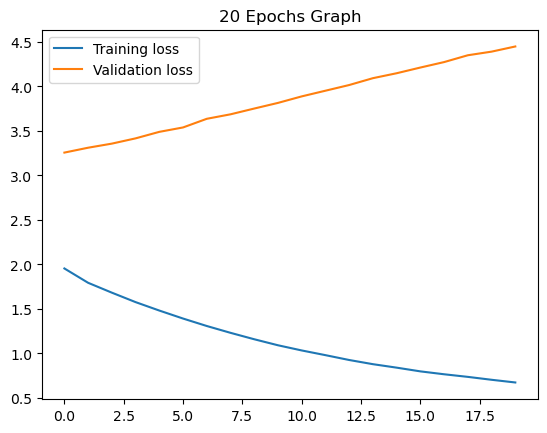

In [92]:
learning_rate=0.001

# define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(decoder.parameters(), lr=learning_rate)

# set the model to train mode
decoder.train()

# define the number of epochs
num_epochs = 20

# initialize variables to store the losses for plotting
train_losses = []
val_losses = []

# start the training loop
for epoch in range(num_epochs):
    # initialize variables to store the losses for this epoch
    epoch_train_loss = 0.0
    epoch_val_loss = 0.0
    
    # train the model on the training data
    for i, (features, captions, lengths) in enumerate(dataloader_train):
        
        features = features.to(device)
        captions = captions.to(device)
        
        # zero the gradients
        optimizer.zero_grad()

        # forward pass
        outputs = decoder(features, captions, lengths)

        # pack the targets using pack_padded_sequence
        targets = pack_padded_sequence(captions, lengths, batch_first=True).data

        # compute the loss
        loss = criterion(outputs, targets)

        # backward pass
        loss.backward()

        # update the parameters
        optimizer.step()

        # add the loss to the epoch train loss
        epoch_train_loss += loss.item()

    # validate the model on the validation data
    with torch.no_grad():
        for i, (features, captions, lengths) in enumerate(dataloader_valid):
            
            features = features.to(device)
            captions = captions.to(device)
            
            # forward pass
            outputs = decoder(features, captions, lengths)

            # pack the targets using pack_padded_sequence
            targets = pack_padded_sequence(captions, lengths, batch_first=True).data

            # compute the loss
            loss = criterion(outputs, targets)

            # add the loss to the epoch val loss
            epoch_val_loss += loss.item()

    # calculate the average losses for this epoch
    epoch_train_loss /= len(dataloader_train)
    epoch_val_loss /= len(dataloader_valid)

    # append the losses to the lists for plotting
    train_losses.append(epoch_train_loss)
    val_losses.append(epoch_val_loss)

    # print the losses for this epoch
    print('Epoch [{}/{}], Train Loss: {:.4f}, Val Loss: {:.4f}'.format(epoch+1, num_epochs, epoch_train_loss, epoch_val_loss))

    # save the checkpoint
    torch.save(decoder.state_dict(), 'decoder.pth')
# Plot losses
plt.plot(train_losses, label='Training loss')
plt.plot(val_losses, label='Validation loss')
plt.legend()
plt.title('{} Epochs Graph'.format(num_epochs))
plt.show()

## 4 Generate predictions on test data [8 marks]

Display 5 sample test images containing different objects, along with your model’s generated captions and all the reference captions for each.

> Remember that everything **displayed** in the submitted notebook and .html file will be marked, so be sure to run all relevant cells.

In [93]:
def decode_caption(caption, vocab):
    """Decode a caption given a vocabulary.

    Args:
    caption (torch.Tensor): a tensor representing a caption.
    vocab (Vocabulary): a Vocabulary object.

    Returns:
    str: the decoded caption.
    """
    decoded_words = []
    for word_id in caption:
        word = vocab.idx2word[word_id.item()]
        if word == '<end>':
            break
        else:
            decoded_words.append(word)
    return ' '.join(decoded_words)


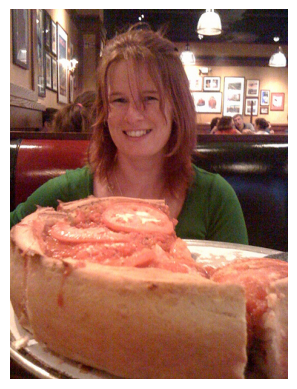


Captions referenced:

a woman smiles over a deep dish pizza 
a woman sitting in front of a deep dish pizza 
a woman sitting in a restaurant with a deep dish pizza 
a woman at a restaurant eating a deep dish pizza 
a girl sitting in a restaurant smiling in front of a bread entre 

Predicted caption:
 a woman in scarf sitting at the table eating a large pizza


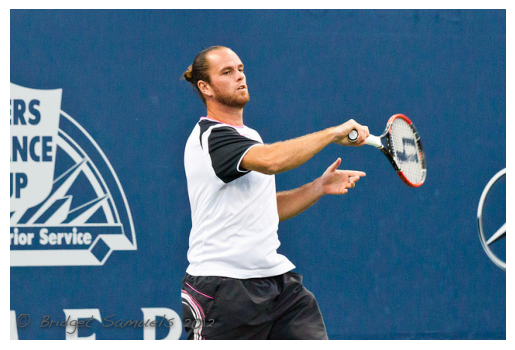


Captions referenced:

a young man holding a tennis racquet in his right hand 
a man swings a tennis racket at a game
an image of a male tennis player returning a serve
a tennis player wearing white swinging a tennis racket
professional men s tennis player about to hit the ball

Predicted caption:
 a tennis player is <unk> toward the ball that is in the background


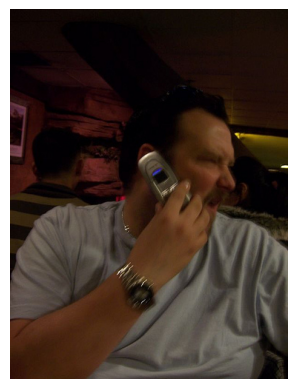


Captions referenced:

a man talking on a silver cell phone wearing a watch 
a man grimacing while talking on a cellphone 
a man on his cell phone making faces 
a man with a watch talks on his cell phone 
a man making a face and talking on a telephone 

Predicted caption:
 a man with beard in one of them holding a cell phone


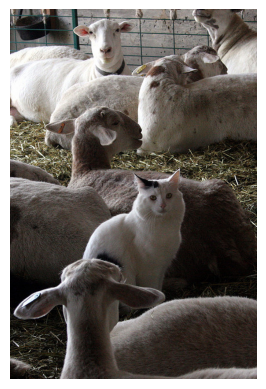


Captions referenced:

white and black cat in the middle of a group of goats 
one cat sits in a group of sheep 
a cat and some animals in the hay 
a cat is hanging out in hay with some goats 
a can sits on the ground among a bunch of sheep 

Predicted caption:
 a lamb sitting in a field with a sheep in its mouth


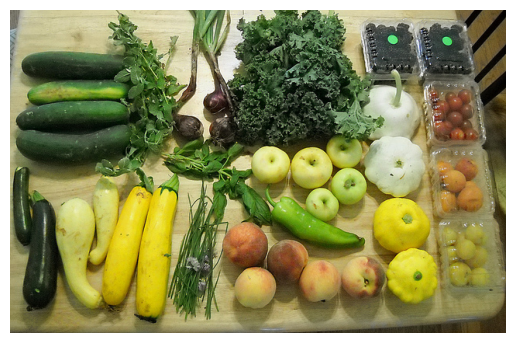


Captions referenced:

a table topped with different types of vegetables and fruits 
fresh veggies and fruit on a table include cucumbers zucchini squash and peaches among others 
a varity of vegetables and fruits sitting on a counter
a table filled with assorted fruits and veggies on display
an assortment of vegetables is lined up on a cutting board 

Predicted caption:
 several pieces of fruit in a bowl while looking at a restaurant


In [99]:
# Select 5 random test images
indices = np.random.choice(len(dataset_test), size=5, replace=False)

# Loop over images and display them along with generated and reference captions
for i in indices:
    # Get image and captions
    image, _, _ = dataset_test[i]
    image = image.to(device).unsqueeze(0)
    reference_captions = test_df[test_df['image_id'] == dataset_test.df.iloc[i]['image_id']]['clean_caption']
    # Generate caption
    generated_caption = decoder.sample(image)
    generated_caption = generated_caption.squeeze()  # Squeeze the tensor
    generated_caption = decode_caption(generated_caption, vocab)
    # Display image and captions
    img = Image.open(IMAGE_DIR+test_df['file_name'].iloc[i])
    plt.imshow(np.asarray(img))
    plt.axis('off')
    plt.show()
    print("\nCaptions referenced:\n")
    for caption in reference_captions:
        print(caption)
    print("\nPredicted caption:\n", generated_caption)


## 5 Caption evaluation using BLEU score [10 marks]

There are different methods for measuring the performance of image to text models. We will evaluate our model by measuring the text similarity between the generated caption and the reference captions, using two commonly used methods. Ther first method is known as *Bilingual Evaluation Understudy (BLEU)*.

> 5.1 Average BLEU score on all data (5 marks)

> 5.2 Examplaire high and low score BLEU score samples (5 marks, at least two)

####  5.1 Average BLEU score on all data (5 marks)


One common way of comparing a generated text to a reference text is using BLEU. This article gives a good intuition to how the BLEU score is computed: https://machinelearningmastery.com/calculate-bleu-score-for-text-python/, and you may find an implementation online to use. One option is the NLTK implementation `nltk.translate.bleu_score` here: https://www.nltk.org/api/nltk.translate.bleu_score.html


> **Tip:** BLEU scores can be weighted by ith-gram. Check that your scores make sense; and feel free to use a weighting that best matches the data. We will not be looking for specific score ranges; rather we will check that the scores are reasonable and meaningful given the captions.

Write the code to evaluate the trained model on the complete test set and calculate the BLEU score using the predictions, compared against all five references captions. 

Display a histogram of the distribution of scores over the test set.

Average of BLEU score:
 0.09034557552920613


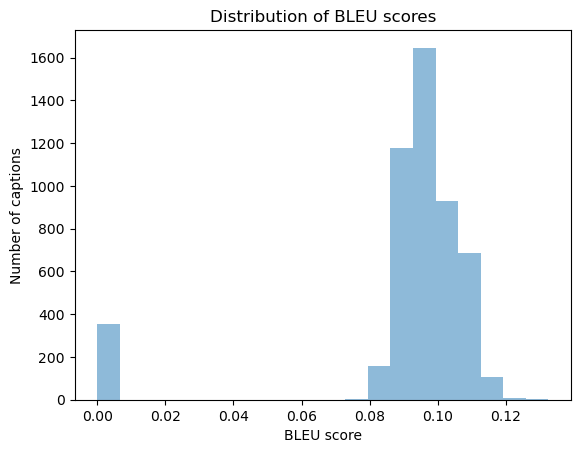

In [100]:
from nltk.translate.bleu_score import sentence_bleu, corpus_bleu, SmoothingFunction
import pandas as pd
import matplotlib.pyplot as plt

# Initialize data frame to store statistics
stats = pd.DataFrame(columns=['image_id', 'references', 'generated_caption', 'bleu_score','cos_sim'])

# Loop over images in the test set and calculate BLEU scores
for i in range(len(dataset_test)):
    # Get image and captions
    image, _, _ = dataset_test[i]
    image = image.to(device).unsqueeze(0)
    references = test_df[test_df['image_id'] == dataset_test.df.iloc[i]['image_id']]['clean_caption']
    
    # Generate caption
    generated_caption = decoder.sample(image)
    generated_caption = generated_caption.flatten()  # Flatten the tensor
    generated_caption = decode_caption(generated_caption, vocab)
    
    # Calculate BLEU score for generated caption
    highest_blue_score = 0
    used_references = ''
    for ref in references:
        used_references += ref + ' \n'
        bleu_score = corpus_bleu([ref.split()], [generated_caption.split()], smoothing_function=SmoothingFunction().method7)
        if highest_blue_score < bleu_score:
            highest_blue_score = bleu_score
            
    # Store statistics
    updated_row = pd.DataFrame({'image_id': dataset_test.df.iloc[i]['image_id'],
                            'references': used_references,
                            'generated_caption': generated_caption,
                            'bleu_score': highest_blue_score},
                           index=[0])
    stats = pd.concat([stats, updated_row], ignore_index=True)

# Calculate average BLEU score
avg_bleu_score = stats['bleu_score'].mean()
print("Average of BLEU score:\n", avg_bleu_score)

# Display histogram of BLEU scores
plt.hist(stats['bleu_score'], bins=20, alpha=0.5)
plt.title("Distribution of BLEU scores")
plt.xlabel("BLEU score")
plt.ylabel("Number of captions")
plt.show()


#### 5.2 Examplaire high and low score BLEU score samples (5 marks)

Find one sample with high BLEU score and one with a low score, and display the model's predicted sentences, the BLEU scores, and the 5 reference captions.

Maximum BLEU Score: 0.13247262942195687
Predicted caption: a man riding a motorcycle down a street
References used:
a group of motorcyclists riding across the town 
a group of people riding motorcycles down a street lined with motorcycles  
a man with a bandanna almost covering his face rides his motorcycle with other motorcyclists  
the motorcycle gang is driving threw town today 
several men riding their motorcycles on a street  



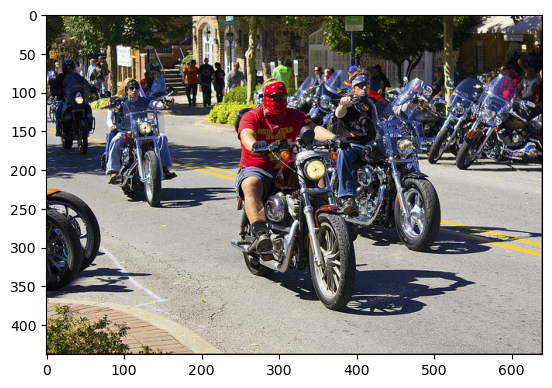

In [101]:
stats=stats.sort_values(by=['bleu_score'], ascending=False)
filename=test_df[test_df['image_id']==stats.iloc[0]['image_id']]['file_name'].unique()[0]
img = Image.open(IMAGE_DIR+filename)
plt.imshow(np.asarray(img))
print('Maximum BLEU Score:',stats.iloc[0]['bleu_score'])
print('Predicted caption:',stats.iloc[0]['generated_caption'])
print('References used:')
print(stats.iloc[0]['references'])

Minimum BLEU Score: 0
With Predicted: to <unk> airplane is on the runway with <unk>
References used:
an airplane with its landing wheels out landing  
a plane that is taking off at an airport 
a man takes a picture of an airplane taking off  
a large jet takes off from an airport runway  
the airplane is taking off on the runway at the airport  



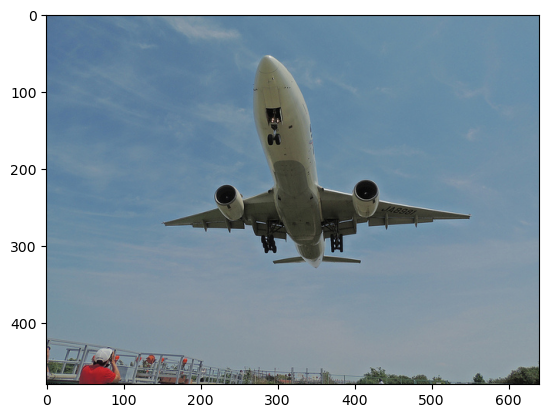

In [102]:
filename=test_df[test_df['image_id']==stats.iloc[-1]['image_id']]['file_name'].unique()[0]
img = Image.open(IMAGE_DIR+filename)
plt.imshow(np.asarray(img))
print('Minimum BLEU Score:',stats.iloc[-1]['bleu_score'])
print('With Predicted:',stats.iloc[-1]['generated_caption'])
print('References used:')
print(stats.iloc[-1]['references'])

## 6 Caption evaluation using cosine similarity [12 marks]

> 6.1 Cosine similarity (6 marks)

> 6.2 Cosine similarity examples (6 marks)

####  6.1 Cosine similarity (6 marks)

The cosine similarity measures the cosine of the angle between two vectors in n-dimensional space. The smaller the angle, the greater the similarity.

To use the cosine similarity to measure the similarity between the generated caption and the reference captions: 

* Find the embedding vector of each word in the caption 
* Compute the average vector for each caption 
* Compute the cosine similarity score between the average vector of the generated caption and average vector of each reference caption
* Compute the average of these scores 

Calculate the cosine similarity using the model's predictions over the whole test set. 

Display a histogram of the distribution of scores over the test set.

In [103]:
import spacy
from sklearn.metrics.pairwise import cosine_similarity

# load the pre-trained GloVe embeddings
nlp = spacy.load('en_core_web_md')

def tokenize_caption(caption):

    #Tokenizes a caption into individual words.
    doc = nlp(caption)
    return [token.text for token in doc if token.is_alpha]

def get_embedding(word):

    #Returns the GloVe embedding for a given word.
    return nlp.vocab[word].vector

def get_average_embedding(caption):

    #Computes the average embedding for a given caption.

    words = tokenize_caption(caption)
    embeddings = [get_embedding(word) for word in words if word in nlp.vocab]
    if len(embeddings) == 0:
        return None
    return np.mean(embeddings, axis=0).reshape(1, -1)

def cosine_sim(reference_embeddings, generated_embedding):

    #Computes the cosine similarity between the generated embedding and
    #each reference embedding.

    sim_scores = cosine_similarity(reference_embeddings, generated_embedding)
    return np.mean(np.max(sim_scores, axis=1))

def compute_similarity_scores(stats_df):
    """
    Computes the cosine similarity score between the average vector of the
    generated caption and average vector of each reference caption. Returns
    the average of these scores.
    """
    # initialize an empty list to store the similarity scores
    sim_scores = []

    # loop over each row in the DataFrame
    for index, row in stats_df.iterrows():
        # get the image ID
        image_id = row['image_id']
        # get the generated and reference captions
        generated_caption = row['generated_caption']
        references = test_df[test_df['image_id'] == image_id]['clean_caption'].values

        # compute the average embedding for the generated caption
        generated_embedding = get_average_embedding(generated_caption)

        # compute the average embedding for each reference caption
        reference_embeddings = [get_average_embedding(ref) for ref in references]

        # compute the cosine similarity scores
        scores = [cosine_sim(reference_embeddings[i], generated_embedding) for i in range(len(reference_embeddings))]

        # append the average similarity score to the list
        sim_scores.append(np.mean(scores))
    
    stats_df['cos_sim'] = sim_scores
    # compute the average similarity score across all rows
    avg_sim_score = np.mean(sim_scores)

    return avg_sim_score

print('Average of Cosine Similarity scores:\n', compute_similarity_scores(stats))


Average of Cosine Similarity scores:
 0.8128558


Average Cosine Similarity: 0.8128558


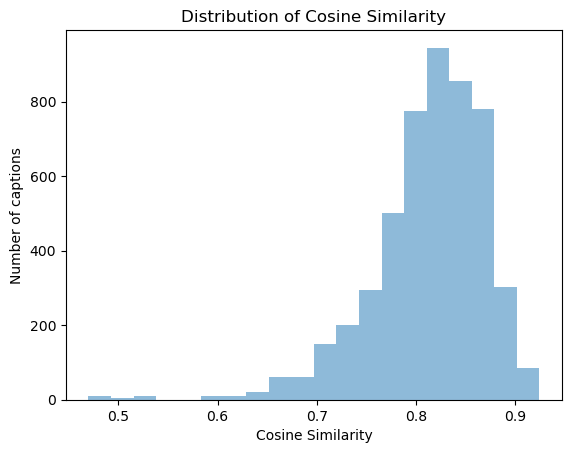

In [104]:
# TO COMPLETE
# Calculate average Cosine Similarity
avg_cos_sim = stats['cos_sim'].mean()
print("Average Cosine Similarity:", avg_cos_sim)

# Display histogram of Cosine Similarity
plt.hist(stats['cos_sim'], bins=20,alpha=0.5)
plt.title("Distribution of Cosine Similarity")
plt.xlabel("Cosine Similarity")
plt.ylabel("Number of captions")
plt.show()

#### 6.2 Cosine similarity examples (6 marks)

Find one sample with high cosine similarity score and one with a low score, and display the model's predicted sentences, the cosine similarity scores, and the 5 reference captions.

Highest Cosine Similarity: 0.8749999999999998
With prediction: a small bathroom with a toilet and a bucket in tub
With following references:
a bathroom with a tub sink and toilet in it  
a dirty old bathroom is in complete disarray 
a dirty bathroom with a sink toilet and bathtub  
a bathroom with a white tub sink and shower  
a small bathroom with a toilet and a tub in it 



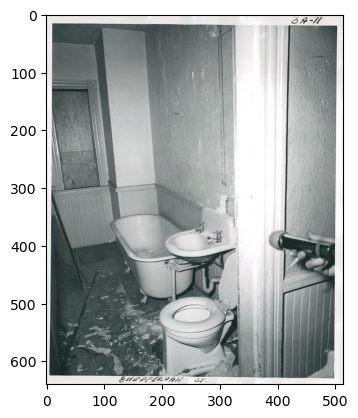

In [108]:
# TO COMPLETE
stats=stats.sort_values(by=['cos_sim'], ascending=False)
filename=test_df[test_df['image_id']==stats.iloc[0]['image_id']]['file_name'].unique()[0]
img = Image.open(IMAGE_DIR+filename)
plt.imshow(np.asarray(img))
print('Maximum Cosine Similarity:',stats.iloc[0]['cos_sim'])
print('Predicted Caption:',stats.iloc[0]['generated_caption'])
print('References used:')
print(stats.iloc[0]['references'])

Lowest Cosine Similarity: 0.0
With prediction: outside shop
With following references:
lots of balloons floating in front of tall buildings  
a lot if people walking around in the city 
people and bikes on the pavement next to buildings  
bike racers and pedestrians in sunny european square  
a celebration in a parking lot with parked bikes  



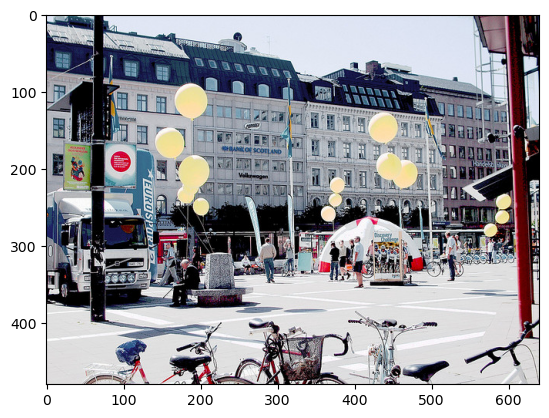

In [109]:
filename=test_df[test_df['image_id']==stats.iloc[-1]['image_id']]['file_name'].unique()[0]
img = Image.open(IMAGE_DIR+filename)
plt.imshow(np.asarray(img))
print('Minimum Cosine Similarity:',stats.iloc[-1]['cos_sim'])
print('Predicted Caption:',stats.iloc[-1]['generated_caption'])
print('References used:')
print(stats.iloc[-1]['references'])

## 7 Comparing BLEU and Cosine similarity [16 marks]

> 7.1 Test set distribution of scores (6 marks)

> 7.2 Analysis of individual examples (10 marks)

#### 7.1 Test set distribution of scores (6 marks)

Compare the model’s performance on the test set evaluated using BLEU and cosine similarity and discuss some weaknesses and strengths of each method (explain in words, in a text box below). 

Please note, to compare the average test scores, you need to rescale the Cosine similarity scores [-1 to 1] to match the range of BLEU method [0.0 - 1.0].

In [107]:
'''
we already scaled our similarity scores to 
match the bleu method (that is from 0 to 1)
in the previous question so we'll just print 
it out here
'''
print("Average Cosine Similarity:", avg_cos_sim)
print("Average BLEU score:", avg_bleu_score)

In [169]:
# TO COMPLETE

print("Average Cosine Similarity:", avg_cos_sim)
print("Average BLEU score:", avg_bleu_score)

Average Cosine Similarity: 0.79147285
Average BLEU score: 0.09618723918750972


In [ ]:
'''
The test set results indicate that the model has an average cosine similarity score of 0.791 and an 
average BLEU score of 0.096. Cosine similarity measures the similarity between two vectors in the 
embedding space, making it effective in capturing the semantic similarity and nuances in meaning between 
sentences. However, it may be inaccurate due to its insensitivity to word order and its sensitivity to 
small differences in wording. BLEU, on the other hand, compares generated captions to reference captions 
based on n-gram overlap and is useful for measuring accuracy. Nevertheless, it has limitations, such as its 
failure to consider semantic meaning and its sensitivity to the number of reference captions.

In general, cosine similarity's strength lies in its ability to capture semantic similarity and nuanced 
meanings, while BLEU's strength is its accuracy measurement and wide use in machine translation. However, 
both methods have limitations that can impact their accuracy, such as cosine similarity's inability to consider 
word order and BLEU's failure to consider semantic meaning. Thus, a comprehensive evaluation of the model's 
performance may require a combination of these methods and possibly other metrics.

'''

 #### 7.2 Analysis of individual examples (10 marks)
 
Find and display one example where both methods give similar scores and another example where they do not and discuss. Include both scores, predicted captions, and reference captions.

Cosine Score: 0.13245323570650439
BLEU Score: 0.08369060436367473
With prediction: outside the person is carrying a cell phone and one man smoking on his cell phone
With following references:
woman on the train platform reading a book in front of her luggage 
a woman standing at a train station reading a book next to her luggage  
people are standing near luggage bags on a train platform  
a lady checks her luggage at a train station  
a red head woman standing at train station with her luggage  



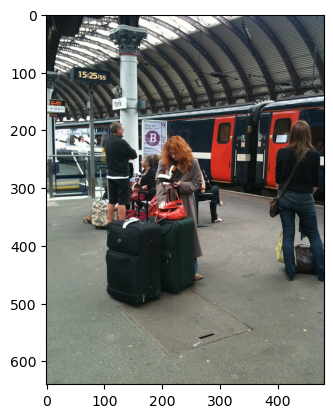

In [166]:
def score_difference(var1, var2):
    difference = abs(var1 - var2)
    return difference

# Sort stats by ascending BLEU score and descending cosine similarity score
stats = stats.sort_values(['bleu_score', 'cos_sim'], ascending=[True, False])

# Loop through the sorted stats and find the first image with a small difference between BLEU and cosine similarity scores
for index, row in stats.iterrows():
    if float(row['bleu_score']) * float(row['cos_sim']) != 0 and score_difference(float(row['bleu_score']), float(row['cos_sim'])) <= 0.1:
        filename = test_df[test_df['image_id'] == row['image_id']]['file_name'].unique()[0]
        img = Image.open(IMAGE_DIR + filename)
        plt.imshow(np.asarray(img))
        print('Cosine Score:', row['cos_sim'])
        print('BLEU Score:', row['bleu_score'])
        print('With prediction:', row['generated_caption'])
        print('With following references:')
        print(row['references'])
        break


In [ ]:
'''
The generated caption has a cosine similarity score of 0.132 and a BLEU score of 0.083. This implies 
that the generated caption is dissimilar to the reference captions in terms of word choice and semantic 
meaning, and there is minimal overlap with the reference captions concerning n-grams. The reason behind 
this is that the generated caption is vague and does not accurately depict the objects and actions in the image.

In general, the cosine similarity metric is more adept at capturing the semantic meaning and similarity of 
the generated caption to the reference captions, whereas the BLEU score excels at measuring the n-gram overlap 
between the generated and reference captions. Nevertheless, both metrics have their limitations, and they 
should be complemented with other evaluation techniques for a more comprehensive and precise evaluation of 
the quality of the generated captions.
'''

Cosine Score: 0.8432740427115678
BLEU Score: 0.08752270460049631
With prediction: a man standing in front of a couch holding a nintendo wii controller
With following references:
a man standing in front of a tv holding a wii controller  
a young man playing wii tennis on a video game console  
a man standing in front of his tv  
a man playing video games inside of his home  
he is playing a videogame on the small television  



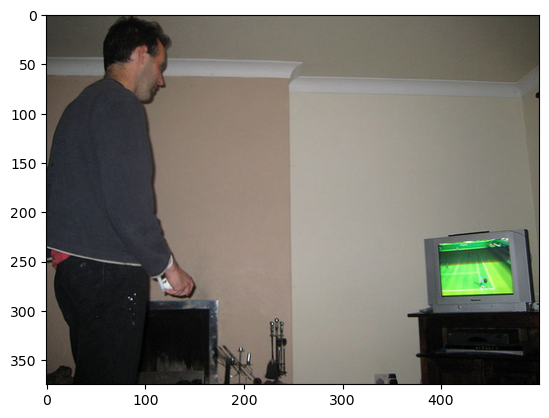

In [156]:
# Sort the stats DataFrame based on BLEU score and cosine similarity
stats = stats.sort_values(['bleu_score', 'cos_sim'], ascending=[True, False])

# Loop through the rows of the DataFrame
for index, row in stats.iterrows():
    # Check if the BLEU score and cosine similarity are both non-zero and the score difference is greater than or equal to 0.5
    if row['bleu_score'] != 0 and row['cos_sim'] != 0 and score_difference(row['bleu_score'], row['cos_sim']) >= 0.5:
        # Get the filename of the image
        filename = test_df.loc[test_df['image_id'] == row['image_id'], 'file_name'].iloc[0]
        # Open the image and display it
        img = Image.open(IMAGE_DIR + filename)
        plt.imshow(np.asarray(img))
        # Print the scores, generated caption, and reference captions
        print('Cosine Score:', row['cos_sim'])
        print('BLEU Score:', row['bleu_score'])
        print('Generated Caption:', row['generated_caption'])
        print('Reference Captions:')
        for ref in row['references']:
            print(ref)
        break


In [ ]:
'''
The cosine similarity score is remarkably high, indicating that the generated caption is significantly 
similar to the reference captions. However, the BLEU score is relatively low, indicating some differences 
in n-gram overlap between the generated and reference captions.

One benefit of the cosine similarity method is its ability to consider the semantic similarity between 
the generated and reference captions, which is particularly valuable when different words are used to 
describe the same concept.

One possible limitation of the cosine similarity method is its failure to consider grammatical disparities
between the generated and reference captions. This can be observed in the contrast between the generated 
caption ("a man standing in front of a couch holding a Nintendo Wii controller") and the reference 
captions ("a man standing in front of a TV holding a Wii controller" and "a young man playing Wii tennis 
on a video game console"). Although the captions convey similar meanings, the generated caption employs 
different grammar and syntax to convey the same message. The BLEU score considers these grammatical 
differences and penalizes the generated caption for not matching the reference captions precisely.
'''
